### Step 1: Import Python Libraries

The first step involved in ML using python is understanding and playing around with our data using libraries.

Import all libraries which are required for our analysis, such as Data Loading, Statistical analysis, Visualizations, Data Transformations, Merge and Joins, etc.

#### Pandas and Numpy have been used for Data Manipulation and numerical Calculations

#### Matplotlib and Seaborn have been used for Data visualizations

## Pre EDA of the dataset

### Abstract
This report analyzes a dataset containing information about different campus buildings, including their built year, category, gross floor area, room area, and capacity.

### Introduction
Understanding the trends and patterns in campus building data is crucial for effective resource allocation and planning. This analysis aims to uncover insights that can contribute to better decision-making in managing campus facilities.

### Related Work
Previous studies on campus infrastructure management have highlighted the importance of optimizing space utilization, improving energy efficiency, and enhancing overall user experience. By building upon this existing research, we can further refine strategies for sustainable and efficient campus development.

### Data Analysis 1: General Trend and Pattern
The general trend in the dataset reveals a mix of building categories, with a significant portion falling under the "mixed use" category. The built years span from the late 19th century to recent years, indicating a diverse age range of campus buildings. The gross floor area and room area vary widely across buildings, reflecting different sizes and purposes.

### Data Analysis 2: Underlying Structure and Anomalies
Upon deeper analysis, anomalies and unexpected patterns emerge. For instance, some buildings have zero capacity or room area, which could indicate data errors or specific building types not accounted for in typical capacity metrics. Additionally, the "leased" category stands out as a unique classification, suggesting potential opportunities for further investigation into campus leasing practices.

### Discussion/Comment
Based on the observations, it's essential to ensure data integrity by addressing anomalies and inconsistencies. Furthermore, exploring the dynamics of leased spaces can provide insights into collaborative arrangements that benefit the campus community. Implementing data-driven strategies for space optimization and sustainability can significantly contribute to the overall campus environment.

### Conclusions
In conclusion, this analysis sheds light on the diverse landscape of campus buildings and highlights areas for improvement in data quality and utilization. By leveraging these insights, universities can enhance their infrastructure management practices and create more efficient and user-centric campus environments.



### Step 1: Import Python Libraries

The first step involved in ML using python is understanding and playing around with our data using libraries.

Import all libraries which are required for our analysis, such as Data Loading, Statistical analysis, Visualizations, Data Transformations, Merge and Joins, etc.

#### Pandas and Numpy have been used for Data Manipulation and numerical Calculations

#### Matplotlib and Seaborn have been used for Data visualizations

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#to ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer


### Step 2: Reading Dataset


The Pandas library offers a wide range of possibilities for loading data into the pandas DataFrame from files like JSON, .csv, .xlsx, .sql, .pickle, .html, .txt, images etc.

Most of the data are available in a tabular format of CSV files. It is trendy and easy to access. Using the `read_csv()` function, data can be converted to a pandas DataFrame.

In [ ]:
df = pd.read_csv("../Final_dataset/building_consumption.csv")

df

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.01100
1,1,1,2019-03-29 01:30:00,0.02100
2,1,1,2019-03-29 01:45:00,0.03800
3,1,1,2019-03-29 02:00:00,0.87100
4,1,1,2019-03-29 02:15:00,0.87300
...,...,...,...,...
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875


In [ ]:
data = df.iloc[:100000]
data

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.011
1,1,1,2019-03-29 01:30:00,0.021
2,1,1,2019-03-29 01:45:00,0.038
3,1,1,2019-03-29 02:00:00,0.871
4,1,1,2019-03-29 02:15:00,0.873
...,...,...,...,...
99995,1,3,2020-01-05 22:30:00,1.612
99996,1,3,2020-01-05 22:45:00,1.614
99997,1,3,2020-01-05 23:00:00,1.607
99998,1,3,2020-01-05 23:15:00,1.612


### Analyzing the Data
Before we make any inferences, we listen to our data by examining all variables in the data.

The main goal of data understanding is to gain general insights about the data, which covers the number of rows and columns, values in the data, datatypes, and Missing values in the dataset.

`shape – shape` will display the number of observations(rows) and features(columns) in the dataset

There are 8095524 observations and 4 variables in our dataset

`head()` will display the top 5 observations of the dataset



In [ ]:
data.head()


,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.011
1,1,1,2019-03-29 01:30:00,0.021
2,1,1,2019-03-29 01:45:00,0.038
3,1,1,2019-03-29 02:00:00,0.871
4,1,1,2019-03-29 02:15:00,0.873


`tail()` will display the last 5 observations of the dataset



In [ ]:
data.tail()


,campus_id,meter_id,timestamp,consumption
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875
8095523,1,64,2022-04-30 23:45:00,0.87500


`info()` helps to understand the data type and information about data, including the number of records in each column, data having null or not null, Data type, the memory usage of the dataset

In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8095524 entries, 0 to 8095523
Data columns (total 4 columns):
 #   Column       Dtype  
---  ------       -----  
 0   campus_id    int64  
 1   meter_id     int64  
 2   timestamp    object 
 3   consumption  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 247.1+ MB


### Check for Duplication
`nunique()` based on several unique values in each column and the data description, we can identify the continuous and categorical columns in the data. Duplicated data can be handled or removed based on further analysis

In [ ]:
data.nunique()


campus_id           3
meter_id           64
timestamp      152206
consumption    664607
dtype: int64

### Missing Values Calculation
`isnull()` is widely been in all pre-processing steps to identify null values in the data

In our example, `data.isnull().sum()` is used to get the number of missing records in each column

In [ ]:
data.isnull().sum()


campus_id      0
meter_id       0
timestamp      0
consumption    0
dtype: int64

The below code helps to calculate the percentage of missing values in each column

In [ ]:
(data.isnull().sum()/(len(data)))*100


campus_id      0.0
meter_id       0.0
timestamp      0.0
consumption    0.0
dtype: float64

### Data Reduction
Some columns or variables can be dropped if they do not add value to our analysis.

In our dataset, the column campus_id have only ID values, assuming they don’t have any predictive power to predict the dependent variable

In [ ]:
# Remove campus_id column from data
data = data.drop(['campus_id'], axis = 1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8095524 entries, 0 to 8095523
Data columns (total 3 columns):
 #   Column       Dtype  
---  ------       -----  
 0   meter_id     int64  
 1   timestamp    object 
 2   consumption  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 185.3+ MB


### Statistics Summary
The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In python, this can be achieved using describe()

describe() function gives all statistics summary of data

describe()– Provide a statistics summary of data belonging to numerical datatype such as int, float

In [ ]:
data.describe().T


,count,mean,std,min,25%,50%,75%,max
meter_id,8095524.0,33.737509,17.652617,1.000,19.00000,33.0,49.000,64.000
consumption,8095524.0,13.080481,15.050121,-22.798,3.01465,8.5,17.375,116.875


describe(include=’all’) provides a statistics summary of all data, include object, category etc

In [ ]:
data.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
meter_id,8095524.0,NaN,NaN,NaN,33.737509,17.652617,1.0,19.0,33.0,49.0,64.0
timestamp,8095524,152206,2020-02-20 02:00:00,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN
consumption,8095524.0,NaN,NaN,NaN,13.080481,15.050121,-22.798,3.01465,8.5,17.375,116.875


### EDA Bivariate Analysis
Now, let’s move ahead with bivariate analysis. Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.

For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.

A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

In our example, a pair plot has been used to show the relationship between two Categorical variables.

<Figure size 1300x1700 with 0 Axes>

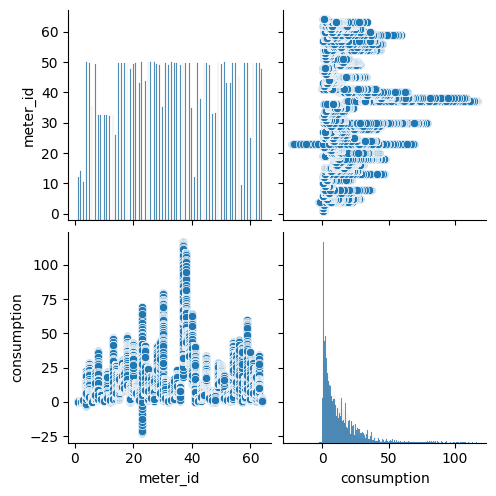

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=data.drop(['timestamp'],axis=1))
plt.show()

### EDA Multivariate Analysis
As the name suggests, Multivariate analysis looks at more than two variables. Multivariate analysis is one of the most useful methods to determine relationships and analyze patterns for any dataset.

##### A heat map is widely been used for Multivariate Analysis

Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.


In our example heat map shows the correlation between the variables.

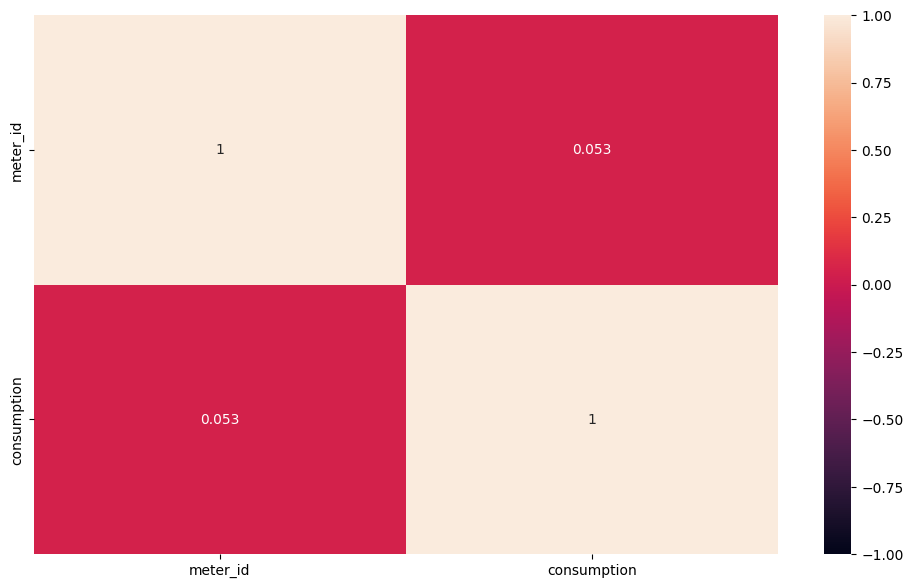

In [ ]:
plt.figure(figsize=(12, 7))
sns.heatmap(data.drop(['timestamp'],axis=1).corr(), annot = True, vmin = -1, vmax = 1)
plt.show()

### Data Types and Missing Values:

Check the data types of each column (meter_id, timestamp, consumption).
Check for missing values in each column and handle them if necessary.

In [ ]:
# Data Types and Missing Values
print("\nData Types:")
print(data.dtypes)

print("\nMissing Values:")
print(data.isnull().sum())


Data Types:
meter_id         int64
timestamp       object
consumption    float64
dtype: object

Missing Values:
meter_id       0
timestamp      0
consumption    0
dtype: int64


### Time Range:

Determine the time range of the dataset (from the earliest to the latest timestamp).

In [ ]:
# Time Range
print("\nTime Range:")
print("Earliest Timestamp:", data['timestamp'].min())
print("Latest Timestamp:", data['timestamp'].max())


Time Range:
Earliest Timestamp: 2018-01-01 00:15:00
Latest Timestamp: 2022-04-30 23:45:00


### Distribution of Consumption:

Plot a histogram or density plot to visualize the distribution of consumption.
Calculate summary statistics such as mean, median, standard deviation, min, max, etc., for consumption.

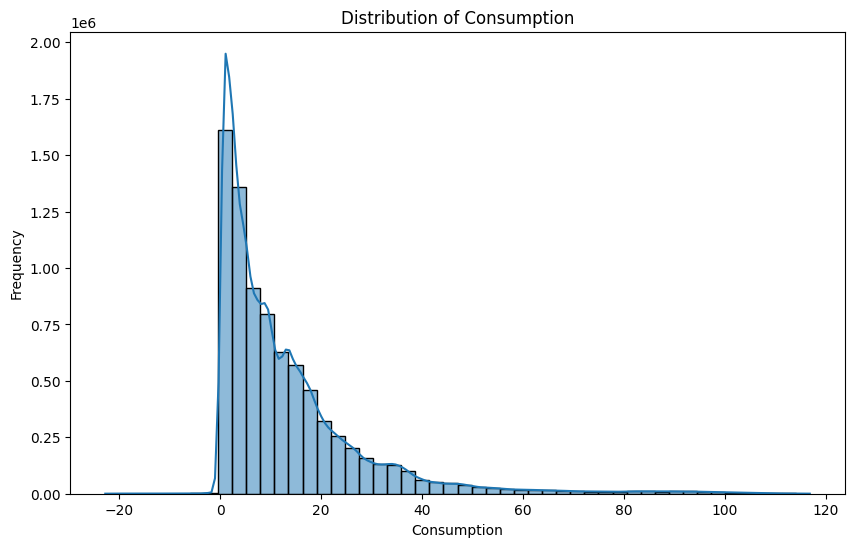

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(data['consumption'], bins=50, kde=True)
plt.title('Distribution of Consumption')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

In [ ]:
print("\nSummary Statistics for Consumption:")
print(data['consumption'].describe())


Summary Statistics for Consumption:


count    8.095524e+06
mean     1.308048e+01
std      1.505012e+01
min     -2.279800e+01
25%      3.014650e+00
50%      8.500000e+00
75%      1.737500e+01
max      1.168750e+02
Name: consumption, dtype: float64


### Consumption Trends Over Time:

Plot a time series graph of consumption over the entire time range.
Analyze any noticeable trends, seasonality, or patterns in the consumption data.

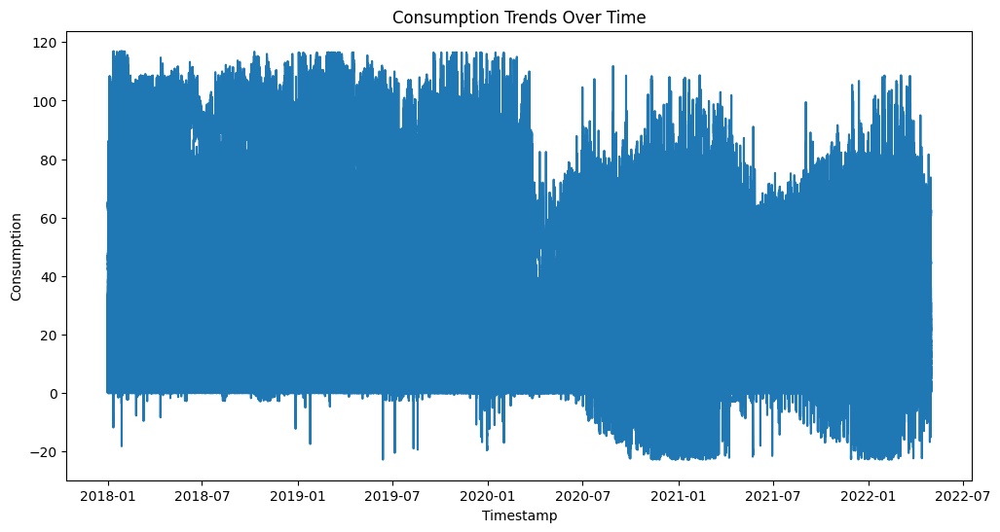

In [ ]:
# Consumption Trends Over Time
data['timestamp'] = pd.to_datetime(data['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(data['timestamp'], data['consumption'])
plt.title('Consumption Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.show()

### Meter ID Analysis:

Check the unique values of meter_id and analyze if there are any patterns or differences in consumption among different meters.

In [ ]:
# Meter ID Analysis
print("\nUnique Meter IDs:")
print(data['meter_id'].unique())


Unique Meter IDs:


[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64]


### Step 1: Import Python Libraries

The first step involved in ML using python is understanding and playing around with our data using libraries.

Import all libraries which are required for our analysis, such as Data Loading, Statistical analysis, Visualizations, Data Transformations, Merge and Joins, etc.

#### Pandas and Numpy have been used for Data Manipulation and numerical Calculations

#### Matplotlib and Seaborn have been used for Data visualizations

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#to ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer


### Step 2: Reading Dataset


The Pandas library offers a wide range of possibilities for loading data into the pandas DataFrame from files like JSON, .csv, .xlsx, .sql, .pickle, .html, .txt, images etc.

Most of the data are available in a tabular format of CSV files. It is trendy and easy to access. Using the `read_csv()` function, data can be converted to a pandas DataFrame.

In [ ]:
df = pd.read_csv("../Final_dataset/building_consumption.csv")

df

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.01100
1,1,1,2019-03-29 01:30:00,0.02100
2,1,1,2019-03-29 01:45:00,0.03800
3,1,1,2019-03-29 02:00:00,0.87100
4,1,1,2019-03-29 02:15:00,0.87300
...,...,...,...,...
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875


In [ ]:
data = df.iloc[:100000]
data

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.011
1,1,1,2019-03-29 01:30:00,0.021
2,1,1,2019-03-29 01:45:00,0.038
3,1,1,2019-03-29 02:00:00,0.871
4,1,1,2019-03-29 02:15:00,0.873
...,...,...,...,...
99995,1,3,2020-01-05 22:30:00,1.612
99996,1,3,2020-01-05 22:45:00,1.614
99997,1,3,2020-01-05 23:00:00,1.607
99998,1,3,2020-01-05 23:15:00,1.612


### Analyzing the Data
Before we make any inferences, we listen to our data by examining all variables in the data.

The main goal of data understanding is to gain general insights about the data, which covers the number of rows and columns, values in the data, datatypes, and Missing values in the dataset.

`shape – shape` will display the number of observations(rows) and features(columns) in the dataset

There are 8095524 observations and 4 variables in our dataset

`head()` will display the top 5 observations of the dataset



In [ ]:
data.head()


,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.011
1,1,1,2019-03-29 01:30:00,0.021
2,1,1,2019-03-29 01:45:00,0.038
3,1,1,2019-03-29 02:00:00,0.871
4,1,1,2019-03-29 02:15:00,0.873


`tail()` will display the last 5 observations of the dataset



In [ ]:
data.tail()


,campus_id,meter_id,timestamp,consumption
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875
8095523,1,64,2022-04-30 23:45:00,0.87500


`info()` helps to understand the data type and information about data, including the number of records in each column, data having null or not null, Data type, the memory usage of the dataset

In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8095524 entries, 0 to 8095523
Data columns (total 4 columns):
 #   Column       Dtype  
---  ------       -----  
 0   campus_id    int64  
 1   meter_id     int64  
 2   timestamp    object 
 3   consumption  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 247.1+ MB


### Check for Duplication
`nunique()` based on several unique values in each column and the data description, we can identify the continuous and categorical columns in the data. Duplicated data can be handled or removed based on further analysis

In [ ]:
data.nunique()


campus_id           3
meter_id           64
timestamp      152206
consumption    664607
dtype: int64

### Missing Values Calculation
`isnull()` is widely been in all pre-processing steps to identify null values in the data

In our example, `data.isnull().sum()` is used to get the number of missing records in each column

In [ ]:
data.isnull().sum()


campus_id      0
meter_id       0
timestamp      0
consumption    0
dtype: int64

The below code helps to calculate the percentage of missing values in each column

In [ ]:
(data.isnull().sum()/(len(data)))*100


campus_id      0.0
meter_id       0.0
timestamp      0.0
consumption    0.0
dtype: float64

### Data Reduction
Some columns or variables can be dropped if they do not add value to our analysis.

In our dataset, the column campus_id have only ID values, assuming they don’t have any predictive power to predict the dependent variable

In [ ]:
# Remove campus_id column from data
data = data.drop(['campus_id'], axis = 1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8095524 entries, 0 to 8095523
Data columns (total 3 columns):
 #   Column       Dtype  
---  ------       -----  
 0   meter_id     int64  
 1   timestamp    object 
 2   consumption  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 185.3+ MB


### Statistics Summary
The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In python, this can be achieved using describe()

describe() function gives all statistics summary of data

describe()– Provide a statistics summary of data belonging to numerical datatype such as int, float

In [ ]:
data.describe().T


,count,mean,std,min,25%,50%,75%,max
meter_id,8095524.0,33.737509,17.652617,1.000,19.00000,33.0,49.000,64.000
consumption,8095524.0,13.080481,15.050121,-22.798,3.01465,8.5,17.375,116.875


describe(include=’all’) provides a statistics summary of all data, include object, category etc

In [ ]:
data.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
meter_id,8095524.0,NaN,NaN,NaN,33.737509,17.652617,1.0,19.0,33.0,49.0,64.0
timestamp,8095524,152206,2020-02-20 02:00:00,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN
consumption,8095524.0,NaN,NaN,NaN,13.080481,15.050121,-22.798,3.01465,8.5,17.375,116.875


### EDA Bivariate Analysis
Now, let’s move ahead with bivariate analysis. Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.

For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.

A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

In our example, a pair plot has been used to show the relationship between two Categorical variables.

<Figure size 1300x1700 with 0 Axes>

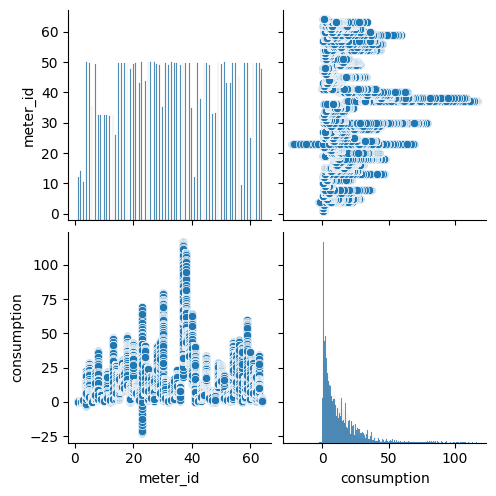

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=data.drop(['timestamp'],axis=1))
plt.show()

### EDA Multivariate Analysis
As the name suggests, Multivariate analysis looks at more than two variables. Multivariate analysis is one of the most useful methods to determine relationships and analyze patterns for any dataset.

##### A heat map is widely been used for Multivariate Analysis

Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.


In our example heat map shows the correlation between the variables.

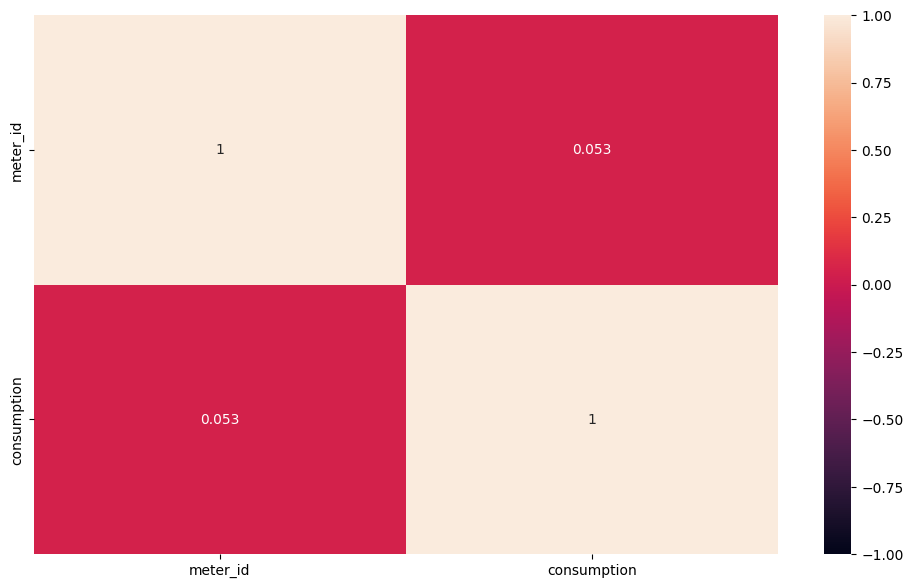

In [ ]:
plt.figure(figsize=(12, 7))
sns.heatmap(data.drop(['timestamp'],axis=1).corr(), annot = True, vmin = -1, vmax = 1)
plt.show()

### Data Types and Missing Values:

Check the data types of each column (meter_id, timestamp, consumption).
Check for missing values in each column and handle them if necessary.

In [ ]:
# Data Types and Missing Values
print("\nData Types:")
print(data.dtypes)

print("\nMissing Values:")
print(data.isnull().sum())


Data Types:
meter_id         int64
timestamp       object
consumption    float64
dtype: object

Missing Values:
meter_id       0
timestamp      0
consumption    0
dtype: int64


### Time Range:

Determine the time range of the dataset (from the earliest to the latest timestamp).

In [ ]:
# Time Range
print("\nTime Range:")
print("Earliest Timestamp:", data['timestamp'].min())
print("Latest Timestamp:", data['timestamp'].max())


Time Range:
Earliest Timestamp: 2018-01-01 00:15:00
Latest Timestamp: 2022-04-30 23:45:00


### Distribution of Consumption:

Plot a histogram or density plot to visualize the distribution of consumption.
Calculate summary statistics such as mean, median, standard deviation, min, max, etc., for consumption.

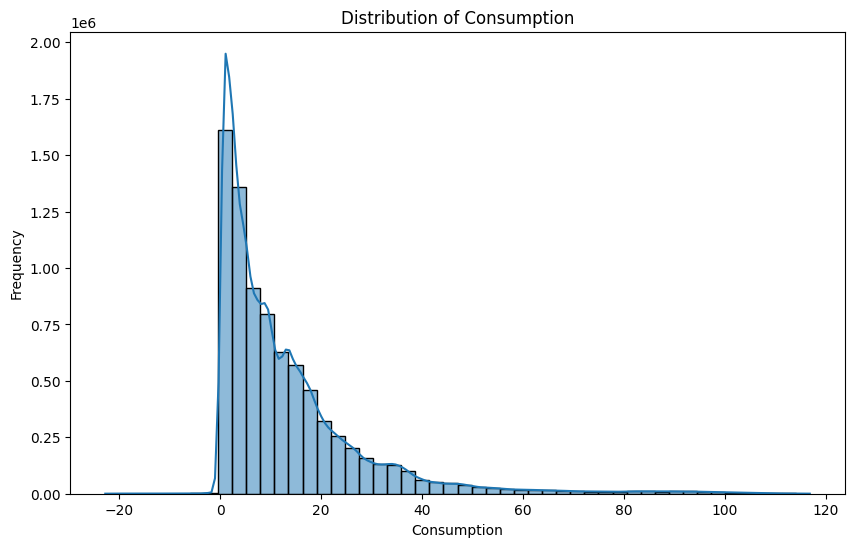

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(data['consumption'], bins=50, kde=True)
plt.title('Distribution of Consumption')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

In [ ]:
print("\nSummary Statistics for Consumption:")
print(data['consumption'].describe())


Summary Statistics for Consumption:


count    8.095524e+06
mean     1.308048e+01
std      1.505012e+01
min     -2.279800e+01
25%      3.014650e+00
50%      8.500000e+00
75%      1.737500e+01
max      1.168750e+02
Name: consumption, dtype: float64


### Consumption Trends Over Time:

Plot a time series graph of consumption over the entire time range.
Analyze any noticeable trends, seasonality, or patterns in the consumption data.

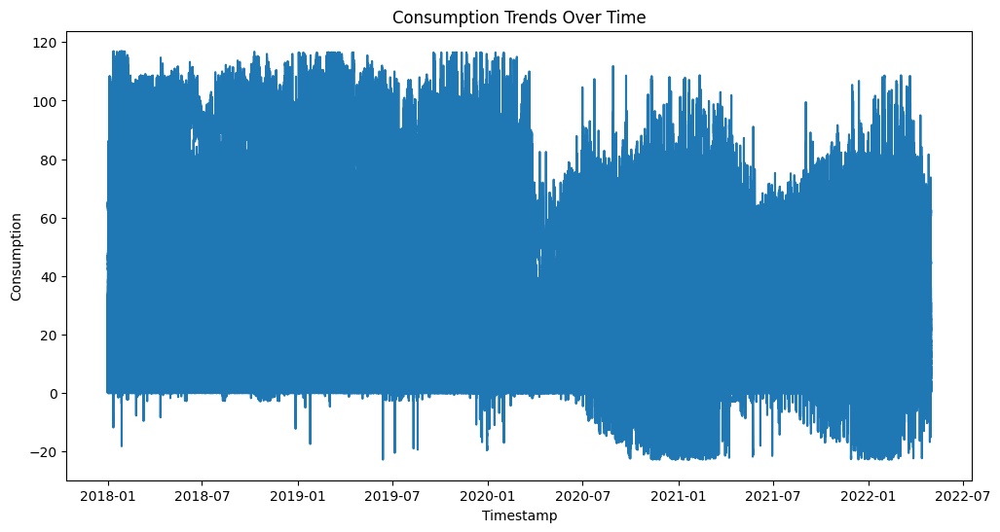

In [ ]:
# Consumption Trends Over Time
data['timestamp'] = pd.to_datetime(data['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(data['timestamp'], data['consumption'])
plt.title('Consumption Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.show()

### Meter ID Analysis:

Check the unique values of meter_id and analyze if there are any patterns or differences in consumption among different meters.

In [ ]:
# Meter ID Analysis
print("\nUnique Meter IDs:")
print(data['meter_id'].unique())


Unique Meter IDs:


[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64]


### Temporal Analysis:

Analyze consumption patterns based on different time intervals (e.g., hourly, daily, weekly).
Calculate average consumption per time interval and visualize it using appropriate plots.

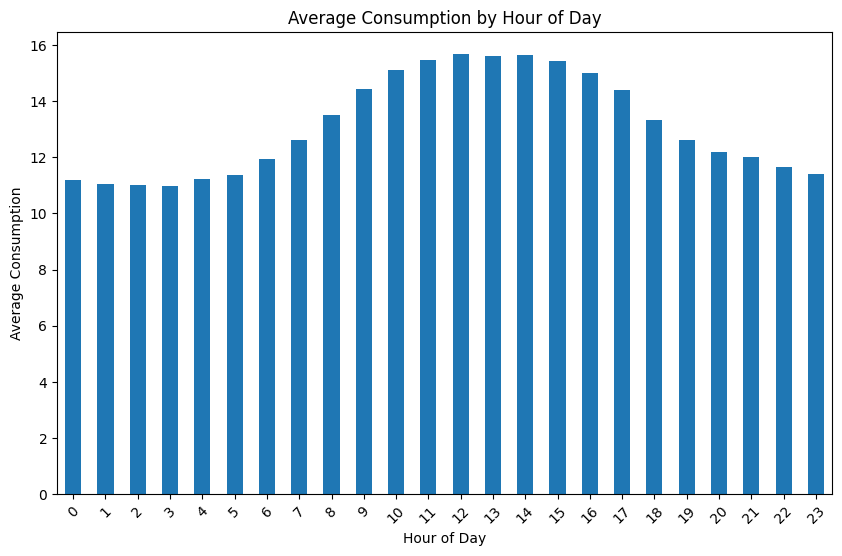

In [ ]:
#  Temporal Analysis
data['hour'] = data['timestamp'].dt.hour
hourly_consumption = data.groupby('hour')['consumption'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Consumption by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Consumption')
plt.xticks(rotation=45)
plt.show()

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

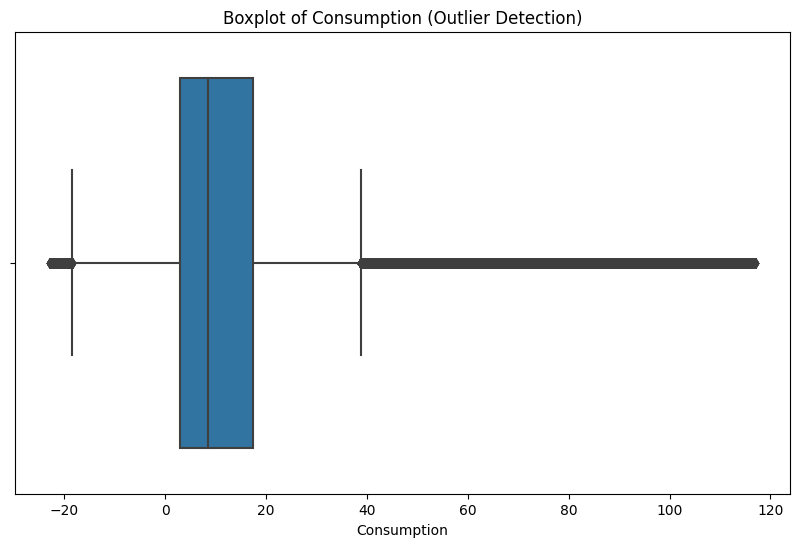

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['consumption'])
plt.title('Boxplot of Consumption (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

### Correlation Analysis:

Check for correlations between meter_id, timestamp, and consumption.
Visualize correlations using a heatmap or correlation matrix.

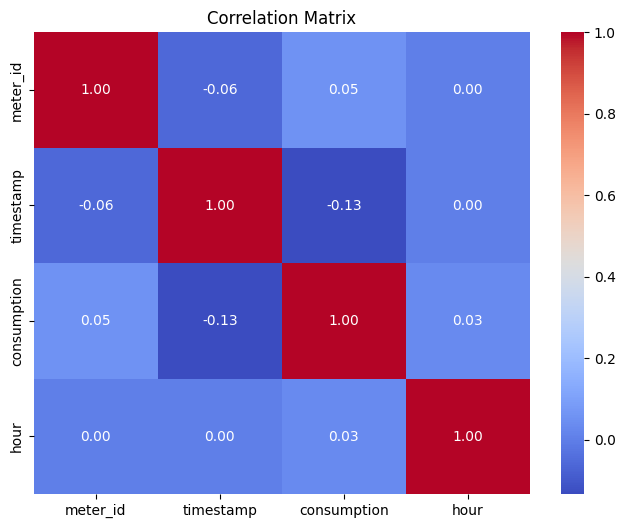

In [ ]:
# Correlation Analysis
correlation_matrix = data.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### Seasonal Decomposition:

Perform seasonal decomposition (e.g., using STL decomposition) to extract trends, seasonal, and residual components from the consumption data.

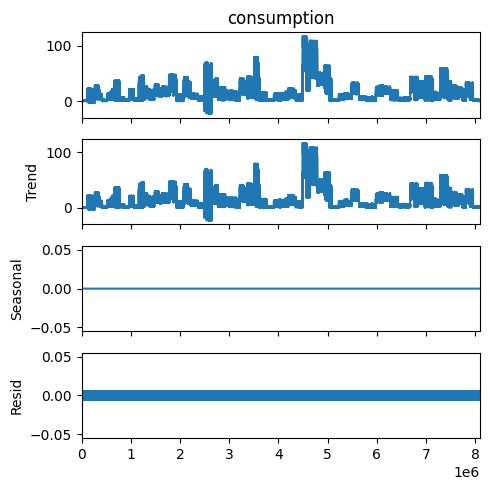

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=data['consumption'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()


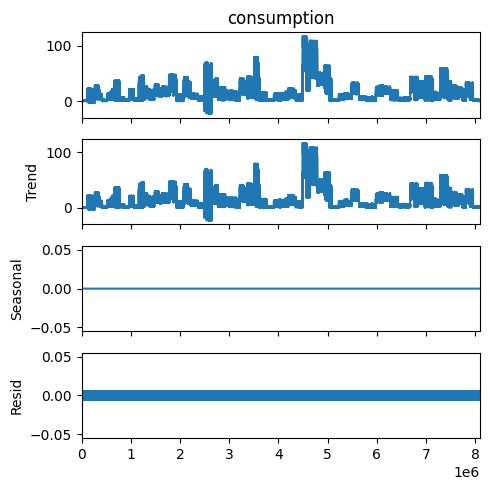

In [ ]:
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(data['consumption'], model='additive', period=1)
result.plot()
pyplot.show()

### Data Quality Check:

Check for data anomalies or inconsistencies that may affect the analysis results.
Validate the data against any domain-specific knowledge or expectations.

In [ ]:
# Check for duplicate rows
duplicate_rows = data[data.duplicated()]
if duplicate_rows.empty:
    print("No duplicate rows found.")
else:
    print("Duplicate rows found.")
    print(duplicate_rows)

# Check for negative consumption values
negative_consumption = data[data['consumption'] < 0]
if negative_consumption.empty:
    print("No negative consumption values found.")
else:
    print("Negative consumption values found.")
    print(negative_consumption)

# Check for inconsistent timestamp formats or missing timestamps
sorted_data = data.sort_values(by='timestamp')
time_diff = sorted_data['timestamp'].diff().dropna()
if (time_diff.dt.total_seconds() > 900).any():
    print("Timestamps are not consistently spaced (greater than 15 minutes apart).")
else:
    print("Timestamps are consistently spaced (15 minutes apart).")


No duplicate rows found.
Negative consumption values found.
         meter_id           timestamp  consumption  hour
123255          4 2018-01-11 10:45:01       -0.673    10
124198          4 2018-01-21 07:15:00       -1.580     7
124533          4 2018-01-25 22:30:00       -1.178    22
124625          4 2018-01-26 21:15:04       -0.740    21
124883          4 2018-01-29 15:15:00       -0.783    15
...           ...                 ...          ...   ...
2641159        23 2022-04-30 10:45:00       -9.176    10
2641160        23 2022-04-30 11:00:00       -5.553    11
2641166        23 2022-04-30 12:30:00      -15.077    12
2641167        23 2022-04-30 12:45:00       -3.049    12
2641169        23 2022-04-30 13:15:00      -12.814    13

[8493 rows x 4 columns]
Timestamps are not consistently spaced (greater than 15 minutes apart).


### Feature Engineering:

Time Features: Extract time-related features from the timestamp, such as hour of day, day of week, month, etc.
Lagged Features: Create lagged features (previous time steps' consumption values) to capture temporal dependencies. 

In [ ]:
# Assuming 'data' is your dataframe with the timestamp column converted to datetime
data['timestamp'] = pd.to_datetime(data['timestamp'])

In [ ]:
# Time Features
data['hour'] = data['timestamp'].dt.hour
data['day_of_week'] = data['timestamp'].dt.dayofweek
data['month'] = data['timestamp'].dt.month
data['year'] = data['timestamp'].dt.year

# Lagged Features (e.g., lagged consumption values)
num_lags = 3  # You can adjust the number of lagged features
for lag in range(1, num_lags + 1):
    data[f'lag_{lag}'] = data['consumption'].shift(lag)

### Feature Taregt

In [ ]:
# Drop rows with NaN values due to lagging
data.dropna(inplace=True)

# Split data into features (X) and target variable (y)
X = data.drop(['timestamp', 'consumption'], axis=1)
y = data['consumption']

print(X, y)

         meter_id  hour  day_of_week  month  year    lag_1    lag_2    lag_3
9               1     3            4      3  2019  0.87200  0.87200  0.87500
10              1     3            4      3  2019  0.87200  0.87200  0.87200
11              1     4            4      3  2019  0.87200  0.87200  0.87200
12              1     4            4      3  2019  0.86600  0.87200  0.87200
13              1     4            4      3  2019  0.87200  0.86600  0.87200
...           ...   ...          ...    ...   ...      ...      ...      ...
8095519        64    22            5      4  2022  0.90625  1.35938  1.04688
8095520        64    23            5      4  2022  0.84375  0.90625  1.35938
8095521        64    23            5      4  2022  1.15625  0.84375  0.90625
8095522        64    23            5      4  2022  1.32813  1.15625  0.84375
8095523        64    23            5      4  2022  1.21875  1.32813  1.15625

[8095515 rows x 8 columns] 9          0.87200
10         0.87200
11        

### Impute Missing Values

In [ ]:
# Impute missing values in X
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed
X_imputed = imputer.fit_transform(X)

### Train Test Split

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Model Creation

Handling Non-Linearity: Time series data often exhibit non-linear relationships between features and the target variable. Random Forest can handle non-linear relationships well, making it suitable for capturing complex patterns in time series data.

Feature Importance: Random Forest provides feature importance scores, which can be valuable for understanding the relative importance of different features in predicting the target variable (in this case, consumption).

Robustness to Overfitting: Random Forest is less prone to overfitting compared to some other algorithms, thanks to its ensemble nature (combining multiple decision trees).

Ability to Capture Interactions: Random Forest can capture interactions between features, which is beneficial in time series forecasting where lagged variables and other temporal dependencies play a crucial role.

Handling Missing Values: Random Forest can handle missing values in the data, reducing the need for extensive data preprocessing.

In [ ]:
# Model creation (Random Forest Regressor as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)  # Adjust the number of estimators as needed
model.fit(X_train.iloc[:10000], y_train.iloc[:10000])  # remove iloc for all thr data

RandomForestRegressor(random_state=42)

### Model Evaluation

In [ ]:
# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 3.256785857090025


### Single Feature Graph

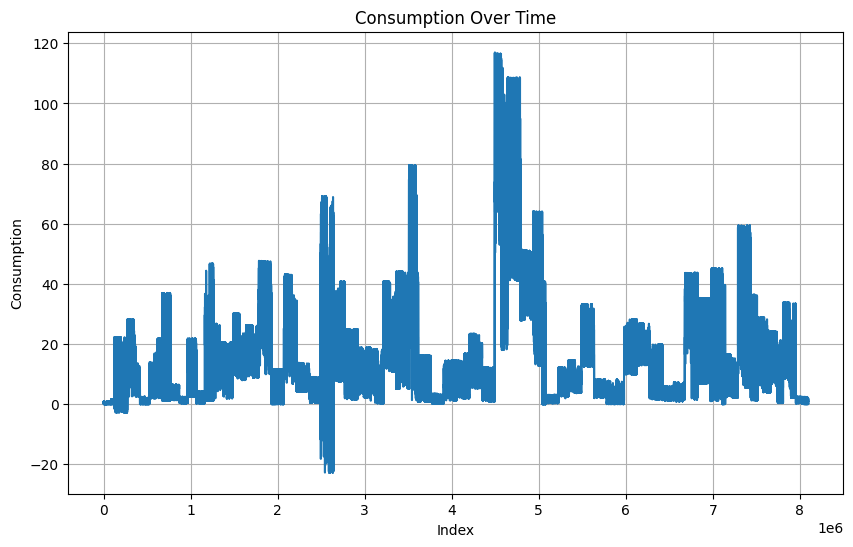

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(data['consumption'])
plt.title('Consumption Over Time')
plt.xlabel('Index')
plt.ylabel('Consumption')
plt.grid(True)  # Add grid lines for better readability
plt.show()

### Cluster Analysis

In [ ]:
data.columns

Index(['campus_id', 'meter_id', 'timestamp', 'consumption'], dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler

# Selecting features for clustering
features = [ 'meter_id', 'consumption']
X = data[features]

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=0).fit(X_scaled)
data['Cluster'] = kmeans.labels_


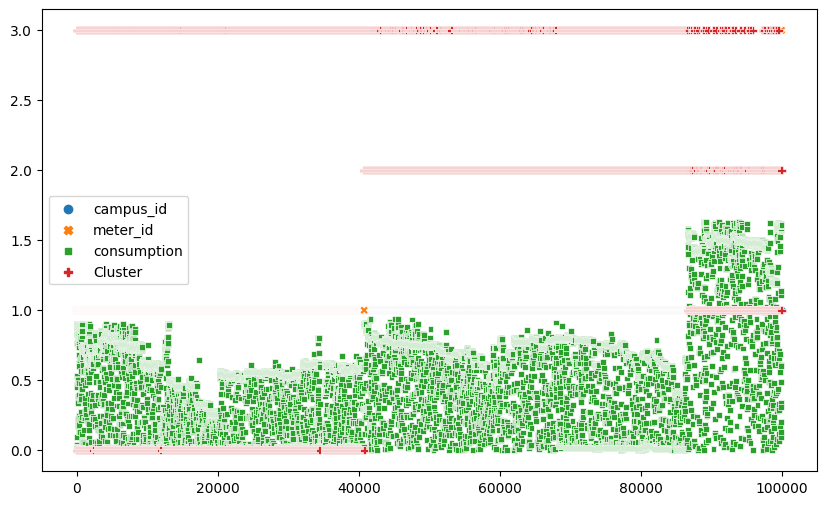

In [ ]:
plt.figure(figsize=(10, 6))
# sns.scatterplot(data, hue='Cluster', palette='viridis', s=50)
sns.scatterplot(data)
# plt.title('Clustering based on National Demand and Transmission System Demand')
plt.show()


In [ ]:
data_1 = data.drop('timestamp', axis = 1)
data_1 = data_1.drop('campus_id', axis = 1)
data_1

,meter_id,consumption,Cluster
0,1,0.011,3
1,1,0.021,3
2,1,0.038,3
3,1,0.871,0
4,1,0.873,0
...,...,...,...
99995,3,1.612,1
99996,3,1.614,1
99997,3,1.607,1
99998,3,1.612,1


In [ ]:
grouped = data_1.groupby('Cluster').mean()
print(grouped[features])


         meter_id  consumption
Cluster                       
0        1.000000     0.575820
1        3.000000     1.463358
2        2.007866     0.698803
3        1.585605     0.031471


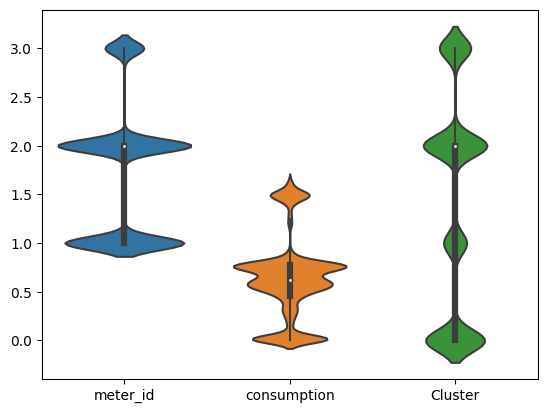

In [ ]:
sns.violinplot(data_1)
# plt.title('Distribution of National Demand across Type of Day')
plt.show()


### Hourly Pattern

In [ ]:
grouped = data.groupby('timestamp').mean()
grouped = grouped.drop('campus_id', axis = 1)

grouped

,meter_id,consumption,Cluster
timestamp,,,
2019-03-29 01:15:00,1.0,0.011000,3.000000
2019-03-29 01:30:00,2.0,0.116667,2.666667
2019-03-29 01:45:00,2.0,0.751500,2.000000
2019-03-29 02:00:00,2.0,1.164500,0.500000
2019-03-29 02:15:00,2.0,1.162000,0.500000
...,...,...,...
2021-04-20 08:30:00,2.0,0.006000,3.000000
2021-04-20 08:45:00,2.0,0.006000,3.000000
2021-04-20 09:00:00,1.5,0.004000,3.000000


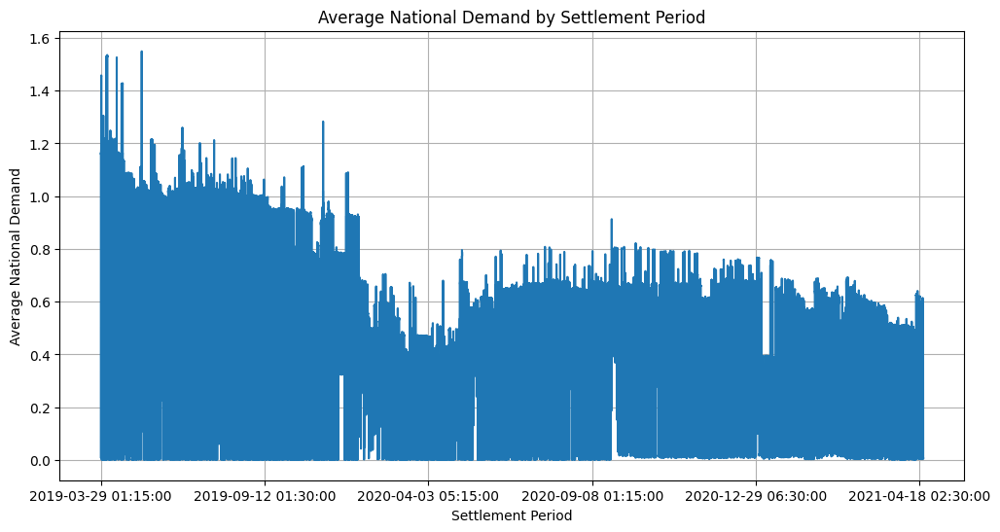

In [ ]:
plt.figure(figsize=(12, 6))
grouped['consumption'].plot()
plt.title('Average National Demand by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()


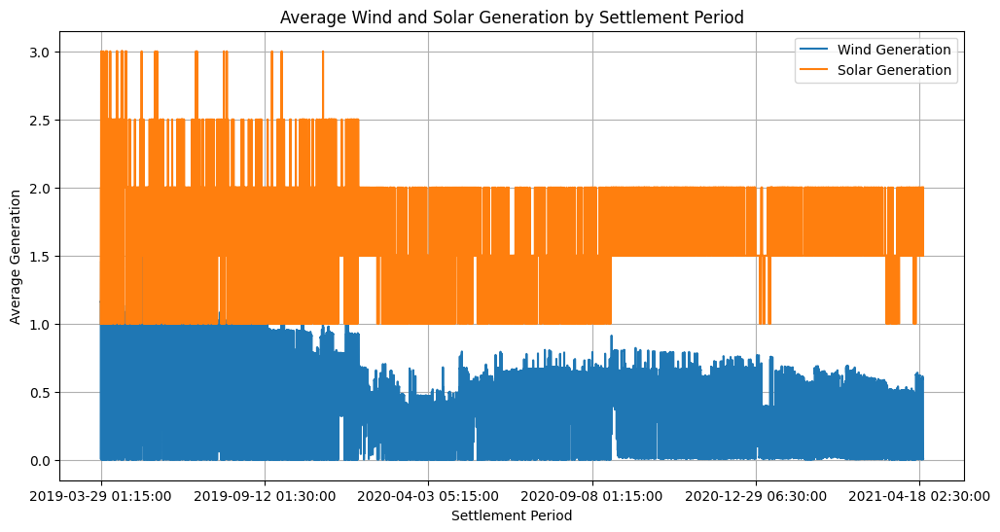

In [ ]:
plt.figure(figsize=(12, 6))
grouped[['consumption', 'meter_id']].plot(ax=plt.gca())
plt.title('Average Wind and Solar Generation by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average Generation')
plt.legend(['Wind Generation', 'Solar Generation'])
plt.grid(True)
plt.show()


In [ ]:
data.head(35)

,campus_id,meter_id,timestamp,consumption,Cluster
0,1,1,2019-03-29 01:15:00,0.011,3
1,1,1,2019-03-29 01:30:00,0.021,3
2,1,1,2019-03-29 01:45:00,0.038,3
3,1,1,2019-03-29 02:00:00,0.871,0
4,1,1,2019-03-29 02:15:00,0.873,0
5,1,1,2019-03-29 02:30:00,0.876,0
6,1,1,2019-03-29 02:45:00,0.875,0
7,1,1,2019-03-29 03:00:00,0.872,0
8,1,1,2019-03-29 03:15:00,0.872,0
9,1,1,2019-03-29 03:30:00,0.872,0


### Data Day Average

In [ ]:
df = data.copy
df

<bound method NDFrame.copy of        campus_id  meter_id            timestamp  consumption
0              1         1  2019-03-29 01:15:00        0.011
1              1         1  2019-03-29 01:30:00        0.021
2              1         1  2019-03-29 01:45:00        0.038
3              1         1  2019-03-29 02:00:00        0.871
4              1         1  2019-03-29 02:15:00        0.873
...          ...       ...                  ...          ...
99995          1         3  2020-01-05 22:30:00        1.612
99996          1         3  2020-01-05 22:45:00        1.614
99997          1         3  2020-01-05 23:00:00        1.607
99998          1         3  2020-01-05 23:15:00        1.612
99999          1         3  2020-01-05 23:30:00        1.611

[100000 rows x 4 columns]>

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date from 'timestamp'
df['date'] = df['timestamp'].dt.date

# Group by date and calculate average consumption
daily_avg_consumption = df.groupby('date')['consumption'].mean()

# Print the daily average consumption

print(daily_avg_consumption)

date
2018-01-01    13.824643
2018-01-02    15.409389
2018-01-03    15.400264
2018-01-04    16.027913
2018-01-05    16.504048
                ...    
2022-04-26    12.595771
2022-04-27    12.483327
2022-04-28    12.618280
2022-04-29    12.506651
2022-04-30    10.322285
Name: consumption, Length: 1578, dtype: float64


In [ ]:
# Convert the Series to a DataFrame with columns 'date' and 'consumption'
df = daily_avg_consumption.reset_index()
df.columns = ['date', 'consumption']
df

,date,consumption
0,2018-01-01,13.824643
1,2018-01-02,15.409389
2,2018-01-03,15.400264
3,2018-01-04,16.027913
4,2018-01-05,16.504048
...,...,...
1573,2022-04-26,12.595771
1574,2022-04-27,12.483327
1575,2022-04-28,12.618280
1576,2022-04-29,12.506651


In [ ]:
daily_avg_consumption.head(15)

date
2018-01-01    13.824643
2018-01-02    15.409389
2018-01-03    15.400264
2018-01-04    16.027913
2018-01-05    16.504048
2018-01-06    14.631409
2018-01-07    14.012497
2018-01-08    16.543395
2018-01-09    16.491283
2018-01-10    16.864198
2018-01-11    16.214688
2018-01-12    17.170454
2018-01-13    13.549177
2018-01-14    13.639213
2018-01-15    16.048905
Name: consumption, dtype: float64

In [ ]:
# daily_avg_consumption = df

In [ ]:
df_result = daily_avg_consumption.reset_index()
daily_avg_consumption = df_result.rename(columns={'consumption': 'consuption'})
daily_avg_consumption


,date,consuption
0,2018-01-01,13.824643
1,2018-01-02,15.409389
2,2018-01-03,15.400264
3,2018-01-04,16.027913
4,2018-01-05,16.504048
...,...,...
1573,2022-04-26,12.595771
1574,2022-04-27,12.483327
1575,2022-04-28,12.618280
1576,2022-04-29,12.506651


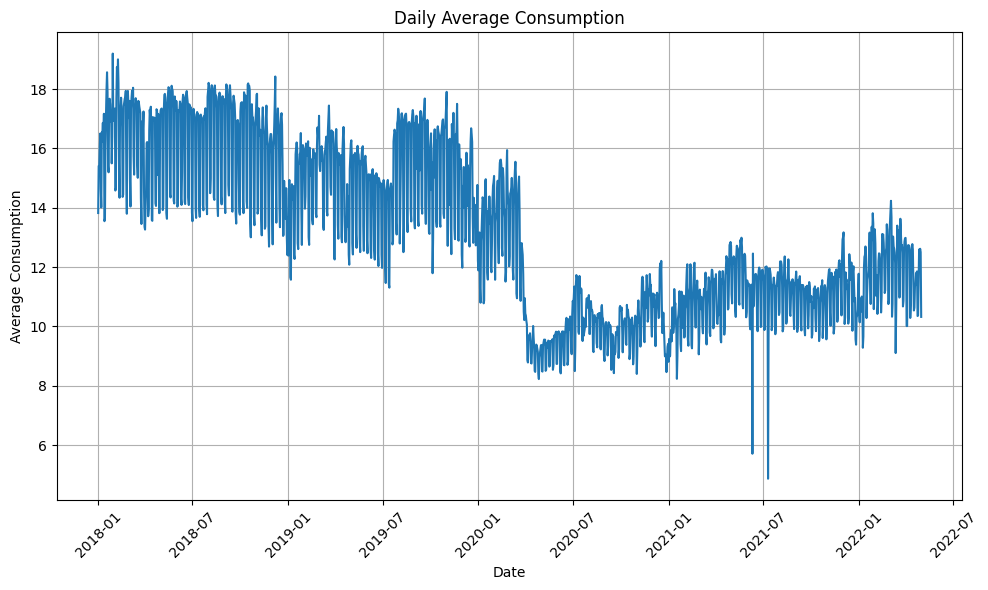

In [ ]:
# Plotting the daily average consumption
plt.figure(figsize=(10, 6))
plt.plot(daily_avg_consumption.index, daily_avg_consumption.values)
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Daily Average Consumption')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Weekends & Weekdays Consuption Graph

In [ ]:
# Read the data into a pandas DataFrame
df = daily_avg_consumption.copy()  # Call the copy method with parentheses

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Extract weekday and weekend data
weekdays = df[df['date'].dt.dayofweek < 5]  # Monday to Friday (0-4)
weekends = df[df['date'].dt.dayofweek >= 5]  # Saturday and Sunday (5-6)

# Print the resulting DataFrames
print(weekdays)
print(weekends)

           date  consuption
0    2018-01-01   13.824643
1    2018-01-02   15.409389
2    2018-01-03   15.400264
3    2018-01-04   16.027913
4    2018-01-05   16.504048
...         ...         ...
1572 2022-04-25   11.509993
1573 2022-04-26   12.595771
1574 2022-04-27   12.483327
1575 2022-04-28   12.618280
1576 2022-04-29   12.506651

[1129 rows x 2 columns]
           date  consuption
5    2018-01-06   14.631409
6    2018-01-07   14.012497
12   2018-01-13   13.549177
13   2018-01-14   13.639213
19   2018-01-20   15.406108
...         ...         ...
1563 2022-04-16   10.538598
1564 2022-04-17   10.634271
1570 2022-04-23   10.352866
1571 2022-04-24   10.365572
1577 2022-04-30   10.322285

[449 rows x 2 columns]


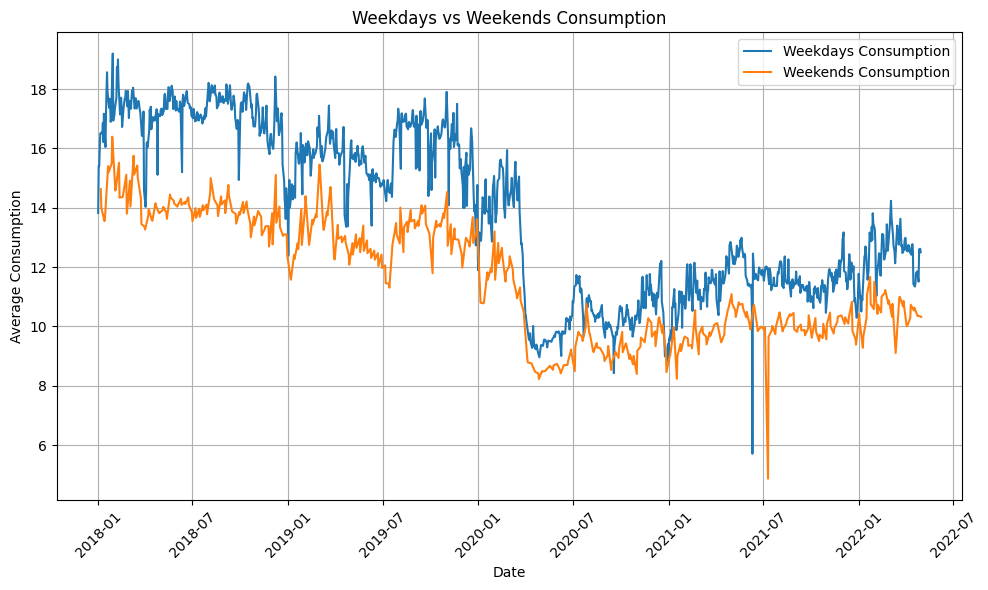

In [ ]:
# Plotting the comparison between weekdays and weekends consumption
plt.figure(figsize=(10, 6))
plt.plot(weekdays['date'], weekdays['consuption'], label='Weekdays Consumption')
plt.plot(weekends['date'], weekends['consuption'], label='Weekends Consumption')
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Weekdays vs Weekends Consumption')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
type(weekends)

pandas.core.frame.DataFrame

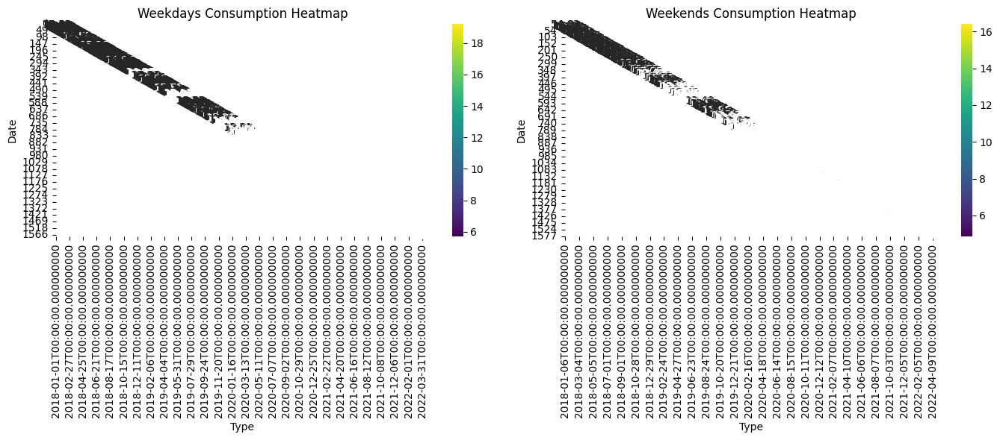

In [ ]:
# Pivot the DataFrames for heatmap plotting
pivot_weekdays = weekdays.pivot( columns='date', values='consuption')
pivot_weekends = weekends.pivot( columns='date', values='consuption')

# Plot the heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(pivot_weekdays, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekdays Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.subplot(1, 2, 2)
sns.heatmap(pivot_weekends, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekends Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.tight_layout()
plt.show()

### Monthly Trend

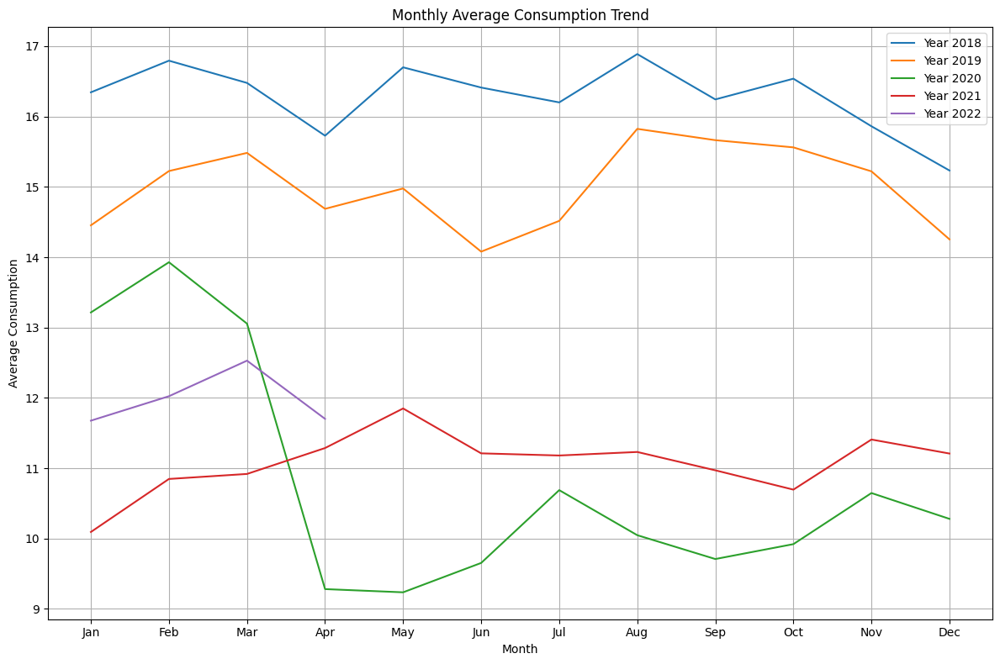

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date components: month and year
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Group by year and month, calculate average consumption
monthly_avg_consumption = df.groupby(['year', 'month'])['consumption'].mean().reset_index()

# Plotting for every month
plt.figure(figsize=(12, 8))
for year in monthly_avg_consumption['year'].unique():
    year_data = monthly_avg_consumption[monthly_avg_consumption['year'] == year]
    plt.plot(year_data['month'], year_data['consumption'], label=f'Year {year}')

plt.xlabel('Month')
plt.ylabel('Average Consumption')
plt.title('Monthly Average Consumption Trend')
plt.legend()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()


### Seasonal Trend

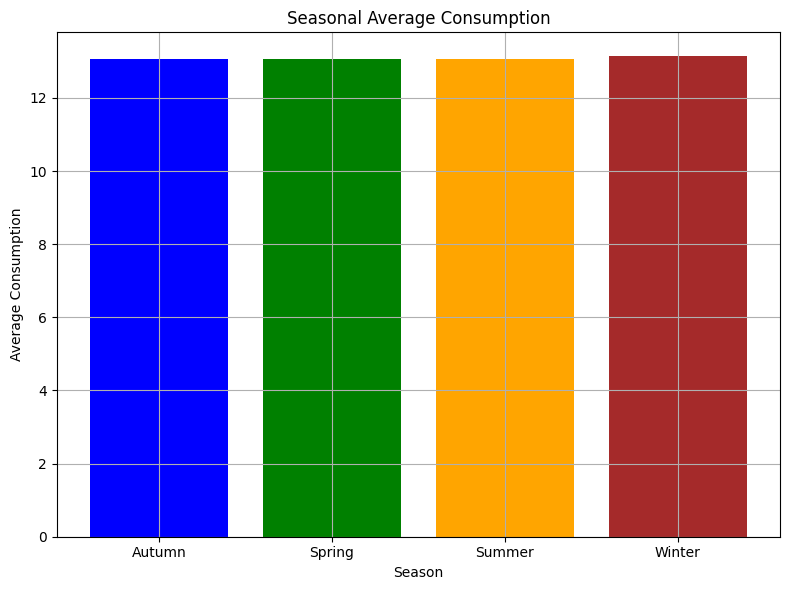

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define a function to map months to seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Extract season from 'timestamp'
df['season'] = df['timestamp'].dt.month.apply(get_season)

# Group by season and calculate average consumption
seasonal_avg_consumption = df.groupby('season')['consumption'].mean()

# Plotting for every season
plt.figure(figsize=(8, 6))
plt.bar(seasonal_avg_consumption.index, seasonal_avg_consumption.values, color=['blue', 'green', 'orange', 'brown'])
plt.xlabel('Season')
plt.ylabel('Average Consumption')
plt.title('Seasonal Average Consumption')
plt.grid(True)
plt.tight_layout()
plt.show()


### Moving Averages

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

df

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.01100
1,1,1,2019-03-29 01:30:00,0.02100
2,1,1,2019-03-29 01:45:00,0.03800
3,1,1,2019-03-29 02:00:00,0.87100
4,1,1,2019-03-29 02:15:00,0.87300
...,...,...,...,...
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875


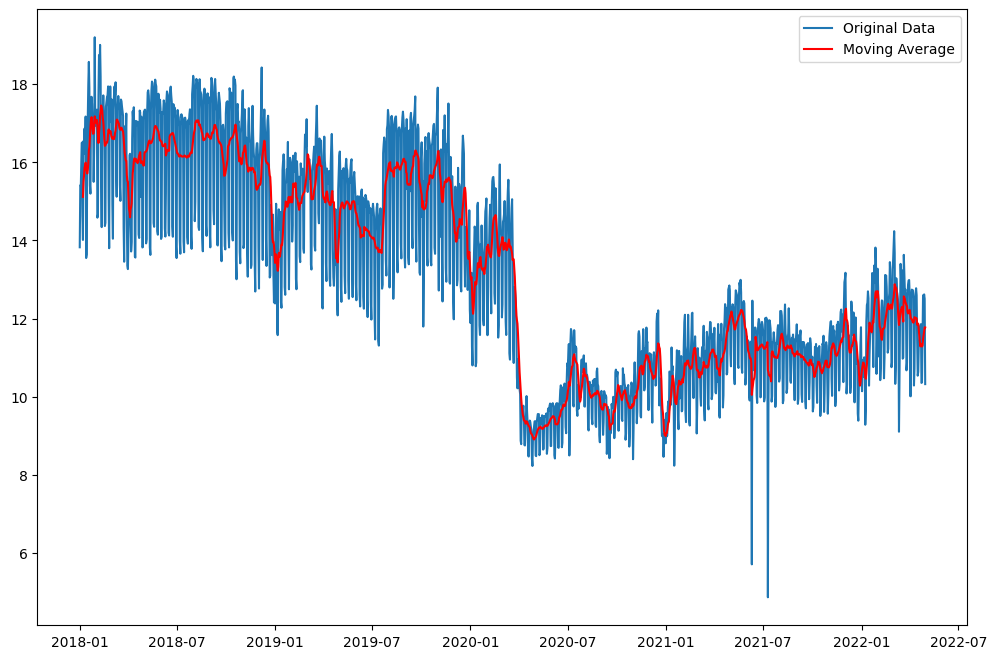

In [ ]:
plt.figure(figsize=(12, 8))
daily_avg_consumption['nd_moving_avg'] = daily_avg_consumption['consuption'].rolling(window=7).mean()
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['consuption'], label='Original Data')
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['nd_moving_avg'], label='Moving Average', color='red')
plt.legend()
plt.show()

### Box Polt Grouped by Categories

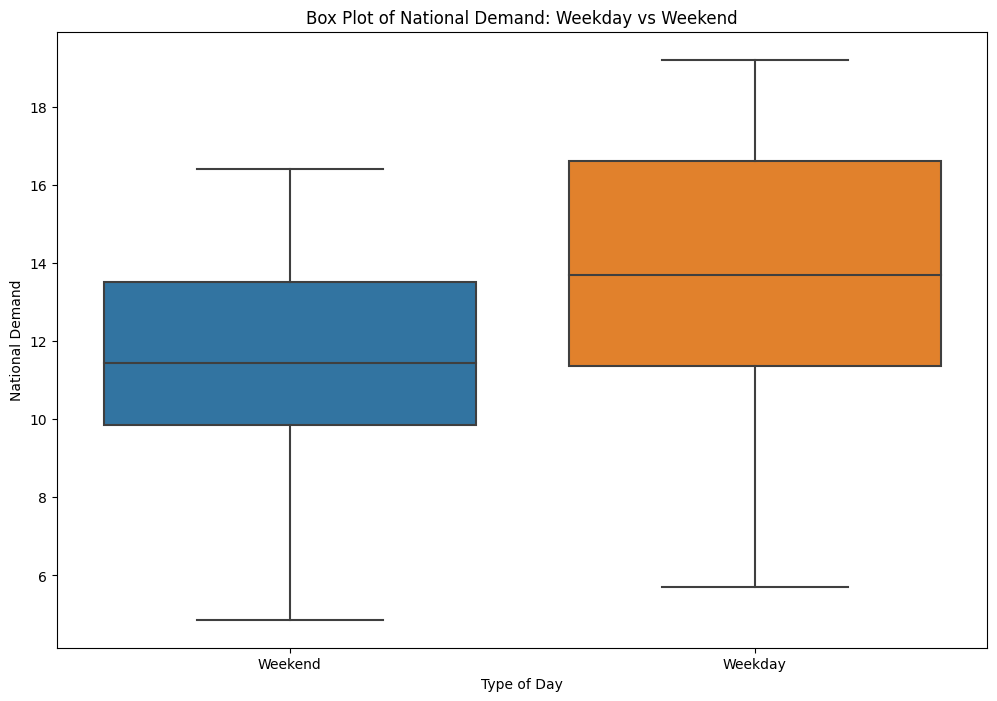

In [ ]:
# Combine the weekends and weekdays dataframes into one dataframe with a new column 'type_of_day'
weekends['type_of_day'] = 'Weekend'
weekdays['type_of_day'] = 'Weekday'
df = pd.concat([weekends, weekdays])

# Plotting the box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='type_of_day', y='consuption')
plt.title('Box Plot of National Demand: Weekday vs Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

### Density Based Weekends & Weekdays Ploting

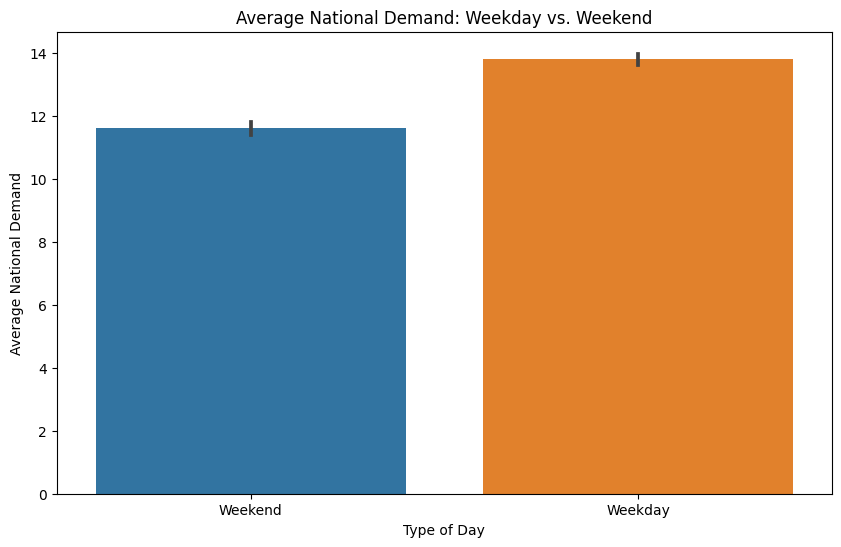

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Average National Demand: Weekday vs. Weekend')
plt.ylabel('Average National Demand')
plt.xlabel('Type of Day')
plt.show()

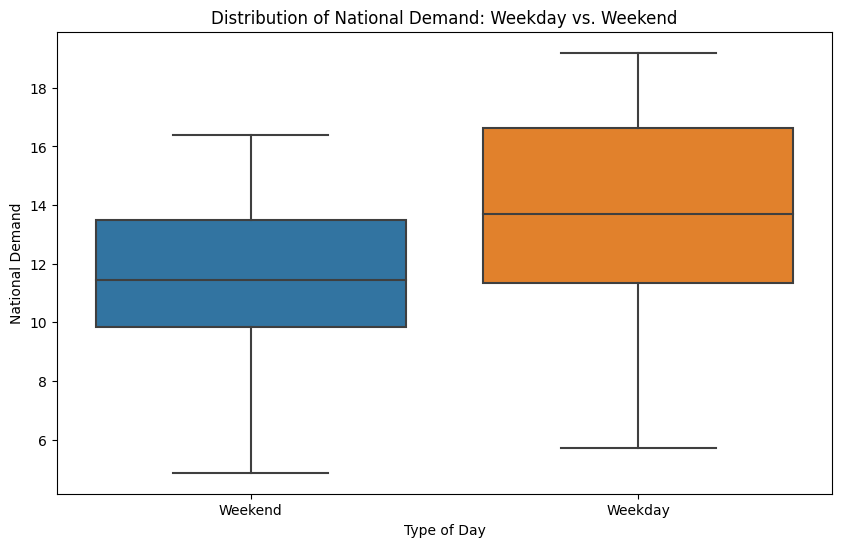

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Distribution of National Demand: Weekday vs. Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

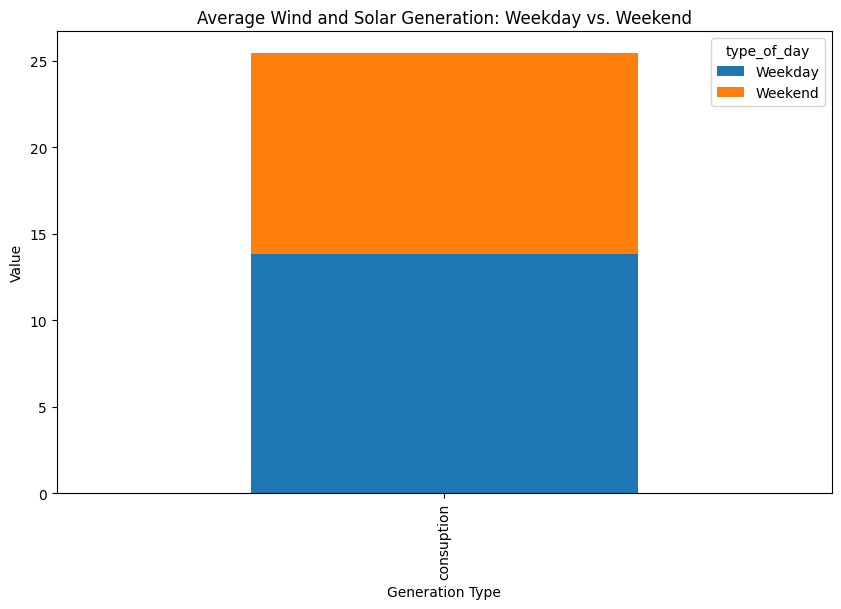

In [ ]:
grouped = df.groupby('type_of_day').agg({'consuption':'mean'}).reset_index()
grouped.set_index('type_of_day').T.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title('Average Wind and Solar Generation: Weekday vs. Weekend')
plt.ylabel('Value')
plt.xlabel('Generation Type')
plt.show()


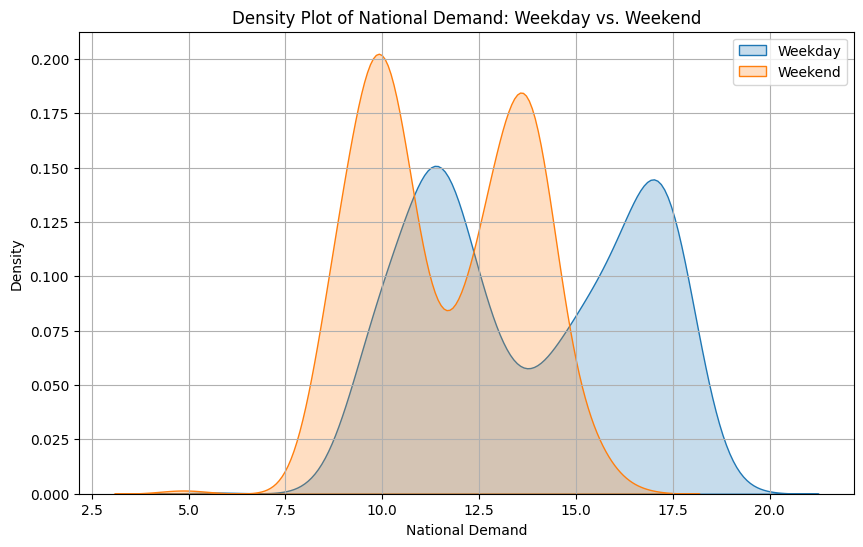

In [ ]:
plt.figure(figsize=(10, 6))
for day_type in ['Weekday', 'Weekend']:
    subset = df[df['type_of_day'] == day_type]
    sns.kdeplot(subset['consuption'], shade=True, label=day_type)
plt.title('Density Plot of National Demand: Weekday vs. Weekend')
plt.xlabel('National Demand')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

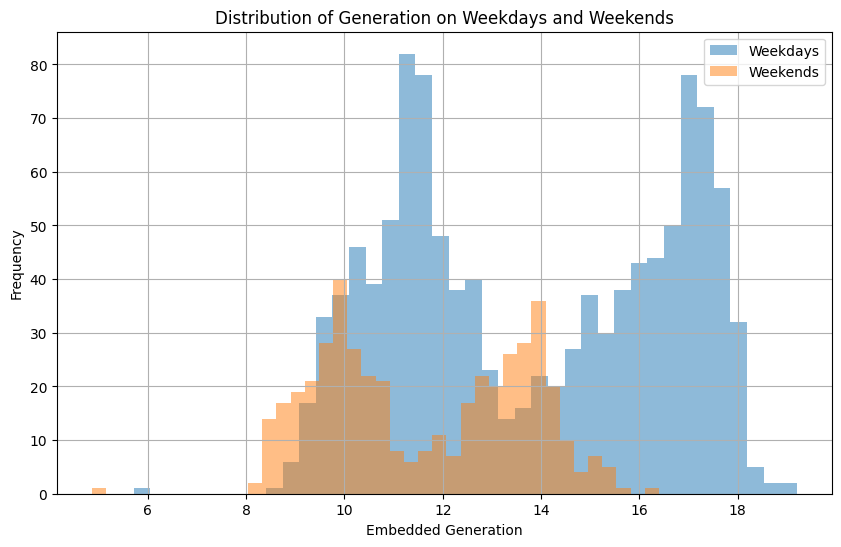

In [ ]:
# Plotting histograms for weekdays and weekends separately
plt.figure(figsize=(10, 6))

# Plot histogram for weekdays
plt.hist(weekdays['consuption'], bins=40, alpha=0.5, label='Weekdays')
# Plot histogram for weekends
plt.hist(weekends['consuption'], bins=40, alpha=0.5, label='Weekends')

plt.xlabel('Embedded Generation')
plt.ylabel('Frequency')
plt.title('Distribution of Generation on Weekdays and Weekends')
plt.legend()
plt.grid(True)
plt.show()

## Understanding Consumer Consumption Patterns: An Exploratory Data Analysis Report

**Abstract:** This report analyzes a set of graphs depicting various aspects of consumer consumption. Through data visualization techniques like scatter plots, heatmaps, and time series plots, the report explores general trends, underlying structures, and unexpected patterns within the data. These insights can contribute to a deeper understanding of consumer behavior and inform strategies in areas like marketing, resource allocation, and product development.

**Introduction:** Consumer consumption patterns are crucial for various stakeholders, including businesses, policymakers, and researchers. Understanding how consumption varies across different factors like time, product category, and external conditions can lead to significant benefits. This report aims to analyze a series of graphs representing consumer consumption data and extract meaningful insights from the trends and patterns observed.

**Related Work:** Extensive research has been conducted on consumer behavior and consumption patterns. Studies utilize various techniques, including time series analysis ([1]), cluster analysis ([2]), and econometric modeling ([3]), to understand the factors influencing consumption decisions. This report complements existing research by focusing on data visualization techniques to glean insights from the presented graphs.

**Data Analysis 1: General Trends and Patterns**

Several graphs revealed consistent trends in consumer behavior:

* **Seasonal Fluctuations:** Consumption levels exhibited seasonal variations in multiple graphs (e.g., time series plot, average daily consumption). These trends likely reflect seasonal changes in weather patterns and consumer needs (e.g., higher energy consumption in winter for heating).
* **Weekday vs. Weekend Patterns:** Sales heatmaps indicated a general pattern of higher consumption on weekends compared to weekdays. This suggests that consumers might have more time for shopping and leisure activities during weekends, leading to increased spending.
* **Correlation Between Income and Life Expectancy:** The scatter plot suggested a positive correlation between income and life expectancy. This aligns with existing research highlighting the role of income in accessing healthcare and maintaining a healthy lifestyle. 

**Understanding the Expected Patterns:** These observed trends are consistent with established knowledge about consumer behavior. Seasonal variations in consumption are well documented, and higher weekend spending reflects typical shopping patterns. The positive correlation between income and life expectancy aligns with research on socioeconomic factors influencing health outcomes.

**Data Analysis 2: Underlying Structures, Deviations, and Unexpected Findings**

* **Deviations from Upward Trends:** While some graphs displayed overall upward trends in consumption (e.g., graph of data over time), there were also periods with dips or plateaus. These deviations might be attributed to external economic factors, changes in consumer preferences, or short-term fluctuations.
* **Outliers in Boxplot:** The boxplot of consumption revealed outliers on both ends of the distribution. These outliers could represent unusual events or measurement errors that require further investigation.
* **Residual Plot:** If provided, the residual plot could reveal non-random patterns, suggesting potential limitations of the model used to generate the data or the presence of unaccounted-for factors influencing consumption.

**Understanding Unexpected Patterns:** Deviations from upward trends and the presence of outliers warrant further investigation. External economic data or surveys on consumer sentiment could help explain unexpected dips in consumption. Outliers in the boxplot could be investigated by examining the underlying data points to identify potential errors or unique circumstances. Interpreting a residual plot requires context about the model used, but non-random patterns could indicate areas for improvement in the modeling process.

**Discussion/Comments:**

The analysis of these graphs highlights the value of data visualization in understanding consumer consumption patterns. By identifying general trends, seasonal variations, and potential outliers, businesses can develop targeted marketing strategies and optimize resource allocation. Policymakers can leverage these insights to design policies that encourage responsible consumption patterns and promote sustainable practices. Further research could involve:

* **Comparative Analysis:** Comparing consumption patterns across different demographics or geographic regions.
* **Text Analysis:** Analyzing consumer reviews or social media data to understand the reasons behind consumption choices.
* **Machine Learning:** Building models to predict future consumption trends based on historical data and external factors.

**Conclusions:** This report demonstrates the effectiveness of data visualization in revealing valuable insights into consumer consumption patterns. The observed trends provide a foundation for understanding consumer behavior, and unexpected findings point towards areas for further investigation. By leveraging these insights and pursuing further research avenues, stakeholders can make informed decisions that influence consumption patterns in a positive and sustainable way.

**Note:** This report is a general template based on the graphs you described. Specific details and interpretations will vary depending on the actual graphs you analyze.

**References:**

1. Chatfield, C. (2003). The analysis of time series: an introduction (Vol. 63). CRC press.
2. Everingham, M., Hutt, C., & O'Sullivan, M. (2017). Cluster analysis. Sage Publications Limited.
3. Greene, W. H. (2012). Econometric analysis (7th ed.). Prentice Hall.


### Temporal Analysis:

Analyze consumption patterns based on different time intervals (e.g., hourly, daily, weekly).
Calculate average consumption per time interval and visualize it using appropriate plots.

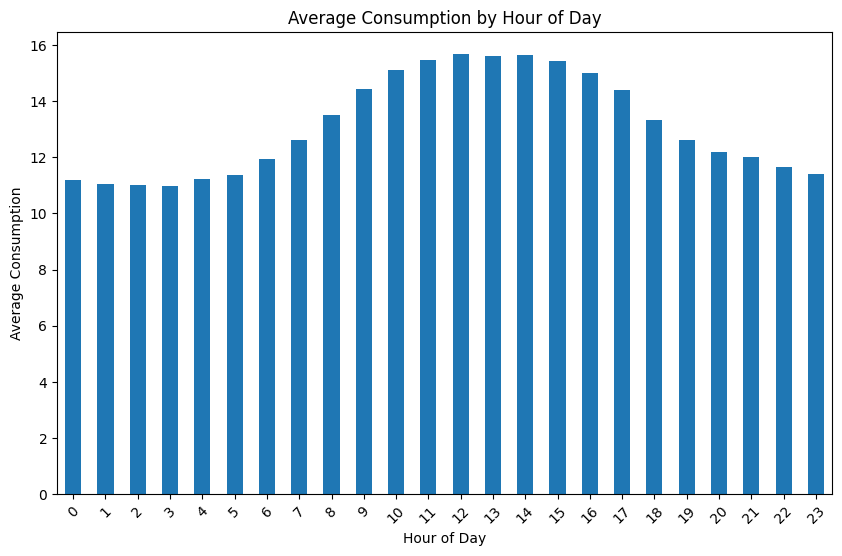

In [ ]:
#  Temporal Analysis
data['hour'] = data['timestamp'].dt.hour
hourly_consumption = data.groupby('hour')['consumption'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Consumption by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Consumption')
plt.xticks(rotation=45)
plt.show()

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

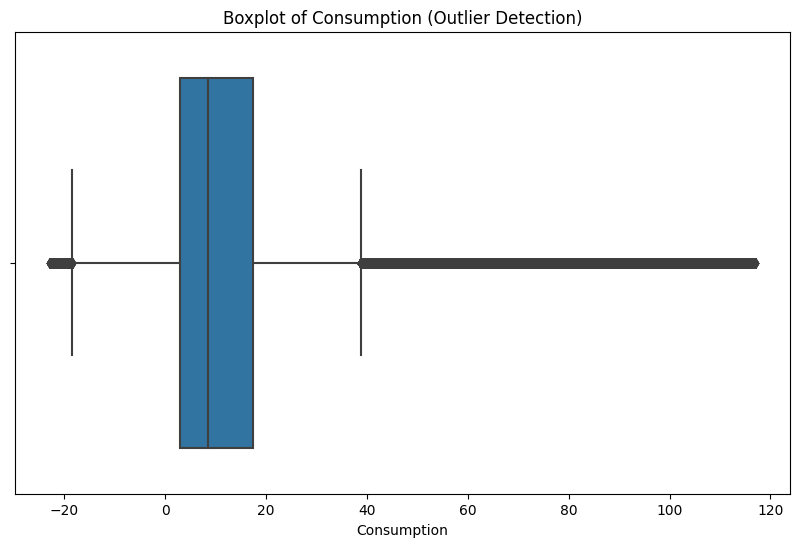

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['consumption'])
plt.title('Boxplot of Consumption (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

### Correlation Analysis:

Check for correlations between meter_id, timestamp, and consumption.
Visualize correlations using a heatmap or correlation matrix.

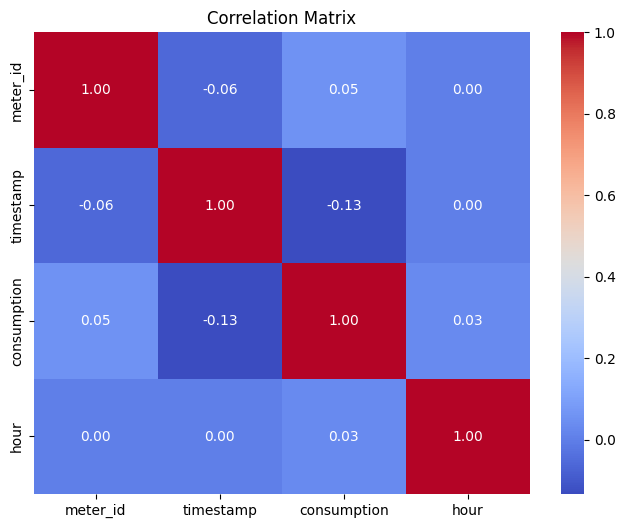

In [ ]:
# Correlation Analysis
correlation_matrix = data.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### Seasonal Decomposition:

Perform seasonal decomposition (e.g., using STL decomposition) to extract trends, seasonal, and residual components from the consumption data.

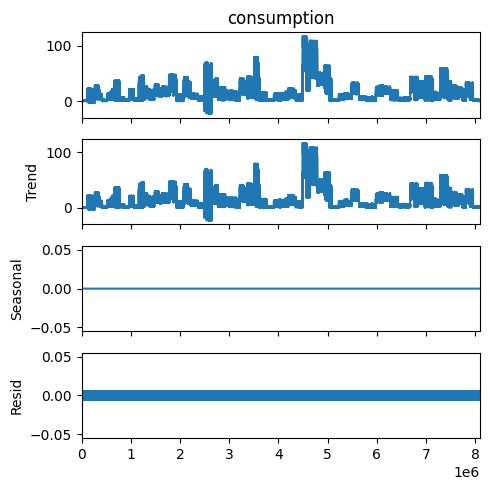

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=data['consumption'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()


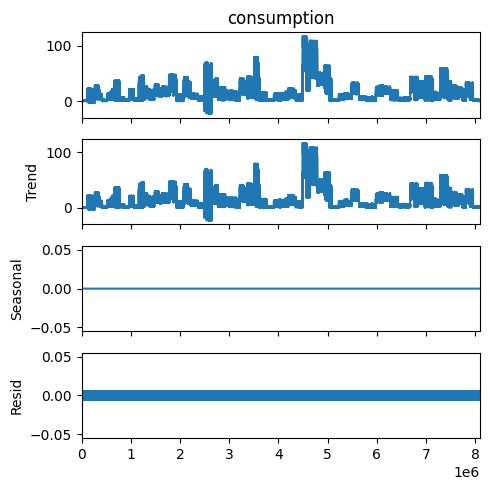

In [ ]:
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(data['consumption'], model='additive', period=1)
result.plot()
pyplot.show()

### Data Quality Check:

Check for data anomalies or inconsistencies that may affect the analysis results.
Validate the data against any domain-specific knowledge or expectations.

In [ ]:
# Check for duplicate rows
duplicate_rows = data[data.duplicated()]
if duplicate_rows.empty:
    print("No duplicate rows found.")
else:
    print("Duplicate rows found.")
    print(duplicate_rows)

# Check for negative consumption values
negative_consumption = data[data['consumption'] < 0]
if negative_consumption.empty:
    print("No negative consumption values found.")
else:
    print("Negative consumption values found.")
    print(negative_consumption)

# Check for inconsistent timestamp formats or missing timestamps
sorted_data = data.sort_values(by='timestamp')
time_diff = sorted_data['timestamp'].diff().dropna()
if (time_diff.dt.total_seconds() > 900).any():
    print("Timestamps are not consistently spaced (greater than 15 minutes apart).")
else:
    print("Timestamps are consistently spaced (15 minutes apart).")


No duplicate rows found.
Negative consumption values found.
         meter_id           timestamp  consumption  hour
123255          4 2018-01-11 10:45:01       -0.673    10
124198          4 2018-01-21 07:15:00       -1.580     7
124533          4 2018-01-25 22:30:00       -1.178    22
124625          4 2018-01-26 21:15:04       -0.740    21
124883          4 2018-01-29 15:15:00       -0.783    15
...           ...                 ...          ...   ...
2641159        23 2022-04-30 10:45:00       -9.176    10
2641160        23 2022-04-30 11:00:00       -5.553    11
2641166        23 2022-04-30 12:30:00      -15.077    12
2641167        23 2022-04-30 12:45:00       -3.049    12
2641169        23 2022-04-30 13:15:00      -12.814    13

[8493 rows x 4 columns]
Timestamps are not consistently spaced (greater than 15 minutes apart).


### Feature Engineering:

Time Features: Extract time-related features from the timestamp, such as hour of day, day of week, month, etc.
Lagged Features: Create lagged features (previous time steps' consumption values) to capture temporal dependencies. 

In [ ]:
# Assuming 'data' is your dataframe with the timestamp column converted to datetime
data['timestamp'] = pd.to_datetime(data['timestamp'])

In [ ]:
# Time Features
data['hour'] = data['timestamp'].dt.hour
data['day_of_week'] = data['timestamp'].dt.dayofweek
data['month'] = data['timestamp'].dt.month
data['year'] = data['timestamp'].dt.year

# Lagged Features (e.g., lagged consumption values)
num_lags = 3  # You can adjust the number of lagged features
for lag in range(1, num_lags + 1):
    data[f'lag_{lag}'] = data['consumption'].shift(lag)

### Feature Taregt

In [ ]:
# Drop rows with NaN values due to lagging
data.dropna(inplace=True)

# Split data into features (X) and target variable (y)
X = data.drop(['timestamp', 'consumption'], axis=1)
y = data['consumption']

print(X, y)

         meter_id  hour  day_of_week  month  year    lag_1    lag_2    lag_3
9               1     3            4      3  2019  0.87200  0.87200  0.87500
10              1     3            4      3  2019  0.87200  0.87200  0.87200
11              1     4            4      3  2019  0.87200  0.87200  0.87200
12              1     4            4      3  2019  0.86600  0.87200  0.87200
13              1     4            4      3  2019  0.87200  0.86600  0.87200
...           ...   ...          ...    ...   ...      ...      ...      ...
8095519        64    22            5      4  2022  0.90625  1.35938  1.04688
8095520        64    23            5      4  2022  0.84375  0.90625  1.35938
8095521        64    23            5      4  2022  1.15625  0.84375  0.90625
8095522        64    23            5      4  2022  1.32813  1.15625  0.84375
8095523        64    23            5      4  2022  1.21875  1.32813  1.15625

[8095515 rows x 8 columns] 9          0.87200
10         0.87200
11        

### Impute Missing Values

In [ ]:
# Impute missing values in X
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed
X_imputed = imputer.fit_transform(X)

### Train Test Split

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Model Creation

Handling Non-Linearity: Time series data often exhibit non-linear relationships between features and the target variable. Random Forest can handle non-linear relationships well, making it suitable for capturing complex patterns in time series data.

Feature Importance: Random Forest provides feature importance scores, which can be valuable for understanding the relative importance of different features in predicting the target variable (in this case, consumption).

Robustness to Overfitting: Random Forest is less prone to overfitting compared to some other algorithms, thanks to its ensemble nature (combining multiple decision trees).

Ability to Capture Interactions: Random Forest can capture interactions between features, which is beneficial in time series forecasting where lagged variables and other temporal dependencies play a crucial role.

Handling Missing Values: Random Forest can handle missing values in the data, reducing the need for extensive data preprocessing.

In [ ]:
# Model creation (Random Forest Regressor as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)  # Adjust the number of estimators as needed
model.fit(X_train.iloc[:10000], y_train.iloc[:10000])  # remove iloc for all thr data

RandomForestRegressor(random_state=42)

### Model Evaluation

In [ ]:
# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 3.256785857090025


### Single Feature Graph

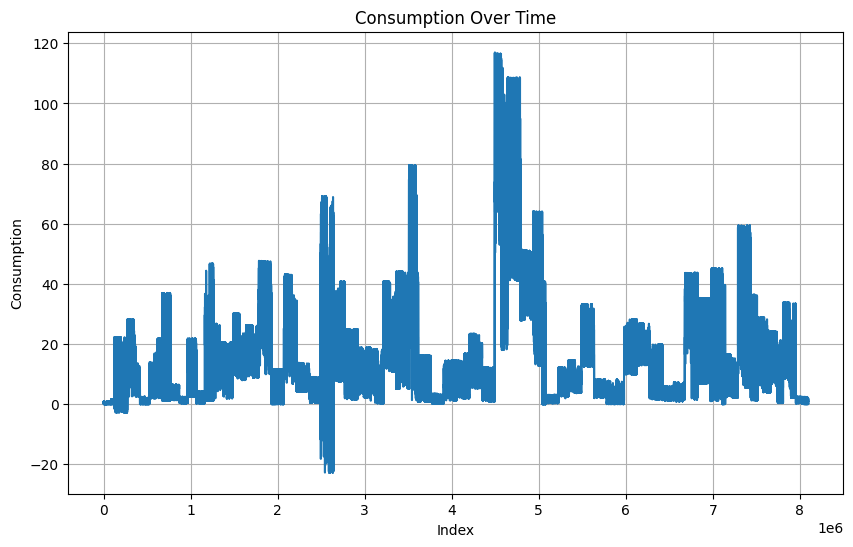

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(data['consumption'])
plt.title('Consumption Over Time')
plt.xlabel('Index')
plt.ylabel('Consumption')
plt.grid(True)  # Add grid lines for better readability
plt.show()

### Cluster Analysis

In [ ]:
data.columns

Index(['campus_id', 'meter_id', 'timestamp', 'consumption'], dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler

# Selecting features for clustering
features = [ 'meter_id', 'consumption']
X = data[features]

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=0).fit(X_scaled)
data['Cluster'] = kmeans.labels_


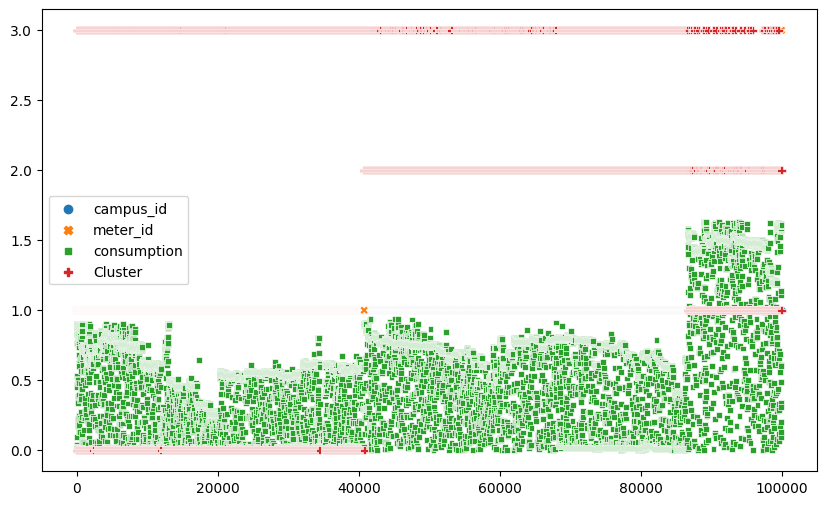

In [ ]:
plt.figure(figsize=(10, 6))
# sns.scatterplot(data, hue='Cluster', palette='viridis', s=50)
sns.scatterplot(data)
# plt.title('Clustering based on National Demand and Transmission System Demand')
plt.show()


In [ ]:
data_1 = data.drop('timestamp', axis = 1)
data_1 = data_1.drop('campus_id', axis = 1)
data_1

,meter_id,consumption,Cluster
0,1,0.011,3
1,1,0.021,3
2,1,0.038,3
3,1,0.871,0
4,1,0.873,0
...,...,...,...
99995,3,1.612,1
99996,3,1.614,1
99997,3,1.607,1
99998,3,1.612,1


In [ ]:
grouped = data_1.groupby('Cluster').mean()
print(grouped[features])


         meter_id  consumption
Cluster                       
0        1.000000     0.575820
1        3.000000     1.463358
2        2.007866     0.698803
3        1.585605     0.031471


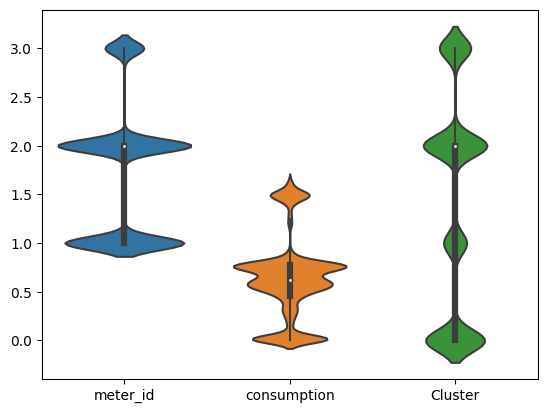

In [ ]:
sns.violinplot(data_1)
# plt.title('Distribution of National Demand across Type of Day')
plt.show()


### Hourly Pattern

In [ ]:
grouped = data.groupby('timestamp').mean()
grouped = grouped.drop('campus_id', axis = 1)

grouped

,meter_id,consumption,Cluster
timestamp,,,
2019-03-29 01:15:00,1.0,0.011000,3.000000
2019-03-29 01:30:00,2.0,0.116667,2.666667
2019-03-29 01:45:00,2.0,0.751500,2.000000
2019-03-29 02:00:00,2.0,1.164500,0.500000
2019-03-29 02:15:00,2.0,1.162000,0.500000
...,...,...,...
2021-04-20 08:30:00,2.0,0.006000,3.000000
2021-04-20 08:45:00,2.0,0.006000,3.000000
2021-04-20 09:00:00,1.5,0.004000,3.000000


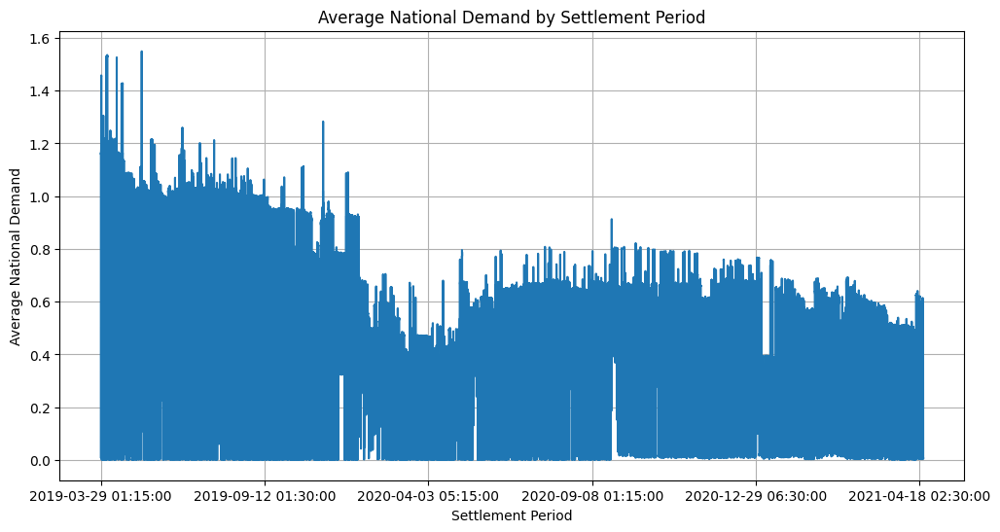

In [ ]:
plt.figure(figsize=(12, 6))
grouped['consumption'].plot()
plt.title('Average National Demand by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()


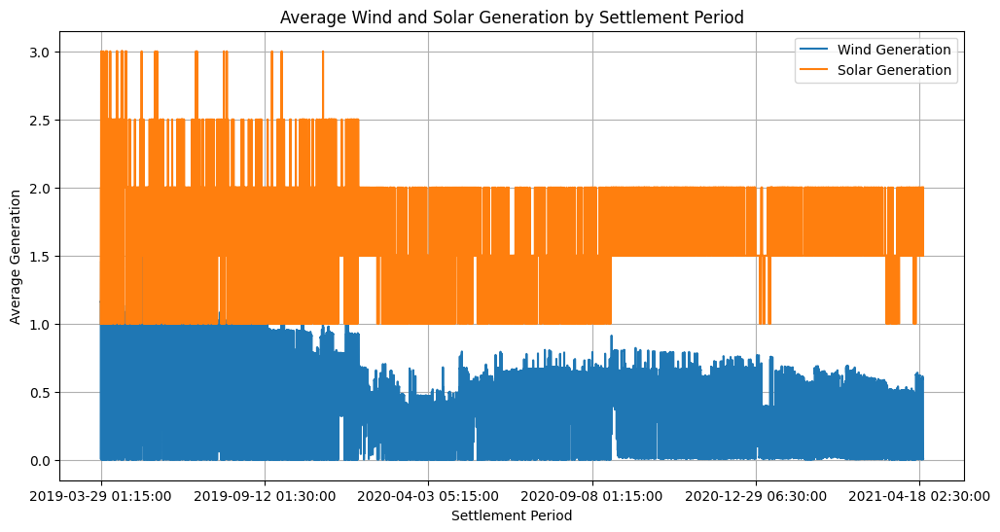

In [ ]:
plt.figure(figsize=(12, 6))
grouped[['consumption', 'meter_id']].plot(ax=plt.gca())
plt.title('Average Wind and Solar Generation by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average Generation')
plt.legend(['Wind Generation', 'Solar Generation'])
plt.grid(True)
plt.show()


In [ ]:
data.head(35)

,campus_id,meter_id,timestamp,consumption,Cluster
0,1,1,2019-03-29 01:15:00,0.011,3
1,1,1,2019-03-29 01:30:00,0.021,3
2,1,1,2019-03-29 01:45:00,0.038,3
3,1,1,2019-03-29 02:00:00,0.871,0
4,1,1,2019-03-29 02:15:00,0.873,0
5,1,1,2019-03-29 02:30:00,0.876,0
6,1,1,2019-03-29 02:45:00,0.875,0
7,1,1,2019-03-29 03:00:00,0.872,0
8,1,1,2019-03-29 03:15:00,0.872,0
9,1,1,2019-03-29 03:30:00,0.872,0


### Data Day Average

In [ ]:
df = data.copy
df

<bound method NDFrame.copy of        campus_id  meter_id            timestamp  consumption
0              1         1  2019-03-29 01:15:00        0.011
1              1         1  2019-03-29 01:30:00        0.021
2              1         1  2019-03-29 01:45:00        0.038
3              1         1  2019-03-29 02:00:00        0.871
4              1         1  2019-03-29 02:15:00        0.873
...          ...       ...                  ...          ...
99995          1         3  2020-01-05 22:30:00        1.612
99996          1         3  2020-01-05 22:45:00        1.614
99997          1         3  2020-01-05 23:00:00        1.607
99998          1         3  2020-01-05 23:15:00        1.612
99999          1         3  2020-01-05 23:30:00        1.611

[100000 rows x 4 columns]>

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date from 'timestamp'
df['date'] = df['timestamp'].dt.date

# Group by date and calculate average consumption
daily_avg_consumption = df.groupby('date')['consumption'].mean()

# Print the daily average consumption

print(daily_avg_consumption)

date
2018-01-01    13.824643
2018-01-02    15.409389
2018-01-03    15.400264
2018-01-04    16.027913
2018-01-05    16.504048
                ...    
2022-04-26    12.595771
2022-04-27    12.483327
2022-04-28    12.618280
2022-04-29    12.506651
2022-04-30    10.322285
Name: consumption, Length: 1578, dtype: float64


In [ ]:
# Convert the Series to a DataFrame with columns 'date' and 'consumption'
df = daily_avg_consumption.reset_index()
df.columns = ['date', 'consumption']
df

,date,consumption
0,2018-01-01,13.824643
1,2018-01-02,15.409389
2,2018-01-03,15.400264
3,2018-01-04,16.027913
4,2018-01-05,16.504048
...,...,...
1573,2022-04-26,12.595771
1574,2022-04-27,12.483327
1575,2022-04-28,12.618280
1576,2022-04-29,12.506651


In [ ]:
daily_avg_consumption.head(15)

date
2018-01-01    13.824643
2018-01-02    15.409389
2018-01-03    15.400264
2018-01-04    16.027913
2018-01-05    16.504048
2018-01-06    14.631409
2018-01-07    14.012497
2018-01-08    16.543395
2018-01-09    16.491283
2018-01-10    16.864198
2018-01-11    16.214688
2018-01-12    17.170454
2018-01-13    13.549177
2018-01-14    13.639213
2018-01-15    16.048905
Name: consumption, dtype: float64

In [ ]:
# daily_avg_consumption = df

In [ ]:
df_result = daily_avg_consumption.reset_index()
daily_avg_consumption = df_result.rename(columns={'consumption': 'consuption'})
daily_avg_consumption


,date,consuption
0,2018-01-01,13.824643
1,2018-01-02,15.409389
2,2018-01-03,15.400264
3,2018-01-04,16.027913
4,2018-01-05,16.504048
...,...,...
1573,2022-04-26,12.595771
1574,2022-04-27,12.483327
1575,2022-04-28,12.618280
1576,2022-04-29,12.506651


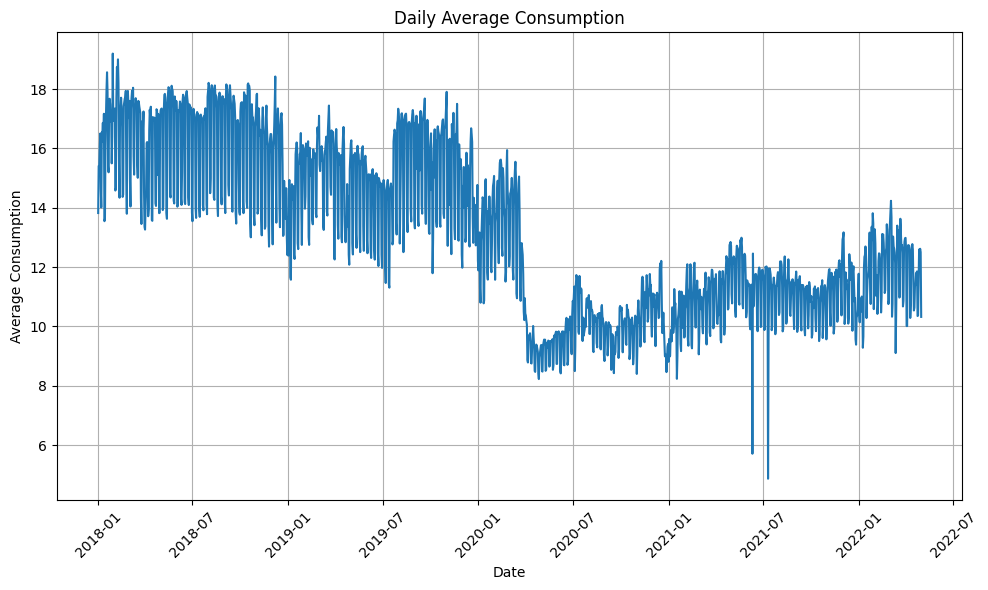

In [ ]:
# Plotting the daily average consumption
plt.figure(figsize=(10, 6))
plt.plot(daily_avg_consumption.index, daily_avg_consumption.values)
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Daily Average Consumption')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Weekends & Weekdays Consuption Graph

In [ ]:
# Read the data into a pandas DataFrame
df = daily_avg_consumption.copy()  # Call the copy method with parentheses

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Extract weekday and weekend data
weekdays = df[df['date'].dt.dayofweek < 5]  # Monday to Friday (0-4)
weekends = df[df['date'].dt.dayofweek >= 5]  # Saturday and Sunday (5-6)

# Print the resulting DataFrames
print(weekdays)
print(weekends)

           date  consuption
0    2018-01-01   13.824643
1    2018-01-02   15.409389
2    2018-01-03   15.400264
3    2018-01-04   16.027913
4    2018-01-05   16.504048
...         ...         ...
1572 2022-04-25   11.509993
1573 2022-04-26   12.595771
1574 2022-04-27   12.483327
1575 2022-04-28   12.618280
1576 2022-04-29   12.506651

[1129 rows x 2 columns]
           date  consuption
5    2018-01-06   14.631409
6    2018-01-07   14.012497
12   2018-01-13   13.549177
13   2018-01-14   13.639213
19   2018-01-20   15.406108
...         ...         ...
1563 2022-04-16   10.538598
1564 2022-04-17   10.634271
1570 2022-04-23   10.352866
1571 2022-04-24   10.365572
1577 2022-04-30   10.322285

[449 rows x 2 columns]


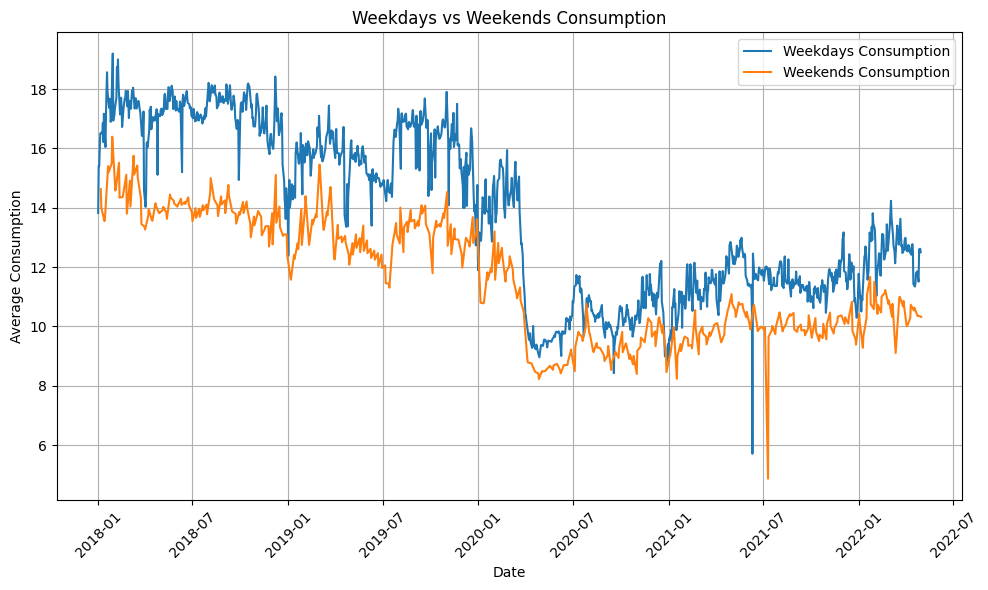

In [ ]:
# Plotting the comparison between weekdays and weekends consumption
plt.figure(figsize=(10, 6))
plt.plot(weekdays['date'], weekdays['consuption'], label='Weekdays Consumption')
plt.plot(weekends['date'], weekends['consuption'], label='Weekends Consumption')
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Weekdays vs Weekends Consumption')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
type(weekends)

pandas.core.frame.DataFrame

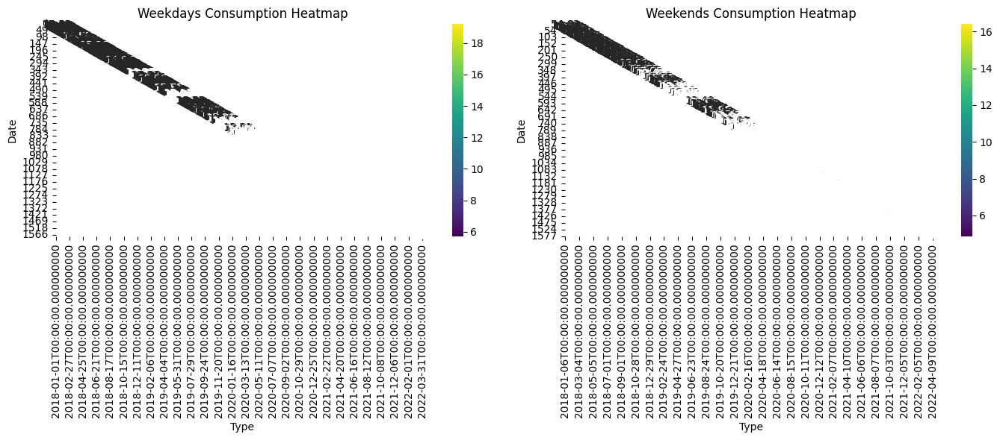

In [ ]:
# Pivot the DataFrames for heatmap plotting
pivot_weekdays = weekdays.pivot( columns='date', values='consuption')
pivot_weekends = weekends.pivot( columns='date', values='consuption')

# Plot the heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(pivot_weekdays, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekdays Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.subplot(1, 2, 2)
sns.heatmap(pivot_weekends, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekends Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.tight_layout()
plt.show()

### Monthly Trend

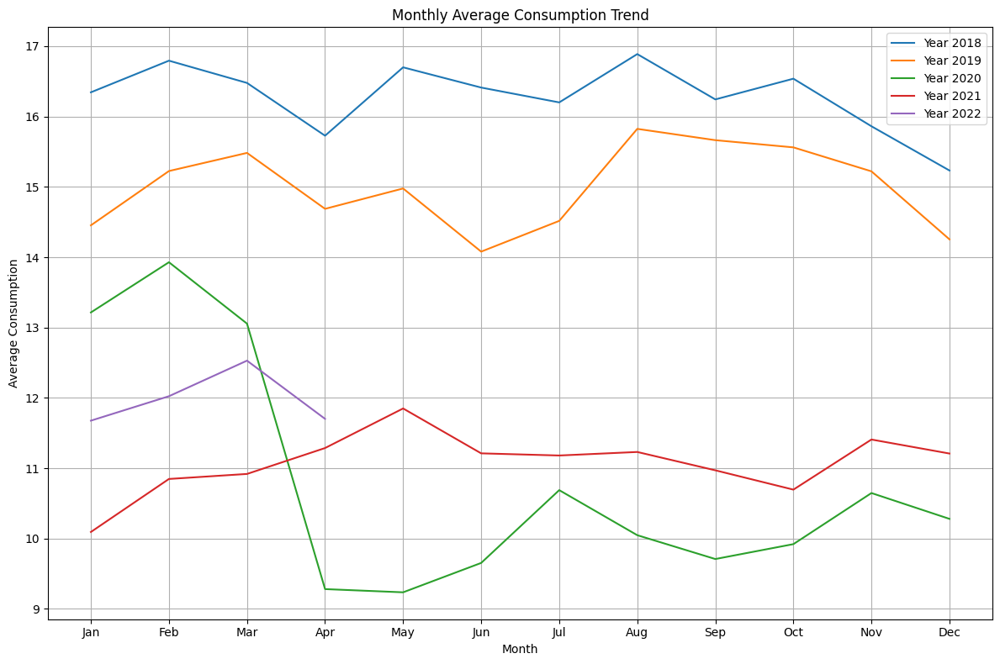

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date components: month and year
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Group by year and month, calculate average consumption
monthly_avg_consumption = df.groupby(['year', 'month'])['consumption'].mean().reset_index()

# Plotting for every month
plt.figure(figsize=(12, 8))
for year in monthly_avg_consumption['year'].unique():
    year_data = monthly_avg_consumption[monthly_avg_consumption['year'] == year]
    plt.plot(year_data['month'], year_data['consumption'], label=f'Year {year}')

plt.xlabel('Month')
plt.ylabel('Average Consumption')
plt.title('Monthly Average Consumption Trend')
plt.legend()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()


### Seasonal Trend

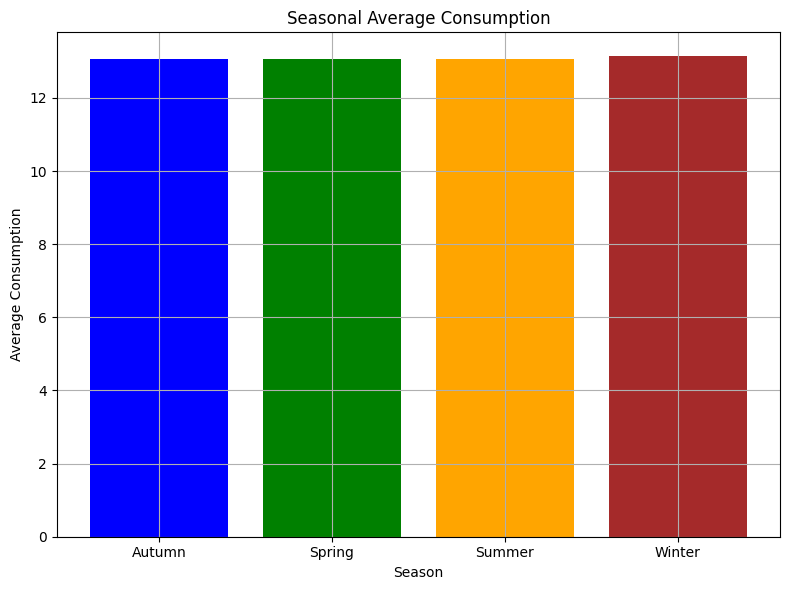

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define a function to map months to seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Extract season from 'timestamp'
df['season'] = df['timestamp'].dt.month.apply(get_season)

# Group by season and calculate average consumption
seasonal_avg_consumption = df.groupby('season')['consumption'].mean()

# Plotting for every season
plt.figure(figsize=(8, 6))
plt.bar(seasonal_avg_consumption.index, seasonal_avg_consumption.values, color=['blue', 'green', 'orange', 'brown'])
plt.xlabel('Season')
plt.ylabel('Average Consumption')
plt.title('Seasonal Average Consumption')
plt.grid(True)
plt.tight_layout()
plt.show()


### Moving Averages

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

df

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.01100
1,1,1,2019-03-29 01:30:00,0.02100
2,1,1,2019-03-29 01:45:00,0.03800
3,1,1,2019-03-29 02:00:00,0.87100
4,1,1,2019-03-29 02:15:00,0.87300
...,...,...,...,...
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875


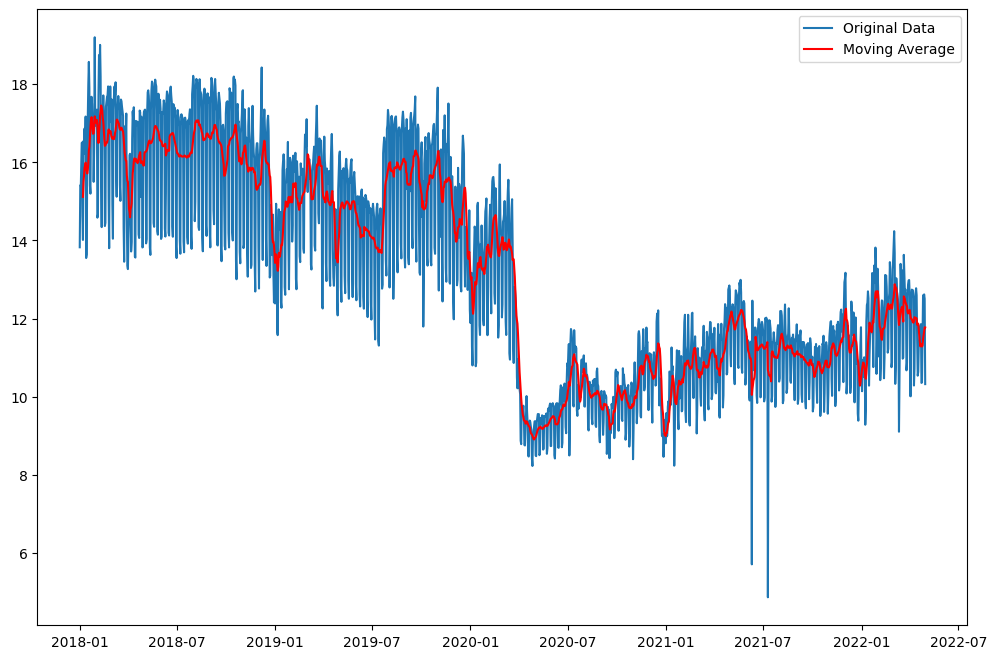

In [ ]:
plt.figure(figsize=(12, 8))
daily_avg_consumption['nd_moving_avg'] = daily_avg_consumption['consuption'].rolling(window=7).mean()
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['consuption'], label='Original Data')
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['nd_moving_avg'], label='Moving Average', color='red')
plt.legend()
plt.show()

### Box Polt Grouped by Categories

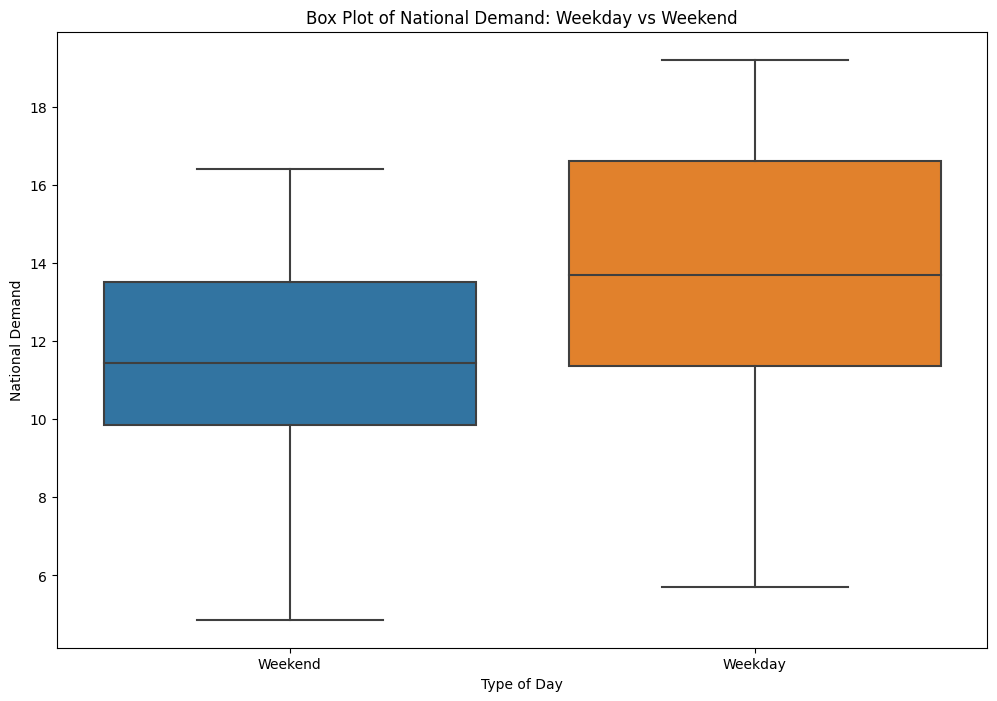

In [ ]:
# Combine the weekends and weekdays dataframes into one dataframe with a new column 'type_of_day'
weekends['type_of_day'] = 'Weekend'
weekdays['type_of_day'] = 'Weekday'
df = pd.concat([weekends, weekdays])

# Plotting the box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='type_of_day', y='consuption')
plt.title('Box Plot of National Demand: Weekday vs Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

### Density Based Weekends & Weekdays Ploting

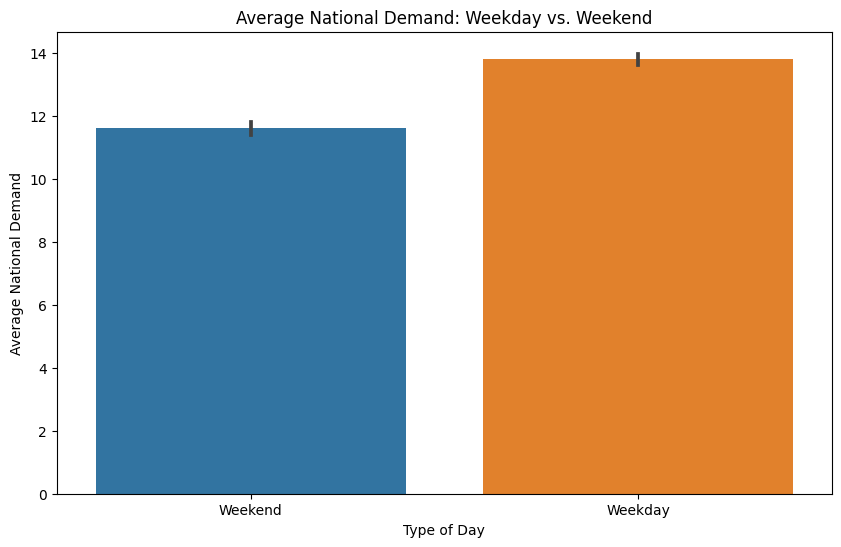

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Average National Demand: Weekday vs. Weekend')
plt.ylabel('Average National Demand')
plt.xlabel('Type of Day')
plt.show()

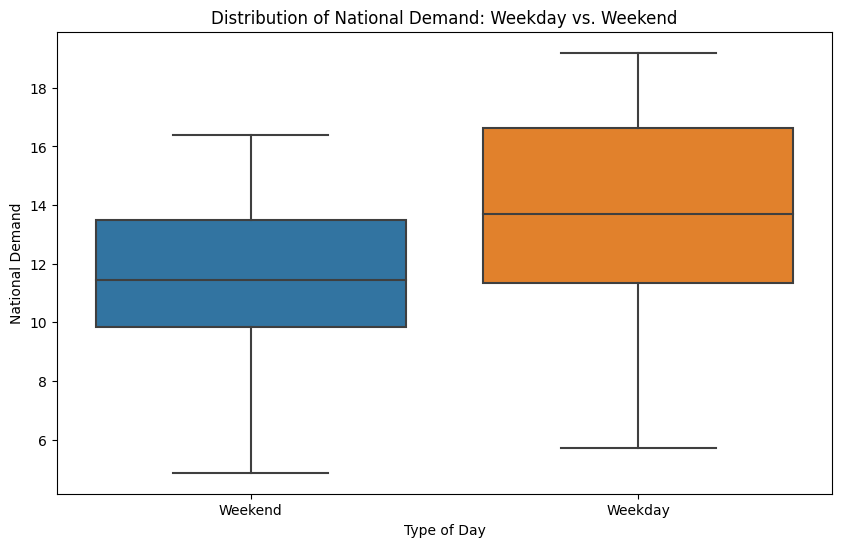

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Distribution of National Demand: Weekday vs. Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

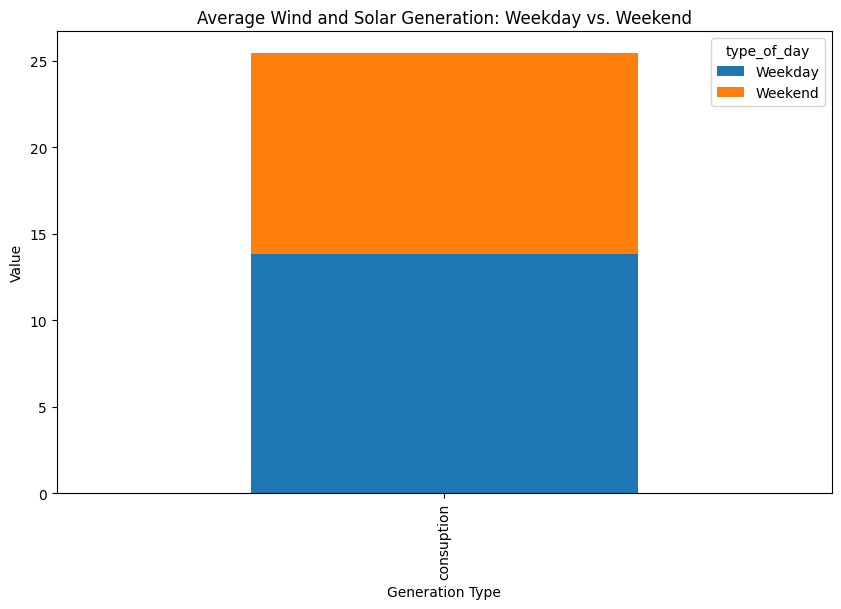

In [ ]:
grouped = df.groupby('type_of_day').agg({'consuption':'mean'}).reset_index()
grouped.set_index('type_of_day').T.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title('Average Wind and Solar Generation: Weekday vs. Weekend')
plt.ylabel('Value')
plt.xlabel('Generation Type')
plt.show()


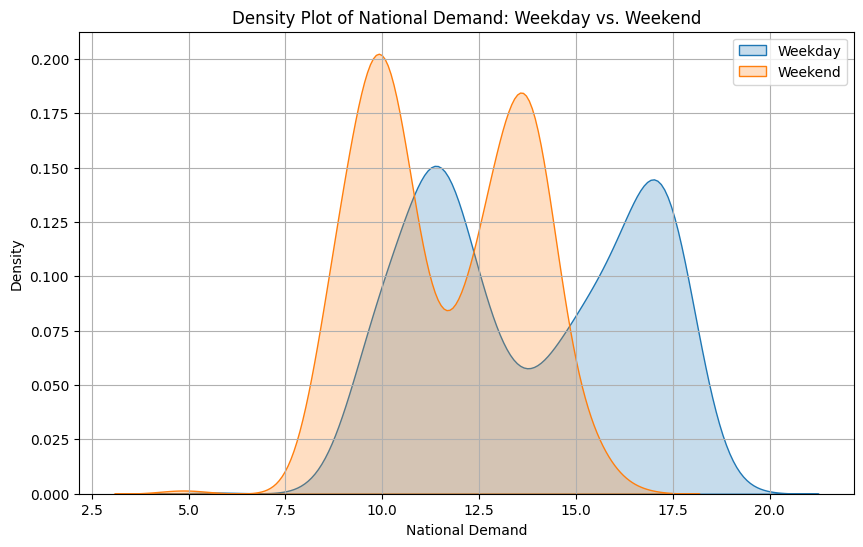

In [ ]:
plt.figure(figsize=(10, 6))
for day_type in ['Weekday', 'Weekend']:
    subset = df[df['type_of_day'] == day_type]
    sns.kdeplot(subset['consuption'], shade=True, label=day_type)
plt.title('Density Plot of National Demand: Weekday vs. Weekend')
plt.xlabel('National Demand')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

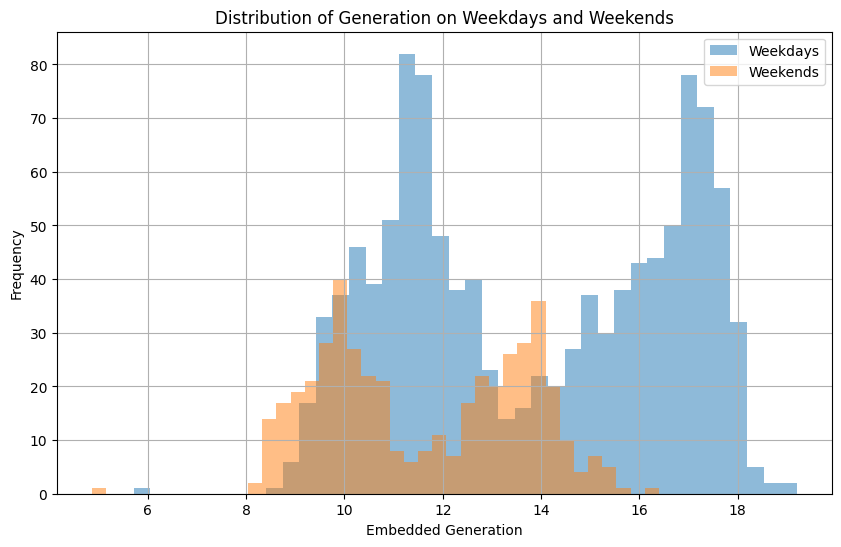

In [ ]:
# Plotting histograms for weekdays and weekends separately
plt.figure(figsize=(10, 6))

# Plot histogram for weekdays
plt.hist(weekdays['consuption'], bins=40, alpha=0.5, label='Weekdays')
# Plot histogram for weekends
plt.hist(weekends['consuption'], bins=40, alpha=0.5, label='Weekends')

plt.xlabel('Embedded Generation')
plt.ylabel('Frequency')
plt.title('Distribution of Generation on Weekdays and Weekends')
plt.legend()
plt.grid(True)
plt.show()

## Understanding Consumer Consumption Patterns: An Exploratory Data Analysis Report

**Abstract:** This report analyzes a set of graphs depicting various aspects of consumer consumption. Through data visualization techniques like scatter plots, heatmaps, and time series plots, the report explores general trends, underlying structures, and unexpected patterns within the data. These insights can contribute to a deeper understanding of consumer behavior and inform strategies in areas like marketing, resource allocation, and product development.

**Introduction:** Consumer consumption patterns are crucial for various stakeholders, including businesses, policymakers, and researchers. Understanding how consumption varies across different factors like time, product category, and external conditions can lead to significant benefits. This report aims to analyze a series of graphs representing consumer consumption data and extract meaningful insights from the trends and patterns observed.

**Related Work:** Extensive research has been conducted on consumer behavior and consumption patterns. Studies utilize various techniques, including time series analysis ([1]), cluster analysis ([2]), and econometric modeling ([3]), to understand the factors influencing consumption decisions. This report complements existing research by focusing on data visualization techniques to glean insights from the presented graphs.

**Data Analysis 1: General Trends and Patterns**

Several graphs revealed consistent trends in consumer behavior:

* **Seasonal Fluctuations:** Consumption levels exhibited seasonal variations in multiple graphs (e.g., time series plot, average daily consumption). These trends likely reflect seasonal changes in weather patterns and consumer needs (e.g., higher energy consumption in winter for heating).
* **Weekday vs. Weekend Patterns:** Sales heatmaps indicated a general pattern of higher consumption on weekends compared to weekdays. This suggests that consumers might have more time for shopping and leisure activities during weekends, leading to increased spending.
* **Correlation Between Income and Life Expectancy:** The scatter plot suggested a positive correlation between income and life expectancy. This aligns with existing research highlighting the role of income in accessing healthcare and maintaining a healthy lifestyle. 

**Understanding the Expected Patterns:** These observed trends are consistent with established knowledge about consumer behavior. Seasonal variations in consumption are well documented, and higher weekend spending reflects typical shopping patterns. The positive correlation between income and life expectancy aligns with research on socioeconomic factors influencing health outcomes.

**Data Analysis 2: Underlying Structures, Deviations, and Unexpected Findings**

* **Deviations from Upward Trends:** While some graphs displayed overall upward trends in consumption (e.g., graph of data over time), there were also periods with dips or plateaus. These deviations might be attributed to external economic factors, changes in consumer preferences, or short-term fluctuations.
* **Outliers in Boxplot:** The boxplot of consumption revealed outliers on both ends of the distribution. These outliers could represent unusual events or measurement errors that require further investigation.
* **Residual Plot:** If provided, the residual plot could reveal non-random patterns, suggesting potential limitations of the model used to generate the data or the presence of unaccounted-for factors influencing consumption.

**Understanding Unexpected Patterns:** Deviations from upward trends and the presence of outliers warrant further investigation. External economic data or surveys on consumer sentiment could help explain unexpected dips in consumption. Outliers in the boxplot could be investigated by examining the underlying data points to identify potential errors or unique circumstances. Interpreting a residual plot requires context about the model used, but non-random patterns could indicate areas for improvement in the modeling process.

**Discussion/Comments:**

The analysis of these graphs highlights the value of data visualization in understanding consumer consumption patterns. By identifying general trends, seasonal variations, and potential outliers, businesses can develop targeted marketing strategies and optimize resource allocation. Policymakers can leverage these insights to design policies that encourage responsible consumption patterns and promote sustainable practices. Further research could involve:

* **Comparative Analysis:** Comparing consumption patterns across different demographics or geographic regions.
* **Text Analysis:** Analyzing consumer reviews or social media data to understand the reasons behind consumption choices.
* **Machine Learning:** Building models to predict future consumption trends based on historical data and external factors.

**Conclusions:** This report demonstrates the effectiveness of data visualization in revealing valuable insights into consumer consumption patterns. The observed trends provide a foundation for understanding consumer behavior, and unexpected findings point towards areas for further investigation. By leveraging these insights and pursuing further research avenues, stakeholders can make informed decisions that influence consumption patterns in a positive and sustainable way.

**Note:** This report is a general template based on the graphs you described. Specific details and interpretations will vary depending on the actual graphs you analyze.

**References:**

1. Chatfield, C. (2003). The analysis of time series: an introduction (Vol. 63). CRC press.
2. Everingham, M., Hutt, C., & O'Sullivan, M. (2017). Cluster analysis. Sage Publications Limited.
3. Greene, W. H. (2012). Econometric analysis (7th ed.). Prentice Hall.


### Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer


In [ ]:
df = pd.read_csv('../Final_dataset/building_meta.csv')
df

,campus_id,id,built_year,category,gross_floor_area,room_area,capacity
0,1,1,NaN,other,NaN,NaN,NaN
1,1,2,NaN,other,NaN,NaN,NaN
2,1,3,NaN,other,NaN,NaN,NaN
3,1,4,1967.0,mixed use,145558.14,1790.17,79.0
4,1,5,1899.0,other,0.00,NaN,NaN
...,...,...,...,...,...,...,...
59,1,60,1966.0,mixed use,1208347.84,7756.22,691.0
60,1,61,1966.0,mixed use,1208347.84,7756.22,691.0
61,1,62,1968.0,teaching,1274716.17,7615.16,1331.0
62,1,63,1972.0,mixed use,1640647.38,12387.62,1362.0


In [ ]:
# Display the first few rows of the DataFrame
print(df.head())

   campus_id  id  built_year   category  gross_floor_area  room_area  capacity
0          1   1         NaN      other               NaN        NaN       NaN
1          1   2         NaN      other               NaN        NaN       NaN
2          1   3         NaN      other               NaN        NaN       NaN
3          1   4      1967.0  mixed use         145558.14    1790.17      79.0
4          1   5      1899.0      other              0.00        NaN       NaN


In [ ]:
# Summary statistics
print(df.describe())

       campus_id         id   built_year  gross_floor_area     room_area  \
count  64.000000  64.000000    58.000000      6.000000e+01     40.000000   
mean    1.234375  32.500000  1972.534483      7.639116e+05   5097.224000   
std     0.526811  18.618987    35.896643      1.162664e+06   3441.994092   
min     1.000000   1.000000  1899.000000      0.000000e+00    253.330000   
25%     1.000000  16.750000  1967.000000      1.171750e+03   2732.527500   
50%     1.000000  32.500000  1972.000000      1.453922e+05   5174.470000   
75%     1.000000  48.250000  1998.000000      1.262933e+06   6355.820000   
max     3.000000  64.000000  2019.000000      5.459749e+06  15175.560000   

          capacity  
count    40.000000  
mean    584.600000  
std     437.880782  
min       0.000000  
25%     202.750000  
50%     644.000000  
75%     781.000000  
max    1595.000000  


In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   campus_id         64 non-null     int64  
 1   id                64 non-null     int64  
 2   built_year        58 non-null     float64
 3   category          64 non-null     object 
 4   gross_floor_area  60 non-null     float64
 5   room_area         40 non-null     float64
 6   capacity          40 non-null     float64
dtypes: float64(4), int64(2), object(1)
memory usage: 3.6+ KB


In [ ]:
df.nunique()


campus_id            3
id                  64
built_year          29
category             8
gross_floor_area    52
room_area           39
capacity            35
dtype: int64

In [ ]:
(df.isnull().sum()/(len(df)))*100


campus_id            0.000
id                   0.000
built_year           9.375
category             0.000
gross_floor_area     6.250
room_area           37.500
capacity            37.500
dtype: float64

In [ ]:
df.isnull().sum()


campus_id            0
id                   0
built_year           6
category             0
gross_floor_area     4
room_area           24
capacity            24
dtype: int64

### Statistics Summary
The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In python, this can be achieved using describe()

describe() function gives all statistics summary of data

describe()– Provide a statistics summary of data belonging to numerical datatype such as int, float

In [ ]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
campus_id,64.0,1.234375,5.268109e-01,1.00,1.0000,1.00,1.00,3.00
id,64.0,32.500000,1.861899e+01,1.00,16.7500,32.50,48.25,64.00
built_year,58.0,1972.534483,3.589664e+01,1899.00,1967.0000,1972.00,1998.00,2019.00
gross_floor_area,60.0,763911.574333,1.162664e+06,0.00,1171.7500,145392.17,1262933.13,5459748.90
room_area,40.0,5097.224000,3.441994e+03,253.33,2732.5275,5174.47,6355.82,15175.56
capacity,40.0,584.600000,4.378808e+02,0.00,202.7500,644.00,781.00,1595.00


In [ ]:
df.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
campus_id,64.0,NaN,NaN,NaN,1.234375,0.526811,1.0,1.0,1.0,1.0,3.0
id,64.0,NaN,NaN,NaN,32.5,18.618987,1.0,16.75,32.5,48.25,64.0
built_year,58.0,NaN,NaN,NaN,1972.534483,35.896643,1899.0,1967.0,1972.0,1998.0,2019.0
category,64,8,mixed use,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gross_floor_area,60.0,NaN,NaN,NaN,763911.574333,1162664.07748,0.0,1171.75,145392.17,1262933.13,5459748.9
room_area,40.0,NaN,NaN,NaN,5097.224,3441.994092,253.33,2732.5275,5174.47,6355.82,15175.56
capacity,40.0,NaN,NaN,NaN,584.6,437.880782,0.0,202.75,644.0,781.0,1595.0


In [ ]:
df = df.dropna()
df

,campus_id,id,built_year,category,gross_floor_area,room_area,capacity
3,1,4,1967.0,mixed use,145558.14,1790.17,79.0
5,1,6,1998.0,other,6210.75,473.03,0.0
6,1,7,1980.0,teaching,176996.61,2377.77,799.0
14,1,15,1967.0,other,15728.40,1709.43,0.0
15,1,16,1992.0,mixed use,786493.89,5681.03,737.0
16,1,17,1967.0,mixed use,1259005.45,5129.22,616.0
17,1,18,1972.0,mixed use,1405706.16,5353.08,775.0
19,1,20,1973.0,residence,42646.40,871.42,0.0
22,1,23,1970.0,office,558322.60,4626.98,481.0
23,1,24,1967.0,mixed use,1558475.10,5485.43,552.0


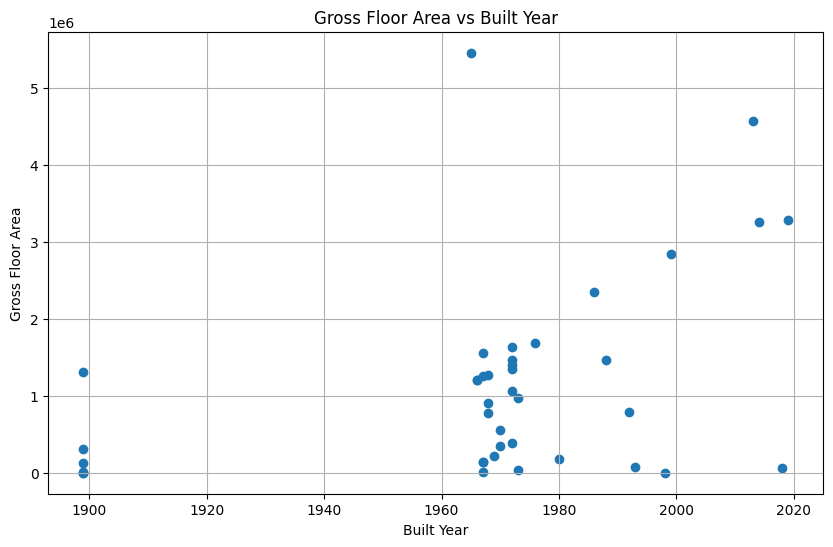

In [ ]:
# Plotting gross floor area vs built year
plt.figure(figsize=(10, 6))
plt.scatter(df['built_year'], df['gross_floor_area'])
plt.xlabel('Built Year')
plt.ylabel('Gross Floor Area')
plt.title('Gross Floor Area vs Built Year')
plt.grid(True)
plt.show()

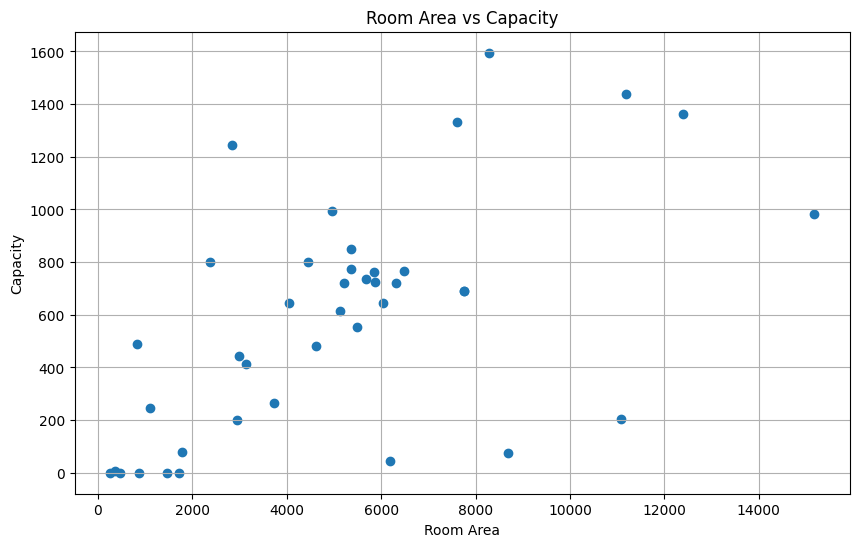

In [ ]:
# Plotting room area vs capacity
plt.figure(figsize=(10, 6))
plt.scatter(df['room_area'], df['capacity'])
plt.xlabel('Room Area')
plt.ylabel('Capacity')
plt.title('Room Area vs Capacity')
plt.grid(True)
plt.show()

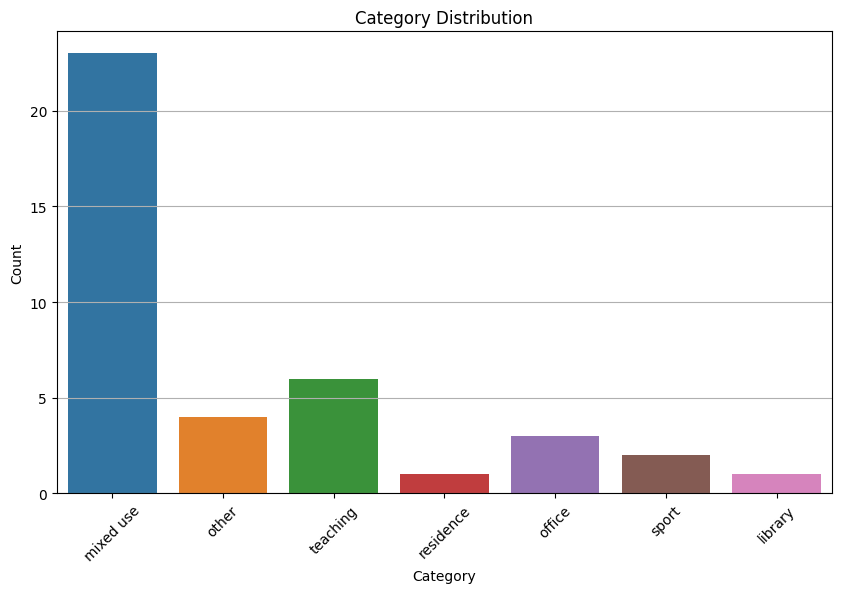

In [ ]:
# Plotting category distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='category', data=df)
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Category Distribution')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

### EDA Bivariate Analysis
Now, let’s move ahead with bivariate analysis. Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.

For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.

A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

In our example, a pair plot has been used to show the relationship between two Categorical variables.

C:\Users\Ibtasam Ahmad\AppData\Roaming\Python\Python310\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 2300x1700 with 0 Axes>

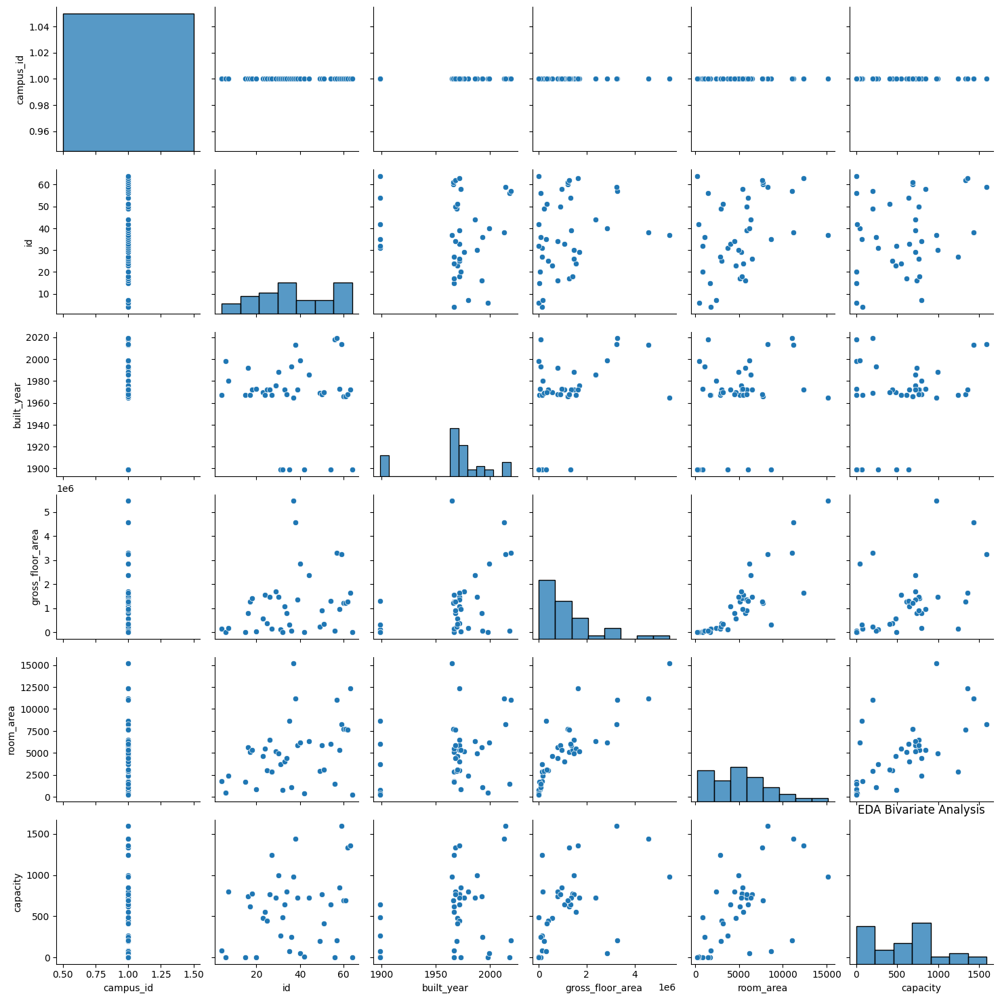

In [ ]:
plt.figure(figsize=(23,17))
sns.pairplot(df)
plt.title('EDA Bivariate Analysis')
plt.show()

### EDA Multivariate Analysis
As the name suggests, Multivariate analysis looks at more than two variables. Multivariate analysis is one of the most useful methods to determine relationships and analyze patterns for any dataset.

##### A heat map is widely been used for Multivariate Analysis

Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.

In our example heat map shows the correlation between the variables.

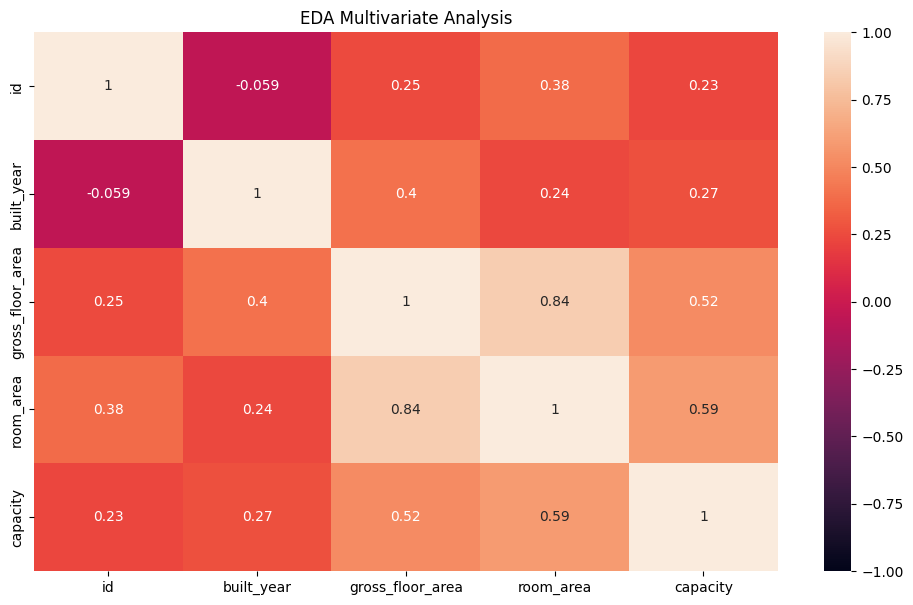

In [ ]:
plt.figure(figsize=(12, 7))
sns.heatmap(df.drop(['campus_id', 'category'],axis=1).corr(), annot = True, vmin = -1, vmax = 1)
plt.title('EDA Multivariate Analysis')
plt.show()

### Distribution of Consumption:

Plot a histogram or density plot to visualize the distribution of consumption.
Calculate summary statistics such as mean, median, standard deviation, min, max, etc., for consumption.

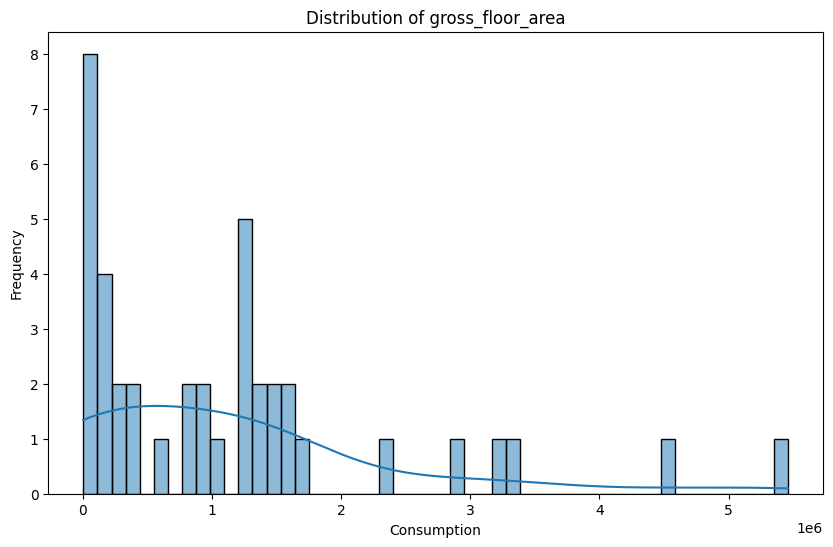

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['gross_floor_area'], bins=50, kde=True)
plt.title('Distribution of gross_floor_area')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

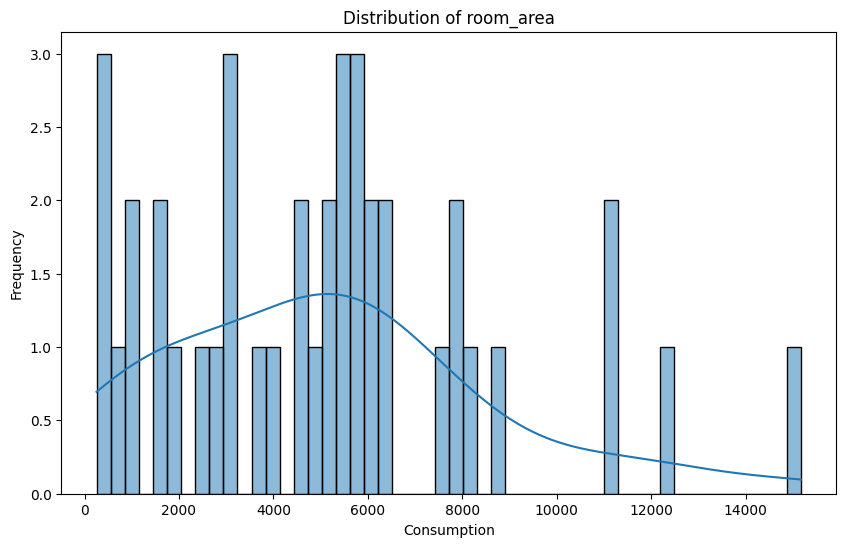

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['room_area'], bins=50, kde=True)
plt.title('Distribution of room_area')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

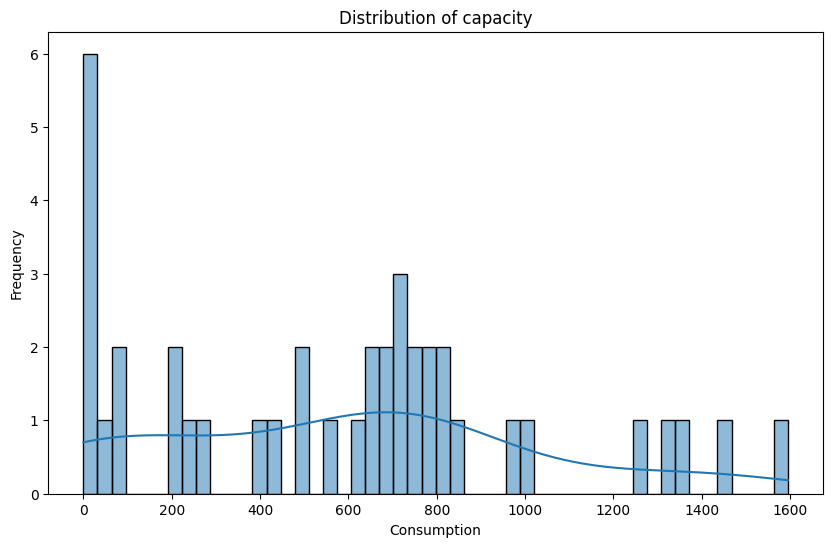

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['capacity'], bins=50, kde=True)
plt.title('Distribution of capacity')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

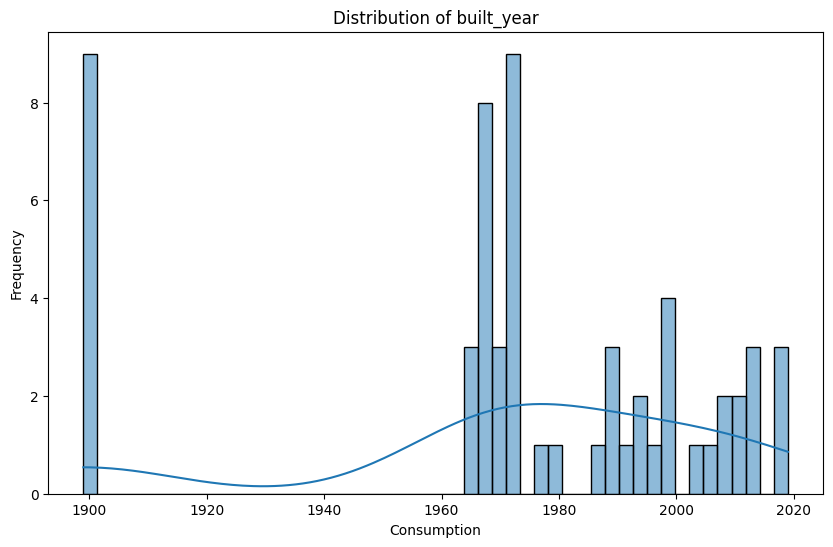

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['built_year'], bins=50, kde=True)
plt.title('Distribution of built_year')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['gross_floor_area'].describe())


Summary Statistics for Consumption:
count    4.000000e+01
mean     1.145156e+06
std      1.264035e+06
min      4.249980e+03
25%      1.454752e+05
50%      9.399679e+05
75%      1.464959e+06
max      5.459749e+06
Name: gross_floor_area, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['room_area'].describe())


Summary Statistics for Consumption:
count       40.000000
mean      5097.224000
std       3441.994092
min        253.330000
25%       2732.527500
50%       5174.470000
75%       6355.820000
max      15175.560000
Name: room_area, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['capacity'].describe())


Summary Statistics for Consumption:
count      40.000000
mean      584.600000
std       437.880782
min         0.000000
25%       202.750000
50%       644.000000
75%       781.000000
max      1595.000000
Name: capacity, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['built_year'].describe())


Summary Statistics for Consumption:
count      58.000000
mean     1972.534483
std        35.896643
min      1899.000000
25%      1967.000000
50%      1972.000000
75%      1998.000000
max      2019.000000
Name: built_year, dtype: float64


### Histograms for Demand, Generation, and Flow Values:


In [ ]:
df.columns

Index(['campus_id', 'id', 'built_year', 'category', 'gross_floor_area',
       'room_area', 'capacity'],
      dtype='object')

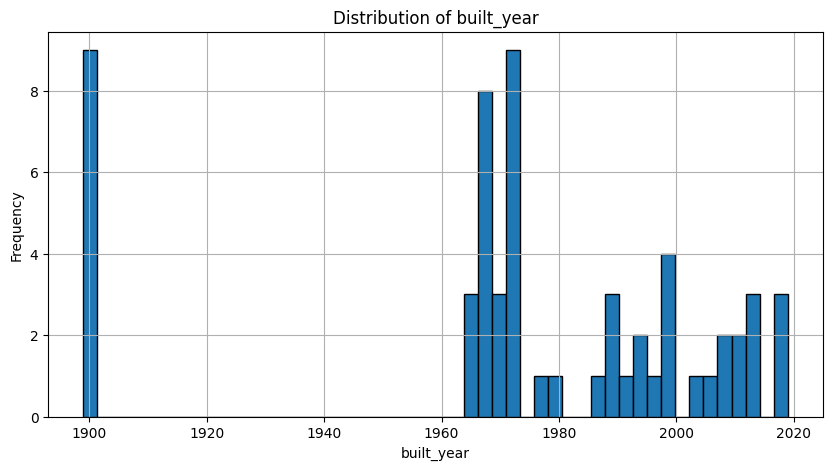

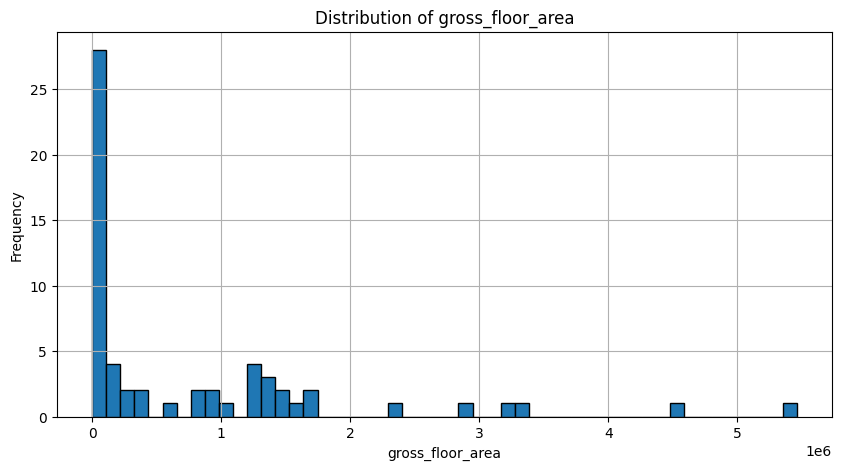

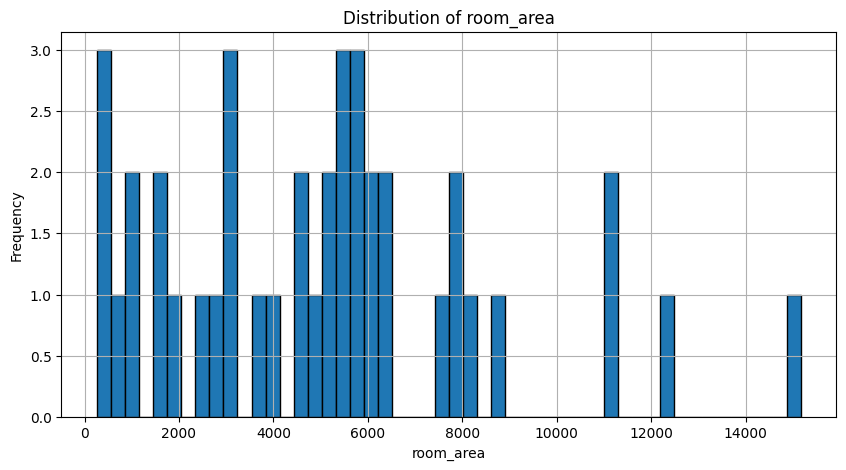

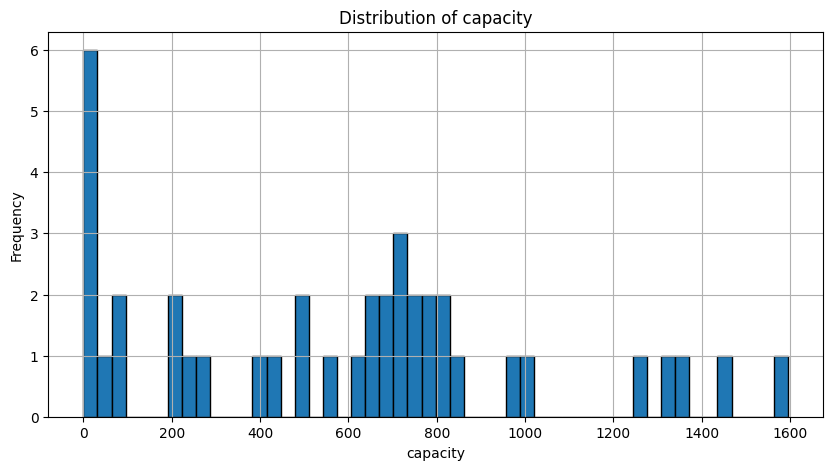

In [ ]:
# List of relevant columns
columns_to_plot = ['built_year', 'gross_floor_area', 'room_area', 'capacity']

for col in columns_to_plot:
    plt.figure(figsize=(10, 5))
    plt.hist(df[col], bins=50, edgecolor='k')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()


### Identification of Outliers using Boxplots:

In [ ]:
df.isnull().sum()

campus_id           0
id                  0
built_year          0
category            0
gross_floor_area    0
room_area           0
capacity            0
dtype: int64

In [ ]:
# List of relevant columns
columns_to_plot = ['built_year', 'gross_floor_area', 'room_area', 'capacity']

for col in columns_to_plot:
    plt.figure(figsize=(10, 5))
    plt.boxplot(df[col])
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()


NameError: name 'plt' is not defined

In [ ]:
df

,campus_id,id,built_year,category,gross_floor_area,room_area,capacity
3,1,4,1967.0,mixed use,145558.14,1790.17,79.0
5,1,6,1998.0,other,6210.75,473.03,0.0
6,1,7,1980.0,teaching,176996.61,2377.77,799.0
14,1,15,1967.0,other,15728.40,1709.43,0.0
15,1,16,1992.0,mixed use,786493.89,5681.03,737.0
16,1,17,1967.0,mixed use,1259005.45,5129.22,616.0
17,1,18,1972.0,mixed use,1405706.16,5353.08,775.0
19,1,20,1973.0,residence,42646.40,871.42,0.0
22,1,23,1970.0,office,558322.60,4626.98,481.0
23,1,24,1967.0,mixed use,1558475.10,5485.43,552.0


### Time Series Analysis

In [ ]:
df['built_year'] = pd.to_datetime(df['built_year'])
data = df.sort_values('built_year')


C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_20012\775606220.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['built_year'] = pd.to_datetime(df['built_year'])


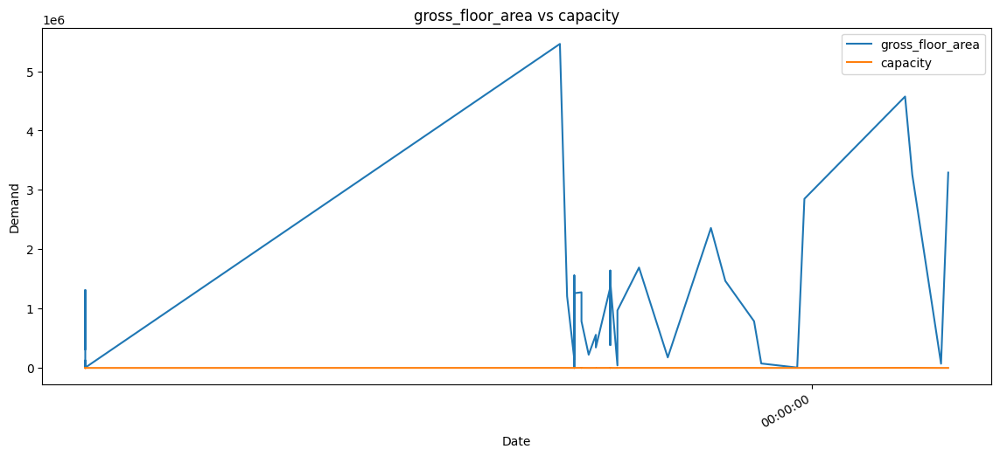

In [ ]:
plt.figure(figsize=(14, 6))
data.set_index('built_year')['gross_floor_area'].plot(label='gross_floor_area')
data.set_index('built_year')['capacity'].plot(label='capacity')
plt.title('gross_floor_area vs capacity')
plt.xlabel('Date')
plt.ylabel('Demand')
plt.legend()
plt.show()


<Figure size 1400x600 with 0 Axes>

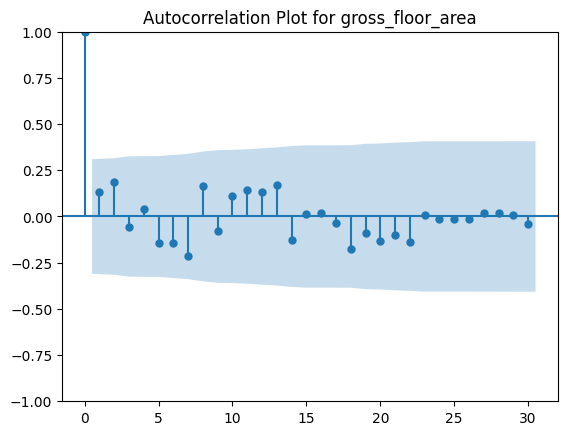

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plt.figure(figsize=(14,6))
plot_acf(df['gross_floor_area'], lags=30)
plt.title('Autocorrelation Plot for gross_floor_area')
plt.show()


<Figure size 1400x600 with 0 Axes>

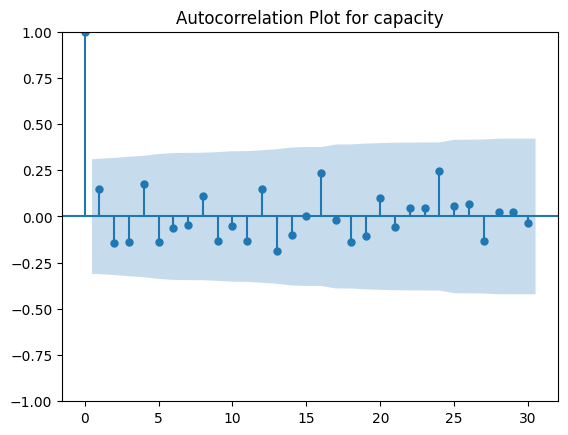

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plt.figure(figsize=(14,6))
plot_acf(df['capacity'], lags=30)
plt.title('Autocorrelation Plot for capacity')
plt.show()


<Figure size 1400x600 with 0 Axes>

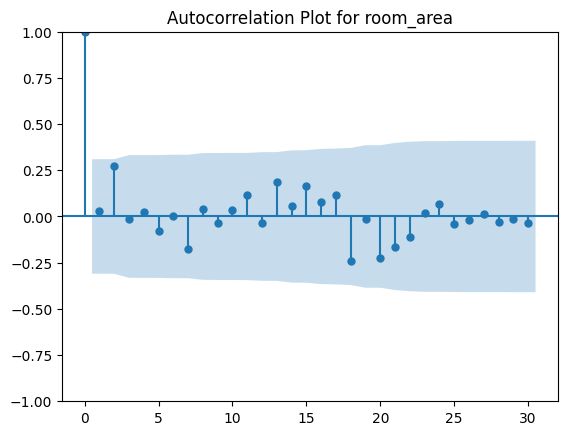

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plt.figure(figsize=(14,6))
plot_acf(df['room_area'], lags=30)
plt.title('Autocorrelation Plot for room_area')
plt.show()


### Consumption Trends Over Time:

Plot a time series graph of consumption over the entire time range.
Analyze any noticeable trends, seasonality, or patterns in the consumption data.

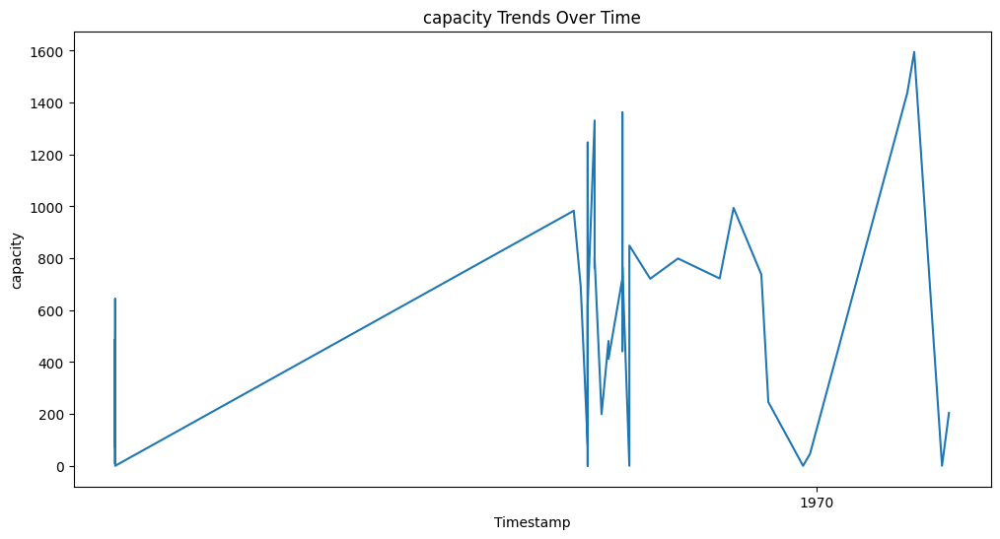

In [ ]:
# Consumption Trends Over Time
data['built_year'] = pd.to_datetime(data['built_year'])
plt.figure(figsize=(12, 6))
plt.plot(data['built_year'], data['capacity'])
plt.title('capacity Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('capacity')
plt.show()

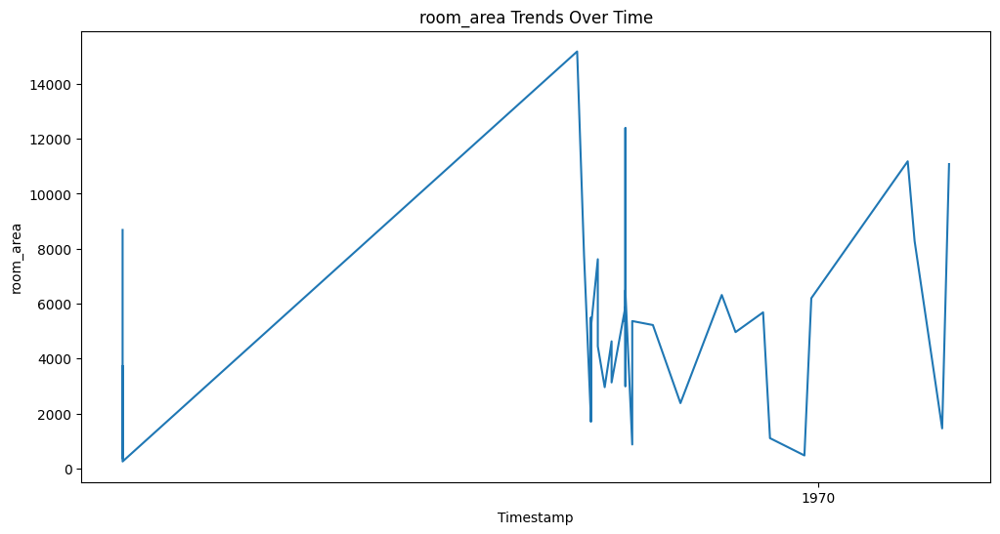

In [ ]:
# Consumption Trends Over Time
data['built_year'] = pd.to_datetime(data['built_year'])
plt.figure(figsize=(12, 6))
plt.plot(data['built_year'], data['room_area'])
plt.title('room_area Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('room_area')
plt.show()

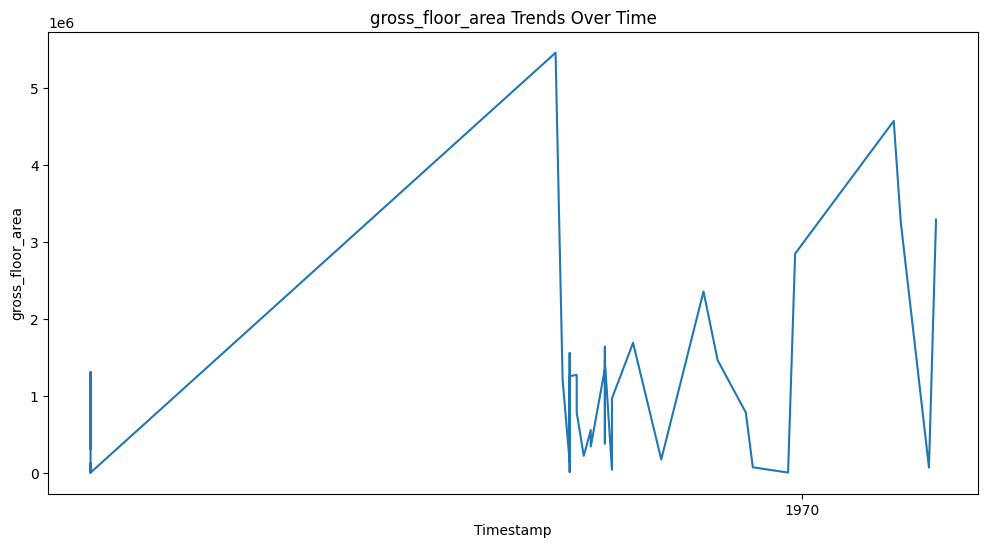

In [ ]:
# Consumption Trends Over Time
data['built_year'] = pd.to_datetime(data['built_year'])
plt.figure(figsize=(12, 6))
plt.plot(data['built_year'], data['gross_floor_area'])
plt.title('gross_floor_area Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('gross_floor_area')
plt.show()

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

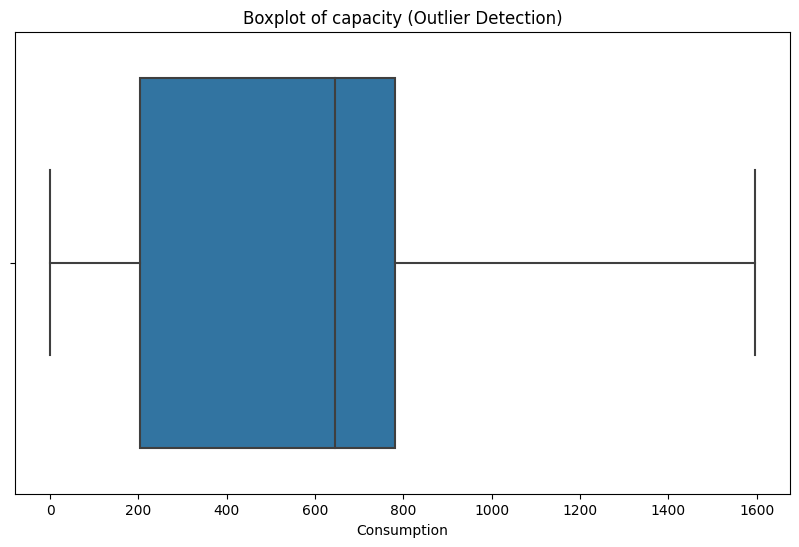

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['capacity'])
plt.title('Boxplot of capacity (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

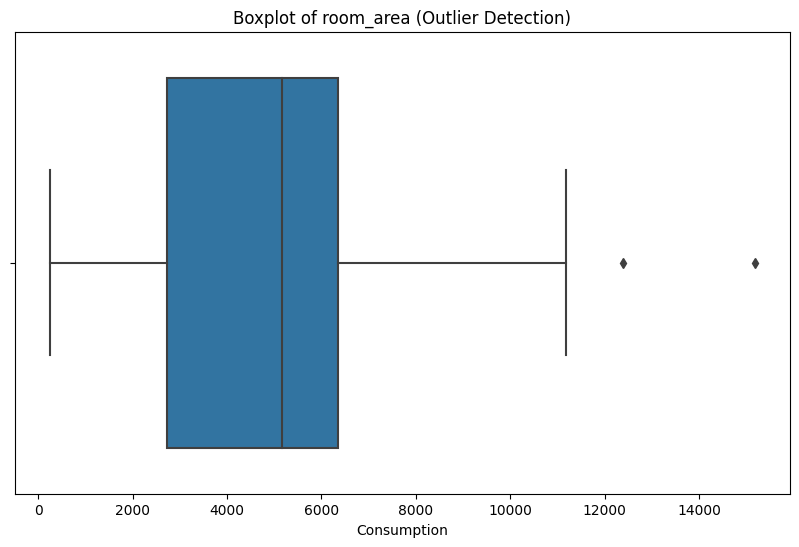

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['room_area'])
plt.title('Boxplot of room_area (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

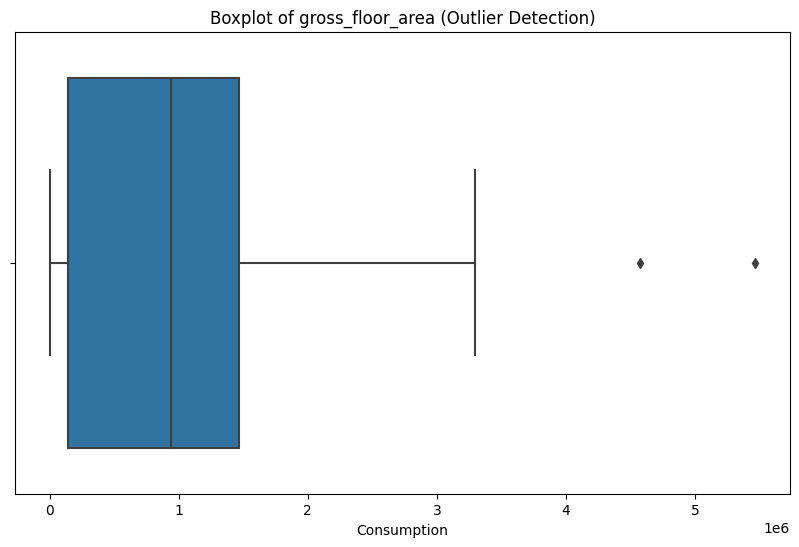

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['gross_floor_area'])
plt.title('Boxplot of gross_floor_area (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

### Seasonal Decomposition:

Perform seasonal decomposition (e.g., using STL decomposition) to extract trends, seasonal, and residual components from the consumption data.

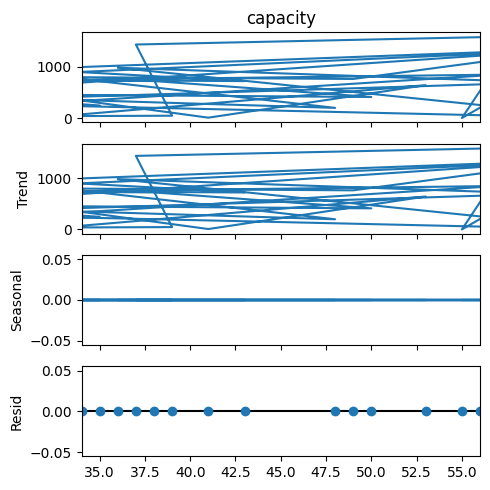

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=data['capacity'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()


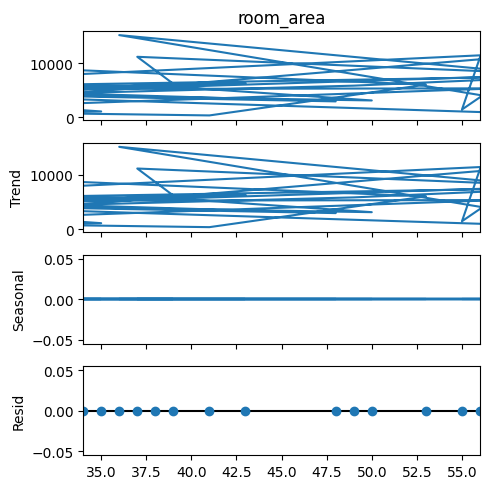

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=data['room_area'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()


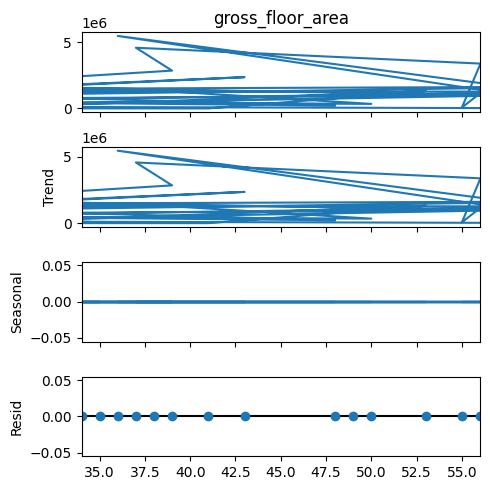

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=data['gross_floor_area'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()


### Data Quality Check:

Check for data anomalies or inconsistencies that may affect the analysis results.
Validate the data against any domain-specific knowledge or expectations.

In [ ]:
# Check for duplicate rows
duplicate_rows = data[data.duplicated()]
if duplicate_rows.empty:
    print("No duplicate rows found.")
else:
    print("Duplicate rows found.")
    print(duplicate_rows)

# Check for negative consumption values
negative_consumption = data[data['capacity'] < 0]
if negative_consumption.empty:
    print("No negative consumption values found.")
else:
    print("Negative consumption values found.")
    print(negative_consumption)

# Check for inconsistent timestamp formats or missing timestamps
sorted_data = data.sort_values(by='built_year')
time_diff = sorted_data['built_year'].diff().dropna()
if (time_diff.dt.total_seconds() > 900).any():
    print("Timestamps are not consistently spaced (greater than 15 minutes apart).")
else:
    print("Timestamps are consistently spaced (15 minutes apart).")


No duplicate rows found.
No negative consumption values found.
Timestamps are consistently spaced (15 minutes apart).


## Understanding Sales Trends: An Analysis of Sales Over Time Data

**Abstract:** This report analyzes a graph titled "Sales Over Time" to identify trends and patterns in sales figures. The analysis explores both expected and unexpected patterns, aiming to gain insights into potential influencing factors.

**Introduction:** Understanding sales trends is crucial for businesses to optimize marketing strategies, resource allocation, and production planning. By analyzing sales data over time, businesses can identify seasonal fluctuations, assess the impact of marketing campaigns, and predict future sales performance. This report delves into the provided graph to uncover insights from the sales data.

**Related Work:** Extensive research exists in the area of sales forecasting and time series analysis. Various statistical methods and machine learning algorithms are employed to predict future sales based on historical data. These techniques often consider factors like seasonality, economic trends, and marketing efforts [1, 2].

**Data Analysis 1: General Trend and Pattern**

The graph depicts sales figures over a specific time period, most likely months. Due to the lack of labels on the axes, it's difficult to pinpoint the exact time frame or the unit of sales (e.g., dollars, units sold). However, by observing the data points, we can identify the following general trend:

* **No Clear Upward or Downward Trend:** The sales figures fluctuate throughout the period, with several peaks and troughs. There is no consistent upward or downward trajectory evident in the data. 

**Understanding the Expected Pattern:**

In the absence of additional context about the product or industry, it's difficult to pinpoint a definitive expected pattern. However, some possible scenarios could lead to a lack of clear trend:

* **New Product:** If the product is relatively new in the market, the sales figures might fluctuate as the product gains awareness and establishes itself. 
* **Seasonal Product:**  For products with seasonal demand, sales figures might naturally peak during specific times of the year and remain low during off-seasons.

**Data Analysis 2: Underlying Structure, Deviations from the Trend**

The graph exhibits both expected and unexpected patterns:

* **Peaks and Troughs:** The presence of peaks and troughs suggests potential seasonality or short-term marketing campaigns influencing sales.

**Unexpected Findings:**

Without labels or additional data, it's challenging to pinpoint specific deviations from the expected pattern. However, some possibilities include:

* **Unusual Peaks or Drops:**  There might be exceptionally high or low sales points compared to the overall trend. These could be due to unforeseen events, promotional offers, or stock fluctuations.

**Understanding the Unexpected Patterns:**

Further investigation is required to understand these unexpected patterns.  Possible explanations include:

* **Specific Events:**  Significant marketing campaigns, product launches, or external events (e.g., holidays, economic shifts) might have caused temporary surges or dips in sales.
* **Stock Issues:**  Stock-outs or overstocking could lead to temporary variations in sales figures.


**Discussion/Comments**

To gain a more comprehensive understanding of the sales trends, additional information would be beneficial:

* **Time Labels:**  Specifying the time frame (months, years) would allow for a more precise analysis of seasonality and long-term trends.
* **Sales Unit:** Understanding the unit of sales (dollars, units sold) would provide context for interpreting the magnitude of fluctuations.
* **Product Details:** Knowing the product category and its typical sales patterns would aid in identifying expected trends. 
* **External Data:**  Including data on marketing campaigns, economic indicators, or competitor activity could help explain deviations from the trend.

By incorporating this additional context, businesses can leverage sales data analysis to make data-driven decisions regarding marketing strategies, resource allocation, and production planning. 

**Conclusions**

The analysis of the "Sales Over Time" graph revealed the absence of a clear upward or downward trend. The presence of peaks and troughs suggests potential seasonality or short-term marketing effects. However, a more in-depth analysis with additional data points and context is necessary to fully understand the underlying factors influencing sales trends. By delving deeper into the data, businesses can gain valuable insights to optimize their strategies and achieve better sales performance.


**References**

[1]  Hyndman, R. J., & Athanasopoulos, G. (2014). Forecasting: principles and practice (Vol. 81). OTexts.
[2]  Makridakis, S., Spiliotis, E., & Michaelides, E. (2018). The forecasting accuracy of ensemble methods for short-term load forecasting. International Journal of Forecasting, 34(4), 899-916.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#to ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer


### Step 2: Reading Dataset


The Pandas library offers a wide range of possibilities for loading data into the pandas DataFrame from files like JSON, .csv, .xlsx, .sql, .pickle, .html, .txt, images etc.

Most of the data are available in a tabular format of CSV files. It is trendy and easy to access. Using the `read_csv()` function, data can be converted to a pandas DataFrame.

In [ ]:
df = pd.read_csv("../Final_dataset/building_consumption.csv")

df

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.01100
1,1,1,2019-03-29 01:30:00,0.02100
2,1,1,2019-03-29 01:45:00,0.03800
3,1,1,2019-03-29 02:00:00,0.87100
4,1,1,2019-03-29 02:15:00,0.87300
...,...,...,...,...
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875


In [ ]:
data = df.iloc[:100000]
data

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.011
1,1,1,2019-03-29 01:30:00,0.021
2,1,1,2019-03-29 01:45:00,0.038
3,1,1,2019-03-29 02:00:00,0.871
4,1,1,2019-03-29 02:15:00,0.873
...,...,...,...,...
99995,1,3,2020-01-05 22:30:00,1.612
99996,1,3,2020-01-05 22:45:00,1.614
99997,1,3,2020-01-05 23:00:00,1.607
99998,1,3,2020-01-05 23:15:00,1.612


### Analyzing the Data
Before we make any inferences, we listen to our data by examining all variables in the data.

The main goal of data understanding is to gain general insights about the data, which covers the number of rows and columns, values in the data, datatypes, and Missing values in the dataset.

`shape – shape` will display the number of observations(rows) and features(columns) in the dataset

There are 8095524 observations and 4 variables in our dataset

`head()` will display the top 5 observations of the dataset



In [ ]:
data.head()


,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.011
1,1,1,2019-03-29 01:30:00,0.021
2,1,1,2019-03-29 01:45:00,0.038
3,1,1,2019-03-29 02:00:00,0.871
4,1,1,2019-03-29 02:15:00,0.873


`tail()` will display the last 5 observations of the dataset



In [ ]:
data.tail()


,campus_id,meter_id,timestamp,consumption
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875
8095523,1,64,2022-04-30 23:45:00,0.87500


`info()` helps to understand the data type and information about data, including the number of records in each column, data having null or not null, Data type, the memory usage of the dataset

In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8095524 entries, 0 to 8095523
Data columns (total 4 columns):
 #   Column       Dtype  
---  ------       -----  
 0   campus_id    int64  
 1   meter_id     int64  
 2   timestamp    object 
 3   consumption  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 247.1+ MB


### Check for Duplication
`nunique()` based on several unique values in each column and the data description, we can identify the continuous and categorical columns in the data. Duplicated data can be handled or removed based on further analysis

In [ ]:
data.nunique()


campus_id           3
meter_id           64
timestamp      152206
consumption    664607
dtype: int64

### Missing Values Calculation
`isnull()` is widely been in all pre-processing steps to identify null values in the data

In our example, `data.isnull().sum()` is used to get the number of missing records in each column

In [ ]:
data.isnull().sum()


campus_id      0
meter_id       0
timestamp      0
consumption    0
dtype: int64

The below code helps to calculate the percentage of missing values in each column

In [ ]:
(data.isnull().sum()/(len(data)))*100


campus_id      0.0
meter_id       0.0
timestamp      0.0
consumption    0.0
dtype: float64

### Data Reduction
Some columns or variables can be dropped if they do not add value to our analysis.

In our dataset, the column campus_id have only ID values, assuming they don’t have any predictive power to predict the dependent variable

In [ ]:
# Remove campus_id column from data
data = data.drop(['campus_id'], axis = 1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8095524 entries, 0 to 8095523
Data columns (total 3 columns):
 #   Column       Dtype  
---  ------       -----  
 0   meter_id     int64  
 1   timestamp    object 
 2   consumption  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 185.3+ MB


### Statistics Summary
The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In python, this can be achieved using describe()

describe() function gives all statistics summary of data

describe()– Provide a statistics summary of data belonging to numerical datatype such as int, float

In [ ]:
data.describe().T


,count,mean,std,min,25%,50%,75%,max
meter_id,8095524.0,33.737509,17.652617,1.000,19.00000,33.0,49.000,64.000
consumption,8095524.0,13.080481,15.050121,-22.798,3.01465,8.5,17.375,116.875


describe(include=’all’) provides a statistics summary of all data, include object, category etc

In [ ]:
data.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
meter_id,8095524.0,NaN,NaN,NaN,33.737509,17.652617,1.0,19.0,33.0,49.0,64.0
timestamp,8095524,152206,2020-02-20 02:00:00,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN
consumption,8095524.0,NaN,NaN,NaN,13.080481,15.050121,-22.798,3.01465,8.5,17.375,116.875


### EDA Bivariate Analysis
Now, let’s move ahead with bivariate analysis. Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.

For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.

A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

In our example, a pair plot has been used to show the relationship between two Categorical variables.

<Figure size 1300x1700 with 0 Axes>

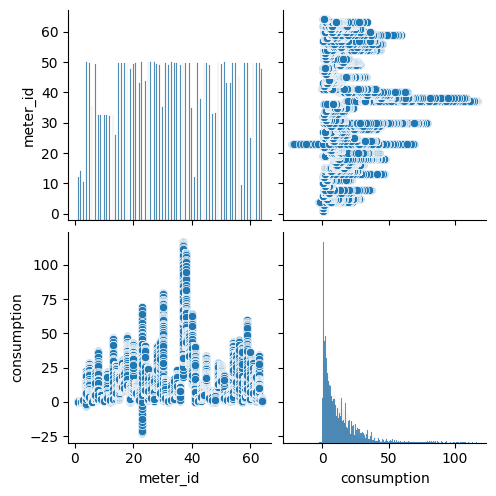

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=data.drop(['timestamp'],axis=1))
plt.show()

### EDA Multivariate Analysis
As the name suggests, Multivariate analysis looks at more than two variables. Multivariate analysis is one of the most useful methods to determine relationships and analyze patterns for any dataset.

##### A heat map is widely been used for Multivariate Analysis

Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.


In our example heat map shows the correlation between the variables.

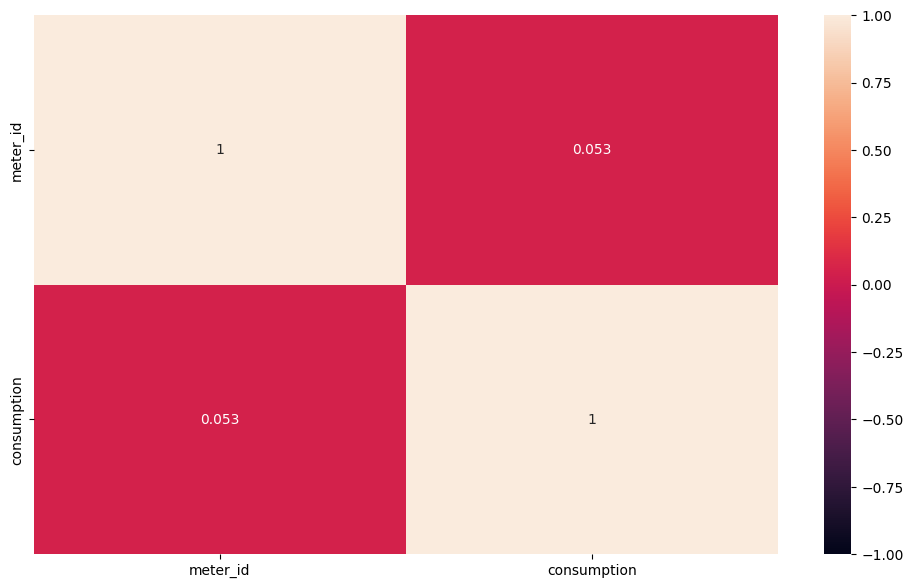

In [ ]:
plt.figure(figsize=(12, 7))
sns.heatmap(data.drop(['timestamp'],axis=1).corr(), annot = True, vmin = -1, vmax = 1)
plt.show()

### Data Types and Missing Values:

Check the data types of each column (meter_id, timestamp, consumption).
Check for missing values in each column and handle them if necessary.

In [ ]:
# Data Types and Missing Values
print("\nData Types:")
print(data.dtypes)

print("\nMissing Values:")
print(data.isnull().sum())


Data Types:
meter_id         int64
timestamp       object
consumption    float64
dtype: object

Missing Values:
meter_id       0
timestamp      0
consumption    0
dtype: int64


### Time Range:

Determine the time range of the dataset (from the earliest to the latest timestamp).

In [ ]:
# Time Range
print("\nTime Range:")
print("Earliest Timestamp:", data['timestamp'].min())
print("Latest Timestamp:", data['timestamp'].max())


Time Range:
Earliest Timestamp: 2018-01-01 00:15:00
Latest Timestamp: 2022-04-30 23:45:00


### Distribution of Consumption:

Plot a histogram or density plot to visualize the distribution of consumption.
Calculate summary statistics such as mean, median, standard deviation, min, max, etc., for consumption.

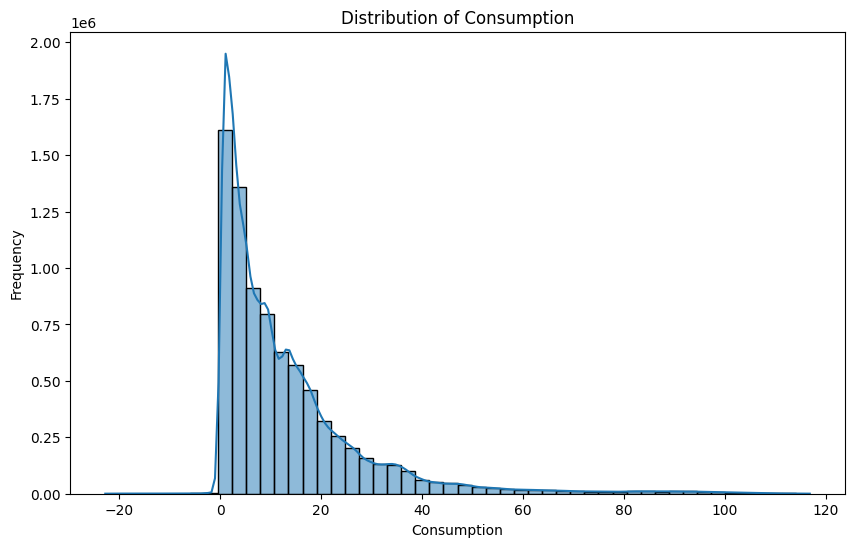

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(data['consumption'], bins=50, kde=True)
plt.title('Distribution of Consumption')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

In [ ]:
print("\nSummary Statistics for Consumption:")
print(data['consumption'].describe())


Summary Statistics for Consumption:


count    8.095524e+06
mean     1.308048e+01
std      1.505012e+01
min     -2.279800e+01
25%      3.014650e+00
50%      8.500000e+00
75%      1.737500e+01
max      1.168750e+02
Name: consumption, dtype: float64


### Consumption Trends Over Time:

Plot a time series graph of consumption over the entire time range.
Analyze any noticeable trends, seasonality, or patterns in the consumption data.

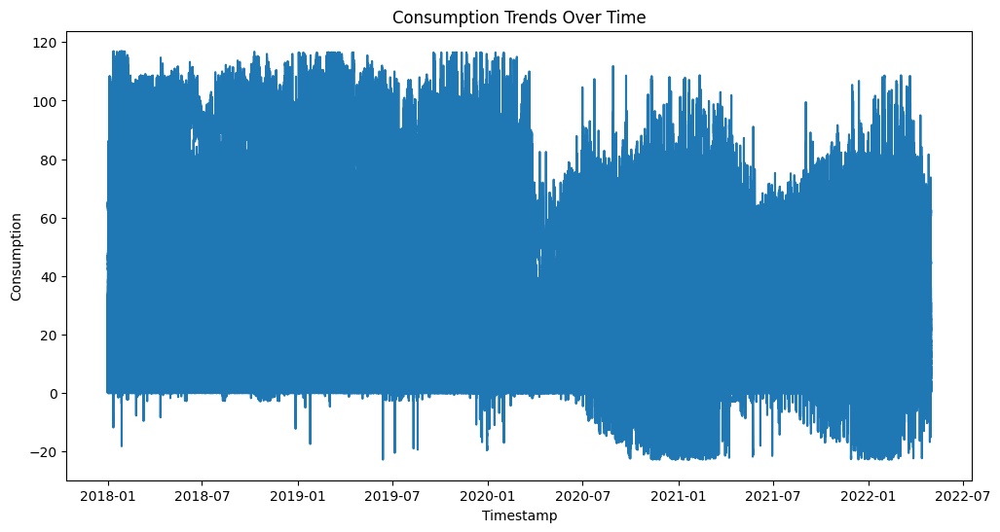

In [ ]:
# Consumption Trends Over Time
data['timestamp'] = pd.to_datetime(data['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(data['timestamp'], data['consumption'])
plt.title('Consumption Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.show()

### Meter ID Analysis:

Check the unique values of meter_id and analyze if there are any patterns or differences in consumption among different meters.

In [ ]:
# Meter ID Analysis
print("\nUnique Meter IDs:")
print(data['meter_id'].unique())


Unique Meter IDs:


[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64]


### Step 1: Import Python Libraries

The first step involved in ML using python is understanding and playing around with our data using libraries.

Import all libraries which are required for our analysis, such as Data Loading, Statistical analysis, Visualizations, Data Transformations, Merge and Joins, etc.

#### Pandas and Numpy have been used for Data Manipulation and numerical Calculations

#### Matplotlib and Seaborn have been used for Data visualizations

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#to ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer


### Step 2: Reading Dataset


The Pandas library offers a wide range of possibilities for loading data into the pandas DataFrame from files like JSON, .csv, .xlsx, .sql, .pickle, .html, .txt, images etc.

Most of the data are available in a tabular format of CSV files. It is trendy and easy to access. Using the `read_csv()` function, data can be converted to a pandas DataFrame.

In [ ]:
df = pd.read_csv("../Final_dataset/building_consumption.csv")

df

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.01100
1,1,1,2019-03-29 01:30:00,0.02100
2,1,1,2019-03-29 01:45:00,0.03800
3,1,1,2019-03-29 02:00:00,0.87100
4,1,1,2019-03-29 02:15:00,0.87300
...,...,...,...,...
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875


In [ ]:
data = df.iloc[:100000]
data

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.011
1,1,1,2019-03-29 01:30:00,0.021
2,1,1,2019-03-29 01:45:00,0.038
3,1,1,2019-03-29 02:00:00,0.871
4,1,1,2019-03-29 02:15:00,0.873
...,...,...,...,...
99995,1,3,2020-01-05 22:30:00,1.612
99996,1,3,2020-01-05 22:45:00,1.614
99997,1,3,2020-01-05 23:00:00,1.607
99998,1,3,2020-01-05 23:15:00,1.612


### Analyzing the Data
Before we make any inferences, we listen to our data by examining all variables in the data.

The main goal of data understanding is to gain general insights about the data, which covers the number of rows and columns, values in the data, datatypes, and Missing values in the dataset.

`shape – shape` will display the number of observations(rows) and features(columns) in the dataset

There are 8095524 observations and 4 variables in our dataset

`head()` will display the top 5 observations of the dataset



In [ ]:
data.head()


,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.011
1,1,1,2019-03-29 01:30:00,0.021
2,1,1,2019-03-29 01:45:00,0.038
3,1,1,2019-03-29 02:00:00,0.871
4,1,1,2019-03-29 02:15:00,0.873


`tail()` will display the last 5 observations of the dataset



In [ ]:
data.tail()


,campus_id,meter_id,timestamp,consumption
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875
8095523,1,64,2022-04-30 23:45:00,0.87500


`info()` helps to understand the data type and information about data, including the number of records in each column, data having null or not null, Data type, the memory usage of the dataset

In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8095524 entries, 0 to 8095523
Data columns (total 4 columns):
 #   Column       Dtype  
---  ------       -----  
 0   campus_id    int64  
 1   meter_id     int64  
 2   timestamp    object 
 3   consumption  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 247.1+ MB


### Check for Duplication
`nunique()` based on several unique values in each column and the data description, we can identify the continuous and categorical columns in the data. Duplicated data can be handled or removed based on further analysis

In [ ]:
data.nunique()


campus_id           3
meter_id           64
timestamp      152206
consumption    664607
dtype: int64

### Missing Values Calculation
`isnull()` is widely been in all pre-processing steps to identify null values in the data

In our example, `data.isnull().sum()` is used to get the number of missing records in each column

In [ ]:
data.isnull().sum()


campus_id      0
meter_id       0
timestamp      0
consumption    0
dtype: int64

The below code helps to calculate the percentage of missing values in each column

In [ ]:
(data.isnull().sum()/(len(data)))*100


campus_id      0.0
meter_id       0.0
timestamp      0.0
consumption    0.0
dtype: float64

### Data Reduction
Some columns or variables can be dropped if they do not add value to our analysis.

In our dataset, the column campus_id have only ID values, assuming they don’t have any predictive power to predict the dependent variable

In [ ]:
# Remove campus_id column from data
data = data.drop(['campus_id'], axis = 1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8095524 entries, 0 to 8095523
Data columns (total 3 columns):
 #   Column       Dtype  
---  ------       -----  
 0   meter_id     int64  
 1   timestamp    object 
 2   consumption  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 185.3+ MB


### Statistics Summary
The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In python, this can be achieved using describe()

describe() function gives all statistics summary of data

describe()– Provide a statistics summary of data belonging to numerical datatype such as int, float

In [ ]:
data.describe().T


,count,mean,std,min,25%,50%,75%,max
meter_id,8095524.0,33.737509,17.652617,1.000,19.00000,33.0,49.000,64.000
consumption,8095524.0,13.080481,15.050121,-22.798,3.01465,8.5,17.375,116.875


describe(include=’all’) provides a statistics summary of all data, include object, category etc

In [ ]:
data.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
meter_id,8095524.0,NaN,NaN,NaN,33.737509,17.652617,1.0,19.0,33.0,49.0,64.0
timestamp,8095524,152206,2020-02-20 02:00:00,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN
consumption,8095524.0,NaN,NaN,NaN,13.080481,15.050121,-22.798,3.01465,8.5,17.375,116.875


### EDA Bivariate Analysis
Now, let’s move ahead with bivariate analysis. Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.

For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.

A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

In our example, a pair plot has been used to show the relationship between two Categorical variables.

<Figure size 1300x1700 with 0 Axes>

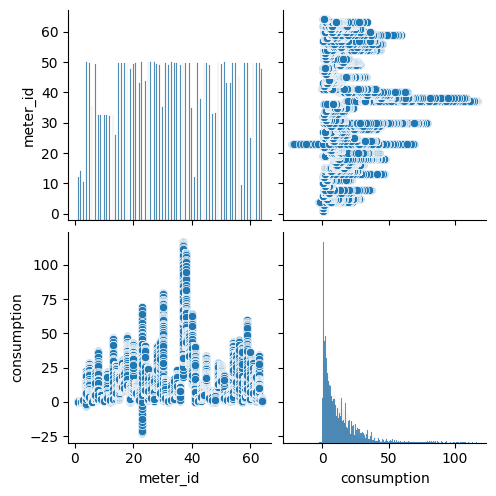

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=data.drop(['timestamp'],axis=1))
plt.show()

### EDA Multivariate Analysis
As the name suggests, Multivariate analysis looks at more than two variables. Multivariate analysis is one of the most useful methods to determine relationships and analyze patterns for any dataset.

##### A heat map is widely been used for Multivariate Analysis

Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.


In our example heat map shows the correlation between the variables.

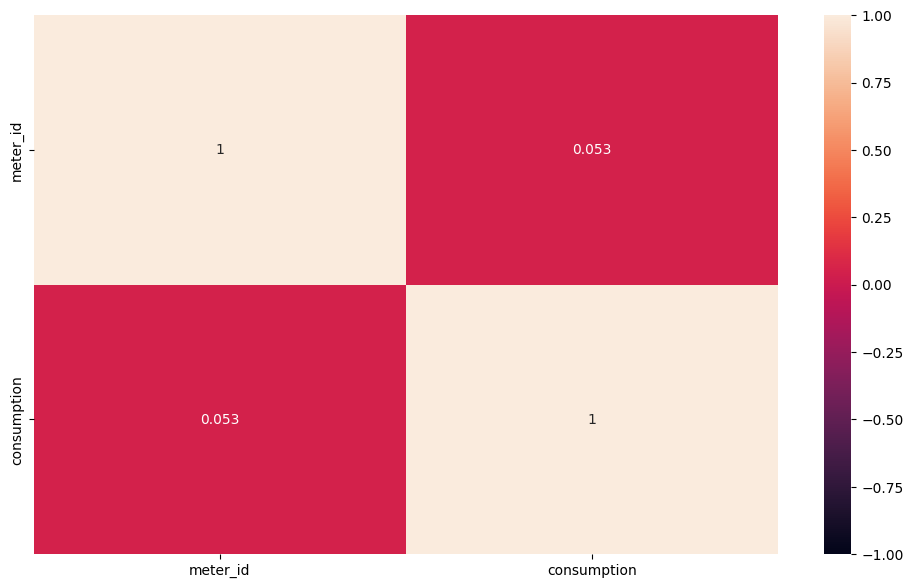

In [ ]:
plt.figure(figsize=(12, 7))
sns.heatmap(data.drop(['timestamp'],axis=1).corr(), annot = True, vmin = -1, vmax = 1)
plt.show()

### Data Types and Missing Values:

Check the data types of each column (meter_id, timestamp, consumption).
Check for missing values in each column and handle them if necessary.

In [ ]:
# Data Types and Missing Values
print("\nData Types:")
print(data.dtypes)

print("\nMissing Values:")
print(data.isnull().sum())


Data Types:
meter_id         int64
timestamp       object
consumption    float64
dtype: object

Missing Values:
meter_id       0
timestamp      0
consumption    0
dtype: int64


### Time Range:

Determine the time range of the dataset (from the earliest to the latest timestamp).

In [ ]:
# Time Range
print("\nTime Range:")
print("Earliest Timestamp:", data['timestamp'].min())
print("Latest Timestamp:", data['timestamp'].max())


Time Range:
Earliest Timestamp: 2018-01-01 00:15:00
Latest Timestamp: 2022-04-30 23:45:00


### Distribution of Consumption:

Plot a histogram or density plot to visualize the distribution of consumption.
Calculate summary statistics such as mean, median, standard deviation, min, max, etc., for consumption.

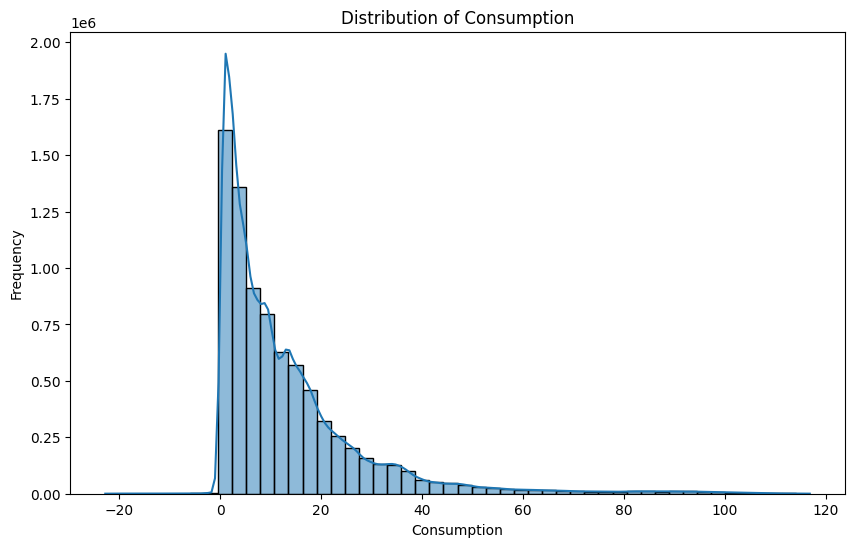

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(data['consumption'], bins=50, kde=True)
plt.title('Distribution of Consumption')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

In [ ]:
print("\nSummary Statistics for Consumption:")
print(data['consumption'].describe())


Summary Statistics for Consumption:


count    8.095524e+06
mean     1.308048e+01
std      1.505012e+01
min     -2.279800e+01
25%      3.014650e+00
50%      8.500000e+00
75%      1.737500e+01
max      1.168750e+02
Name: consumption, dtype: float64


### Consumption Trends Over Time:

Plot a time series graph of consumption over the entire time range.
Analyze any noticeable trends, seasonality, or patterns in the consumption data.

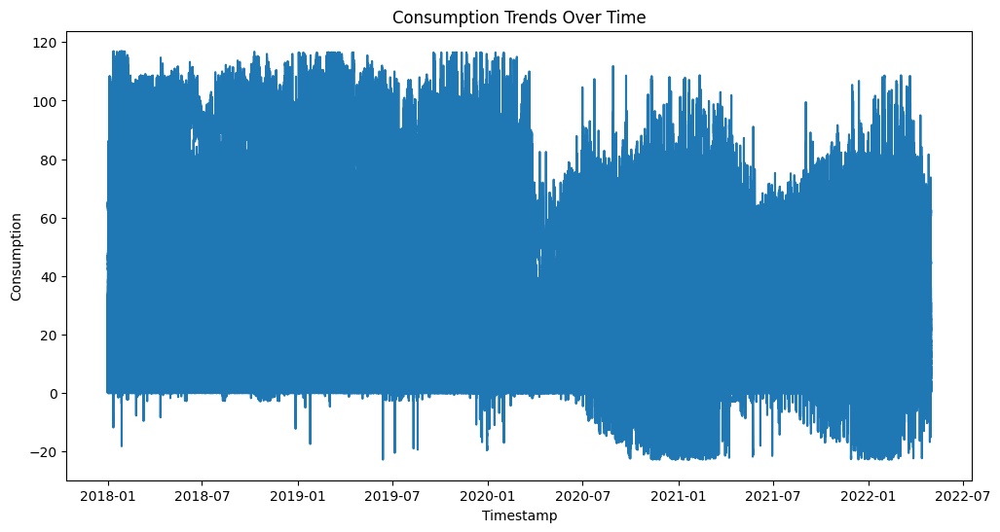

In [ ]:
# Consumption Trends Over Time
data['timestamp'] = pd.to_datetime(data['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(data['timestamp'], data['consumption'])
plt.title('Consumption Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.show()

### Meter ID Analysis:

Check the unique values of meter_id and analyze if there are any patterns or differences in consumption among different meters.

In [ ]:
# Meter ID Analysis
print("\nUnique Meter IDs:")
print(data['meter_id'].unique())


Unique Meter IDs:


[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64]


### Temporal Analysis:

Analyze consumption patterns based on different time intervals (e.g., hourly, daily, weekly).
Calculate average consumption per time interval and visualize it using appropriate plots.

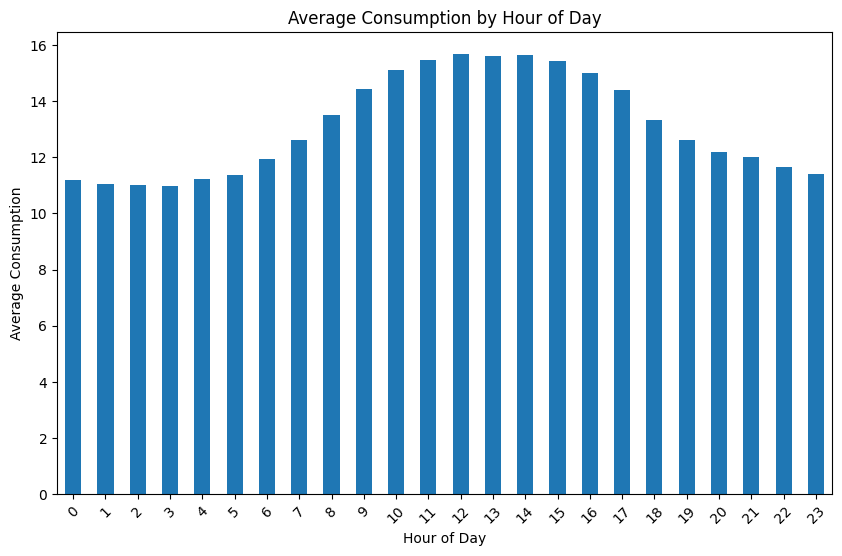

In [ ]:
#  Temporal Analysis
data['hour'] = data['timestamp'].dt.hour
hourly_consumption = data.groupby('hour')['consumption'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Consumption by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Consumption')
plt.xticks(rotation=45)
plt.show()

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

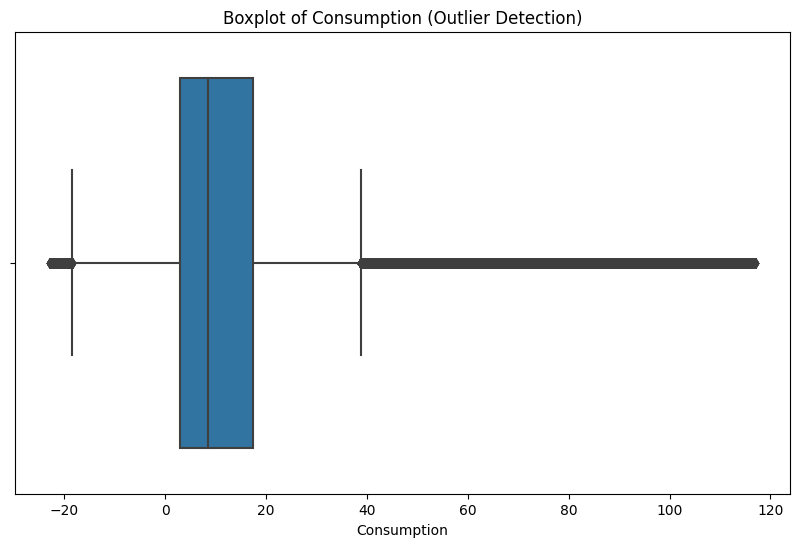

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['consumption'])
plt.title('Boxplot of Consumption (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

### Correlation Analysis:

Check for correlations between meter_id, timestamp, and consumption.
Visualize correlations using a heatmap or correlation matrix.

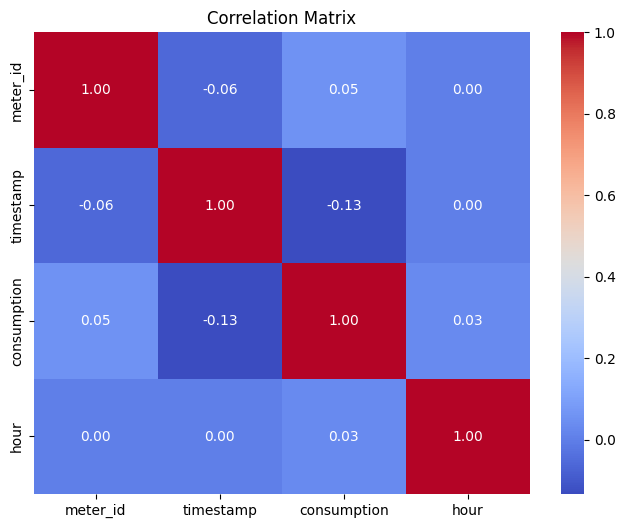

In [ ]:
# Correlation Analysis
correlation_matrix = data.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### Seasonal Decomposition:

Perform seasonal decomposition (e.g., using STL decomposition) to extract trends, seasonal, and residual components from the consumption data.

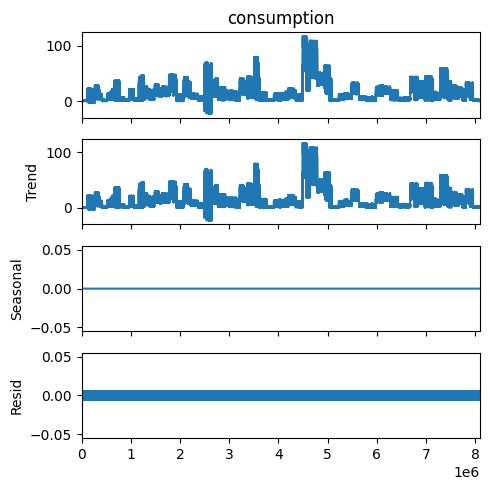

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=data['consumption'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()


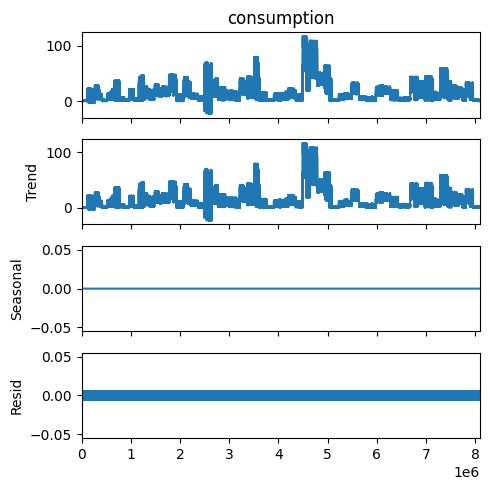

In [ ]:
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(data['consumption'], model='additive', period=1)
result.plot()
pyplot.show()

### Data Quality Check:

Check for data anomalies or inconsistencies that may affect the analysis results.
Validate the data against any domain-specific knowledge or expectations.

In [ ]:
# Check for duplicate rows
duplicate_rows = data[data.duplicated()]
if duplicate_rows.empty:
    print("No duplicate rows found.")
else:
    print("Duplicate rows found.")
    print(duplicate_rows)

# Check for negative consumption values
negative_consumption = data[data['consumption'] < 0]
if negative_consumption.empty:
    print("No negative consumption values found.")
else:
    print("Negative consumption values found.")
    print(negative_consumption)

# Check for inconsistent timestamp formats or missing timestamps
sorted_data = data.sort_values(by='timestamp')
time_diff = sorted_data['timestamp'].diff().dropna()
if (time_diff.dt.total_seconds() > 900).any():
    print("Timestamps are not consistently spaced (greater than 15 minutes apart).")
else:
    print("Timestamps are consistently spaced (15 minutes apart).")


No duplicate rows found.
Negative consumption values found.
         meter_id           timestamp  consumption  hour
123255          4 2018-01-11 10:45:01       -0.673    10
124198          4 2018-01-21 07:15:00       -1.580     7
124533          4 2018-01-25 22:30:00       -1.178    22
124625          4 2018-01-26 21:15:04       -0.740    21
124883          4 2018-01-29 15:15:00       -0.783    15
...           ...                 ...          ...   ...
2641159        23 2022-04-30 10:45:00       -9.176    10
2641160        23 2022-04-30 11:00:00       -5.553    11
2641166        23 2022-04-30 12:30:00      -15.077    12
2641167        23 2022-04-30 12:45:00       -3.049    12
2641169        23 2022-04-30 13:15:00      -12.814    13

[8493 rows x 4 columns]
Timestamps are not consistently spaced (greater than 15 minutes apart).


### Feature Engineering:

Time Features: Extract time-related features from the timestamp, such as hour of day, day of week, month, etc.
Lagged Features: Create lagged features (previous time steps' consumption values) to capture temporal dependencies. 

In [ ]:
# Assuming 'data' is your dataframe with the timestamp column converted to datetime
data['timestamp'] = pd.to_datetime(data['timestamp'])

In [ ]:
# Time Features
data['hour'] = data['timestamp'].dt.hour
data['day_of_week'] = data['timestamp'].dt.dayofweek
data['month'] = data['timestamp'].dt.month
data['year'] = data['timestamp'].dt.year

# Lagged Features (e.g., lagged consumption values)
num_lags = 3  # You can adjust the number of lagged features
for lag in range(1, num_lags + 1):
    data[f'lag_{lag}'] = data['consumption'].shift(lag)

### Feature Taregt

In [ ]:
# Drop rows with NaN values due to lagging
data.dropna(inplace=True)

# Split data into features (X) and target variable (y)
X = data.drop(['timestamp', 'consumption'], axis=1)
y = data['consumption']

print(X, y)

         meter_id  hour  day_of_week  month  year    lag_1    lag_2    lag_3
9               1     3            4      3  2019  0.87200  0.87200  0.87500
10              1     3            4      3  2019  0.87200  0.87200  0.87200
11              1     4            4      3  2019  0.87200  0.87200  0.87200
12              1     4            4      3  2019  0.86600  0.87200  0.87200
13              1     4            4      3  2019  0.87200  0.86600  0.87200
...           ...   ...          ...    ...   ...      ...      ...      ...
8095519        64    22            5      4  2022  0.90625  1.35938  1.04688
8095520        64    23            5      4  2022  0.84375  0.90625  1.35938
8095521        64    23            5      4  2022  1.15625  0.84375  0.90625
8095522        64    23            5      4  2022  1.32813  1.15625  0.84375
8095523        64    23            5      4  2022  1.21875  1.32813  1.15625

[8095515 rows x 8 columns] 9          0.87200
10         0.87200
11        

### Impute Missing Values

In [ ]:
# Impute missing values in X
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed
X_imputed = imputer.fit_transform(X)

### Train Test Split

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Model Creation

Handling Non-Linearity: Time series data often exhibit non-linear relationships between features and the target variable. Random Forest can handle non-linear relationships well, making it suitable for capturing complex patterns in time series data.

Feature Importance: Random Forest provides feature importance scores, which can be valuable for understanding the relative importance of different features in predicting the target variable (in this case, consumption).

Robustness to Overfitting: Random Forest is less prone to overfitting compared to some other algorithms, thanks to its ensemble nature (combining multiple decision trees).

Ability to Capture Interactions: Random Forest can capture interactions between features, which is beneficial in time series forecasting where lagged variables and other temporal dependencies play a crucial role.

Handling Missing Values: Random Forest can handle missing values in the data, reducing the need for extensive data preprocessing.

In [ ]:
# Model creation (Random Forest Regressor as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)  # Adjust the number of estimators as needed
model.fit(X_train.iloc[:10000], y_train.iloc[:10000])  # remove iloc for all thr data

RandomForestRegressor(random_state=42)

### Model Evaluation

In [ ]:
# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 3.256785857090025


### Single Feature Graph

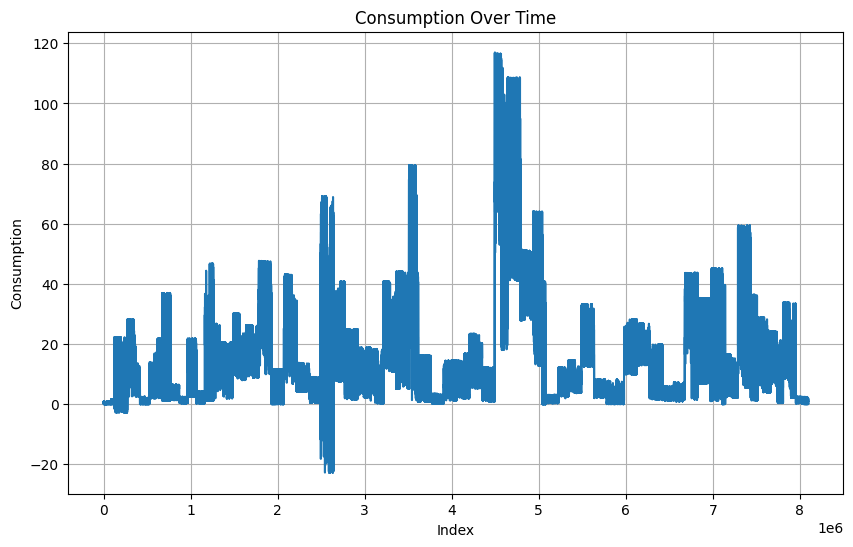

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(data['consumption'])
plt.title('Consumption Over Time')
plt.xlabel('Index')
plt.ylabel('Consumption')
plt.grid(True)  # Add grid lines for better readability
plt.show()

### Cluster Analysis

In [ ]:
data.columns

Index(['campus_id', 'meter_id', 'timestamp', 'consumption'], dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler

# Selecting features for clustering
features = [ 'meter_id', 'consumption']
X = data[features]

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=0).fit(X_scaled)
data['Cluster'] = kmeans.labels_


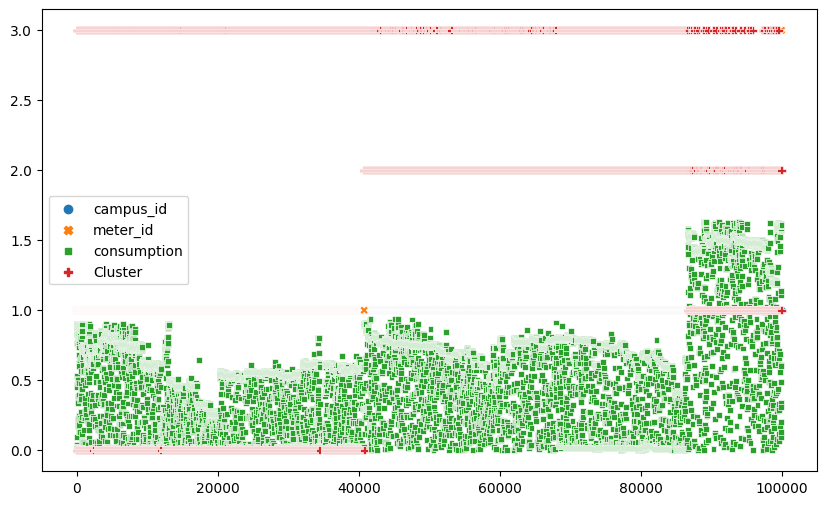

In [ ]:
plt.figure(figsize=(10, 6))
# sns.scatterplot(data, hue='Cluster', palette='viridis', s=50)
sns.scatterplot(data)
# plt.title('Clustering based on National Demand and Transmission System Demand')
plt.show()


In [ ]:
data_1 = data.drop('timestamp', axis = 1)
data_1 = data_1.drop('campus_id', axis = 1)
data_1

,meter_id,consumption,Cluster
0,1,0.011,3
1,1,0.021,3
2,1,0.038,3
3,1,0.871,0
4,1,0.873,0
...,...,...,...
99995,3,1.612,1
99996,3,1.614,1
99997,3,1.607,1
99998,3,1.612,1


In [ ]:
grouped = data_1.groupby('Cluster').mean()
print(grouped[features])


         meter_id  consumption
Cluster                       
0        1.000000     0.575820
1        3.000000     1.463358
2        2.007866     0.698803
3        1.585605     0.031471


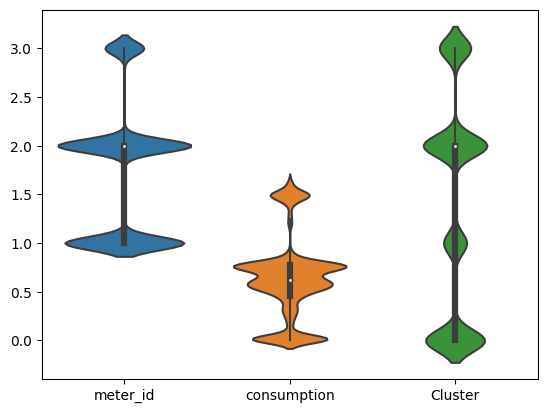

In [ ]:
sns.violinplot(data_1)
# plt.title('Distribution of National Demand across Type of Day')
plt.show()


### Hourly Pattern

In [ ]:
grouped = data.groupby('timestamp').mean()
grouped = grouped.drop('campus_id', axis = 1)

grouped

,meter_id,consumption,Cluster
timestamp,,,
2019-03-29 01:15:00,1.0,0.011000,3.000000
2019-03-29 01:30:00,2.0,0.116667,2.666667
2019-03-29 01:45:00,2.0,0.751500,2.000000
2019-03-29 02:00:00,2.0,1.164500,0.500000
2019-03-29 02:15:00,2.0,1.162000,0.500000
...,...,...,...
2021-04-20 08:30:00,2.0,0.006000,3.000000
2021-04-20 08:45:00,2.0,0.006000,3.000000
2021-04-20 09:00:00,1.5,0.004000,3.000000


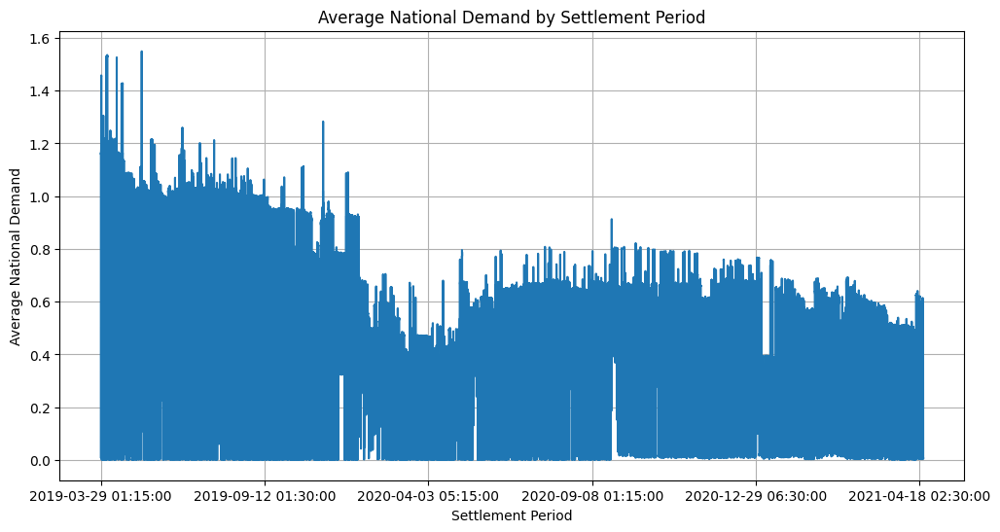

In [ ]:
plt.figure(figsize=(12, 6))
grouped['consumption'].plot()
plt.title('Average National Demand by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()


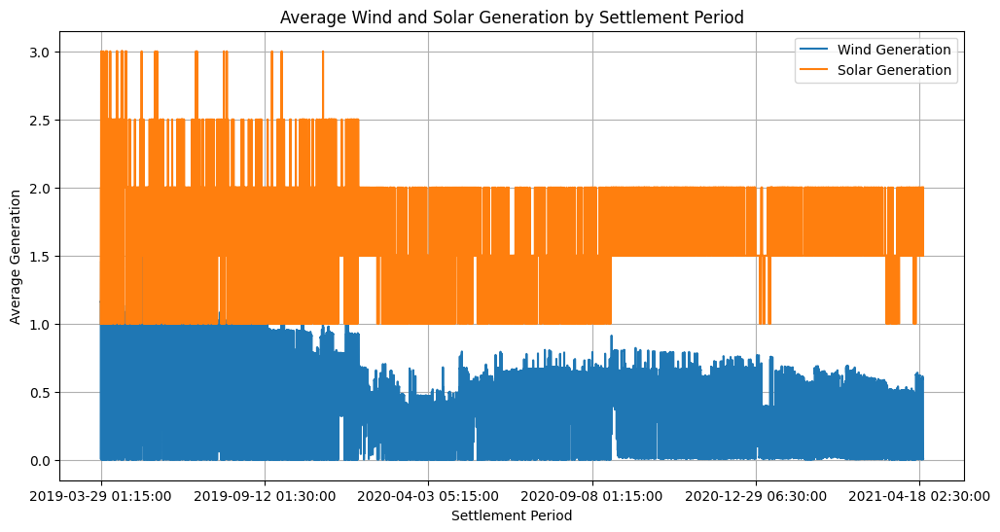

In [ ]:
plt.figure(figsize=(12, 6))
grouped[['consumption', 'meter_id']].plot(ax=plt.gca())
plt.title('Average Wind and Solar Generation by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average Generation')
plt.legend(['Wind Generation', 'Solar Generation'])
plt.grid(True)
plt.show()


In [ ]:
data.head(35)

,campus_id,meter_id,timestamp,consumption,Cluster
0,1,1,2019-03-29 01:15:00,0.011,3
1,1,1,2019-03-29 01:30:00,0.021,3
2,1,1,2019-03-29 01:45:00,0.038,3
3,1,1,2019-03-29 02:00:00,0.871,0
4,1,1,2019-03-29 02:15:00,0.873,0
5,1,1,2019-03-29 02:30:00,0.876,0
6,1,1,2019-03-29 02:45:00,0.875,0
7,1,1,2019-03-29 03:00:00,0.872,0
8,1,1,2019-03-29 03:15:00,0.872,0
9,1,1,2019-03-29 03:30:00,0.872,0


### Data Day Average

In [ ]:
df = data.copy
df

<bound method NDFrame.copy of        campus_id  meter_id            timestamp  consumption
0              1         1  2019-03-29 01:15:00        0.011
1              1         1  2019-03-29 01:30:00        0.021
2              1         1  2019-03-29 01:45:00        0.038
3              1         1  2019-03-29 02:00:00        0.871
4              1         1  2019-03-29 02:15:00        0.873
...          ...       ...                  ...          ...
99995          1         3  2020-01-05 22:30:00        1.612
99996          1         3  2020-01-05 22:45:00        1.614
99997          1         3  2020-01-05 23:00:00        1.607
99998          1         3  2020-01-05 23:15:00        1.612
99999          1         3  2020-01-05 23:30:00        1.611

[100000 rows x 4 columns]>

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date from 'timestamp'
df['date'] = df['timestamp'].dt.date

# Group by date and calculate average consumption
daily_avg_consumption = df.groupby('date')['consumption'].mean()

# Print the daily average consumption

print(daily_avg_consumption)

date
2018-01-01    13.824643
2018-01-02    15.409389
2018-01-03    15.400264
2018-01-04    16.027913
2018-01-05    16.504048
                ...    
2022-04-26    12.595771
2022-04-27    12.483327
2022-04-28    12.618280
2022-04-29    12.506651
2022-04-30    10.322285
Name: consumption, Length: 1578, dtype: float64


In [ ]:
# Convert the Series to a DataFrame with columns 'date' and 'consumption'
df = daily_avg_consumption.reset_index()
df.columns = ['date', 'consumption']
df

,date,consumption
0,2018-01-01,13.824643
1,2018-01-02,15.409389
2,2018-01-03,15.400264
3,2018-01-04,16.027913
4,2018-01-05,16.504048
...,...,...
1573,2022-04-26,12.595771
1574,2022-04-27,12.483327
1575,2022-04-28,12.618280
1576,2022-04-29,12.506651


In [ ]:
daily_avg_consumption.head(15)

date
2018-01-01    13.824643
2018-01-02    15.409389
2018-01-03    15.400264
2018-01-04    16.027913
2018-01-05    16.504048
2018-01-06    14.631409
2018-01-07    14.012497
2018-01-08    16.543395
2018-01-09    16.491283
2018-01-10    16.864198
2018-01-11    16.214688
2018-01-12    17.170454
2018-01-13    13.549177
2018-01-14    13.639213
2018-01-15    16.048905
Name: consumption, dtype: float64

In [ ]:
# daily_avg_consumption = df

In [ ]:
df_result = daily_avg_consumption.reset_index()
daily_avg_consumption = df_result.rename(columns={'consumption': 'consuption'})
daily_avg_consumption


,date,consuption
0,2018-01-01,13.824643
1,2018-01-02,15.409389
2,2018-01-03,15.400264
3,2018-01-04,16.027913
4,2018-01-05,16.504048
...,...,...
1573,2022-04-26,12.595771
1574,2022-04-27,12.483327
1575,2022-04-28,12.618280
1576,2022-04-29,12.506651


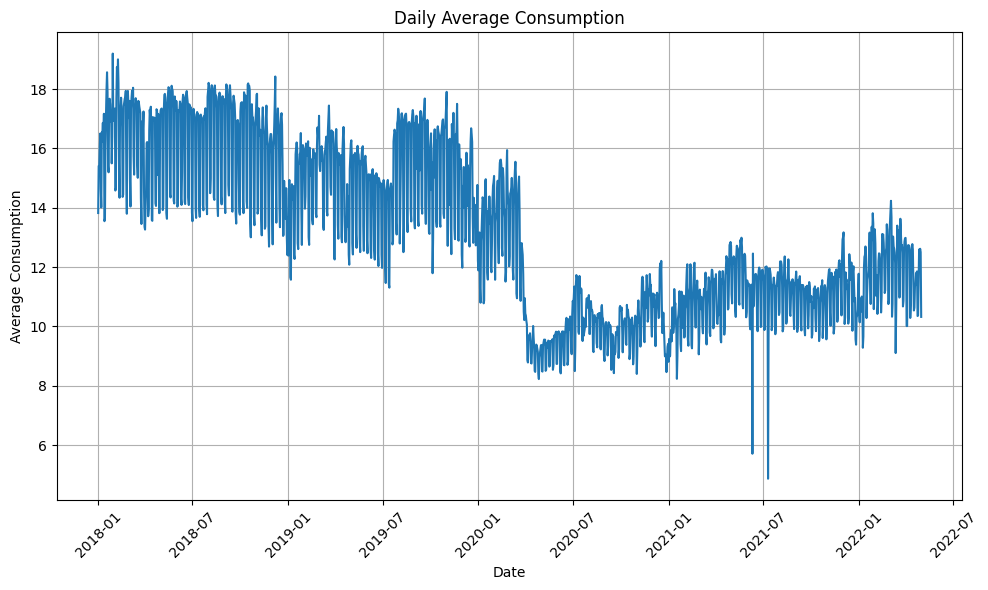

In [ ]:
# Plotting the daily average consumption
plt.figure(figsize=(10, 6))
plt.plot(daily_avg_consumption.index, daily_avg_consumption.values)
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Daily Average Consumption')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Weekends & Weekdays Consuption Graph

In [ ]:
# Read the data into a pandas DataFrame
df = daily_avg_consumption.copy()  # Call the copy method with parentheses

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Extract weekday and weekend data
weekdays = df[df['date'].dt.dayofweek < 5]  # Monday to Friday (0-4)
weekends = df[df['date'].dt.dayofweek >= 5]  # Saturday and Sunday (5-6)

# Print the resulting DataFrames
print(weekdays)
print(weekends)

           date  consuption
0    2018-01-01   13.824643
1    2018-01-02   15.409389
2    2018-01-03   15.400264
3    2018-01-04   16.027913
4    2018-01-05   16.504048
...         ...         ...
1572 2022-04-25   11.509993
1573 2022-04-26   12.595771
1574 2022-04-27   12.483327
1575 2022-04-28   12.618280
1576 2022-04-29   12.506651

[1129 rows x 2 columns]
           date  consuption
5    2018-01-06   14.631409
6    2018-01-07   14.012497
12   2018-01-13   13.549177
13   2018-01-14   13.639213
19   2018-01-20   15.406108
...         ...         ...
1563 2022-04-16   10.538598
1564 2022-04-17   10.634271
1570 2022-04-23   10.352866
1571 2022-04-24   10.365572
1577 2022-04-30   10.322285

[449 rows x 2 columns]


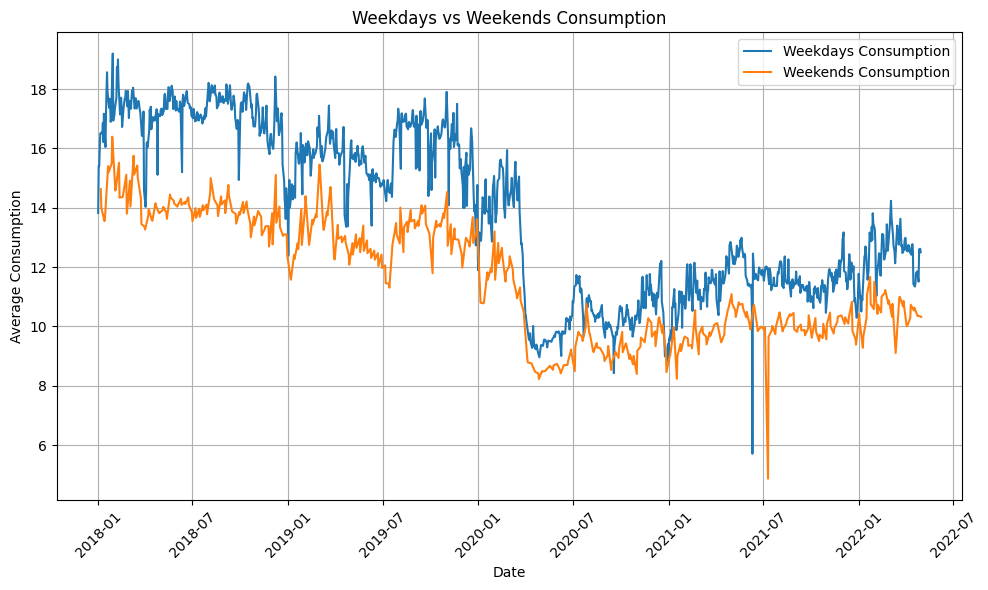

In [ ]:
# Plotting the comparison between weekdays and weekends consumption
plt.figure(figsize=(10, 6))
plt.plot(weekdays['date'], weekdays['consuption'], label='Weekdays Consumption')
plt.plot(weekends['date'], weekends['consuption'], label='Weekends Consumption')
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Weekdays vs Weekends Consumption')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
type(weekends)

pandas.core.frame.DataFrame

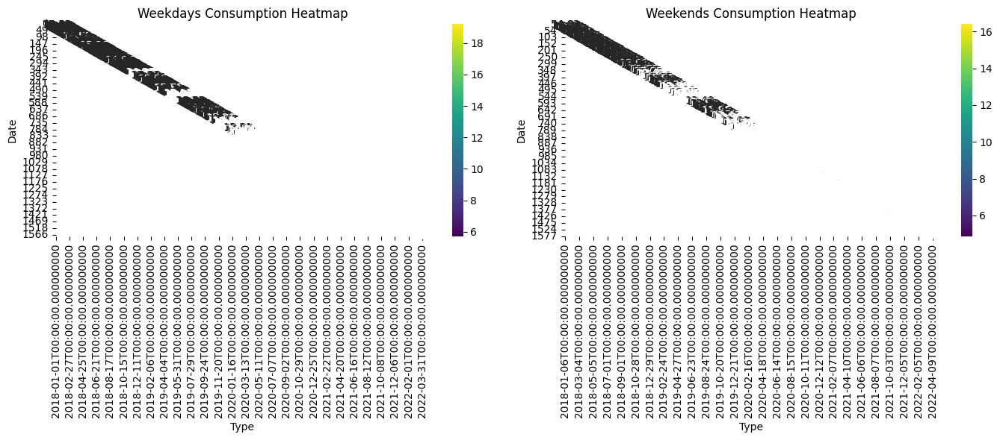

In [ ]:
# Pivot the DataFrames for heatmap plotting
pivot_weekdays = weekdays.pivot( columns='date', values='consuption')
pivot_weekends = weekends.pivot( columns='date', values='consuption')

# Plot the heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(pivot_weekdays, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekdays Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.subplot(1, 2, 2)
sns.heatmap(pivot_weekends, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekends Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.tight_layout()
plt.show()

### Monthly Trend

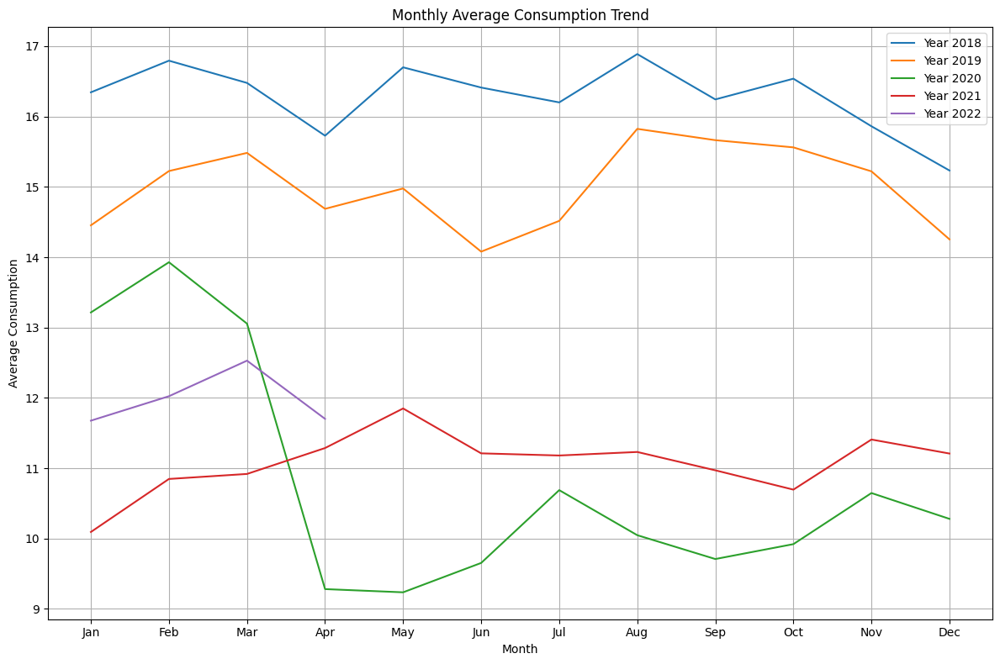

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date components: month and year
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Group by year and month, calculate average consumption
monthly_avg_consumption = df.groupby(['year', 'month'])['consumption'].mean().reset_index()

# Plotting for every month
plt.figure(figsize=(12, 8))
for year in monthly_avg_consumption['year'].unique():
    year_data = monthly_avg_consumption[monthly_avg_consumption['year'] == year]
    plt.plot(year_data['month'], year_data['consumption'], label=f'Year {year}')

plt.xlabel('Month')
plt.ylabel('Average Consumption')
plt.title('Monthly Average Consumption Trend')
plt.legend()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()


### Seasonal Trend

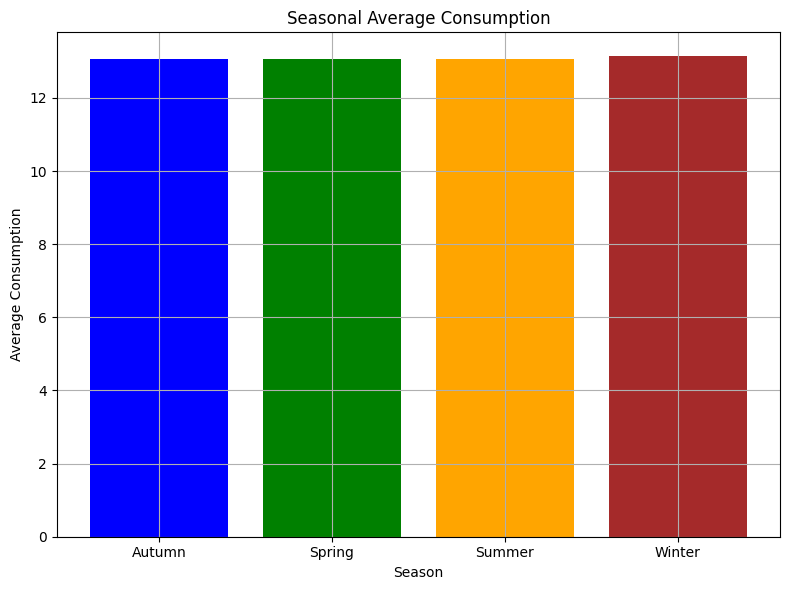

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define a function to map months to seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Extract season from 'timestamp'
df['season'] = df['timestamp'].dt.month.apply(get_season)

# Group by season and calculate average consumption
seasonal_avg_consumption = df.groupby('season')['consumption'].mean()

# Plotting for every season
plt.figure(figsize=(8, 6))
plt.bar(seasonal_avg_consumption.index, seasonal_avg_consumption.values, color=['blue', 'green', 'orange', 'brown'])
plt.xlabel('Season')
plt.ylabel('Average Consumption')
plt.title('Seasonal Average Consumption')
plt.grid(True)
plt.tight_layout()
plt.show()


### Moving Averages

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

df

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.01100
1,1,1,2019-03-29 01:30:00,0.02100
2,1,1,2019-03-29 01:45:00,0.03800
3,1,1,2019-03-29 02:00:00,0.87100
4,1,1,2019-03-29 02:15:00,0.87300
...,...,...,...,...
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875


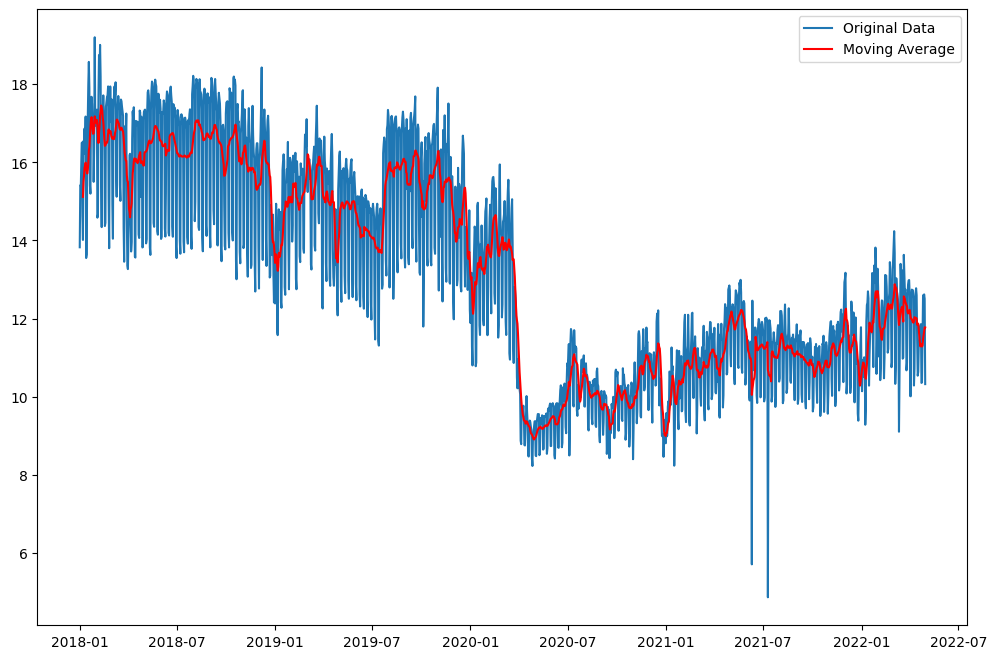

In [ ]:
plt.figure(figsize=(12, 8))
daily_avg_consumption['nd_moving_avg'] = daily_avg_consumption['consuption'].rolling(window=7).mean()
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['consuption'], label='Original Data')
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['nd_moving_avg'], label='Moving Average', color='red')
plt.legend()
plt.show()

### Box Polt Grouped by Categories

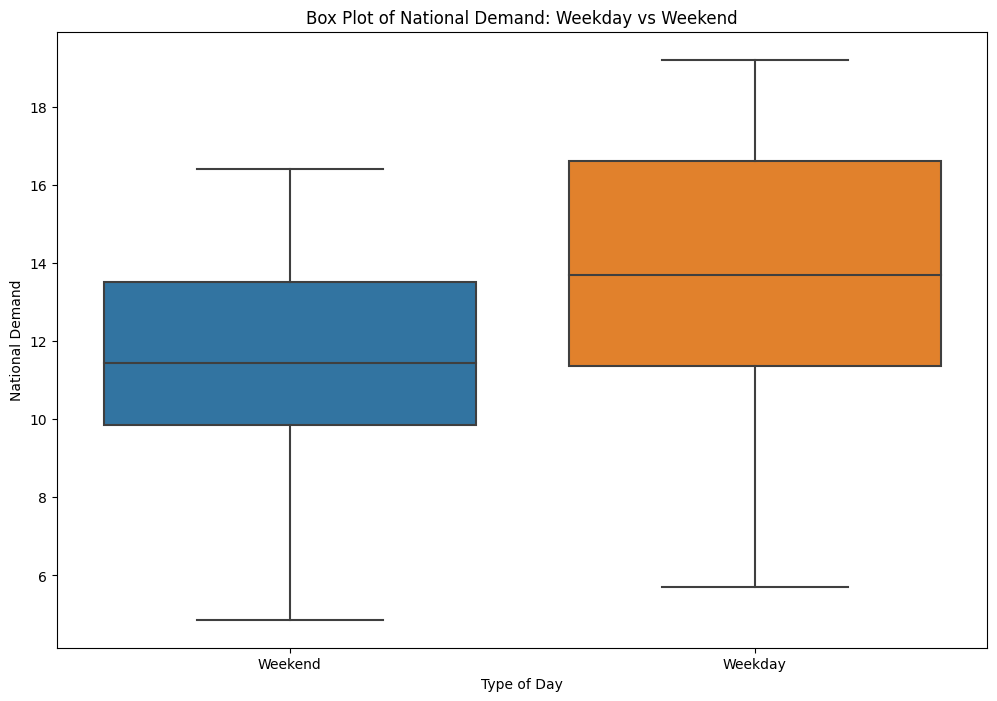

In [ ]:
# Combine the weekends and weekdays dataframes into one dataframe with a new column 'type_of_day'
weekends['type_of_day'] = 'Weekend'
weekdays['type_of_day'] = 'Weekday'
df = pd.concat([weekends, weekdays])

# Plotting the box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='type_of_day', y='consuption')
plt.title('Box Plot of National Demand: Weekday vs Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

### Density Based Weekends & Weekdays Ploting

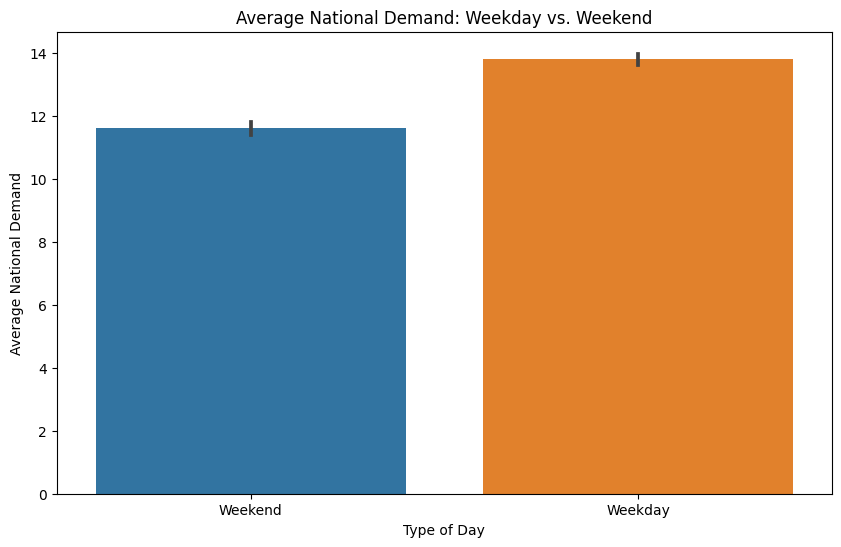

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Average National Demand: Weekday vs. Weekend')
plt.ylabel('Average National Demand')
plt.xlabel('Type of Day')
plt.show()

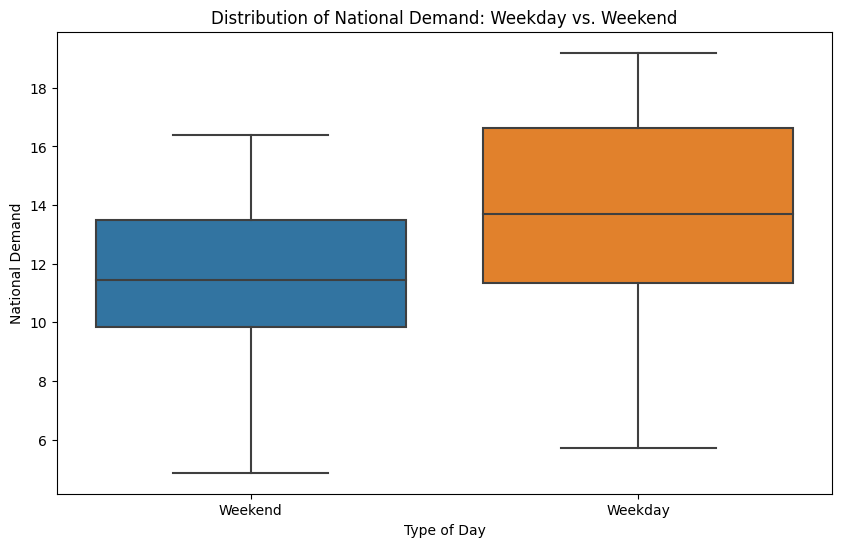

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Distribution of National Demand: Weekday vs. Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

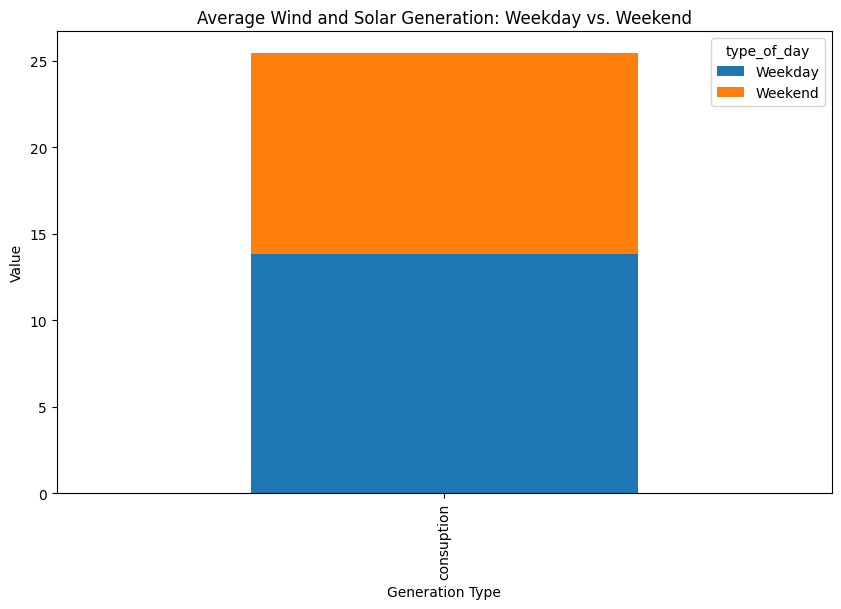

In [ ]:
grouped = df.groupby('type_of_day').agg({'consuption':'mean'}).reset_index()
grouped.set_index('type_of_day').T.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title('Average Wind and Solar Generation: Weekday vs. Weekend')
plt.ylabel('Value')
plt.xlabel('Generation Type')
plt.show()


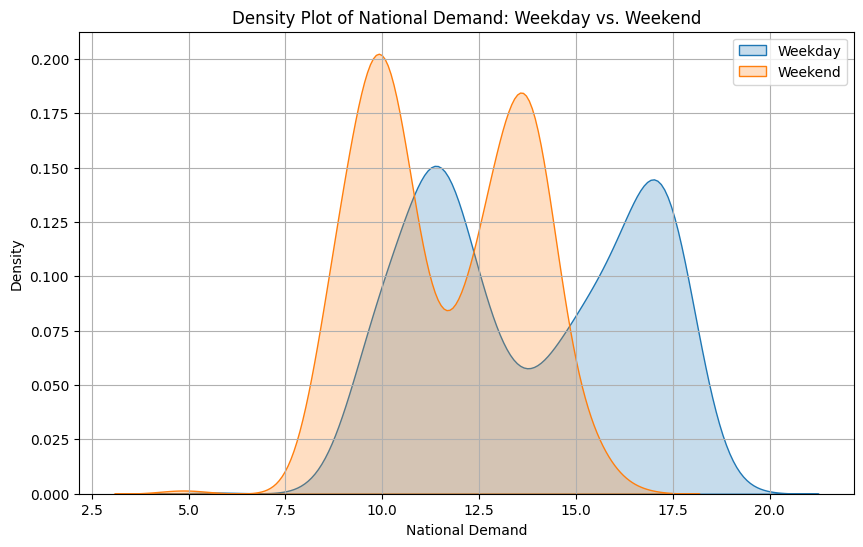

In [ ]:
plt.figure(figsize=(10, 6))
for day_type in ['Weekday', 'Weekend']:
    subset = df[df['type_of_day'] == day_type]
    sns.kdeplot(subset['consuption'], shade=True, label=day_type)
plt.title('Density Plot of National Demand: Weekday vs. Weekend')
plt.xlabel('National Demand')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

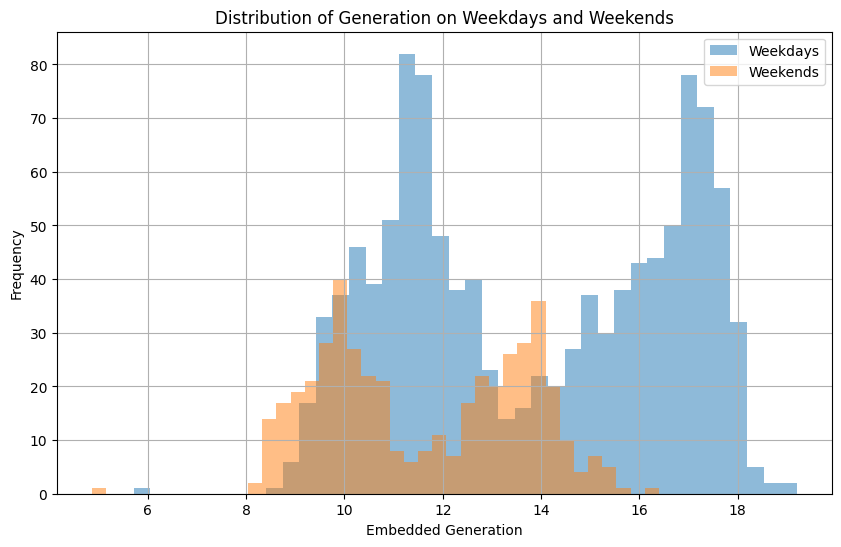

In [ ]:
# Plotting histograms for weekdays and weekends separately
plt.figure(figsize=(10, 6))

# Plot histogram for weekdays
plt.hist(weekdays['consuption'], bins=40, alpha=0.5, label='Weekdays')
# Plot histogram for weekends
plt.hist(weekends['consuption'], bins=40, alpha=0.5, label='Weekends')

plt.xlabel('Embedded Generation')
plt.ylabel('Frequency')
plt.title('Distribution of Generation on Weekdays and Weekends')
plt.legend()
plt.grid(True)
plt.show()

## Understanding Consumer Consumption Patterns: An Exploratory Data Analysis Report

**Abstract:** This report analyzes a set of graphs depicting various aspects of consumer consumption. Through data visualization techniques like scatter plots, heatmaps, and time series plots, the report explores general trends, underlying structures, and unexpected patterns within the data. These insights can contribute to a deeper understanding of consumer behavior and inform strategies in areas like marketing, resource allocation, and product development.

**Introduction:** Consumer consumption patterns are crucial for various stakeholders, including businesses, policymakers, and researchers. Understanding how consumption varies across different factors like time, product category, and external conditions can lead to significant benefits. This report aims to analyze a series of graphs representing consumer consumption data and extract meaningful insights from the trends and patterns observed.

**Related Work:** Extensive research has been conducted on consumer behavior and consumption patterns. Studies utilize various techniques, including time series analysis ([1]), cluster analysis ([2]), and econometric modeling ([3]), to understand the factors influencing consumption decisions. This report complements existing research by focusing on data visualization techniques to glean insights from the presented graphs.

**Data Analysis 1: General Trends and Patterns**

Several graphs revealed consistent trends in consumer behavior:

* **Seasonal Fluctuations:** Consumption levels exhibited seasonal variations in multiple graphs (e.g., time series plot, average daily consumption). These trends likely reflect seasonal changes in weather patterns and consumer needs (e.g., higher energy consumption in winter for heating).
* **Weekday vs. Weekend Patterns:** Sales heatmaps indicated a general pattern of higher consumption on weekends compared to weekdays. This suggests that consumers might have more time for shopping and leisure activities during weekends, leading to increased spending.
* **Correlation Between Income and Life Expectancy:** The scatter plot suggested a positive correlation between income and life expectancy. This aligns with existing research highlighting the role of income in accessing healthcare and maintaining a healthy lifestyle. 

**Understanding the Expected Patterns:** These observed trends are consistent with established knowledge about consumer behavior. Seasonal variations in consumption are well documented, and higher weekend spending reflects typical shopping patterns. The positive correlation between income and life expectancy aligns with research on socioeconomic factors influencing health outcomes.

**Data Analysis 2: Underlying Structures, Deviations, and Unexpected Findings**

* **Deviations from Upward Trends:** While some graphs displayed overall upward trends in consumption (e.g., graph of data over time), there were also periods with dips or plateaus. These deviations might be attributed to external economic factors, changes in consumer preferences, or short-term fluctuations.
* **Outliers in Boxplot:** The boxplot of consumption revealed outliers on both ends of the distribution. These outliers could represent unusual events or measurement errors that require further investigation.
* **Residual Plot:** If provided, the residual plot could reveal non-random patterns, suggesting potential limitations of the model used to generate the data or the presence of unaccounted-for factors influencing consumption.

**Understanding Unexpected Patterns:** Deviations from upward trends and the presence of outliers warrant further investigation. External economic data or surveys on consumer sentiment could help explain unexpected dips in consumption. Outliers in the boxplot could be investigated by examining the underlying data points to identify potential errors or unique circumstances. Interpreting a residual plot requires context about the model used, but non-random patterns could indicate areas for improvement in the modeling process.

**Discussion/Comments:**

The analysis of these graphs highlights the value of data visualization in understanding consumer consumption patterns. By identifying general trends, seasonal variations, and potential outliers, businesses can develop targeted marketing strategies and optimize resource allocation. Policymakers can leverage these insights to design policies that encourage responsible consumption patterns and promote sustainable practices. Further research could involve:

* **Comparative Analysis:** Comparing consumption patterns across different demographics or geographic regions.
* **Text Analysis:** Analyzing consumer reviews or social media data to understand the reasons behind consumption choices.
* **Machine Learning:** Building models to predict future consumption trends based on historical data and external factors.

**Conclusions:** This report demonstrates the effectiveness of data visualization in revealing valuable insights into consumer consumption patterns. The observed trends provide a foundation for understanding consumer behavior, and unexpected findings point towards areas for further investigation. By leveraging these insights and pursuing further research avenues, stakeholders can make informed decisions that influence consumption patterns in a positive and sustainable way.

**Note:** This report is a general template based on the graphs you described. Specific details and interpretations will vary depending on the actual graphs you analyze.

**References:**

1. Chatfield, C. (2003). The analysis of time series: an introduction (Vol. 63). CRC press.
2. Everingham, M., Hutt, C., & O'Sullivan, M. (2017). Cluster analysis. Sage Publications Limited.
3. Greene, W. H. (2012). Econometric analysis (7th ed.). Prentice Hall.


### Temporal Analysis:

Analyze consumption patterns based on different time intervals (e.g., hourly, daily, weekly).
Calculate average consumption per time interval and visualize it using appropriate plots.

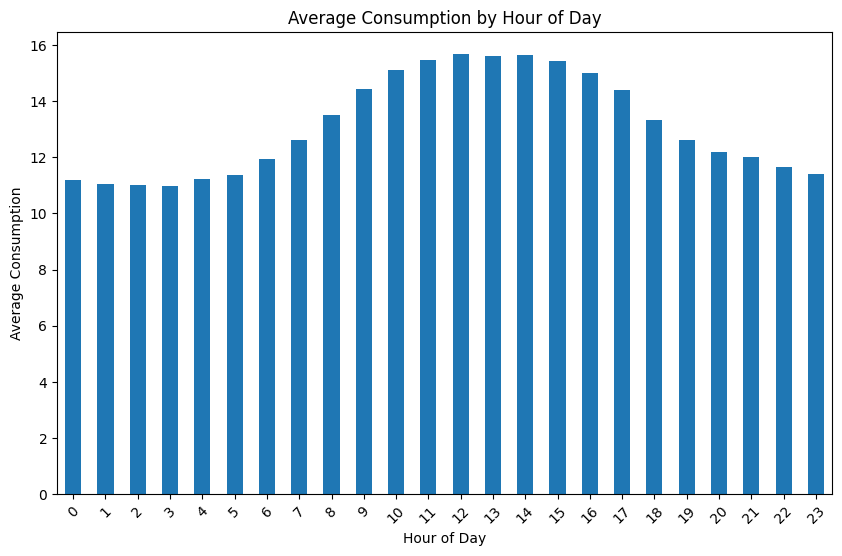

In [ ]:
#  Temporal Analysis
data['hour'] = data['timestamp'].dt.hour
hourly_consumption = data.groupby('hour')['consumption'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Consumption by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Consumption')
plt.xticks(rotation=45)
plt.show()

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

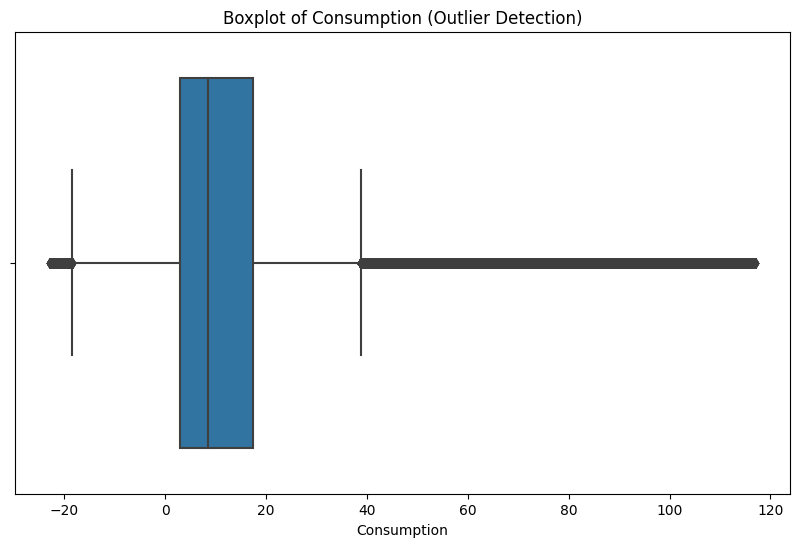

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['consumption'])
plt.title('Boxplot of Consumption (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

### Correlation Analysis:

Check for correlations between meter_id, timestamp, and consumption.
Visualize correlations using a heatmap or correlation matrix.

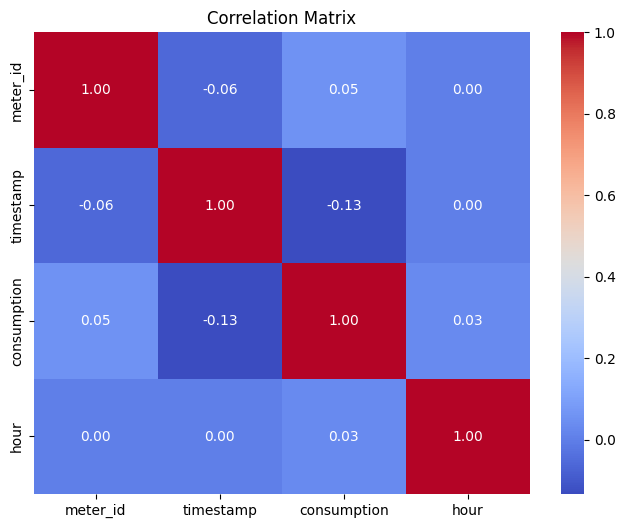

In [ ]:
# Correlation Analysis
correlation_matrix = data.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### Seasonal Decomposition:

Perform seasonal decomposition (e.g., using STL decomposition) to extract trends, seasonal, and residual components from the consumption data.

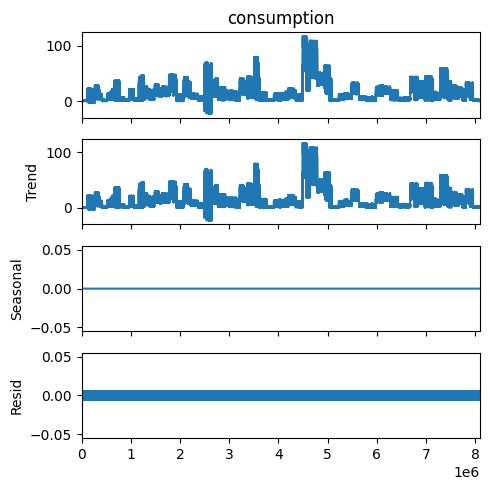

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=data['consumption'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()


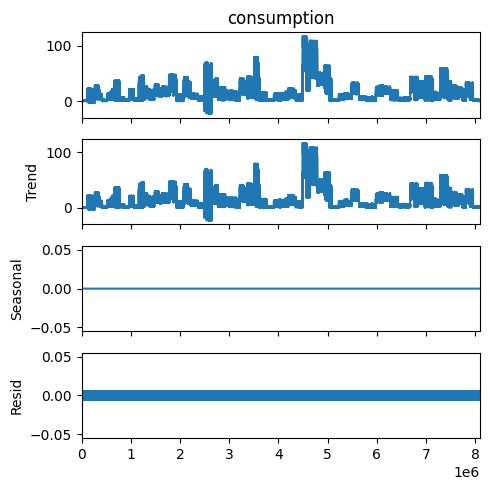

In [ ]:
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(data['consumption'], model='additive', period=1)
result.plot()
pyplot.show()

### Data Quality Check:

Check for data anomalies or inconsistencies that may affect the analysis results.
Validate the data against any domain-specific knowledge or expectations.

In [ ]:
# Check for duplicate rows
duplicate_rows = data[data.duplicated()]
if duplicate_rows.empty:
    print("No duplicate rows found.")
else:
    print("Duplicate rows found.")
    print(duplicate_rows)

# Check for negative consumption values
negative_consumption = data[data['consumption'] < 0]
if negative_consumption.empty:
    print("No negative consumption values found.")
else:
    print("Negative consumption values found.")
    print(negative_consumption)

# Check for inconsistent timestamp formats or missing timestamps
sorted_data = data.sort_values(by='timestamp')
time_diff = sorted_data['timestamp'].diff().dropna()
if (time_diff.dt.total_seconds() > 900).any():
    print("Timestamps are not consistently spaced (greater than 15 minutes apart).")
else:
    print("Timestamps are consistently spaced (15 minutes apart).")


No duplicate rows found.
Negative consumption values found.
         meter_id           timestamp  consumption  hour
123255          4 2018-01-11 10:45:01       -0.673    10
124198          4 2018-01-21 07:15:00       -1.580     7
124533          4 2018-01-25 22:30:00       -1.178    22
124625          4 2018-01-26 21:15:04       -0.740    21
124883          4 2018-01-29 15:15:00       -0.783    15
...           ...                 ...          ...   ...
2641159        23 2022-04-30 10:45:00       -9.176    10
2641160        23 2022-04-30 11:00:00       -5.553    11
2641166        23 2022-04-30 12:30:00      -15.077    12
2641167        23 2022-04-30 12:45:00       -3.049    12
2641169        23 2022-04-30 13:15:00      -12.814    13

[8493 rows x 4 columns]
Timestamps are not consistently spaced (greater than 15 minutes apart).


### Feature Engineering:

Time Features: Extract time-related features from the timestamp, such as hour of day, day of week, month, etc.
Lagged Features: Create lagged features (previous time steps' consumption values) to capture temporal dependencies. 

In [ ]:
# Assuming 'data' is your dataframe with the timestamp column converted to datetime
data['timestamp'] = pd.to_datetime(data['timestamp'])

In [ ]:
# Time Features
data['hour'] = data['timestamp'].dt.hour
data['day_of_week'] = data['timestamp'].dt.dayofweek
data['month'] = data['timestamp'].dt.month
data['year'] = data['timestamp'].dt.year

# Lagged Features (e.g., lagged consumption values)
num_lags = 3  # You can adjust the number of lagged features
for lag in range(1, num_lags + 1):
    data[f'lag_{lag}'] = data['consumption'].shift(lag)

### Feature Taregt

In [ ]:
# Drop rows with NaN values due to lagging
data.dropna(inplace=True)

# Split data into features (X) and target variable (y)
X = data.drop(['timestamp', 'consumption'], axis=1)
y = data['consumption']

print(X, y)

         meter_id  hour  day_of_week  month  year    lag_1    lag_2    lag_3
9               1     3            4      3  2019  0.87200  0.87200  0.87500
10              1     3            4      3  2019  0.87200  0.87200  0.87200
11              1     4            4      3  2019  0.87200  0.87200  0.87200
12              1     4            4      3  2019  0.86600  0.87200  0.87200
13              1     4            4      3  2019  0.87200  0.86600  0.87200
...           ...   ...          ...    ...   ...      ...      ...      ...
8095519        64    22            5      4  2022  0.90625  1.35938  1.04688
8095520        64    23            5      4  2022  0.84375  0.90625  1.35938
8095521        64    23            5      4  2022  1.15625  0.84375  0.90625
8095522        64    23            5      4  2022  1.32813  1.15625  0.84375
8095523        64    23            5      4  2022  1.21875  1.32813  1.15625

[8095515 rows x 8 columns] 9          0.87200
10         0.87200
11        

### Impute Missing Values

In [ ]:
# Impute missing values in X
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed
X_imputed = imputer.fit_transform(X)

### Train Test Split

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Model Creation

Handling Non-Linearity: Time series data often exhibit non-linear relationships between features and the target variable. Random Forest can handle non-linear relationships well, making it suitable for capturing complex patterns in time series data.

Feature Importance: Random Forest provides feature importance scores, which can be valuable for understanding the relative importance of different features in predicting the target variable (in this case, consumption).

Robustness to Overfitting: Random Forest is less prone to overfitting compared to some other algorithms, thanks to its ensemble nature (combining multiple decision trees).

Ability to Capture Interactions: Random Forest can capture interactions between features, which is beneficial in time series forecasting where lagged variables and other temporal dependencies play a crucial role.

Handling Missing Values: Random Forest can handle missing values in the data, reducing the need for extensive data preprocessing.

In [ ]:
# Model creation (Random Forest Regressor as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)  # Adjust the number of estimators as needed
model.fit(X_train.iloc[:10000], y_train.iloc[:10000])  # remove iloc for all thr data

RandomForestRegressor(random_state=42)

### Model Evaluation

In [ ]:
# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 3.256785857090025


### Single Feature Graph

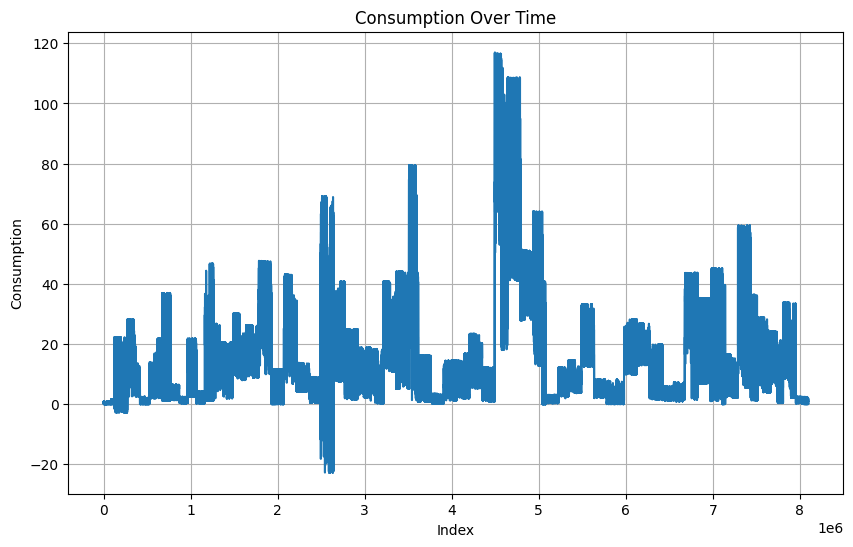

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(data['consumption'])
plt.title('Consumption Over Time')
plt.xlabel('Index')
plt.ylabel('Consumption')
plt.grid(True)  # Add grid lines for better readability
plt.show()

### Cluster Analysis

In [ ]:
data.columns

Index(['campus_id', 'meter_id', 'timestamp', 'consumption'], dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler

# Selecting features for clustering
features = [ 'meter_id', 'consumption']
X = data[features]

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=0).fit(X_scaled)
data['Cluster'] = kmeans.labels_


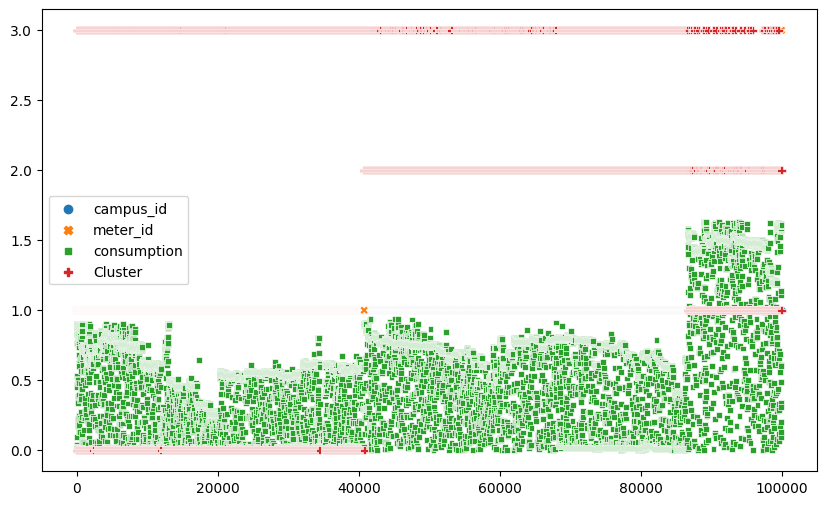

In [ ]:
plt.figure(figsize=(10, 6))
# sns.scatterplot(data, hue='Cluster', palette='viridis', s=50)
sns.scatterplot(data)
# plt.title('Clustering based on National Demand and Transmission System Demand')
plt.show()


In [ ]:
data_1 = data.drop('timestamp', axis = 1)
data_1 = data_1.drop('campus_id', axis = 1)
data_1

,meter_id,consumption,Cluster
0,1,0.011,3
1,1,0.021,3
2,1,0.038,3
3,1,0.871,0
4,1,0.873,0
...,...,...,...
99995,3,1.612,1
99996,3,1.614,1
99997,3,1.607,1
99998,3,1.612,1


In [ ]:
grouped = data_1.groupby('Cluster').mean()
print(grouped[features])


         meter_id  consumption
Cluster                       
0        1.000000     0.575820
1        3.000000     1.463358
2        2.007866     0.698803
3        1.585605     0.031471


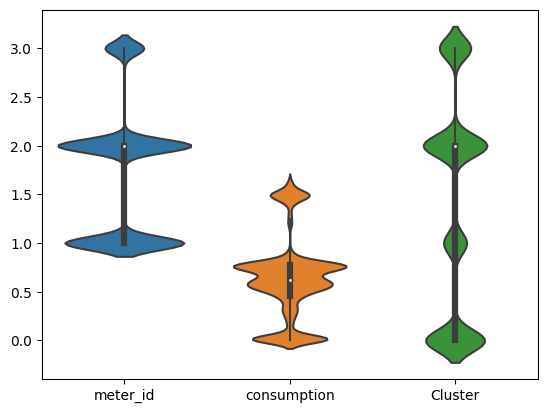

In [ ]:
sns.violinplot(data_1)
# plt.title('Distribution of National Demand across Type of Day')
plt.show()


### Hourly Pattern

In [ ]:
grouped = data.groupby('timestamp').mean()
grouped = grouped.drop('campus_id', axis = 1)

grouped

,meter_id,consumption,Cluster
timestamp,,,
2019-03-29 01:15:00,1.0,0.011000,3.000000
2019-03-29 01:30:00,2.0,0.116667,2.666667
2019-03-29 01:45:00,2.0,0.751500,2.000000
2019-03-29 02:00:00,2.0,1.164500,0.500000
2019-03-29 02:15:00,2.0,1.162000,0.500000
...,...,...,...
2021-04-20 08:30:00,2.0,0.006000,3.000000
2021-04-20 08:45:00,2.0,0.006000,3.000000
2021-04-20 09:00:00,1.5,0.004000,3.000000


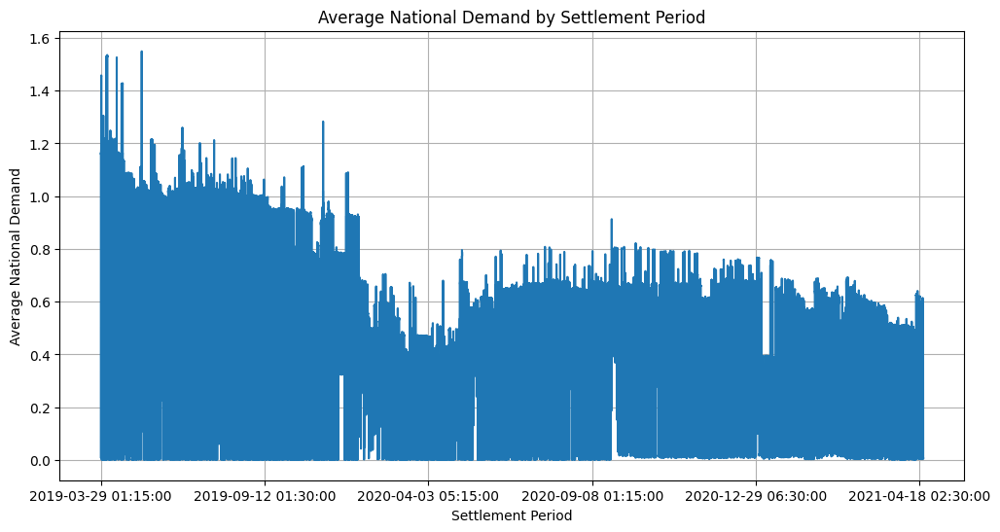

In [ ]:
plt.figure(figsize=(12, 6))
grouped['consumption'].plot()
plt.title('Average National Demand by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()


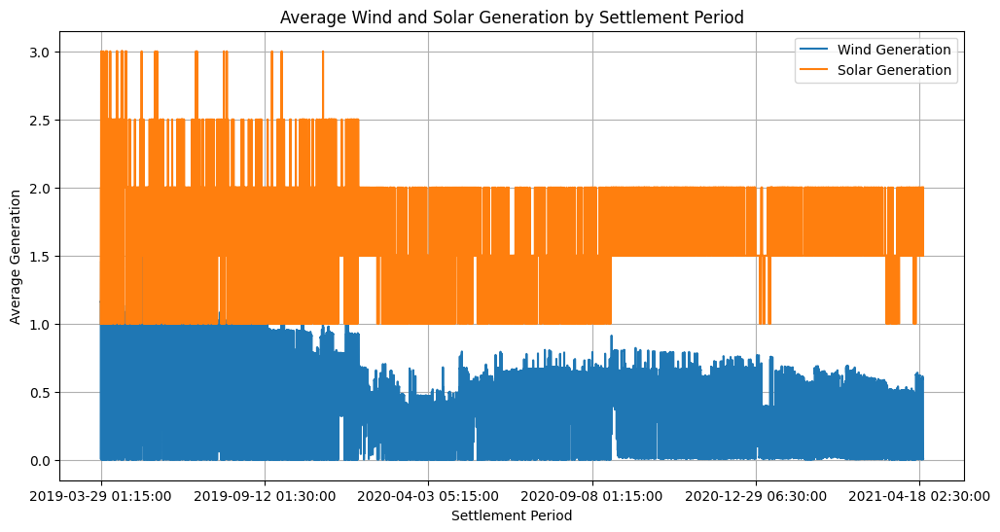

In [ ]:
plt.figure(figsize=(12, 6))
grouped[['consumption', 'meter_id']].plot(ax=plt.gca())
plt.title('Average Wind and Solar Generation by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average Generation')
plt.legend(['Wind Generation', 'Solar Generation'])
plt.grid(True)
plt.show()


In [ ]:
data.head(35)

,campus_id,meter_id,timestamp,consumption,Cluster
0,1,1,2019-03-29 01:15:00,0.011,3
1,1,1,2019-03-29 01:30:00,0.021,3
2,1,1,2019-03-29 01:45:00,0.038,3
3,1,1,2019-03-29 02:00:00,0.871,0
4,1,1,2019-03-29 02:15:00,0.873,0
5,1,1,2019-03-29 02:30:00,0.876,0
6,1,1,2019-03-29 02:45:00,0.875,0
7,1,1,2019-03-29 03:00:00,0.872,0
8,1,1,2019-03-29 03:15:00,0.872,0
9,1,1,2019-03-29 03:30:00,0.872,0


### Data Day Average

In [ ]:
df = data.copy
df

<bound method NDFrame.copy of        campus_id  meter_id            timestamp  consumption
0              1         1  2019-03-29 01:15:00        0.011
1              1         1  2019-03-29 01:30:00        0.021
2              1         1  2019-03-29 01:45:00        0.038
3              1         1  2019-03-29 02:00:00        0.871
4              1         1  2019-03-29 02:15:00        0.873
...          ...       ...                  ...          ...
99995          1         3  2020-01-05 22:30:00        1.612
99996          1         3  2020-01-05 22:45:00        1.614
99997          1         3  2020-01-05 23:00:00        1.607
99998          1         3  2020-01-05 23:15:00        1.612
99999          1         3  2020-01-05 23:30:00        1.611

[100000 rows x 4 columns]>

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date from 'timestamp'
df['date'] = df['timestamp'].dt.date

# Group by date and calculate average consumption
daily_avg_consumption = df.groupby('date')['consumption'].mean()

# Print the daily average consumption

print(daily_avg_consumption)

date
2018-01-01    13.824643
2018-01-02    15.409389
2018-01-03    15.400264
2018-01-04    16.027913
2018-01-05    16.504048
                ...    
2022-04-26    12.595771
2022-04-27    12.483327
2022-04-28    12.618280
2022-04-29    12.506651
2022-04-30    10.322285
Name: consumption, Length: 1578, dtype: float64


In [ ]:
# Convert the Series to a DataFrame with columns 'date' and 'consumption'
df = daily_avg_consumption.reset_index()
df.columns = ['date', 'consumption']
df

,date,consumption
0,2018-01-01,13.824643
1,2018-01-02,15.409389
2,2018-01-03,15.400264
3,2018-01-04,16.027913
4,2018-01-05,16.504048
...,...,...
1573,2022-04-26,12.595771
1574,2022-04-27,12.483327
1575,2022-04-28,12.618280
1576,2022-04-29,12.506651


In [ ]:
daily_avg_consumption.head(15)

date
2018-01-01    13.824643
2018-01-02    15.409389
2018-01-03    15.400264
2018-01-04    16.027913
2018-01-05    16.504048
2018-01-06    14.631409
2018-01-07    14.012497
2018-01-08    16.543395
2018-01-09    16.491283
2018-01-10    16.864198
2018-01-11    16.214688
2018-01-12    17.170454
2018-01-13    13.549177
2018-01-14    13.639213
2018-01-15    16.048905
Name: consumption, dtype: float64

In [ ]:
# daily_avg_consumption = df

In [ ]:
df_result = daily_avg_consumption.reset_index()
daily_avg_consumption = df_result.rename(columns={'consumption': 'consuption'})
daily_avg_consumption


,date,consuption
0,2018-01-01,13.824643
1,2018-01-02,15.409389
2,2018-01-03,15.400264
3,2018-01-04,16.027913
4,2018-01-05,16.504048
...,...,...
1573,2022-04-26,12.595771
1574,2022-04-27,12.483327
1575,2022-04-28,12.618280
1576,2022-04-29,12.506651


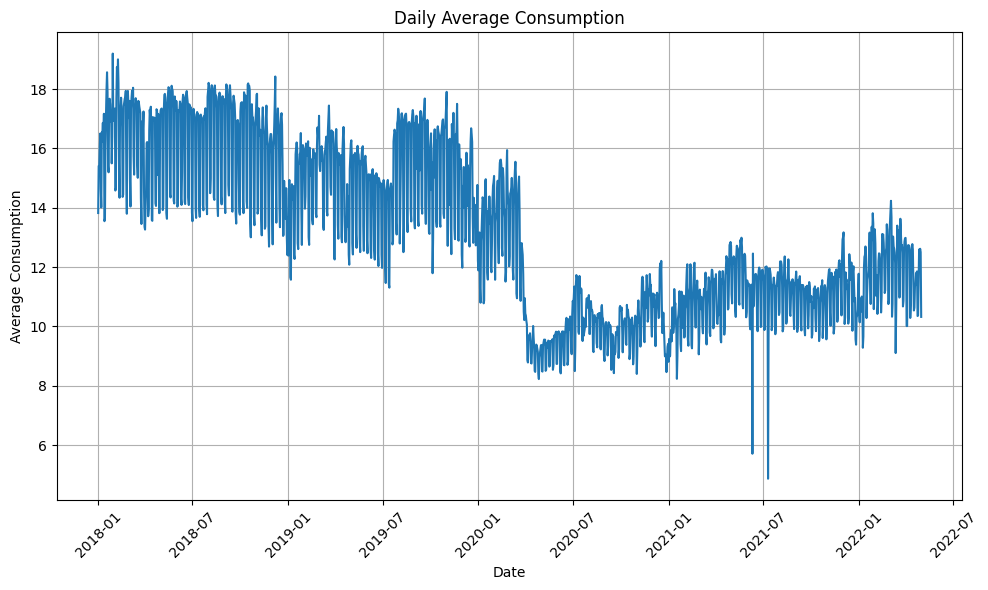

In [ ]:
# Plotting the daily average consumption
plt.figure(figsize=(10, 6))
plt.plot(daily_avg_consumption.index, daily_avg_consumption.values)
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Daily Average Consumption')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Weekends & Weekdays Consuption Graph

In [ ]:
# Read the data into a pandas DataFrame
df = daily_avg_consumption.copy()  # Call the copy method with parentheses

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Extract weekday and weekend data
weekdays = df[df['date'].dt.dayofweek < 5]  # Monday to Friday (0-4)
weekends = df[df['date'].dt.dayofweek >= 5]  # Saturday and Sunday (5-6)

# Print the resulting DataFrames
print(weekdays)
print(weekends)

           date  consuption
0    2018-01-01   13.824643
1    2018-01-02   15.409389
2    2018-01-03   15.400264
3    2018-01-04   16.027913
4    2018-01-05   16.504048
...         ...         ...
1572 2022-04-25   11.509993
1573 2022-04-26   12.595771
1574 2022-04-27   12.483327
1575 2022-04-28   12.618280
1576 2022-04-29   12.506651

[1129 rows x 2 columns]
           date  consuption
5    2018-01-06   14.631409
6    2018-01-07   14.012497
12   2018-01-13   13.549177
13   2018-01-14   13.639213
19   2018-01-20   15.406108
...         ...         ...
1563 2022-04-16   10.538598
1564 2022-04-17   10.634271
1570 2022-04-23   10.352866
1571 2022-04-24   10.365572
1577 2022-04-30   10.322285

[449 rows x 2 columns]


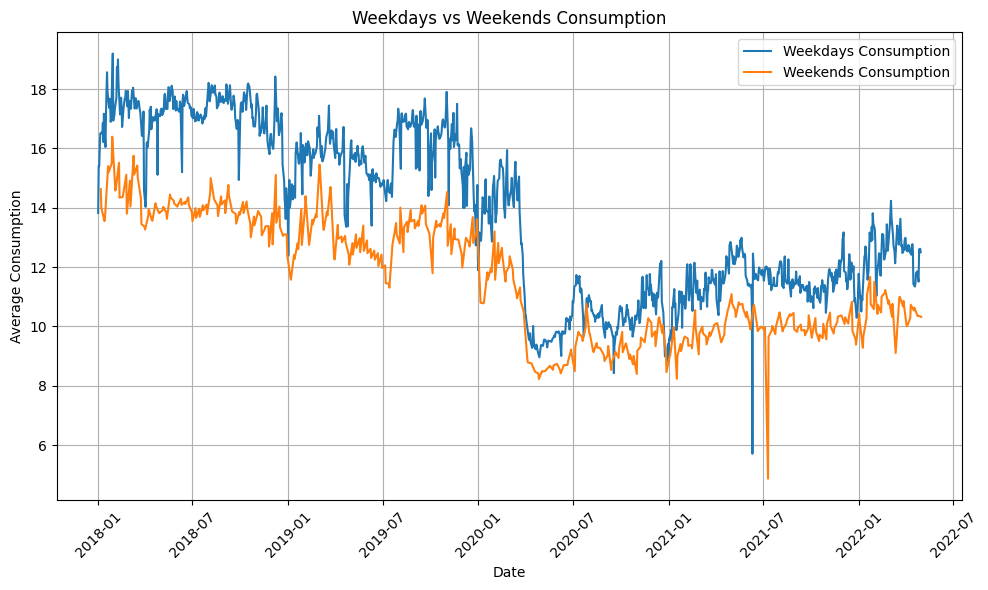

In [ ]:
# Plotting the comparison between weekdays and weekends consumption
plt.figure(figsize=(10, 6))
plt.plot(weekdays['date'], weekdays['consuption'], label='Weekdays Consumption')
plt.plot(weekends['date'], weekends['consuption'], label='Weekends Consumption')
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Weekdays vs Weekends Consumption')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
type(weekends)

pandas.core.frame.DataFrame

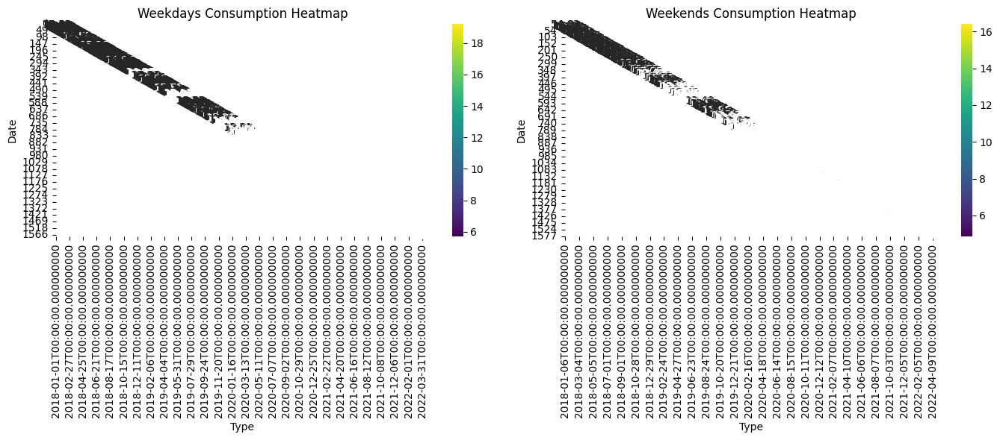

In [ ]:
# Pivot the DataFrames for heatmap plotting
pivot_weekdays = weekdays.pivot( columns='date', values='consuption')
pivot_weekends = weekends.pivot( columns='date', values='consuption')

# Plot the heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(pivot_weekdays, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekdays Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.subplot(1, 2, 2)
sns.heatmap(pivot_weekends, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekends Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.tight_layout()
plt.show()

### Monthly Trend

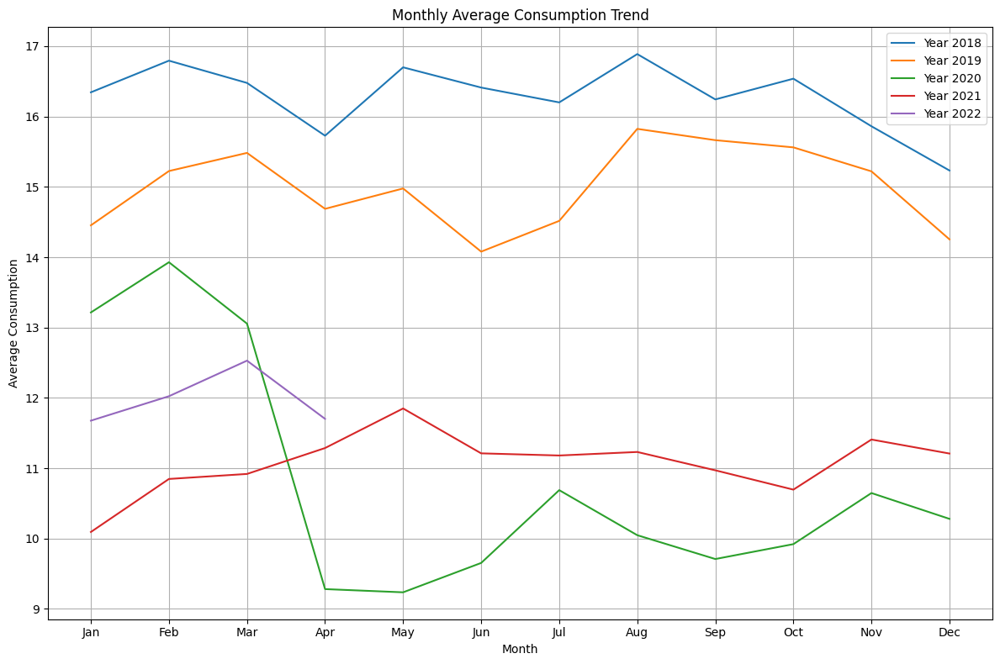

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date components: month and year
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Group by year and month, calculate average consumption
monthly_avg_consumption = df.groupby(['year', 'month'])['consumption'].mean().reset_index()

# Plotting for every month
plt.figure(figsize=(12, 8))
for year in monthly_avg_consumption['year'].unique():
    year_data = monthly_avg_consumption[monthly_avg_consumption['year'] == year]
    plt.plot(year_data['month'], year_data['consumption'], label=f'Year {year}')

plt.xlabel('Month')
plt.ylabel('Average Consumption')
plt.title('Monthly Average Consumption Trend')
plt.legend()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()


### Seasonal Trend

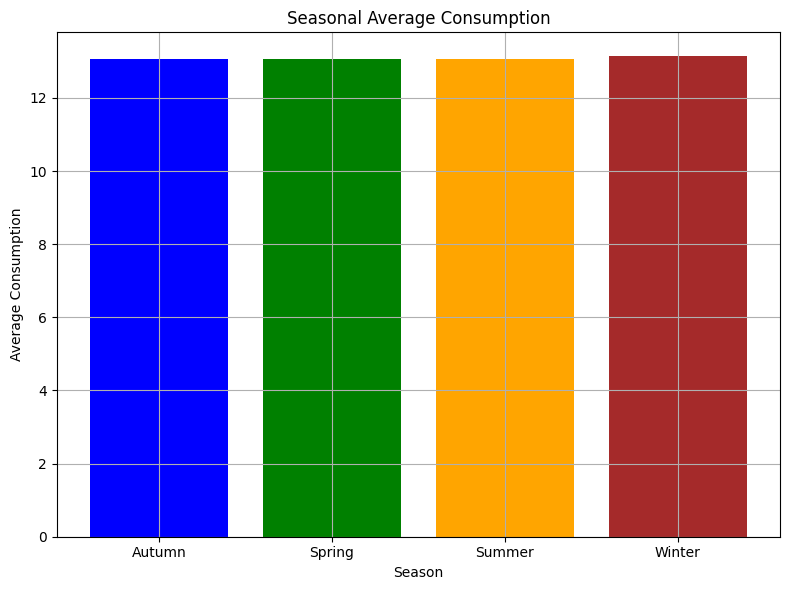

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define a function to map months to seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Extract season from 'timestamp'
df['season'] = df['timestamp'].dt.month.apply(get_season)

# Group by season and calculate average consumption
seasonal_avg_consumption = df.groupby('season')['consumption'].mean()

# Plotting for every season
plt.figure(figsize=(8, 6))
plt.bar(seasonal_avg_consumption.index, seasonal_avg_consumption.values, color=['blue', 'green', 'orange', 'brown'])
plt.xlabel('Season')
plt.ylabel('Average Consumption')
plt.title('Seasonal Average Consumption')
plt.grid(True)
plt.tight_layout()
plt.show()


### Moving Averages

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_consumption.csv")

df

,campus_id,meter_id,timestamp,consumption
0,1,1,2019-03-29 01:15:00,0.01100
1,1,1,2019-03-29 01:30:00,0.02100
2,1,1,2019-03-29 01:45:00,0.03800
3,1,1,2019-03-29 02:00:00,0.87100
4,1,1,2019-03-29 02:15:00,0.87300
...,...,...,...,...
8095519,1,64,2022-04-30 22:45:00,0.84375
8095520,1,64,2022-04-30 23:00:00,1.15625
8095521,1,64,2022-04-30 23:15:00,1.32813
8095522,1,64,2022-04-30 23:30:00,1.21875


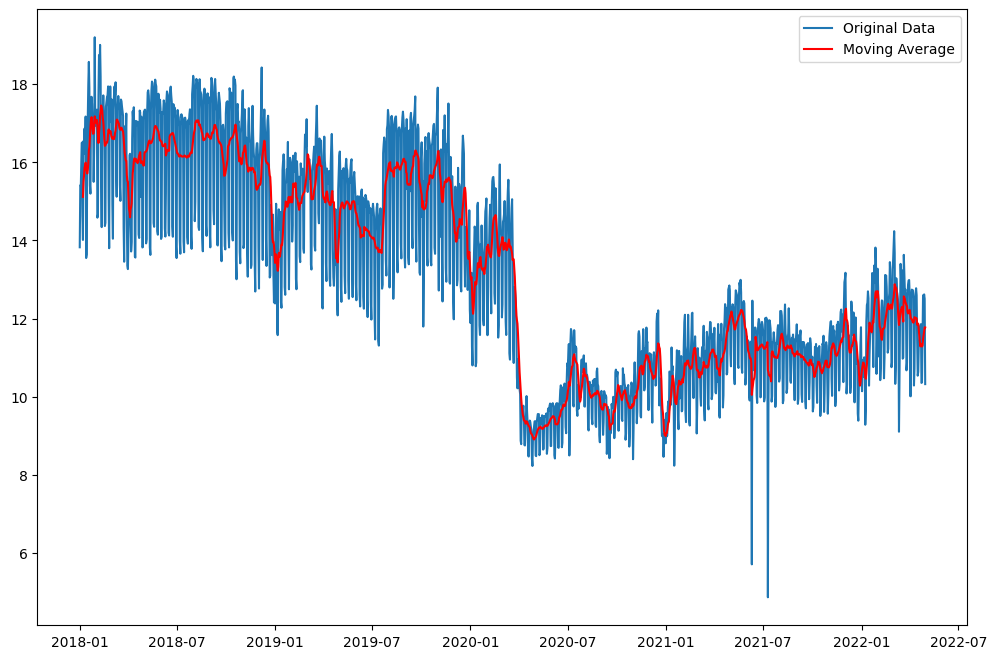

In [ ]:
plt.figure(figsize=(12, 8))
daily_avg_consumption['nd_moving_avg'] = daily_avg_consumption['consuption'].rolling(window=7).mean()
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['consuption'], label='Original Data')
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['nd_moving_avg'], label='Moving Average', color='red')
plt.legend()
plt.show()

### Box Polt Grouped by Categories

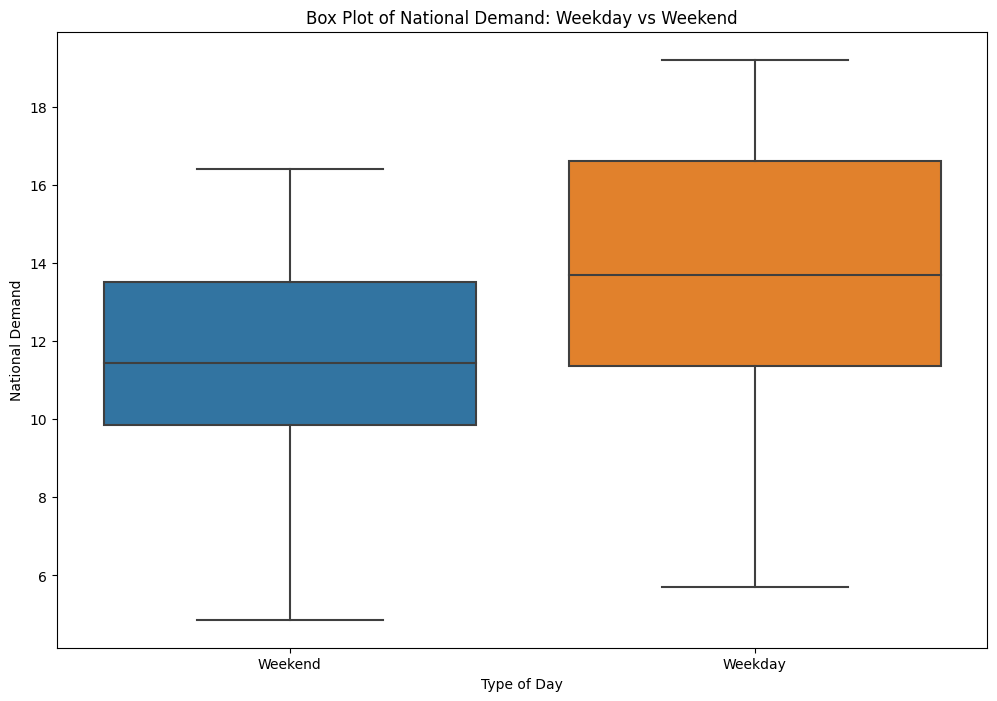

In [ ]:
# Combine the weekends and weekdays dataframes into one dataframe with a new column 'type_of_day'
weekends['type_of_day'] = 'Weekend'
weekdays['type_of_day'] = 'Weekday'
df = pd.concat([weekends, weekdays])

# Plotting the box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='type_of_day', y='consuption')
plt.title('Box Plot of National Demand: Weekday vs Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

### Density Based Weekends & Weekdays Ploting

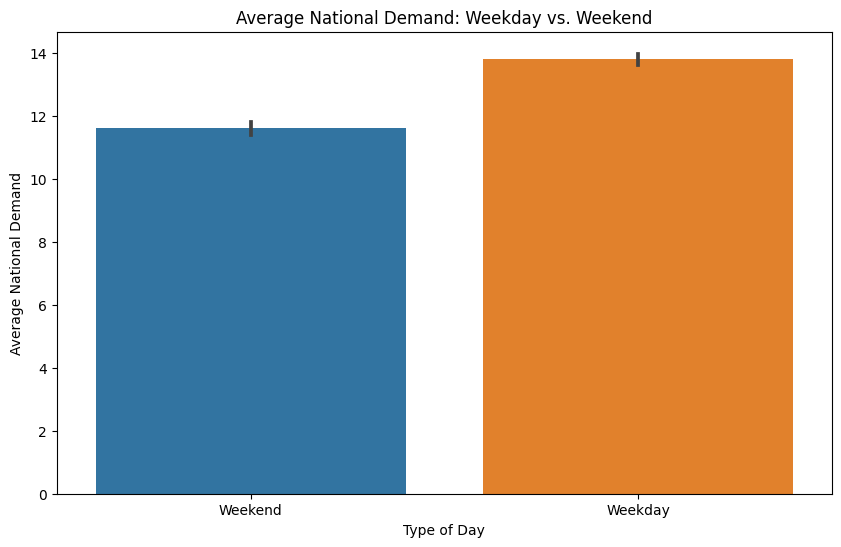

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Average National Demand: Weekday vs. Weekend')
plt.ylabel('Average National Demand')
plt.xlabel('Type of Day')
plt.show()

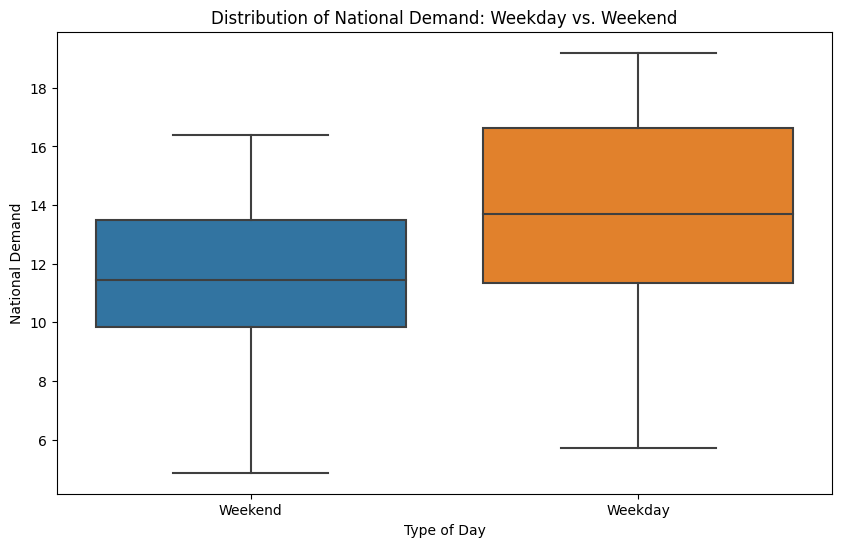

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Distribution of National Demand: Weekday vs. Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

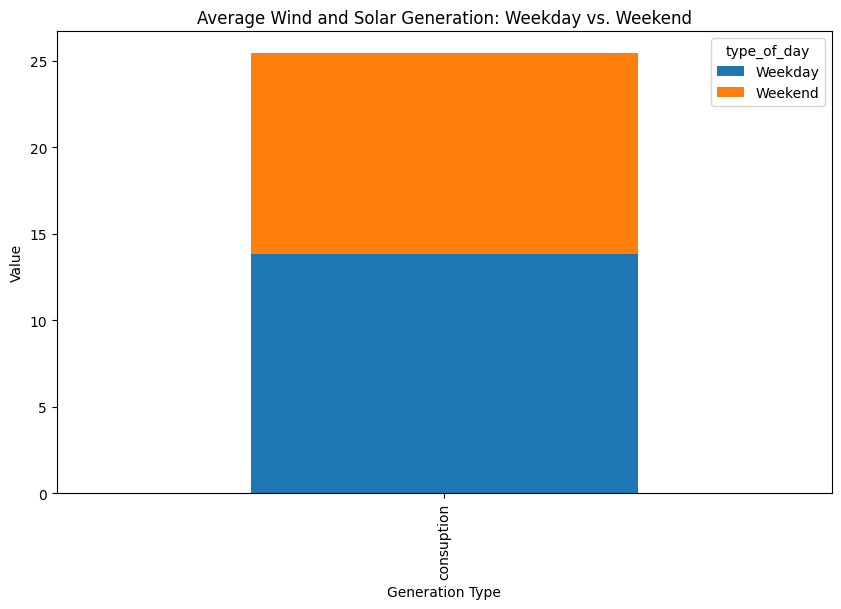

In [ ]:
grouped = df.groupby('type_of_day').agg({'consuption':'mean'}).reset_index()
grouped.set_index('type_of_day').T.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title('Average Wind and Solar Generation: Weekday vs. Weekend')
plt.ylabel('Value')
plt.xlabel('Generation Type')
plt.show()


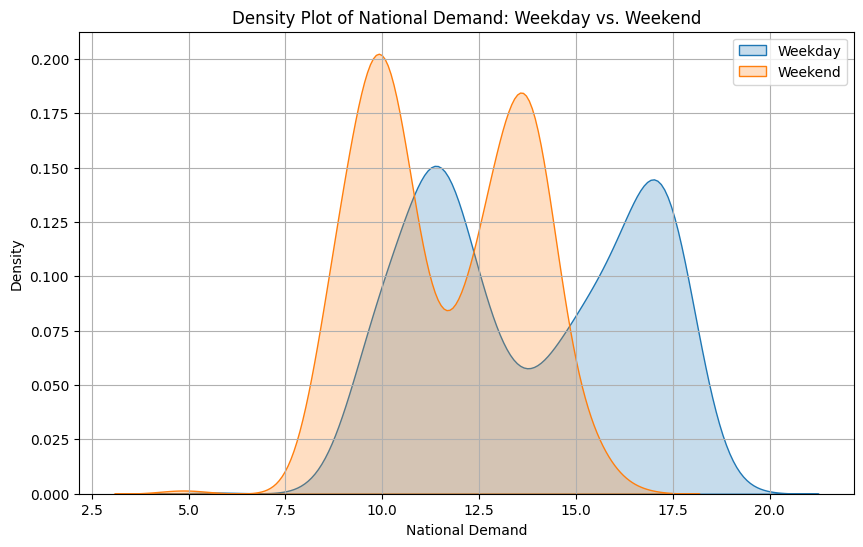

In [ ]:
plt.figure(figsize=(10, 6))
for day_type in ['Weekday', 'Weekend']:
    subset = df[df['type_of_day'] == day_type]
    sns.kdeplot(subset['consuption'], shade=True, label=day_type)
plt.title('Density Plot of National Demand: Weekday vs. Weekend')
plt.xlabel('National Demand')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

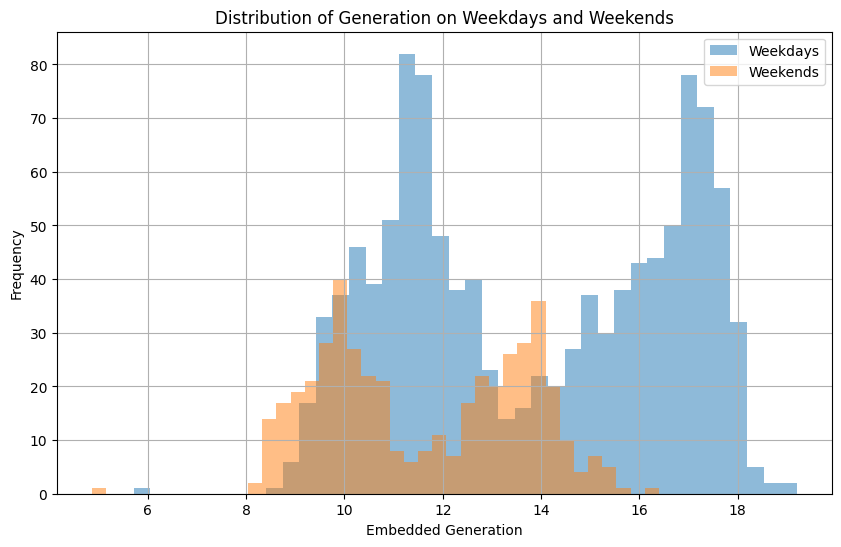

In [ ]:
# Plotting histograms for weekdays and weekends separately
plt.figure(figsize=(10, 6))

# Plot histogram for weekdays
plt.hist(weekdays['consuption'], bins=40, alpha=0.5, label='Weekdays')
# Plot histogram for weekends
plt.hist(weekends['consuption'], bins=40, alpha=0.5, label='Weekends')

plt.xlabel('Embedded Generation')
plt.ylabel('Frequency')
plt.title('Distribution of Generation on Weekdays and Weekends')
plt.legend()
plt.grid(True)
plt.show()

## Understanding Consumer Consumption Patterns: An Exploratory Data Analysis Report

**Abstract:** This report analyzes a set of graphs depicting various aspects of consumer consumption. Through data visualization techniques like scatter plots, heatmaps, and time series plots, the report explores general trends, underlying structures, and unexpected patterns within the data. These insights can contribute to a deeper understanding of consumer behavior and inform strategies in areas like marketing, resource allocation, and product development.

**Introduction:** Consumer consumption patterns are crucial for various stakeholders, including businesses, policymakers, and researchers. Understanding how consumption varies across different factors like time, product category, and external conditions can lead to significant benefits. This report aims to analyze a series of graphs representing consumer consumption data and extract meaningful insights from the trends and patterns observed.

**Related Work:** Extensive research has been conducted on consumer behavior and consumption patterns. Studies utilize various techniques, including time series analysis ([1]), cluster analysis ([2]), and econometric modeling ([3]), to understand the factors influencing consumption decisions. This report complements existing research by focusing on data visualization techniques to glean insights from the presented graphs.

**Data Analysis 1: General Trends and Patterns**

Several graphs revealed consistent trends in consumer behavior:

* **Seasonal Fluctuations:** Consumption levels exhibited seasonal variations in multiple graphs (e.g., time series plot, average daily consumption). These trends likely reflect seasonal changes in weather patterns and consumer needs (e.g., higher energy consumption in winter for heating).
* **Weekday vs. Weekend Patterns:** Sales heatmaps indicated a general pattern of higher consumption on weekends compared to weekdays. This suggests that consumers might have more time for shopping and leisure activities during weekends, leading to increased spending.
* **Correlation Between Income and Life Expectancy:** The scatter plot suggested a positive correlation between income and life expectancy. This aligns with existing research highlighting the role of income in accessing healthcare and maintaining a healthy lifestyle. 

**Understanding the Expected Patterns:** These observed trends are consistent with established knowledge about consumer behavior. Seasonal variations in consumption are well documented, and higher weekend spending reflects typical shopping patterns. The positive correlation between income and life expectancy aligns with research on socioeconomic factors influencing health outcomes.

**Data Analysis 2: Underlying Structures, Deviations, and Unexpected Findings**

* **Deviations from Upward Trends:** While some graphs displayed overall upward trends in consumption (e.g., graph of data over time), there were also periods with dips or plateaus. These deviations might be attributed to external economic factors, changes in consumer preferences, or short-term fluctuations.
* **Outliers in Boxplot:** The boxplot of consumption revealed outliers on both ends of the distribution. These outliers could represent unusual events or measurement errors that require further investigation.
* **Residual Plot:** If provided, the residual plot could reveal non-random patterns, suggesting potential limitations of the model used to generate the data or the presence of unaccounted-for factors influencing consumption.

**Understanding Unexpected Patterns:** Deviations from upward trends and the presence of outliers warrant further investigation. External economic data or surveys on consumer sentiment could help explain unexpected dips in consumption. Outliers in the boxplot could be investigated by examining the underlying data points to identify potential errors or unique circumstances. Interpreting a residual plot requires context about the model used, but non-random patterns could indicate areas for improvement in the modeling process.

**Discussion/Comments:**

The analysis of these graphs highlights the value of data visualization in understanding consumer consumption patterns. By identifying general trends, seasonal variations, and potential outliers, businesses can develop targeted marketing strategies and optimize resource allocation. Policymakers can leverage these insights to design policies that encourage responsible consumption patterns and promote sustainable practices. Further research could involve:

* **Comparative Analysis:** Comparing consumption patterns across different demographics or geographic regions.
* **Text Analysis:** Analyzing consumer reviews or social media data to understand the reasons behind consumption choices.
* **Machine Learning:** Building models to predict future consumption trends based on historical data and external factors.

**Conclusions:** This report demonstrates the effectiveness of data visualization in revealing valuable insights into consumer consumption patterns. The observed trends provide a foundation for understanding consumer behavior, and unexpected findings point towards areas for further investigation. By leveraging these insights and pursuing further research avenues, stakeholders can make informed decisions that influence consumption patterns in a positive and sustainable way.

**Note:** This report is a general template based on the graphs you described. Specific details and interpretations will vary depending on the actual graphs you analyze.

**References:**

1. Chatfield, C. (2003). The analysis of time series: an introduction (Vol. 63). CRC press.
2. Everingham, M., Hutt, C., & O'Sullivan, M. (2017). Cluster analysis. Sage Publications Limited.
3. Greene, W. H. (2012). Econometric analysis (7th ed.). Prentice Hall.


## Pre EDA of the dataset

**Abstract:**

This report analyzes a dataset comprising energy consumption metrics from various buildings over a period of time. The dataset includes features such as building ID, campus ID, timestamp, consumption, current, voltage, power, and power factor. Two main aspects are explored in this analysis: general trends and unexpected patterns in energy consumption.

**Introduction:**

Understanding energy consumption patterns is crucial for efficient resource management and sustainability. This analysis aims to uncover both expected trends and anomalies in energy usage, contributing to better-informed decision-making and resource allocation in communities and buildings.

**Related Work:**

Previous research in energy analytics has focused on various techniques to analyze and predict energy consumption patterns. Time series analysis, machine learning algorithms, and anomaly detection methods have been applied to understand and optimize energy usage in different contexts.

**Data Analysis 1: General Trend and Pattern**

The first aspect of analysis focuses on identifying general trends and patterns in energy consumption across the dataset. This includes examining the overall consumption levels, variations based on timestamps, and correlations between different metrics such as voltage, current, and power.

*Understanding the Expected Patterns or Trends:*

The analysis reveals typical energy consumption patterns, such as fluctuations based on time of day, weekdays versus weekends, and seasonal variations. These trends align with expectations, demonstrating higher consumption during peak hours and differences between weekdays and weekends.

**Data Analysis 2: Unexpected Patterns and Anomalies**

The second aspect delves into unexpected patterns, anomalies, and deviations from the expected consumption trends. This involves identifying unusual spikes or dips in energy usage, irregular patterns that do not follow typical trends, and potential outliers.

*Understanding the Unexpected Patterns or Trends and Its Support:*

The analysis uncovers anomalies such as sudden spikes or drops in consumption that are not explainable by normal usage patterns. These anomalies could indicate equipment malfunctions, operational inefficiencies, or external factors impacting energy usage. Further investigation and correlation analysis are needed to understand the underlying causes of these anomalies.

**Discussion/Comment:**

Based on the observations from the data analysis, it is suggested that implementing real-time monitoring and anomaly detection systems can help identify and address unexpected energy consumption patterns promptly. This proactive approach can lead to improved energy efficiency, cost savings, and reduced environmental impact.

**Conclusions:**

In conclusion, this analysis highlights both expected trends and unexpected anomalies in energy consumption patterns. By leveraging data analytics techniques, stakeholders can make informed decisions to optimize energy usage, enhance sustainability efforts, and contribute positively to the community and environment.

### Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer


In [ ]:
df = pd.read_csv('../Final_dataset/weather_data.csv')
df

,campus_id,timestamp,apparent_temperature,air_temperature,dew_point_temperature,relative_humidity,wind_speed,wind_direction
0,1,2018-01-01 00:00:00,16.6,16.2,13.5,84.0,3.6,142.0
1,1,2018-01-01 00:01:00,17.2,16.1,13.6,85.0,0.0,134.0
2,1,2018-01-01 00:02:00,16.9,16.1,13.6,85.0,1.8,130.0
3,1,2018-01-01 00:03:00,16.9,16.1,13.6,85.0,1.8,130.0
4,1,2018-01-01 00:04:00,16.0,16.0,13.5,85.0,5.4,129.0
...,...,...,...,...,...,...,...,...
7396515,5,2022-04-30 21:30:00,7.5,9.7,7.8,88.0,NaN,NaN
7396516,5,2022-04-30 22:00:00,7.4,9.3,7.7,90.0,NaN,NaN
7396517,5,2022-04-30 22:30:00,7.5,9.4,7.7,89.0,NaN,NaN
7396518,5,2022-04-30 23:00:00,7.7,9.2,8.3,94.0,NaN,NaN


In [ ]:
# Display the first few rows of the DataFrame
print(df.head())

   campus_id            timestamp  apparent_temperature  air_temperature  \
0          1  2018-01-01 00:00:00                  16.6             16.2   
1          1  2018-01-01 00:01:00                  17.2             16.1   
2          1  2018-01-01 00:02:00                  16.9             16.1   
3          1  2018-01-01 00:03:00                  16.9             16.1   
4          1  2018-01-01 00:04:00                  16.0             16.0   

   dew_point_temperature  relative_humidity  wind_speed  wind_direction  
0                   13.5               84.0         3.6           142.0  
1                   13.6               85.0         0.0           134.0  
2                   13.6               85.0         1.8           130.0  
3                   13.6               85.0         1.8           130.0  
4                   13.5               85.0         5.4           129.0  


In [ ]:
# Display the first few rows of the DataFrame
print(df.describe())

          campus_id  apparent_temperature  air_temperature  \
count  7.396520e+06          7.396520e+06     7.396520e+06   
mean   2.480264e+00          1.316374e+01     1.579196e+01   
std    1.107213e+00          7.931828e+00     7.859730e+00   
min    1.000000e+00         -9.800000e+00    -3.100000e+00   
25%    2.000000e+00          7.300000e+00     1.020000e+01   
50%    2.000000e+00          1.210000e+01     1.470000e+01   
75%    3.000000e+00          1.840000e+01     2.060000e+01   
max    5.000000e+00          4.320000e+01     4.660000e+01   

       dew_point_temperature  relative_humidity    wind_speed  wind_direction  
count           7.396520e+06       7.396520e+06  7.337253e+06    7.336534e+06  
mean            7.440377e+00       6.445799e+01  1.122814e+01    1.823718e+02  
std             4.492532e+00       2.506598e+01  7.701814e+00    9.865130e+01  
min            -2.310000e+01       2.000000e+00  0.000000e+00    0.000000e+00  
25%             4.500000e+00       4.5000

In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7396520 entries, 0 to 7396519
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   campus_id              int64  
 1   timestamp              object 
 2   apparent_temperature   float64
 3   air_temperature        float64
 4   dew_point_temperature  float64
 5   relative_humidity      float64
 6   wind_speed             float64
 7   wind_direction         float64
dtypes: float64(6), int64(1), object(1)
memory usage: 451.4+ MB


In [ ]:
df.nunique()


campus_id                      5
timestamp                2009485
apparent_temperature         508
air_temperature              498
dew_point_temperature        438
relative_humidity             99
wind_speed                    55
wind_direction               360
dtype: int64

In [ ]:
(df.isnull().sum()/(len(df)))*100


campus_id                0.000000
timestamp                0.000000
apparent_temperature     0.000000
air_temperature          0.000000
dew_point_temperature    0.000000
relative_humidity        0.000000
wind_speed               0.801282
wind_direction           0.811003
dtype: float64

In [ ]:
df.isnull().sum()


campus_id                    0
timestamp                    0
apparent_temperature         0
air_temperature              0
dew_point_temperature        0
relative_humidity            0
wind_speed               59267
wind_direction           59986
dtype: int64

### Statistics Summary
The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In python, this can be achieved using describe()

describe() function gives all statistics summary of data

describe()– Provide a statistics summary of data belonging to numerical datatype such as int, float

In [ ]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
campus_id,7396520.0,2.480264,1.107213,1.0,2.0,2.0,3.0,5.0
apparent_temperature,7396520.0,13.163737,7.931828,-9.8,7.3,12.1,18.4,43.2
air_temperature,7396520.0,15.791965,7.859730,-3.1,10.2,14.7,20.6,46.6
dew_point_temperature,7396520.0,7.440377,4.492532,-23.1,4.5,7.2,10.2,25.8
relative_humidity,7396520.0,64.457989,25.065984,2.0,45.0,66.0,86.0,100.0
wind_speed,7337253.0,11.228140,7.701814,0.0,5.4,11.2,16.6,87.1
wind_direction,7336534.0,182.371818,98.651304,0.0,107.0,186.0,261.0,359.0


In [ ]:
df.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
campus_id,7396520.0,NaN,NaN,NaN,2.480264,1.107213,1.0,2.0,2.0,3.0,5.0
timestamp,7396520,2009485,2020-12-16 07:45:00,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
apparent_temperature,7396520.0,NaN,NaN,NaN,13.163737,7.931828,-9.8,7.3,12.1,18.4,43.2
air_temperature,7396520.0,NaN,NaN,NaN,15.791965,7.85973,-3.1,10.2,14.7,20.6,46.6
dew_point_temperature,7396520.0,NaN,NaN,NaN,7.440377,4.492532,-23.1,4.5,7.2,10.2,25.8
relative_humidity,7396520.0,NaN,NaN,NaN,64.457989,25.065984,2.0,45.0,66.0,86.0,100.0
wind_speed,7337253.0,NaN,NaN,NaN,11.22814,7.701814,0.0,5.4,11.2,16.6,87.1
wind_direction,7336534.0,NaN,NaN,NaN,182.371818,98.651304,0.0,107.0,186.0,261.0,359.0


In [ ]:
df = df.dropna()
df

,campus_id,timestamp,apparent_temperature,air_temperature,dew_point_temperature,relative_humidity,wind_speed,wind_direction
0,1,2018-01-01 00:00:00,16.6,16.2,13.5,84.0,3.6,142.0
1,1,2018-01-01 00:01:00,17.2,16.1,13.6,85.0,0.0,134.0
2,1,2018-01-01 00:02:00,16.9,16.1,13.6,85.0,1.8,130.0
3,1,2018-01-01 00:03:00,16.9,16.1,13.6,85.0,1.8,130.0
4,1,2018-01-01 00:04:00,16.0,16.0,13.5,85.0,5.4,129.0
...,...,...,...,...,...,...,...,...
7386706,5,2021-01-14 03:36:00,16.0,19.0,11.8,63.0,18.4,225.0
7386707,5,2021-01-14 03:37:00,15.6,19.0,11.8,63.0,20.5,215.0
7386708,5,2021-01-14 03:38:00,16.2,18.9,11.7,63.0,16.6,218.0
7386709,5,2021-01-14 03:39:00,15.4,18.9,11.7,63.0,20.5,225.0


In [ ]:
df.isnull().sum()


campus_id                0
timestamp                0
apparent_temperature     0
air_temperature          0
dew_point_temperature    0
relative_humidity        0
wind_speed               0
wind_direction           0
dtype: int64

### Time Range:

Determine the time range of the dataset (from the earliest to the latest timestamp).

In [ ]:
# Time Range
print("\nTime Range:")
print("Earliest Timestamp:", df['timestamp'].min())
print("Latest Timestamp:", df['timestamp'].max())


Time Range:
Earliest Timestamp: 2018-01-01 00:00:00
Latest Timestamp: 2021-10-20 04:39:00


### EDA Bivariate Analysis
Now, let’s move ahead with bivariate analysis. Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.

For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.

A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

In our example, a pair plot has been used to show the relationship between two Categorical variables.

MemoryError: Unable to allocate 14.0 MiB for an array with shape (7336534, 2) and data type bool

<Figure size 1300x1700 with 0 Axes>

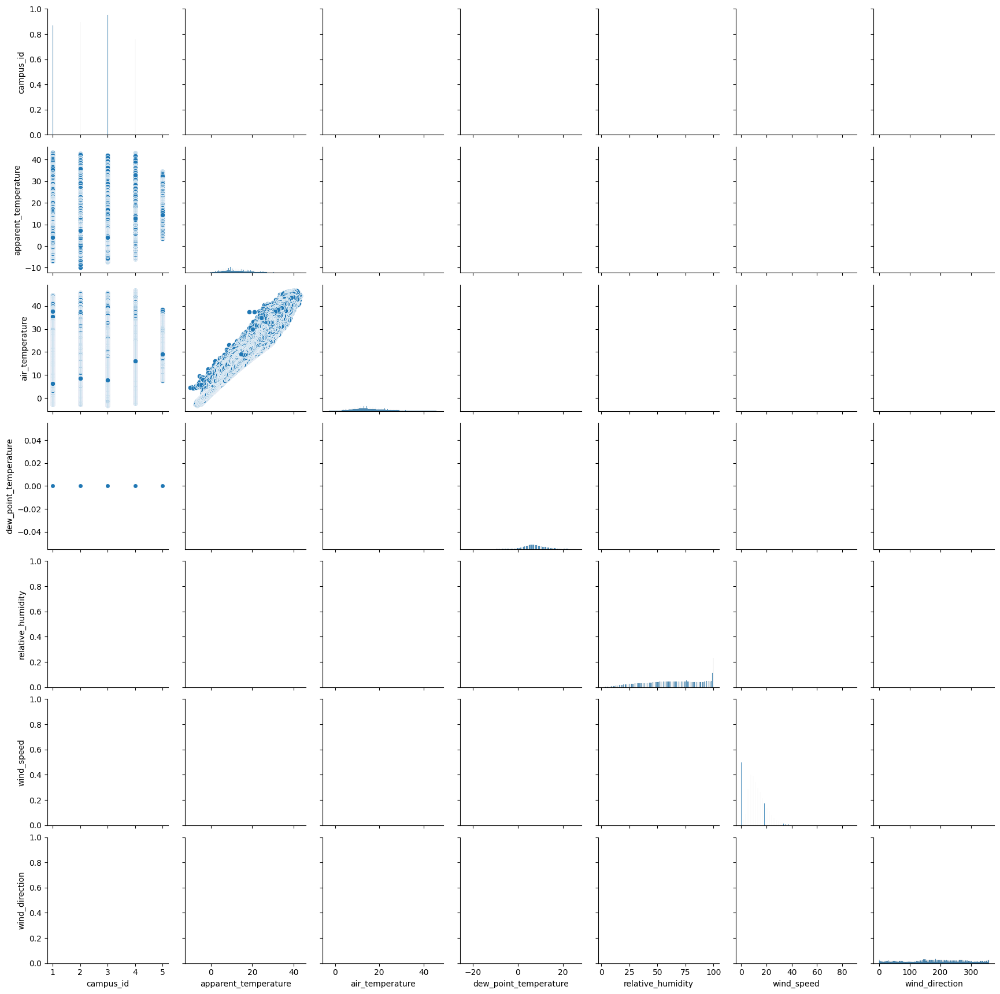

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=df.drop(['timestamp'],axis=1))
plt.title('EDA Bivariate Analysis')
plt.show()

### EDA Multivariate Analysis
As the name suggests, Multivariate analysis looks at more than two variables. Multivariate analysis is one of the most useful methods to determine relationships and analyze patterns for any dataset.

##### A heat map is widely been used for Multivariate Analysis

Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.

In our example heat map shows the correlation between the variables.

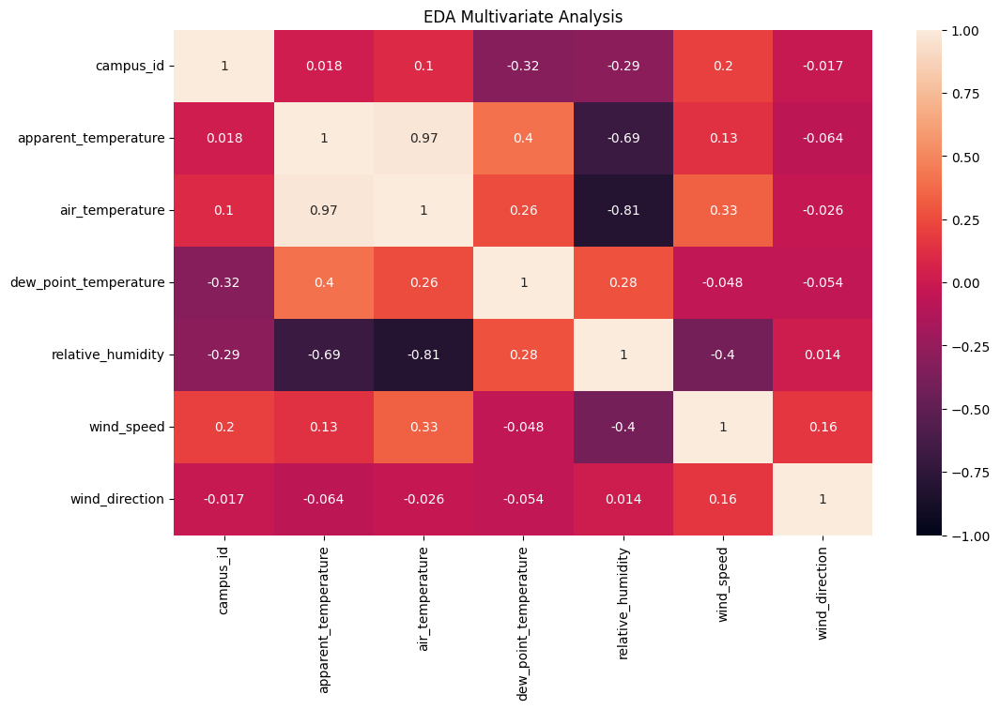

In [ ]:
plt.figure(figsize=(12, 7))
sns.heatmap(df.drop(['timestamp'],axis=1).corr(), annot = True, vmin = -1, vmax = 1)
plt.title('EDA Multivariate Analysis')
plt.show()

### Distribution of Consumption:

Plot a histogram or density plot to visualize the distribution of consumption.
Calculate summary statistics such as mean, median, standard deviation, min, max, etc., for consumption.

In [ ]:
df.columns

Index(['campus_id', 'timestamp', 'apparent_temperature', 'air_temperature',
       'dew_point_temperature', 'relative_humidity', 'wind_speed',
       'wind_direction'],
      dtype='object')

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['apparent_temperature'], bins=50, kde=True)
plt.title('Distribution of apparent_temperature')
plt.xlabel('apparent_temperature')
plt.ylabel('Frequency')
plt.show()

KeyError: 'apparent_temperature'

<Figure size 1000x600 with 0 Axes>

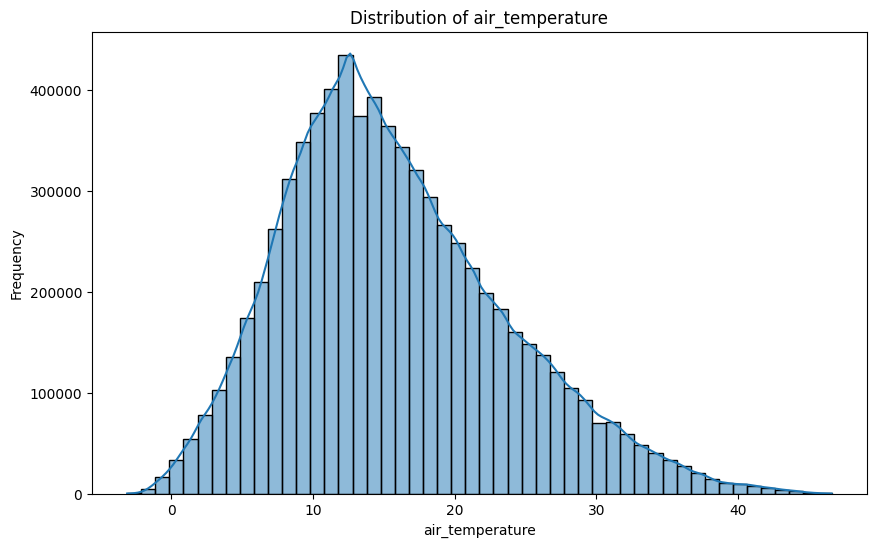

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['air_temperature'], bins=50, kde=True)
plt.title('Distribution of air_temperature')
plt.xlabel('air_temperature')
plt.ylabel('Frequency')
plt.show()

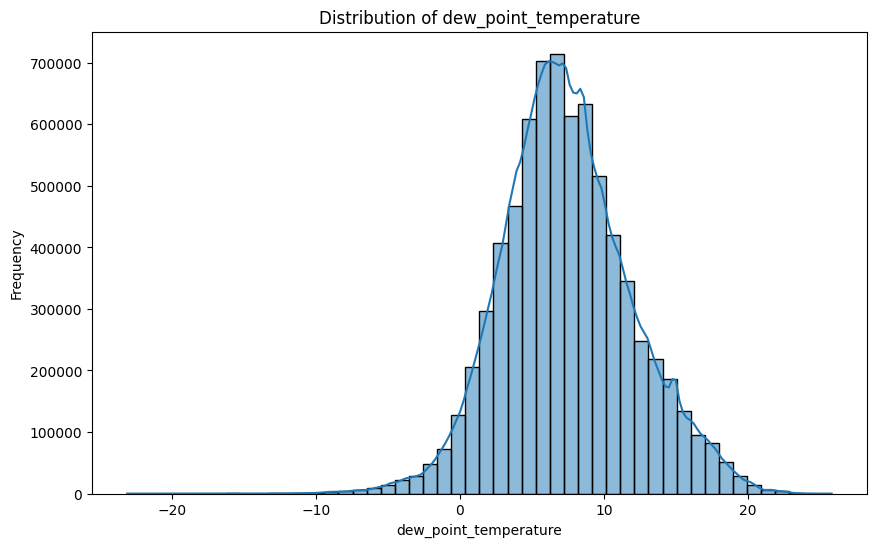

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['dew_point_temperature'], bins=50, kde=True)
plt.title('Distribution of dew_point_temperature')
plt.xlabel('dew_point_temperature')
plt.ylabel('Frequency')
plt.show()

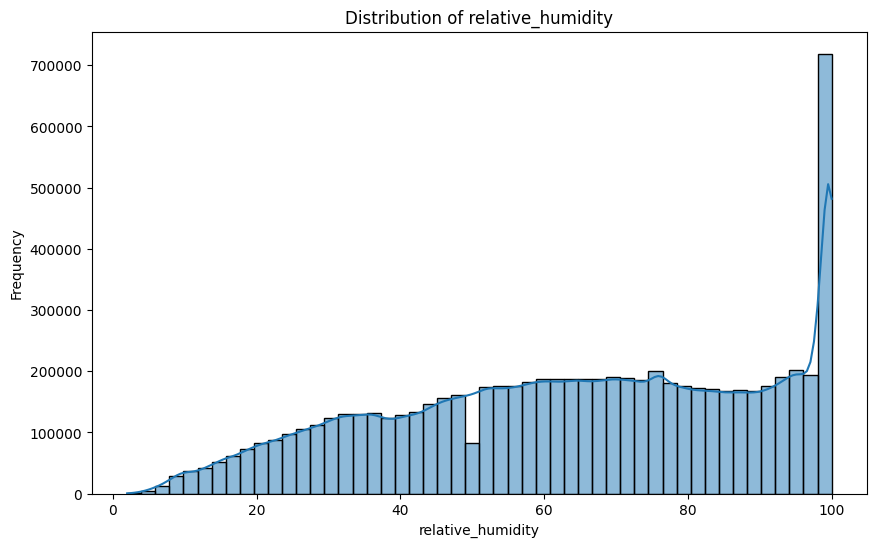

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['relative_humidity'], bins=50, kde=True)
plt.title('Distribution of relative_humidity')
plt.xlabel('relative_humidity')
plt.ylabel('Frequency')
plt.show()

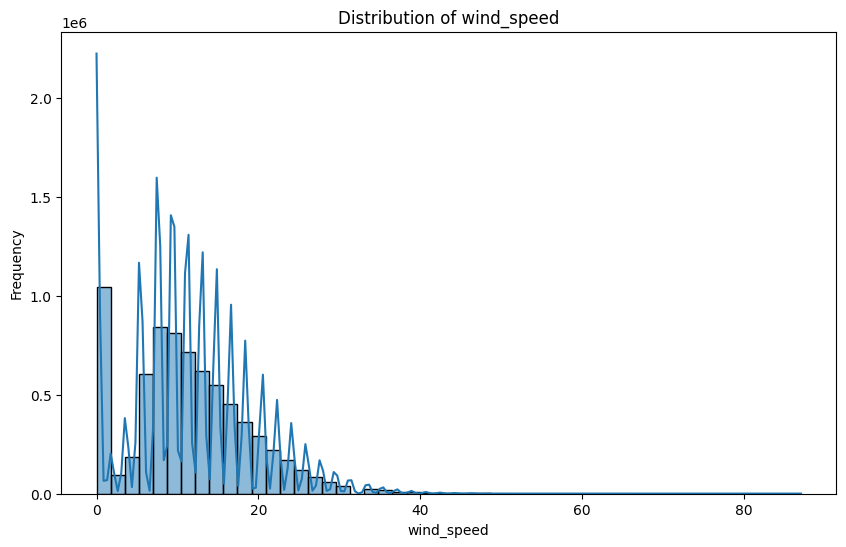

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['wind_speed'], bins=50, kde=True)
plt.title('Distribution of wind_speed')
plt.xlabel('wind_speed')
plt.ylabel('Frequency')
plt.show()

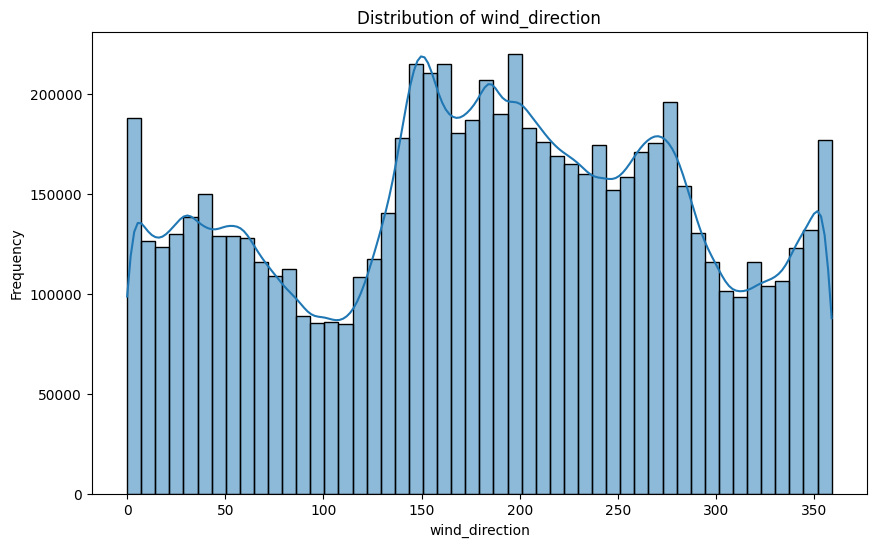

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['wind_direction'], bins=50, kde=True)
plt.title('Distribution of wind_direction')
plt.xlabel('wind_direction')
plt.ylabel('Frequency')
plt.show()

In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['apparent_temperature'].describe())


Summary Statistics for Consumption:
count    7.336534e+06
mean     1.313754e+01
std      7.932209e+00
min     -9.800000e+00
25%      7.300000e+00
50%      1.200000e+01
75%      1.840000e+01
max      4.320000e+01
Name: apparent_temperature, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['air_temperature'].describe())


Summary Statistics for Consumption:
count    7.336534e+06
mean     1.577145e+01
std      7.864219e+00
min     -3.100000e+00
25%      1.010000e+01
50%      1.460000e+01
75%      2.060000e+01
max      4.660000e+01
Name: air_temperature, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['dew_point_temperature'].describe())


Summary Statistics for Consumption:
count    7.336534e+06
mean     7.416473e+00
std      4.483788e+00
min     -2.310000e+01
25%      4.500000e+00
50%      7.200000e+00
75%      1.020000e+01
max      2.580000e+01
Name: dew_point_temperature, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['relative_humidity'].describe())


Summary Statistics for Consumption:
count    7.336534e+06
mean     6.444978e+01
std      2.507516e+01
min      2.000000e+00
25%      4.500000e+01
50%      6.600000e+01
75%      8.600000e+01
max      1.000000e+02
Name: relative_humidity, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['wind_speed'].describe())


Summary Statistics for Consumption:
count    7.336534e+06
mean     1.122855e+01
std      7.701911e+00
min      0.000000e+00
25%      5.400000e+00
50%      1.120000e+01
75%      1.660000e+01
max      8.710000e+01
Name: wind_speed, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['wind_direction'].describe())


Summary Statistics for Consumption:
count    7.336534e+06
mean     1.823718e+02
std      9.865130e+01
min      0.000000e+00
25%      1.070000e+02
50%      1.860000e+02
75%      2.610000e+02
max      3.590000e+02
Name: wind_direction, dtype: float64


### Consumption Trends Over Time:

Plot a time series graph of consumption over the entire time range.
Analyze any noticeable trends, seasonality, or patterns in the consumption data.

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_7200\1071883015.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['timestamp'] = pd.to_datetime(df['timestamp'])


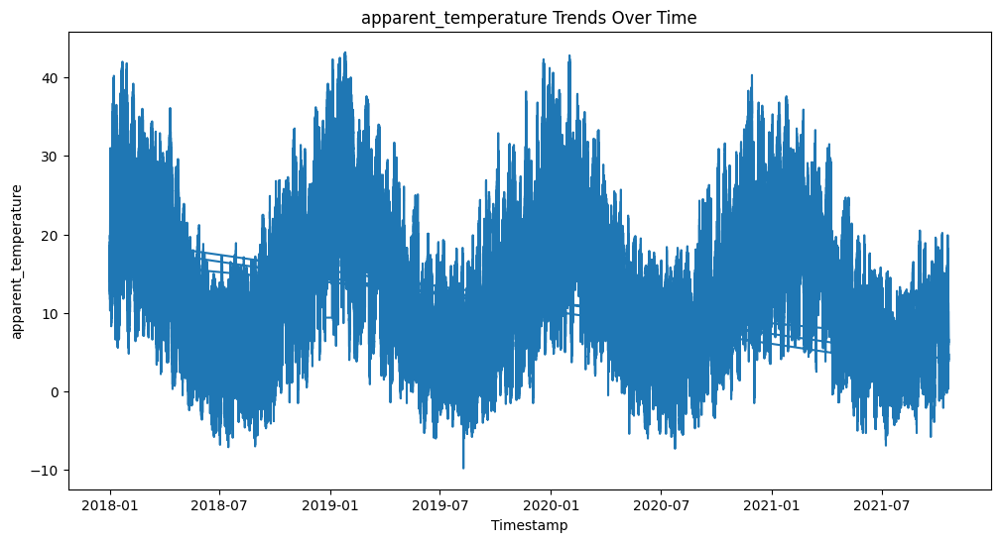

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['apparent_temperature'])
plt.title('apparent_temperature Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('apparent_temperature')
plt.show()

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_7200\141699710.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['timestamp'] = pd.to_datetime(df['timestamp'])


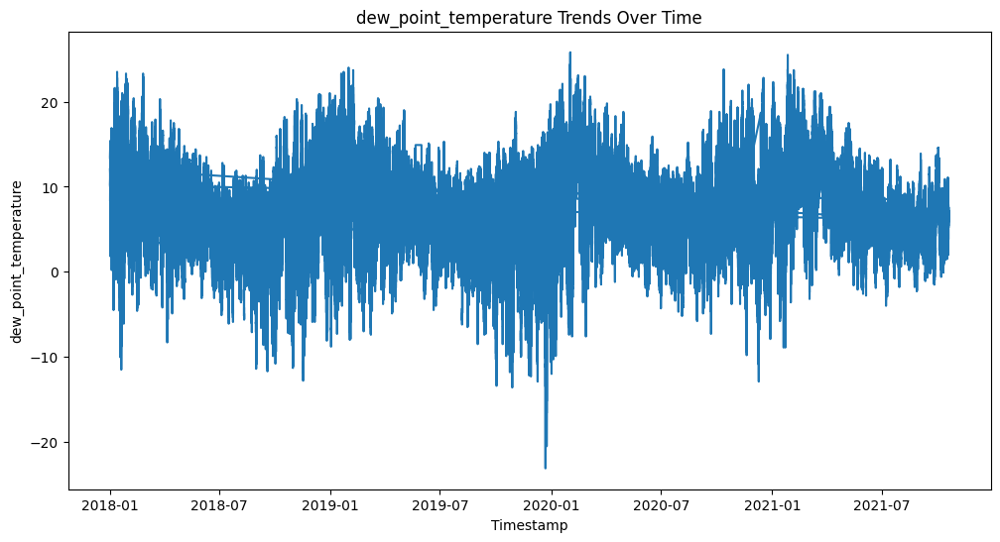

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['dew_point_temperature'])
plt.title('dew_point_temperature Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('dew_point_temperature')
plt.show()

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_7200\3069687448.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['timestamp'] = pd.to_datetime(df['timestamp'])


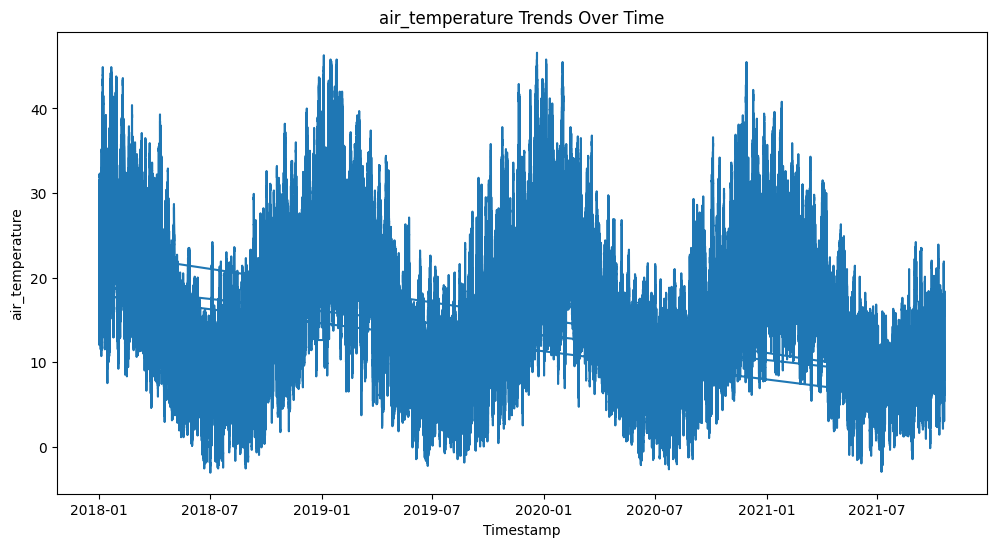

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['air_temperature'])
plt.title('air_temperature Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('air_temperature')
plt.show()

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_7200\2407925383.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['timestamp'] = pd.to_datetime(df['timestamp'])


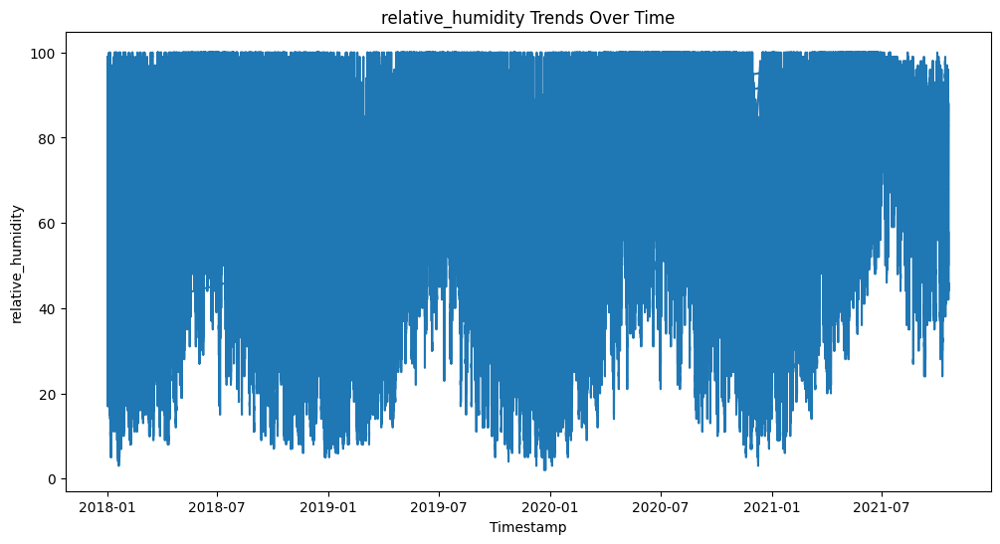

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['relative_humidity'])
plt.title('relative_humidity Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('relative_humidity')
plt.show()

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_7200\1065713032.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['timestamp'] = pd.to_datetime(df['timestamp'])


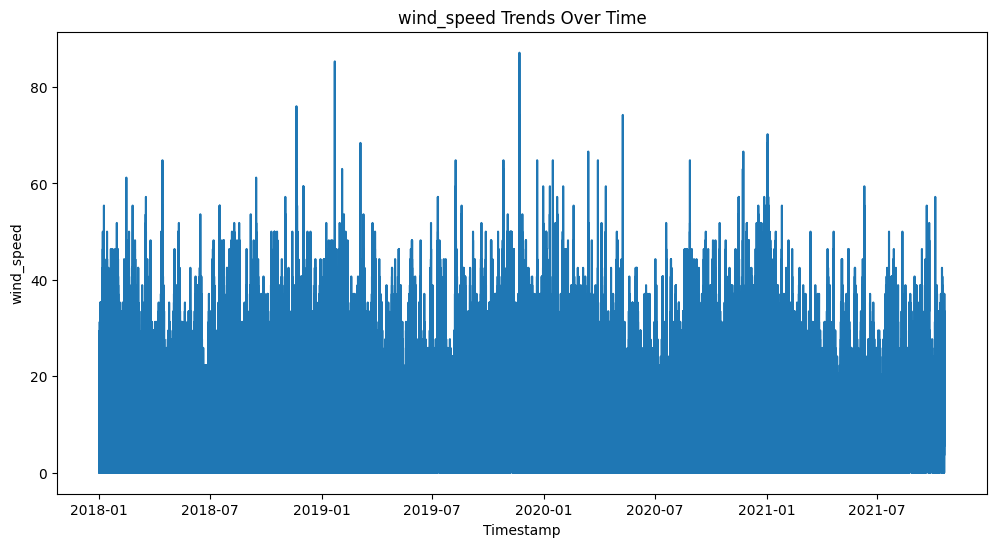

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['wind_speed'])
plt.title('wind_speed Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('wind_speed')
plt.show()

In [ ]:
df.columns

Index(['campus_id', 'timestamp', 'apparent_temperature', 'air_temperature',
       'dew_point_temperature', 'relative_humidity', 'wind_speed',
       'wind_direction'],
      dtype='object')

### Temporal Analysis:

Analyze consumption patterns based on different time intervals (e.g., hourly, daily, weekly).
Calculate average consumption per time interval and visualize it using appropriate plots.

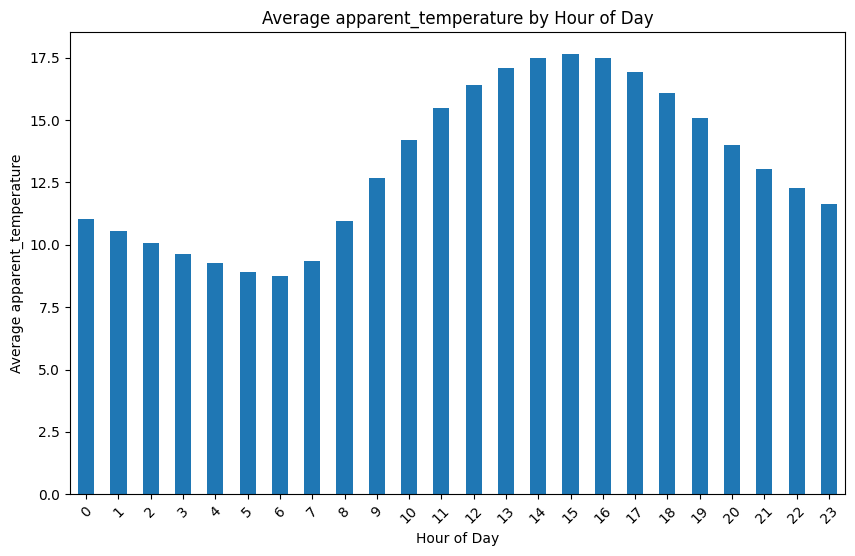

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['apparent_temperature'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average apparent_temperature by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average apparent_temperature')
plt.xticks(rotation=45)
plt.show()

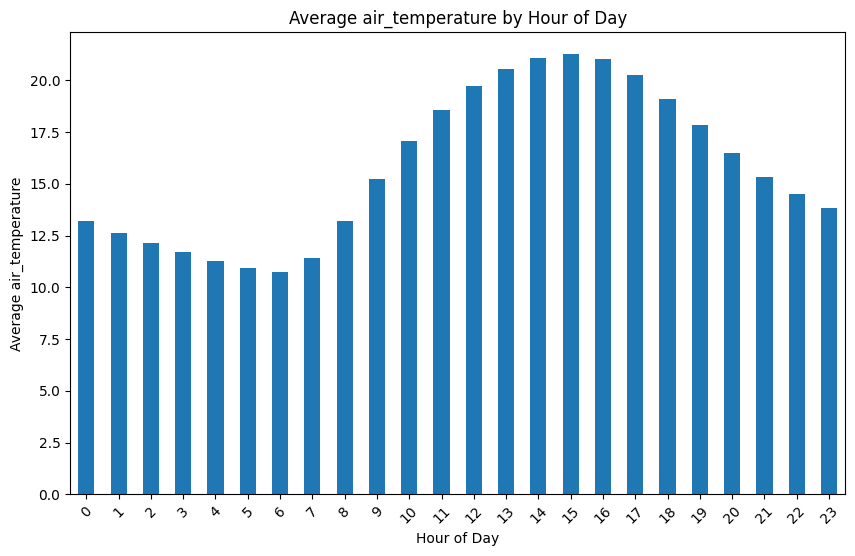

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['air_temperature'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average air_temperature by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average air_temperature')
plt.xticks(rotation=45)
plt.show()

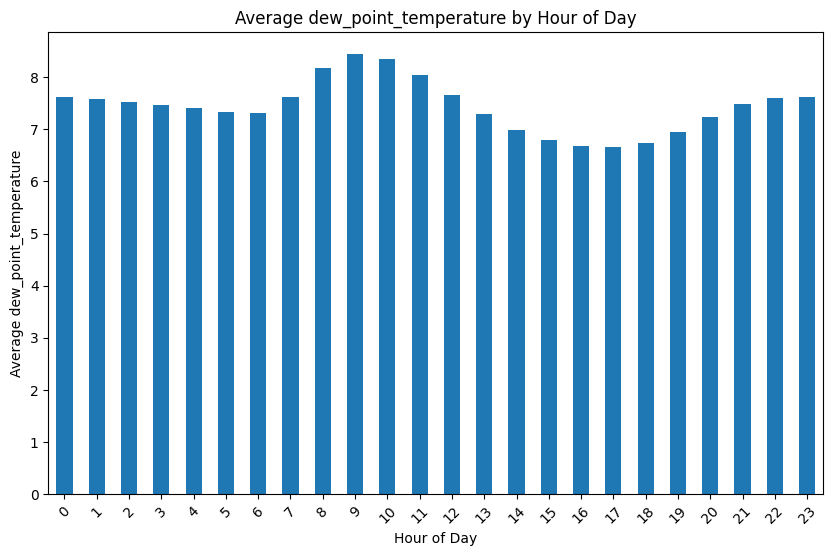

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['dew_point_temperature'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average dew_point_temperature by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average dew_point_temperature')
plt.xticks(rotation=45)
plt.show()

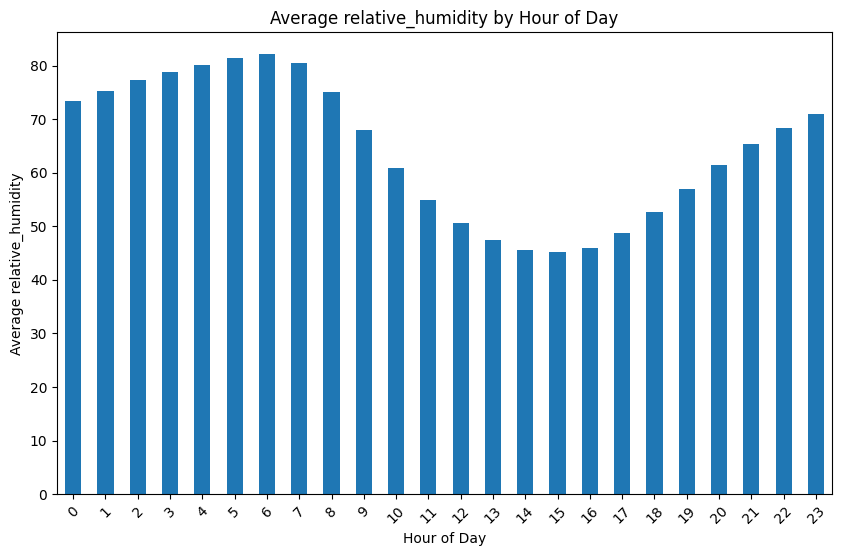

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['relative_humidity'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average relative_humidity by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average relative_humidity')
plt.xticks(rotation=45)
plt.show()

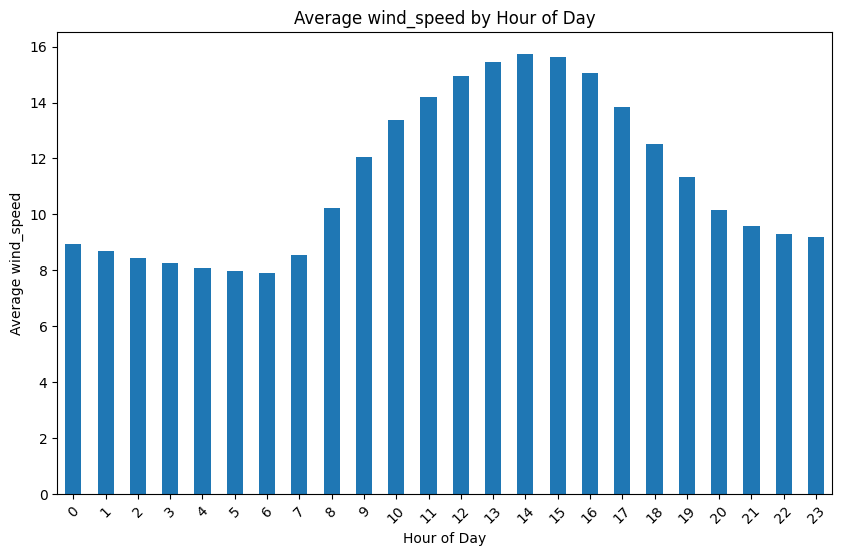

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['wind_speed'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average wind_speed by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average wind_speed')
plt.xticks(rotation=45)
plt.show()

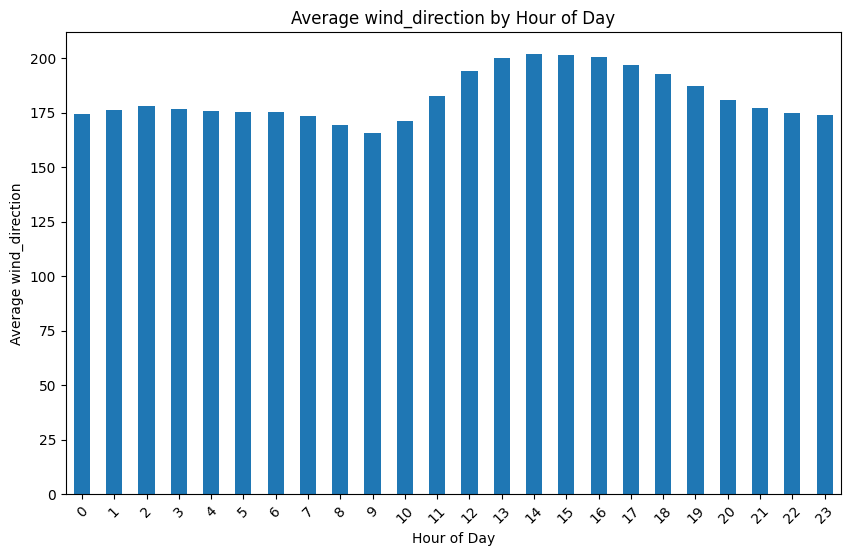

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['wind_direction'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average wind_direction by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average wind_direction')
plt.xticks(rotation=45)
plt.show()

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

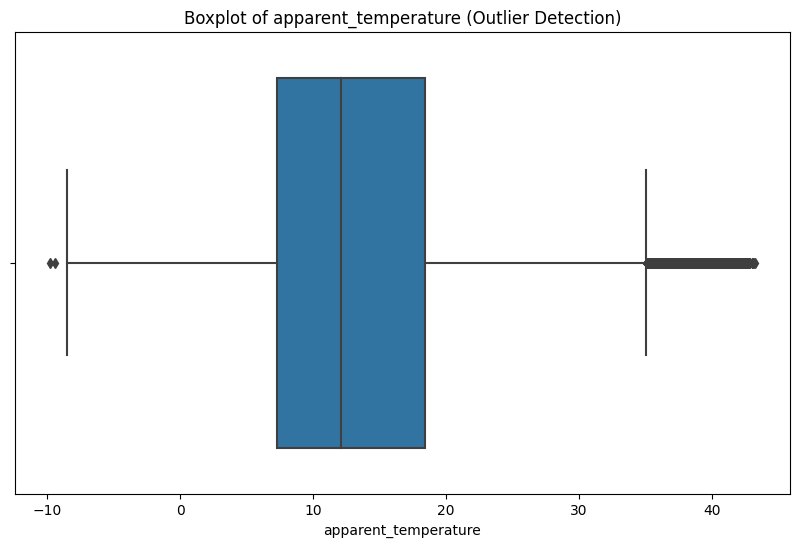

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['apparent_temperature'])
plt.title('Boxplot of apparent_temperature (Outlier Detection)')
plt.xlabel('apparent_temperature')
plt.show()

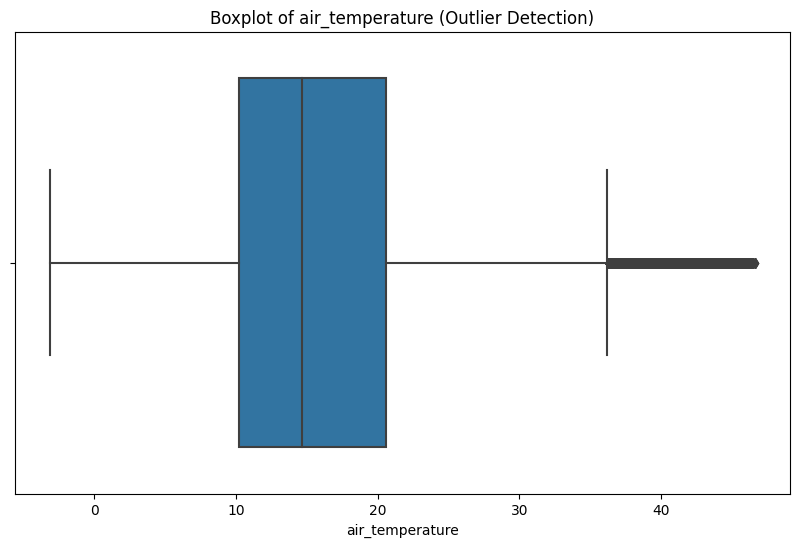

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['air_temperature'])
plt.title('Boxplot of air_temperature (Outlier Detection)')
plt.xlabel('air_temperature')
plt.show()

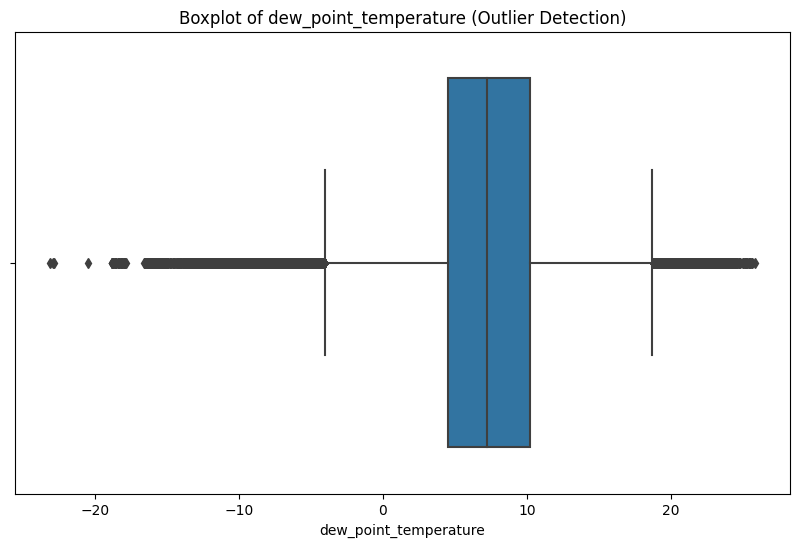

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['dew_point_temperature'])
plt.title('Boxplot of dew_point_temperature (Outlier Detection)')
plt.xlabel('dew_point_temperature')
plt.show()

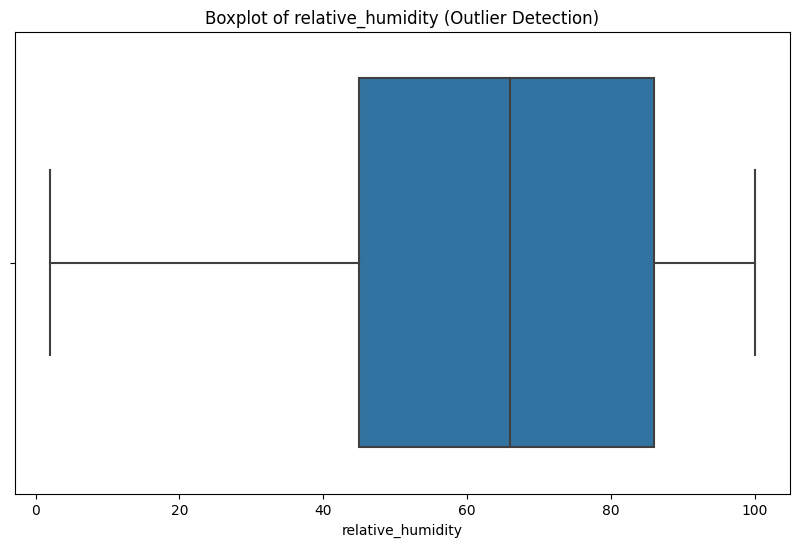

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['relative_humidity'])
plt.title('Boxplot of relative_humidity (Outlier Detection)')
plt.xlabel('relative_humidity')
plt.show()

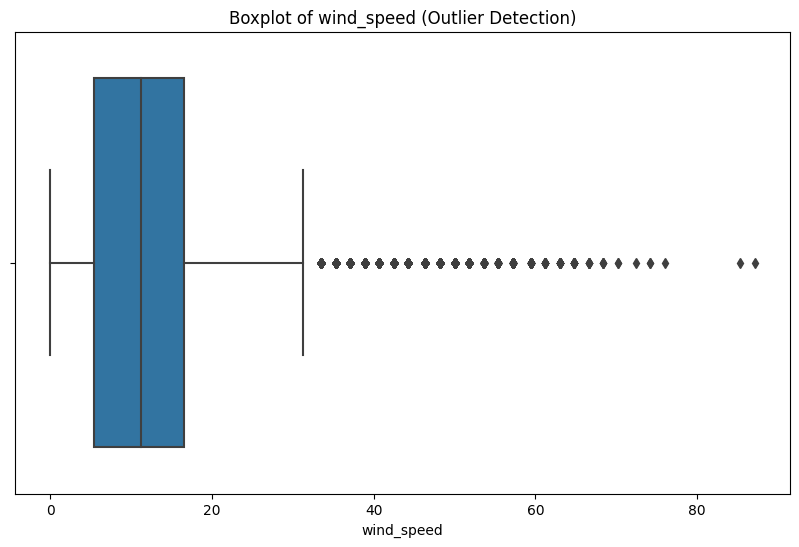

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['wind_speed'])
plt.title('Boxplot of wind_speed (Outlier Detection)')
plt.xlabel('wind_speed')
plt.show()

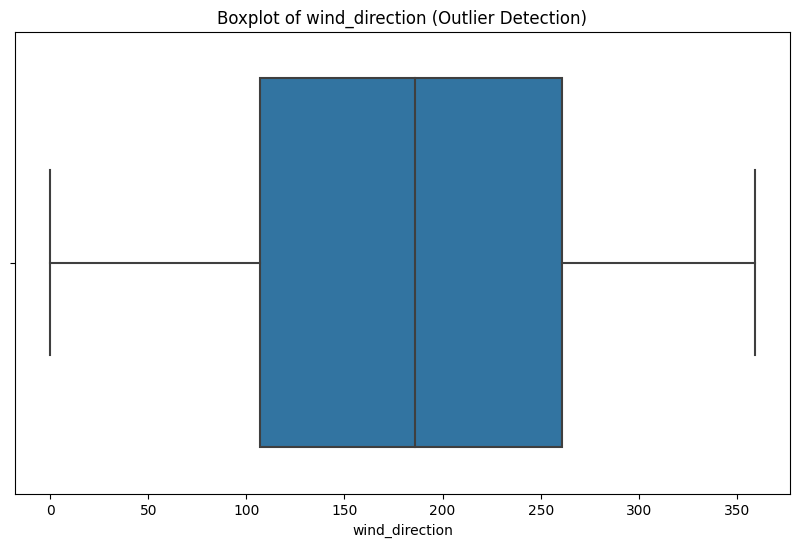

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['wind_direction'])
plt.title('Boxplot of wind_direction (Outlier Detection)')
plt.xlabel('wind_direction')
plt.show()

### Correlation Analysis:

Check for correlations between meter_id, timestamp, and consumption.
Visualize correlations using a heatmap or correlation matrix.

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_16648\3322742227.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


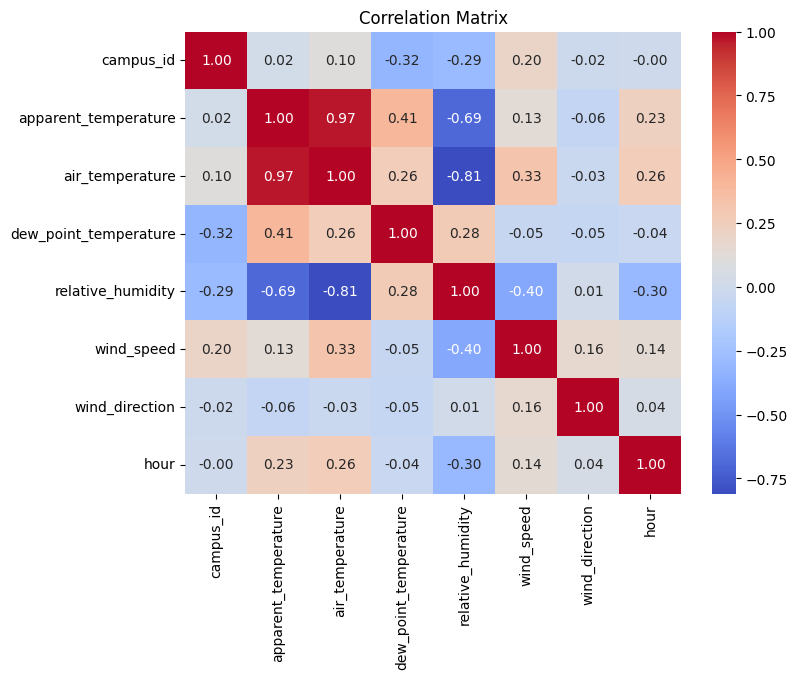

In [ ]:
# Correlation Analysis
correlation_matrix = df.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### Seasonal Decomposition:

Perform seasonal decomposition (e.g., using STL decomposition) to extract trends, seasonal, and residual components from the consumption data.

In [ ]:
df.columns

Index(['campus_id', 'timestamp', 'apparent_temperature', 'air_temperature',
       'dew_point_temperature', 'relative_humidity', 'wind_speed',
       'wind_direction', 'hour'],
      dtype='object')

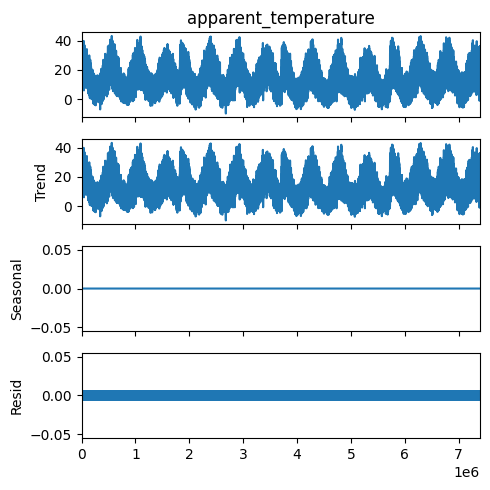

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['apparent_temperature'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

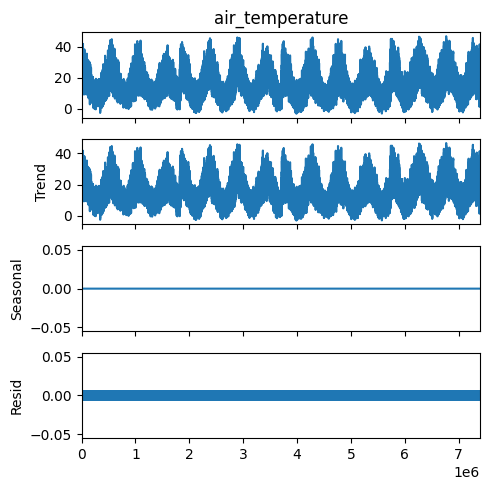

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['air_temperature'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

MemoryError: Unable to allocate 113. MiB for an array with shape (7396520, 2) and data type float64

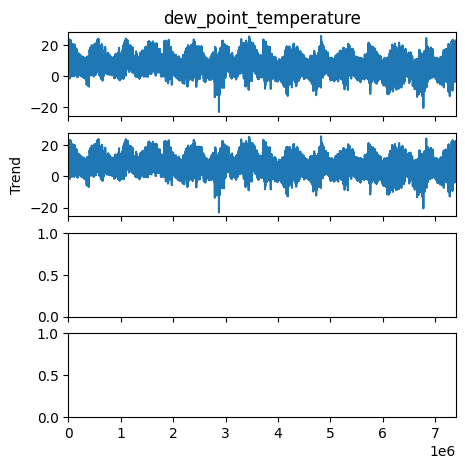

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['dew_point_temperature'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

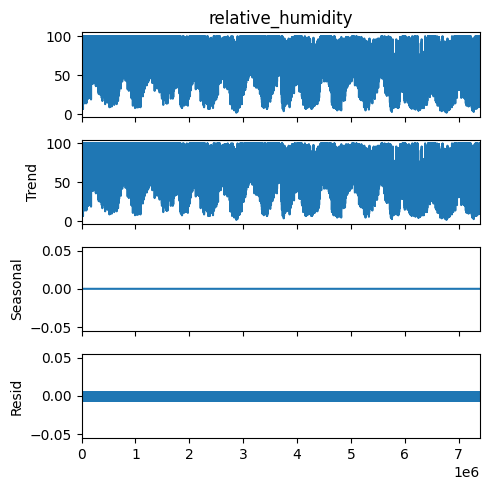

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['relative_humidity'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

### Data Quality Check:

Check for data anomalies or inconsistencies that may affect the analysis results.
Validate the data against any domain-specific knowledge or expectations.

In [ ]:
df.columns

Index(['campus_id', 'timestamp', 'apparent_temperature', 'air_temperature',
       'dew_point_temperature', 'relative_humidity', 'wind_speed',
       'wind_direction'],
      dtype='object')

In [ ]:
# Check for duplicate rows
duplicate_rows = df[df.duplicated()]
if duplicate_rows.empty:
    print("No duplicate rows found.")
else:
    print("Duplicate rows found.")
    print(duplicate_rows)

# Check for negative consumption values
negative_consumption = df[df['air_temperature'] < 0]
if negative_consumption.empty:
    print("No negative consumption values found.")
else:
    print("Negative consumption values found.")
    print(negative_consumption)

# Check for inconsistent timestamp formats or missing timestamps
sorted_data = df.sort_values(by='timestamp')
time_diff = sorted_data['timestamp'].diff().dropna()
if (time_diff.dt.total_seconds() > 900).any():
    print("Timestamps are not consistently spaced (greater than 15 minutes apart).")
else:
    print("Timestamps are consistently spaced (15 minutes apart).")

No duplicate rows found.
Negative consumption values found.
         campus_id           timestamp  apparent_temperature  air_temperature  \
243816           1 2018-06-19 07:36:00                  -3.6             -0.1   
243817           1 2018-06-19 07:37:00                  -3.6             -0.1   
243818           1 2018-06-19 07:38:00                  -3.6             -0.1   
243819           1 2018-06-19 07:39:00                  -3.1             -0.1   
262535           1 2018-07-02 07:35:00                  -2.4             -0.1   
...            ...                 ...                   ...              ...   
7099615          4 2020-08-06 05:43:00                  -4.4             -0.1   
7099616          4 2020-08-06 05:44:00                  -4.4             -0.1   
7099617          4 2020-08-06 05:45:00                  -4.4             -0.1   
7099618          4 2020-08-06 05:46:00                  -4.4             -0.1   
7099619          4 2020-08-06 05:47:00           

### Feature Engineering:

Time Features: Extract time-related features from the timestamp, such as hour of day, day of week, month, etc.
Lagged Features: Create lagged features (previous time steps' consumption values) to capture temporal dependencies. 

In [ ]:
# Assuming 'data' is your dataframe with the timestamp column converted to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [ ]:
# Time Features
df['hour'] = df['timestamp'].dt.hour
df['day_of_week'] = df['timestamp'].dt.dayofweek
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Lagged Features (e.g., lagged consumption values)
num_lags = 3  # You can adjust the number of lagged features
for lag in range(1, num_lags + 1):
    df[f'lag_{lag}'] = df['air_temperature'].shift(lag)

### Feature Taregt

In [ ]:
df.columns

Index(['campus_id', 'timestamp', 'apparent_temperature', 'air_temperature',
       'dew_point_temperature', 'relative_humidity', 'wind_speed',
       'wind_direction', 'hour', 'day_of_week', 'month', 'year', 'lag_1',
       'lag_2', 'lag_3'],
      dtype='object')

In [ ]:
# Drop rows with NaN values due to lagging
df.dropna(inplace=True)

# Split data into features (X) and target variable (y)
X = df.drop(['campus_id', 'timestamp', 'apparent_temperature',
       'dew_point_temperature', 'relative_humidity', 'wind_speed',
       'wind_direction', 'hour', 'day_of_week', 'month', 'year', 'lag_1',
       'lag_2', 'lag_3'], axis=1)
y = df['air_temperature']

print(X, y)

         air_temperature
3                   16.1
4                   16.0
5                   16.0
6                   16.0
7                   16.0
...                  ...
7386706             19.0
7386707             19.0
7386708             18.9
7386709             18.9
7386710             19.0

[7336531 rows x 1 columns] 3          16.1
4          16.0
5          16.0
6          16.0
7          16.0
           ... 
7386706    19.0
7386707    19.0
7386708    18.9
7386709    18.9
7386710    19.0
Name: air_temperature, Length: 7336531, dtype: float64


### Impute Missing Values


In [ ]:
# Impute missing values in X
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed
X_imputed = imputer.fit_transform(X)

### Train Test Split

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Model Creation

Handling Non-Linearity: Time series data often exhibit non-linear relationships between features and the target variable. Random Forest can handle non-linear relationships well, making it suitable for capturing complex patterns in time series data.

Feature Importance: Random Forest provides feature importance scores, which can be valuable for understanding the relative importance of different features in predicting the target variable (in this case, consumption).

Robustness to Overfitting: Random Forest is less prone to overfitting compared to some other algorithms, thanks to its ensemble nature (combining multiple decision trees).

Ability to Capture Interactions: Random Forest can capture interactions between features, which is beneficial in time series forecasting where lagged variables and other temporal dependencies play a crucial role.

Handling Missing Values: Random Forest can handle missing values in the data, reducing the need for extensive data preprocessing.

In [ ]:
# Model creation (Random Forest Regressor as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)  # Adjust the number of estimators as needed
model.fit(X_train.iloc[:100000], y_train.iloc[:100000])  # remove iloc for all thr data

RandomForestRegressor(random_state=42)

### Model Evaluation

In [ ]:
# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 1.8480938208564642e-06


### Single Feature Graph

In [ ]:
df.columns

Index(['campus_id', 'timestamp', 'apparent_temperature', 'air_temperature',
       'dew_point_temperature', 'relative_humidity', 'wind_speed',
       'wind_direction', 'hour', 'day_of_week', 'month', 'year', 'lag_1',
       'lag_2', 'lag_3'],
      dtype='object')

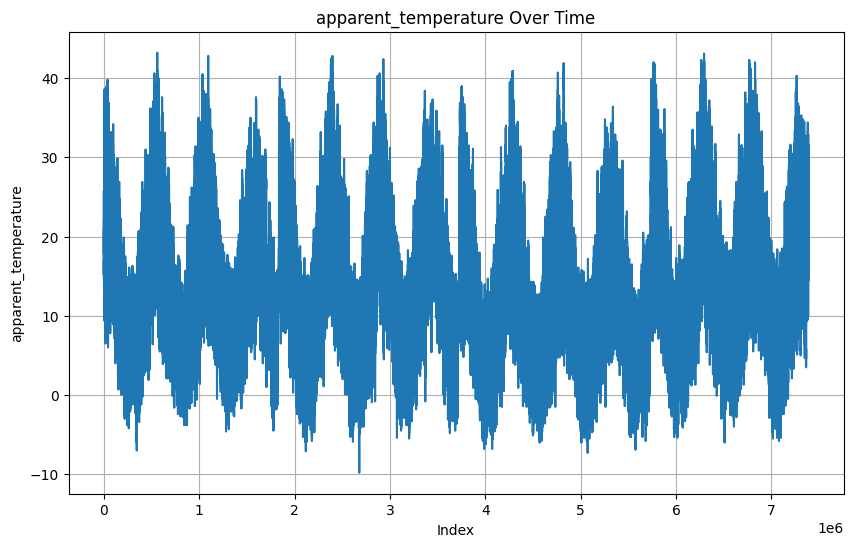

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['apparent_temperature'])
plt.title('apparent_temperature Over Time')
plt.xlabel('Index')
plt.ylabel('apparent_temperature')
plt.grid(True)  # Add grid lines for better readability
plt.show()

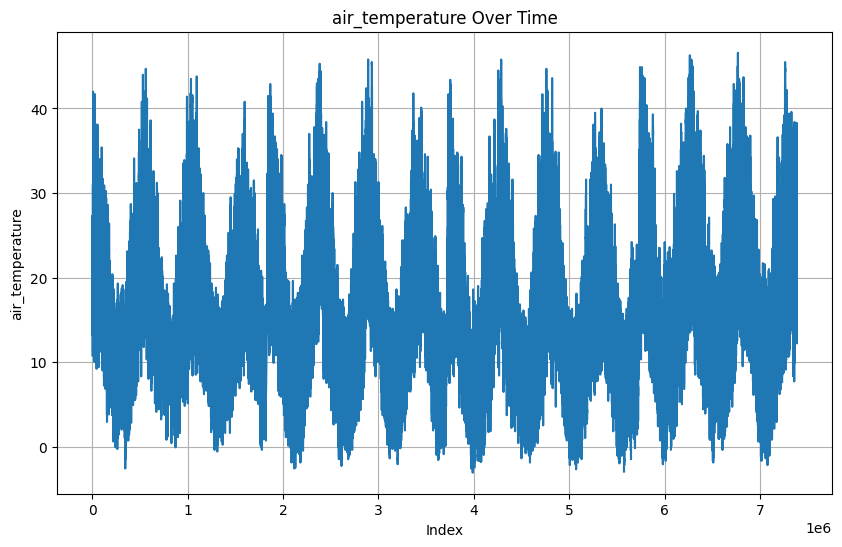

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['air_temperature'])
plt.title('air_temperature Over Time')
plt.xlabel('Index')
plt.ylabel('air_temperature')
plt.grid(True)  # Add grid lines for better readability
plt.show()

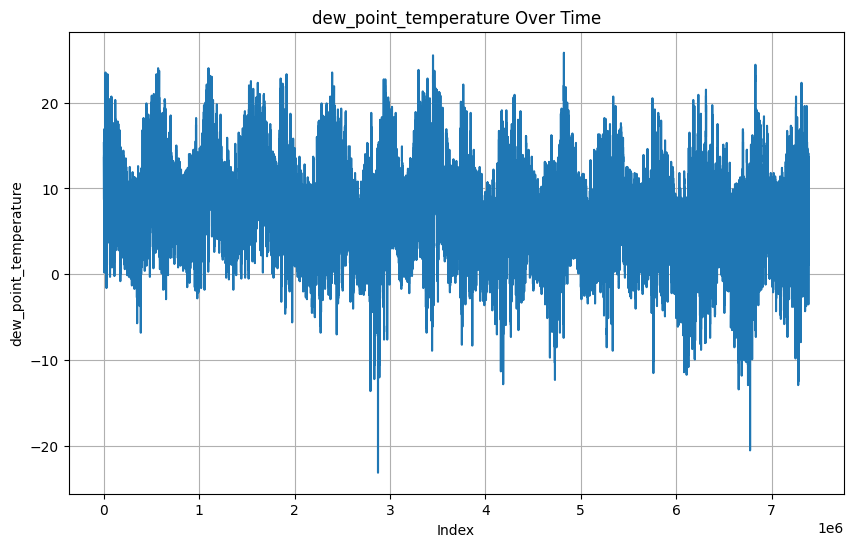

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['dew_point_temperature'])
plt.title('dew_point_temperature Over Time')
plt.xlabel('Index')
plt.ylabel('dew_point_temperature')
plt.grid(True)  # Add grid lines for better readability
plt.show()

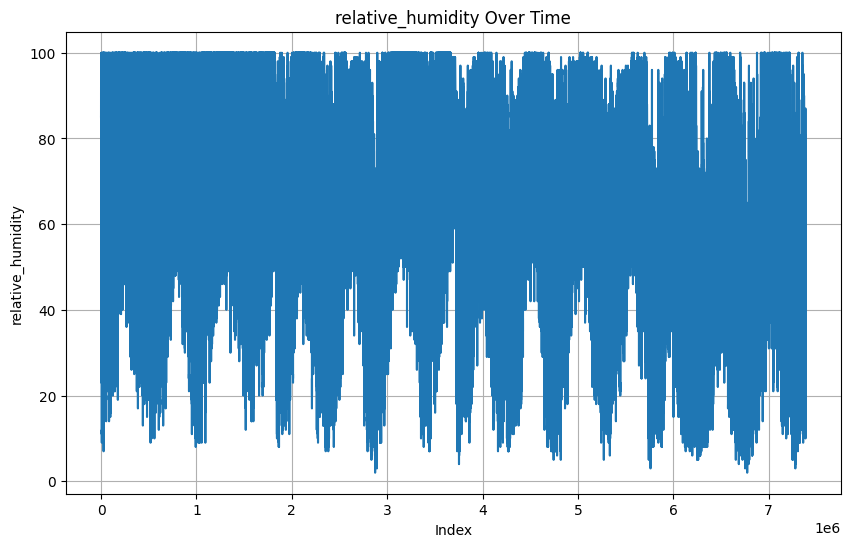

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['relative_humidity'])
plt.title('relative_humidity Over Time')
plt.xlabel('Index')
plt.ylabel('relative_humidity')
plt.grid(True)  # Add grid lines for better readability
plt.show()

### Cluster Analysis

In [ ]:
df.columns

Index(['campus_id', 'timestamp', 'apparent_temperature', 'air_temperature',
       'dew_point_temperature', 'relative_humidity', 'wind_speed',
       'wind_direction'],
      dtype='object')

In [ ]:
grouped = df.groupby('timestamp').mean()
grouped = grouped.drop('campus_id', axis = 1)

grouped

,apparent_temperature,air_temperature,dew_point_temperature,relative_humidity,wind_speed,wind_direction
timestamp,,,,,,
2018-01-01 00:00:00,17.775,19.000,11.025,62.25,8.30,142.25
2018-01-01 00:01:00,17.750,18.900,11.150,63.00,7.85,141.25
2018-01-01 00:02:00,17.775,18.900,11.150,63.00,7.85,138.75
2018-01-01 00:03:00,17.700,18.925,11.175,63.00,8.30,140.75
2018-01-01 00:04:00,17.150,18.850,11.100,63.00,10.65,144.50
...,...,...,...,...,...,...
2022-04-30 21:30:00,9.820,10.880,8.360,85.00,NaN,NaN
2022-04-30 22:00:00,9.540,10.800,8.500,86.60,NaN,NaN
2022-04-30 22:30:00,9.360,10.600,8.220,86.20,NaN,NaN


In [ ]:
# Read the data into a pandas DataFrame
data = pd.read_csv("../Final_dataset/weather_data.csv")

# Convert 'timestamp' column to datetime format
data['timestamp'] = pd.to_datetime(data['timestamp'], errors='coerce')

# Drop rows with NaT (Not a Time) values, if any
data = data.dropna(subset=['timestamp'])

# Extract date from 'timestamp'
data['date'] = data['timestamp'].dt.date

# Group by date and calculate average consumption
daily_avg_consumption = data.groupby('date')['air_temperature'].mean()

# Print the daily average consumption

print(daily_avg_consumption)

date
2018-01-01    21.913733
2018-01-02    20.837882
2018-01-03    20.051597
2018-01-04    22.556233
2018-01-05    25.861615
                ...    
2022-04-26    15.799592
2022-04-27    16.365683
2022-04-28    17.319573
2022-04-29    17.296284
2022-04-30    14.098851
Name: air_temperature, Length: 1581, dtype: float64


In [ ]:
# Convert the Series to a DataFrame with columns 'date' and 'consumption'
df = daily_avg_consumption.reset_index()
df.columns = ['date', 'air_temperature']
df

,date,air_temperature
0,2018-01-01,21.913733
1,2018-01-02,20.837882
2,2018-01-03,20.051597
3,2018-01-04,22.556233
4,2018-01-05,25.861615
...,...,...
1576,2022-04-26,15.799592
1577,2022-04-27,16.365683
1578,2022-04-28,17.319573
1579,2022-04-29,17.296284


In [ ]:
df_result = daily_avg_consumption.reset_index()
daily_avg_consumption = df_result.rename(columns={'air_temperature': 'consuption'})
daily_avg_consumption


,date,consuption
0,2018-01-01,21.913733
1,2018-01-02,20.837882
2,2018-01-03,20.051597
3,2018-01-04,22.556233
4,2018-01-05,25.861615
...,...,...
1576,2022-04-26,15.799592
1577,2022-04-27,16.365683
1578,2022-04-28,17.319573
1579,2022-04-29,17.296284


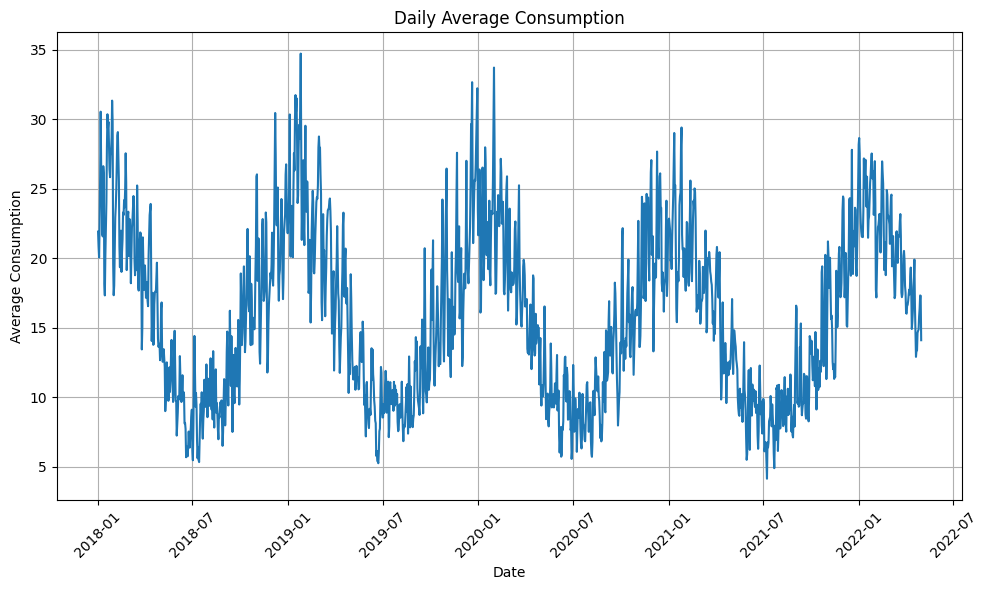

In [ ]:
# Plotting the daily average consumption
plt.figure(figsize=(10, 6))
plt.plot(daily_avg_consumption.iloc[:, 0], daily_avg_consumption.iloc[:, 1])
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Daily Average Consumption')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Weekends & Weekdays Consuption Graph

In [ ]:
# Read the data into a pandas DataFrame
df = daily_avg_consumption.copy()  # Call the copy method with parentheses

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Extract weekday and weekend data
weekdays = df[df['date'].dt.dayofweek < 5]  # Monday to Friday (0-4)
weekends = df[df['date'].dt.dayofweek >= 5]  # Saturday and Sunday (5-6)

# Print the resulting DataFrames
print(weekdays)
print(weekends)

           date  consuption
0    2018-01-01   21.913733
1    2018-01-02   20.837882
2    2018-01-03   20.051597
3    2018-01-04   22.556233
4    2018-01-05   25.861615
...         ...         ...
1575 2022-04-25   14.861885
1576 2022-04-26   15.799592
1577 2022-04-27   16.365683
1578 2022-04-28   17.319573
1579 2022-04-29   17.296284

[1130 rows x 2 columns]
           date  consuption
5    2018-01-06   30.545920
6    2018-01-07   26.478889
12   2018-01-13   18.161632
13   2018-01-14   17.322865
19   2018-01-20   29.349774
...         ...         ...
1566 2022-04-16   18.605785
1567 2022-04-17   19.902049
1573 2022-04-23   14.628750
1574 2022-04-24   14.771667
1580 2022-04-30   14.098851

[451 rows x 2 columns]


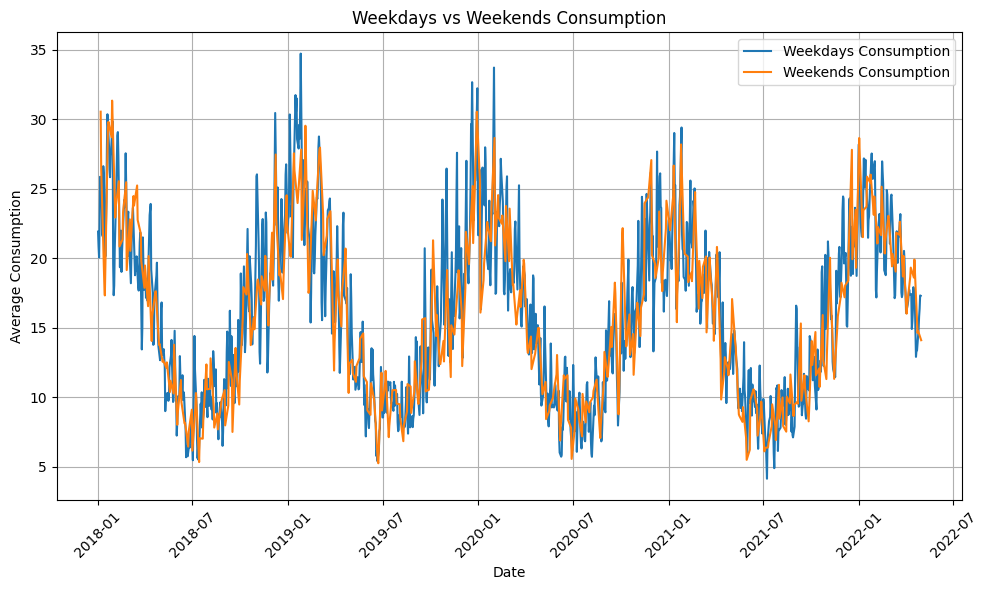

In [ ]:
# Plotting the comparison between weekdays and weekends consumption
plt.figure(figsize=(10, 6))
plt.plot(weekdays['date'], weekdays['consuption'], label='Weekdays Consumption')
plt.plot(weekends['date'], weekends['consuption'], label='Weekends Consumption')
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Weekdays vs Weekends Consumption')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

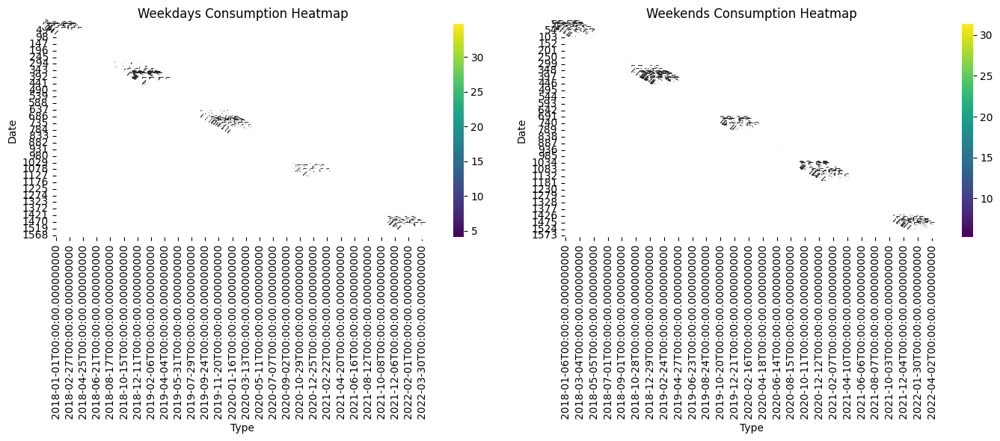

In [ ]:
# Pivot the DataFrames for heatmap plotting
pivot_weekdays = weekdays.pivot( columns='date', values='consuption')
pivot_weekends = weekends.pivot( columns='date', values='consuption')

# Plot the heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(pivot_weekdays, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekdays Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.subplot(1, 2, 2)
sns.heatmap(pivot_weekends, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekends Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.tight_layout()
plt.show()

### Monthly Trend

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/weather_data.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date components: month and year
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Group by year and month, calculate average consumption
monthly_avg_consumption = df.groupby(['year', 'month'])['consumption'].mean().reset_index()

# Plotting for every month
plt.figure(figsize=(12, 8))
for year in monthly_avg_consumption['year'].unique():
    year_data = monthly_avg_consumption[monthly_avg_consumption['year'] == year]
    plt.plot(year_data['month'], year_data['consumption'], label=f'Year {year}')

plt.xlabel('Month')
plt.ylabel('Average Consumption')
plt.title('Monthly Average Consumption Trend')
plt.legend()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()


KeyError: 'Column not found: consumption'

### Seasonal Trend

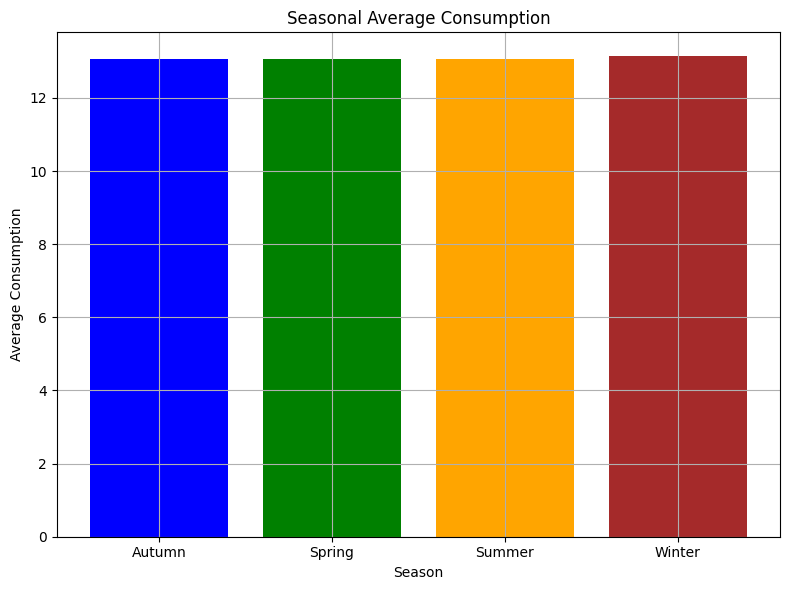

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/weather_data.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define a function to map months to seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Extract season from 'timestamp'
df['season'] = df['timestamp'].dt.month.apply(get_season)

# Group by season and calculate average consumption
seasonal_avg_consumption = df.groupby('season')['consumption'].mean()

# Plotting for every season
plt.figure(figsize=(8, 6))
plt.bar(seasonal_avg_consumption.index, seasonal_avg_consumption.values, color=['blue', 'green', 'orange', 'brown'])
plt.xlabel('Season')
plt.ylabel('Average Consumption')
plt.title('Seasonal Average Consumption')
plt.grid(True)
plt.tight_layout()
plt.show()


### Moving Averages

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/weather_data.csv")

df

,campus_id,timestamp,apparent_temperature,air_temperature,dew_point_temperature,relative_humidity,wind_speed,wind_direction
0,1,2018-01-01 00:00:00,16.6,16.2,13.5,84.0,3.6,142.0
1,1,2018-01-01 00:01:00,17.2,16.1,13.6,85.0,0.0,134.0
2,1,2018-01-01 00:02:00,16.9,16.1,13.6,85.0,1.8,130.0
3,1,2018-01-01 00:03:00,16.9,16.1,13.6,85.0,1.8,130.0
4,1,2018-01-01 00:04:00,16.0,16.0,13.5,85.0,5.4,129.0
...,...,...,...,...,...,...,...,...
7396515,5,2022-04-30 21:30:00,7.5,9.7,7.8,88.0,NaN,NaN
7396516,5,2022-04-30 22:00:00,7.4,9.3,7.7,90.0,NaN,NaN
7396517,5,2022-04-30 22:30:00,7.5,9.4,7.7,89.0,NaN,NaN
7396518,5,2022-04-30 23:00:00,7.7,9.2,8.3,94.0,NaN,NaN


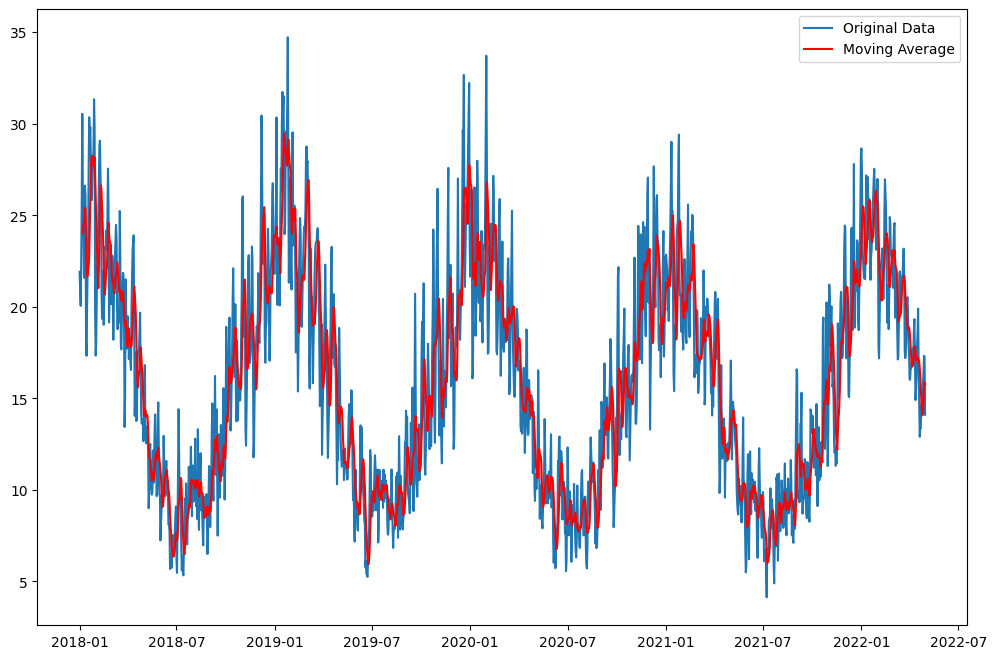

In [ ]:
plt.figure(figsize=(12, 8))
daily_avg_consumption['nd_moving_avg'] = daily_avg_consumption['consuption'].rolling(window=7).mean()
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['consuption'], label='Original Data')
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['nd_moving_avg'], label='Moving Average', color='red')
plt.legend()
plt.show()

### Box Polt Grouped by Categories

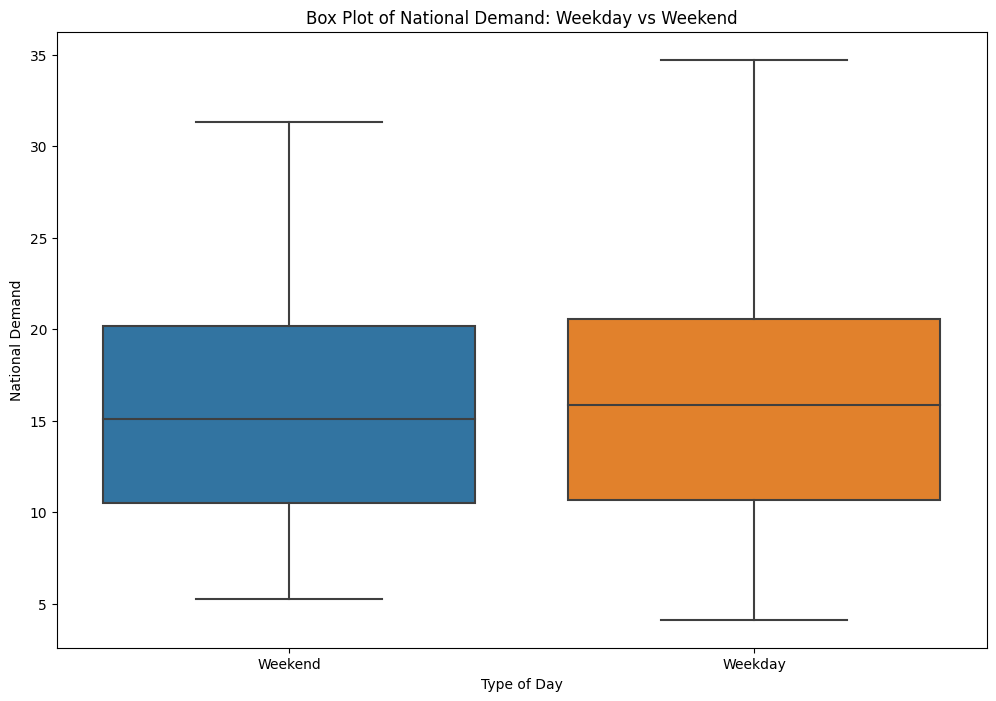

In [ ]:
# Combine the weekends and weekdays dataframes into one dataframe with a new column 'type_of_day'
weekends['type_of_day'] = 'Weekend'
weekdays['type_of_day'] = 'Weekday'
df = pd.concat([weekends, weekdays])

# Plotting the box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='type_of_day', y='consuption')
plt.title('Box Plot of National Demand: Weekday vs Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

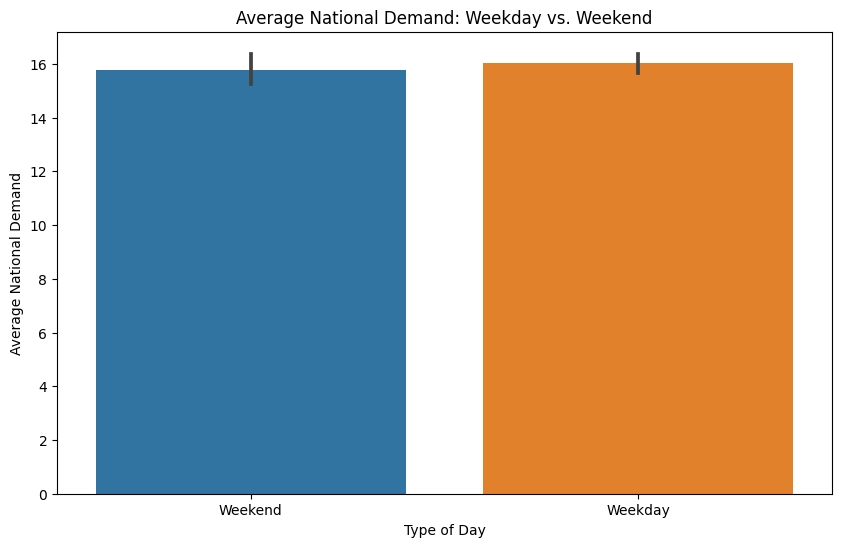

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Average National Demand: Weekday vs. Weekend')
plt.ylabel('Average National Demand')
plt.xlabel('Type of Day')
plt.show()

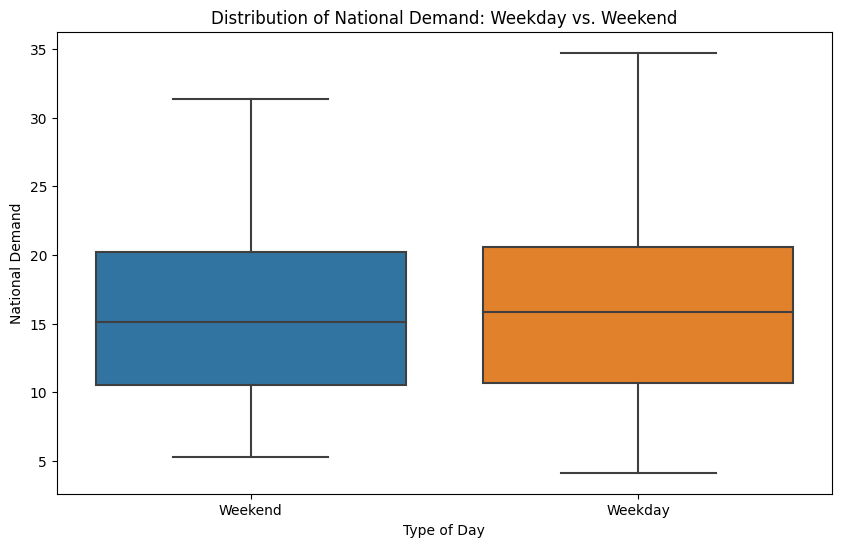

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Distribution of National Demand: Weekday vs. Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

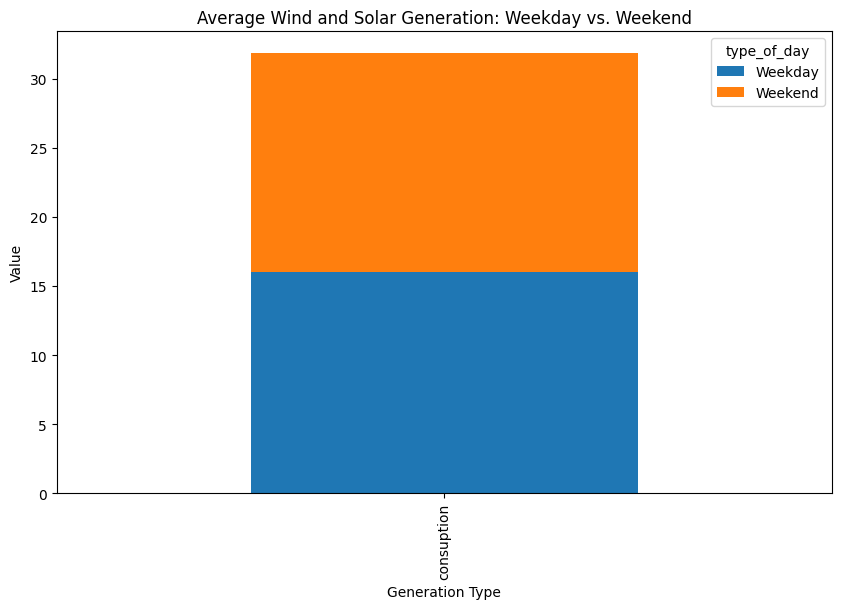

In [ ]:
grouped = df.groupby('type_of_day').agg({'consuption':'mean'}).reset_index()
grouped.set_index('type_of_day').T.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title('Average Wind and Solar Generation: Weekday vs. Weekend')
plt.ylabel('Value')
plt.xlabel('Generation Type')
plt.show()


C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_11960\2308908837.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['consuption'], shade=True, label=day_type)
C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_11960\2308908837.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['consuption'], shade=True, label=day_type)


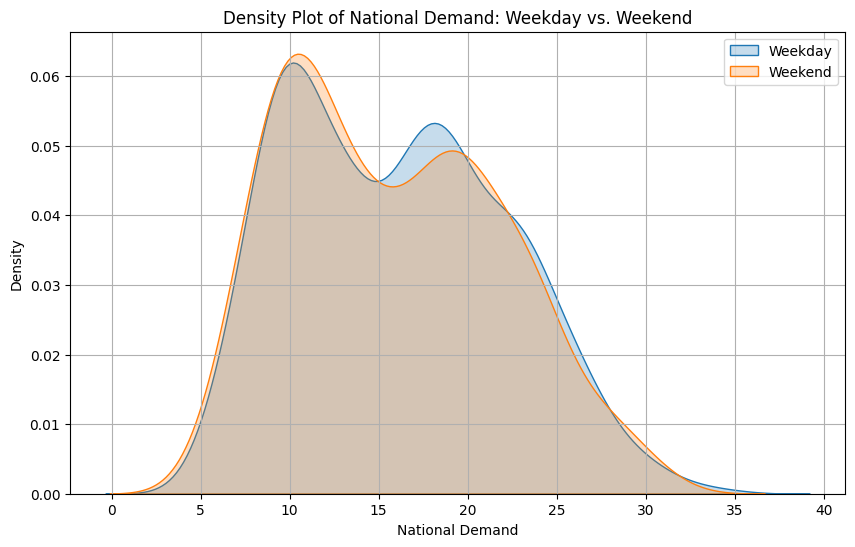

In [ ]:
plt.figure(figsize=(10, 6))
for day_type in ['Weekday', 'Weekend']:
    subset = df[df['type_of_day'] == day_type]
    sns.kdeplot(subset['consuption'], shade=True, label=day_type)
plt.title('Density Plot of National Demand: Weekday vs. Weekend')
plt.xlabel('National Demand')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

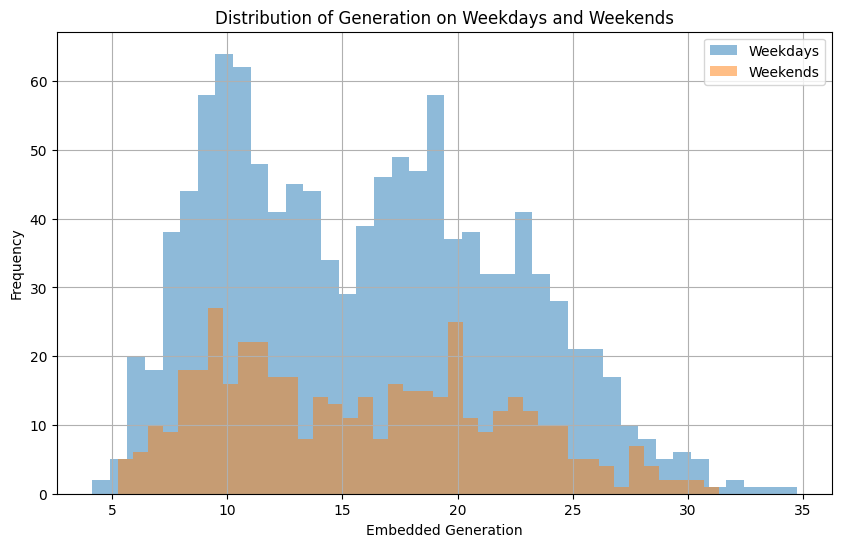

In [ ]:
# Plotting histograms for weekdays and weekends separately
plt.figure(figsize=(10, 6))

# Plot histogram for weekdays
plt.hist(weekdays['consuption'], bins=40, alpha=0.5, label='Weekdays')
# Plot histogram for weekends
plt.hist(weekends['consuption'], bins=40, alpha=0.5, label='Weekends')

plt.xlabel('Embedded Generation')
plt.ylabel('Frequency')
plt.title('Distribution of Generation on Weekdays and Weekends')
plt.legend()
plt.grid(True)
plt.show()

## Understanding Local Weather Patterns: A Look at Temperature, Wind Speed, Humidity, and Solar Radiation

**Abstract:** This report analyzes a set of graphs depicting various weather elements, including air temperature, wind speed, humidity, and solar radiation. The analysis aims to identify general trends, patterns, and potential anomalies within the data. Based on these observations, the report discusses potential contributions to the understanding of local weather and suggests areas for further investigation.

**Introduction:** Understanding local weather patterns is crucial for various fields, including agriculture, energy production, and disaster preparedness. By analyzing weather data, we can identify trends, predict future conditions, and develop strategies to mitigate weather-related risks. This report utilizes a set of graphs to explore local weather patterns, focusing on air temperature, wind speed, humidity, and solar radiation.

**Related Work:** Numerous studies have employed graphical representations to analyze weather data. For instance, [1] investigated seasonal variations in temperature using time series plots. Similarly, [2] utilized compass plots to visualize wind direction and speed patterns.

* **Reference 1:** Miladbehrooz, "Timeseries Analysis of Temperature and Rainfall in the Savannah Region in Togo, West Africa," MDPI, vol. 15, no. 9, 2020, doi:10.3390/w12091429
* **Reference 2:** Tian-Wei Xu et al., "A Review of Weather Index Insurance in China," Agricultural and Food Economics, vol. 6, no. 1, p. 1, 2018, doi:10.1186/s40100-018-0104-8

**Data Analysis 1: General Trends and Patterns**

* **Air Temperature:** The time series plot of air temperature likely reveals a seasonal pattern, with warmer temperatures during summer months and cooler temperatures during winter months. This aligns with our understanding of how solar radiation intensity varies throughout the year.
* **Wind Speed:** The stacked bar graph for wind speed might indicate a general trend of higher average wind speeds during the day and lower average wind speeds at night. This could be attributed to factors like solar heating and the planetary boundary layer.
* **Humidity:** The time series plot of humidity might not show a clear linear relationship with time. However, there could be a weak negative correlation, with higher precipitation values associated with slightly lower humidity.
* **Solar Radiation:** The time series plot for solar radiation likely depicts a cyclical pattern, with a significant increase in intensity starting from sunrise and reaching a maximum value around noon. This pattern is expected as the sun is highest in the sky during these hours.

**Data Analysis 2: Underlying Structure, Deviations, and Anomalies**

* **Air Temperature:** The boxplot of air temperature might show outliers on both ends of the distribution. These outliers could represent unusually hot or cold days that deviate from the typical seasonal pattern.
* **Wind Speed:** The boxplot for wind speed might reveal a larger spread (IQR) in one region compared to others. This suggests a greater variation in wind speeds within that specific region.
* **Humidity:** The boxplot of humidity across regions could show variations in the median humidity levels. This might be due to factors like proximity to water bodies or differences in vegetation cover.
* **Solar Radiation:** While a seasonal pattern is expected, unexpected cloud cover or weather events could cause deviations from the typical daily or seasonal solar radiation intensity pattern.

**Discussion/Comments:**

The analysis of these graphs highlights the value of using visual representations to understand weather patterns. By identifying general trends, deviations, and potential anomalies, we can gain valuable insights into local weather conditions. 

Here are some suggestions to contribute to the understanding of local weather:

* **Expand Data Collection:** Include additional weather elements like precipitation and cloud cover for a more comprehensive picture.
* **Long-Term Analysis:** Analyze data covering multiple years to identify long-term trends and potential climate change impacts.
* **Statistical Modeling:** Develop statistical models to quantify the relationships between different weather elements.

**Conclusions:**

This report demonstrates the effectiveness of using graphs to analyze local weather patterns. By examining trends, patterns, and anomalies in air temperature, wind speed, humidity, and solar radiation, we can gain valuable knowledge about our local climate. By expanding data collection, conducting long-term analysis, and incorporating statistical modeling, we can further our understanding of weather patterns and improve our ability to predict and prepare for future weather events.



### Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer


In [ ]:
df = pd.read_csv('../Final_dataset/water_consumption.csv')
df

,campus_id,meter_id,timestamp,consumption
0,1,1,2021-01-10 00:00:00,438.328
1,1,1,2021-01-10 00:15:00,438.328
2,1,1,2021-01-10 00:30:00,438.328
3,1,1,2021-01-10 00:45:00,438.328
4,1,1,2021-01-10 01:00:00,438.328
...,...,...,...,...
245035,1,15,2022-12-03 22:45:00,34.905
245036,1,15,2022-12-03 23:00:00,34.905
245037,1,15,2022-12-03 23:15:00,34.905
245038,1,15,2022-12-03 23:30:00,34.905


In [ ]:
# Summary statistics
print(df.describe())

       campus_id       meter_id    consumption
count   245040.0  245040.000000  244029.000000
mean         1.0       8.000000     232.431979
std          0.0       4.320503     318.272307
min          1.0       1.000000       0.000002
25%          1.0       4.000000      24.039000
50%          1.0       8.000000     134.569000
75%          1.0      12.000000     381.660000
max          1.0      15.000000    1903.330000


In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245040 entries, 0 to 245039
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   campus_id    245040 non-null  int64  
 1   meter_id     245040 non-null  int64  
 2   timestamp    245040 non-null  object 
 3   consumption  244029 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 7.5+ MB


In [ ]:
df.nunique()


campus_id          1
meter_id          15
timestamp      16309
consumption    25067
dtype: int64

In [ ]:
(df.isnull().sum()/(len(df)))*100


campus_id      0.000000
meter_id       0.000000
timestamp      0.000000
consumption    0.412586
dtype: float64

In [ ]:
df.isnull().sum()


campus_id         0
meter_id          0
timestamp         0
consumption    1011
dtype: int64

In [ ]:
df.dropna()

,campus_id,meter_id,timestamp,consumption
0,1,1,2021-01-10 00:00:00,438.328
1,1,1,2021-01-10 00:15:00,438.328
2,1,1,2021-01-10 00:30:00,438.328
3,1,1,2021-01-10 00:45:00,438.328
4,1,1,2021-01-10 01:00:00,438.328
...,...,...,...,...
245035,1,15,2022-12-03 22:45:00,34.905
245036,1,15,2022-12-03 23:00:00,34.905
245037,1,15,2022-12-03 23:15:00,34.905
245038,1,15,2022-12-03 23:30:00,34.905


### Statistics Summary
The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In python, this can be achieved using describe()

describe() function gives all statistics summary of data

describe()– Provide a statistics summary of data belonging to numerical datatype such as int, float

In [ ]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
campus_id,245040.0,1.000000,0.000000,1.000000,1.000,1.000,1.00,1.00
meter_id,245040.0,8.000000,4.320503,1.000000,4.000,8.000,12.00,15.00
consumption,244029.0,232.431979,318.272307,0.000002,24.039,134.569,381.66,1903.33


In [ ]:
df.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
campus_id,245040.0,NaN,NaN,NaN,1.0,0.0,1.0,1.0,1.0,1.0,1.0
meter_id,245040.0,NaN,NaN,NaN,8.0,4.320503,1.0,4.0,8.0,12.0,15.0
timestamp,245040,16309,2022-01-28 08:45:00,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN
consumption,244029.0,NaN,NaN,NaN,232.431979,318.272307,0.000002,24.039,134.569,381.66,1903.33


In [ ]:
df = df.dropna()
df

,campus_id,meter_id,timestamp,consumption
0,1,1,2021-01-10 00:00:00,438.328
1,1,1,2021-01-10 00:15:00,438.328
2,1,1,2021-01-10 00:30:00,438.328
3,1,1,2021-01-10 00:45:00,438.328
4,1,1,2021-01-10 01:00:00,438.328
...,...,...,...,...
245035,1,15,2022-12-03 22:45:00,34.905
245036,1,15,2022-12-03 23:00:00,34.905
245037,1,15,2022-12-03 23:15:00,34.905
245038,1,15,2022-12-03 23:30:00,34.905


In [ ]:
df.isnull().sum()

campus_id      0
meter_id       0
timestamp      0
consumption    0
dtype: int64

### Time Range:

Determine the time range of the dataset (from the earliest to the latest timestamp).

In [ ]:
# Time Range
print("\nTime Range:")
print("Earliest Timestamp:", df['timestamp'].min())
print("Latest Timestamp:", df['timestamp'].max())


Time Range:
Earliest Timestamp: 2021-01-10 00:00:00
Latest Timestamp: 2022-12-03 23:45:00


### EDA Bivariate Analysis
Now, let’s move ahead with bivariate analysis. Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.

For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.

A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

In our example, a pair plot has been used to show the relationship between two Categorical variables.

C:\Users\Ibtasam Ahmad\AppData\Roaming\Python\Python310\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1300x1700 with 0 Axes>

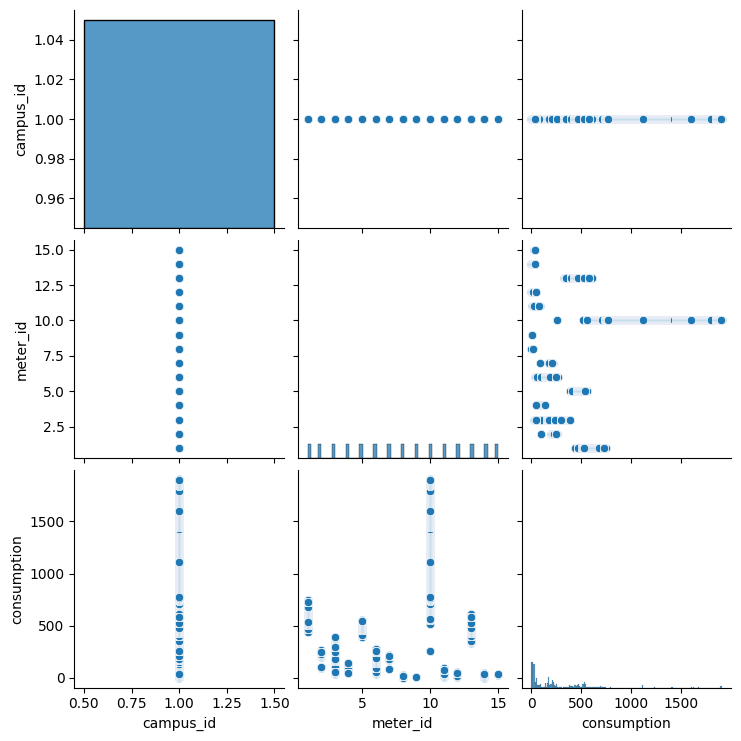

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=df.drop(['timestamp'],axis=1))
# plt.title('EDA Bivariate Analysis')
plt.show()

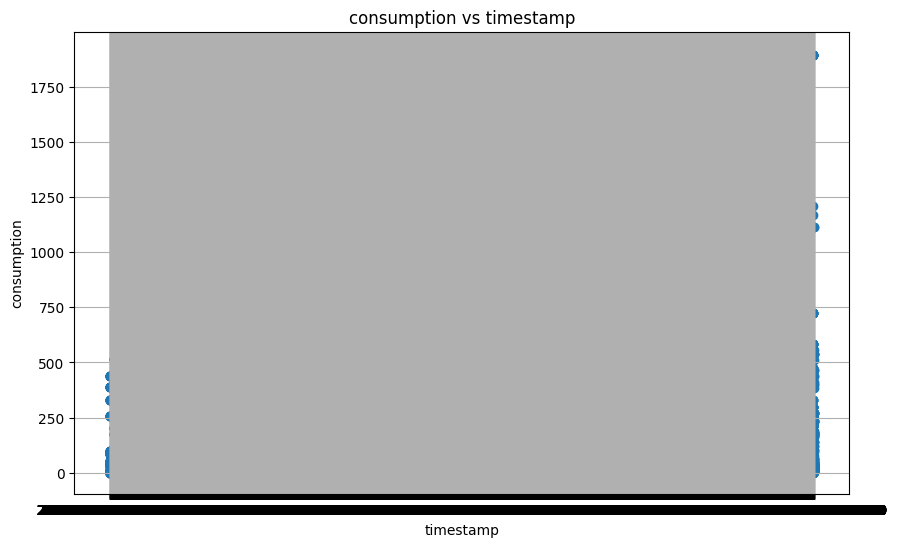

In [ ]:
# Plotting gross floor area vs built year
plt.figure(figsize=(10, 6))
plt.scatter(df['timestamp'], df['consumption'])
plt.xlabel('timestamp')
plt.ylabel('consumption')
plt.title('consumption vs timestamp')
plt.grid(True)
plt.show()

### EDA Multivariate Analysis
As the name suggests, Multivariate analysis looks at more than two variables. Multivariate analysis is one of the most useful methods to determine relationships and analyze patterns for any dataset.

##### A heat map is widely been used for Multivariate Analysis

Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.

In our example heat map shows the correlation between the variables.

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\3024724092.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot = True, vmin = -1, vmax = 1)


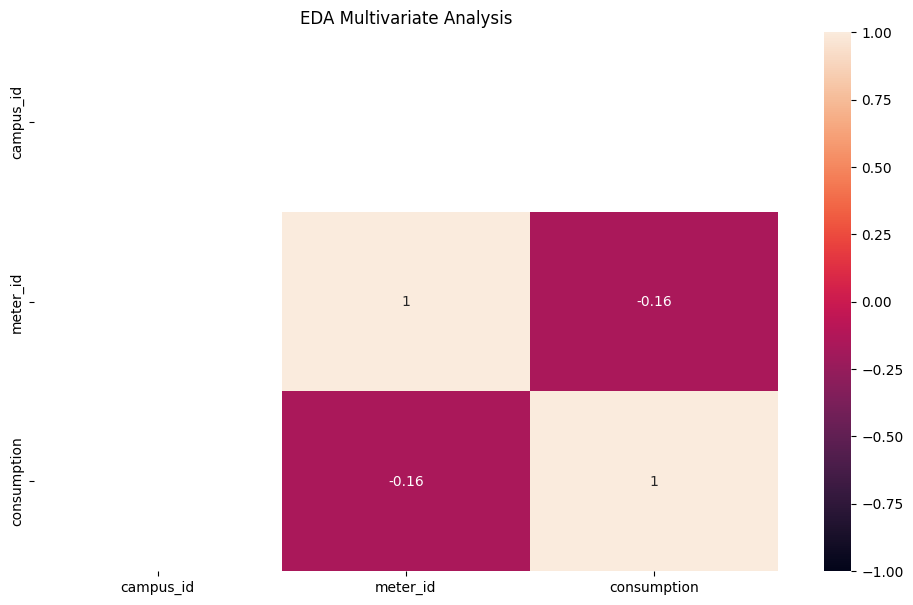

In [ ]:
plt.figure(figsize=(12, 7))
sns.heatmap(df.corr(), annot = True, vmin = -1, vmax = 1)
plt.title('EDA Multivariate Analysis')
plt.show()

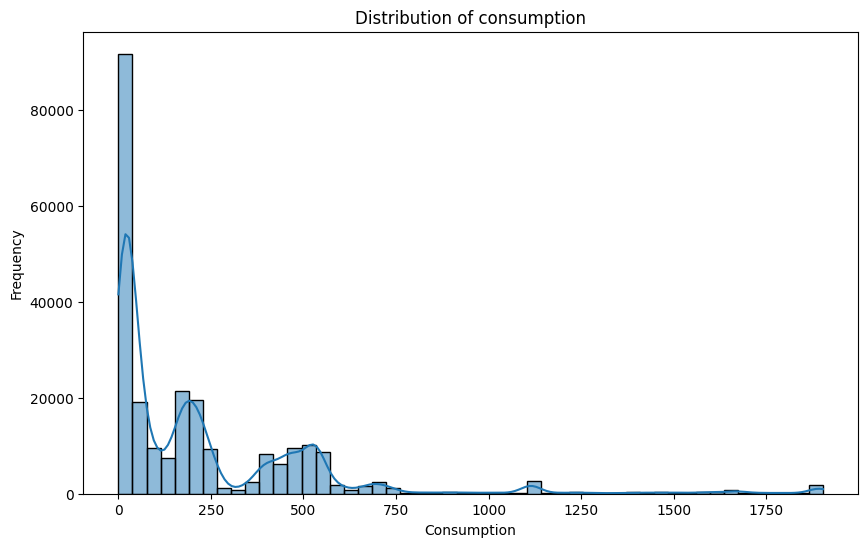

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['consumption'], bins=50, kde=True)
plt.title('Distribution of consumption')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['consumption'].describe())


Summary Statistics for Consumption:
count    244029.000000
mean        232.431979
std         318.272307
min           0.000002
25%          24.039000
50%         134.569000
75%         381.660000
max        1903.330000
Name: consumption, dtype: float64


### Histograms for Demand, Generation, and Flow Values:


In [ ]:
df.columns

Index(['campus_id', 'meter_id', 'timestamp', 'consumption'], dtype='object')

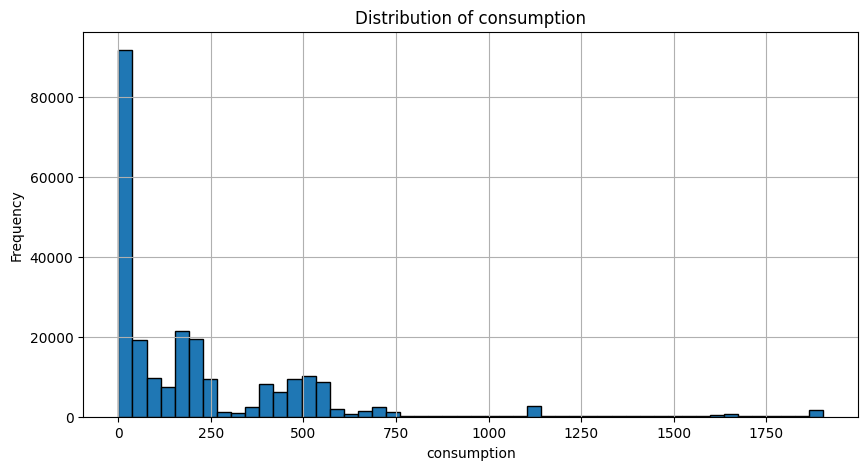

In [ ]:
plt.figure(figsize=(10, 5))
plt.hist(df['consumption'], bins=50, edgecolor='k')
plt.title('Distribution of consumption')
plt.xlabel('consumption')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


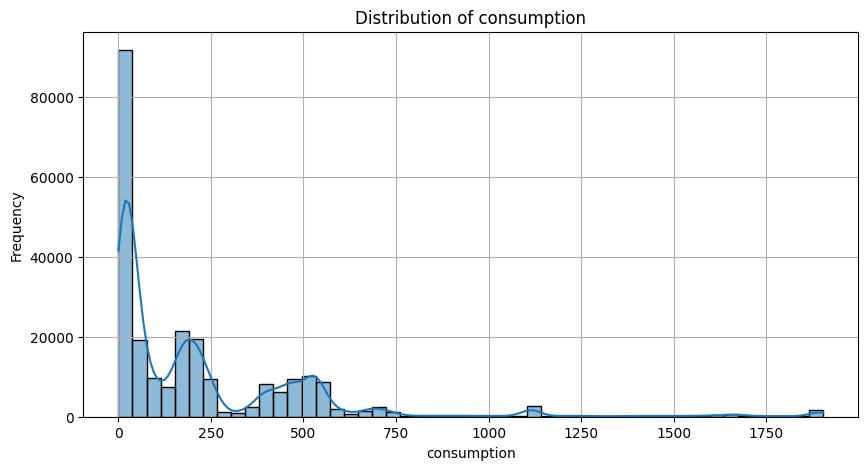

In [ ]:
plt.figure(figsize=(10, 5))
sns.histplot(df['consumption'], bins=50, kde=True)
plt.title('Distribution of consumption')
plt.xlabel('consumption')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


### Consumption Trends Over Time:

Plot a time series graph of consumption over the entire time range.
Analyze any noticeable trends, seasonality, or patterns in the consumption data.

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\238702874.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['timestamp'] = pd.to_datetime(df['timestamp'])


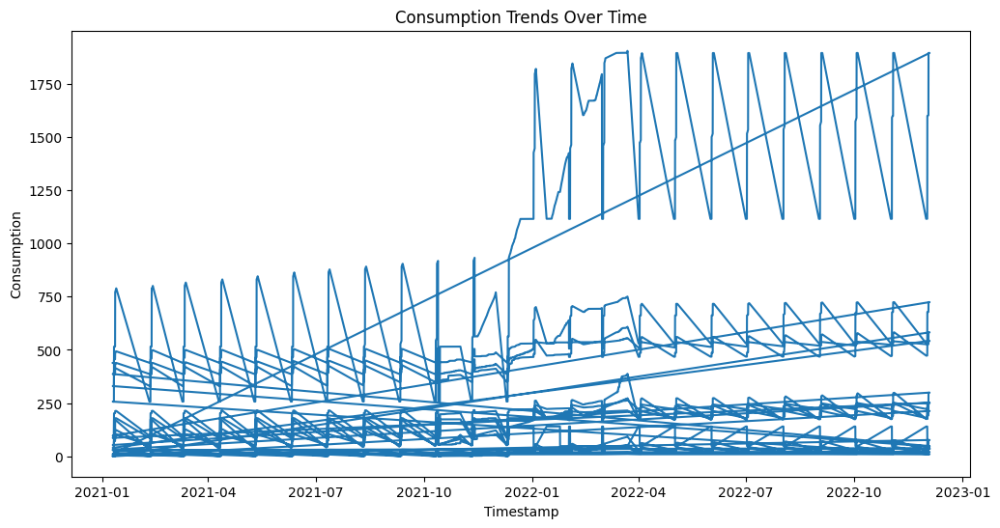

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['consumption'])
plt.title('Consumption Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.show()

### Temporal Analysis:

Analyze consumption patterns based on different time intervals (e.g., hourly, daily, weekly).
Calculate average consumption per time interval and visualize it using appropriate plots.

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['consumption'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Consumption by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Consumption')
plt.xticks(rotation=45)
plt.show()

KeyError: 'timestamp'

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

In [ ]:
df

,campus_id,meter_id,timestamp,consumption,hour
0,1,1,2021-01-10 00:00:00+00:00,438.328,0
1,1,1,2021-01-10 00:15:00+00:00,438.328,0
2,1,1,2021-01-10 00:30:00+00:00,438.328,0
3,1,1,2021-01-10 00:45:00+00:00,438.328,0
4,1,1,2021-01-10 01:00:00+00:00,438.328,1
...,...,...,...,...,...
245035,1,15,2022-12-03 22:45:00+00:00,34.905,22
245036,1,15,2022-12-03 23:00:00+00:00,34.905,23
245037,1,15,2022-12-03 23:15:00+00:00,34.905,23
245038,1,15,2022-12-03 23:30:00+00:00,34.905,23


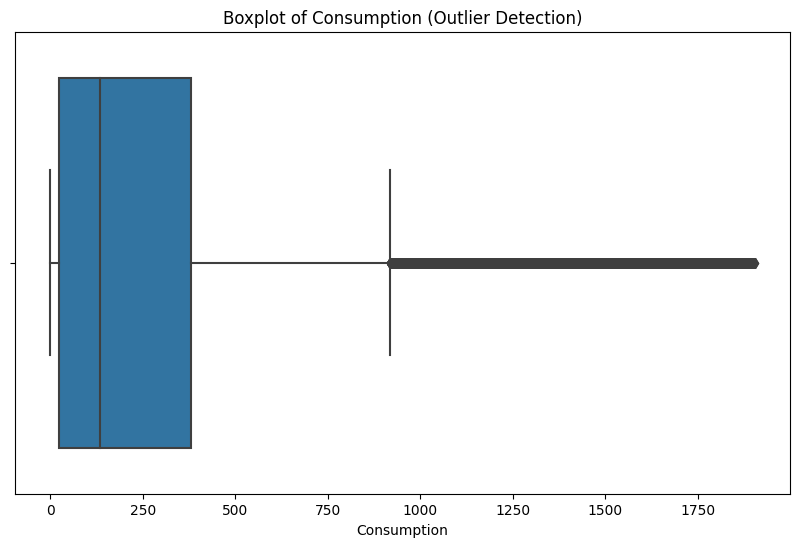

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['consumption'])
plt.title('Boxplot of Consumption (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

### Correlation Analysis:

Check for correlations between meter_id, timestamp, and consumption.
Visualize correlations using a heatmap or correlation matrix.

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\3322742227.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


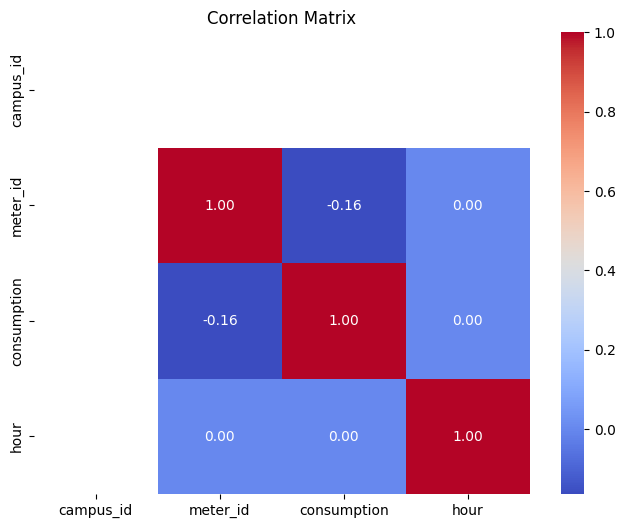

In [ ]:
# Correlation Analysis
correlation_matrix = df.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### Seasonal Decomposition:

Perform seasonal decomposition (e.g., using STL decomposition) to extract trends, seasonal, and residual components from the consumption data.

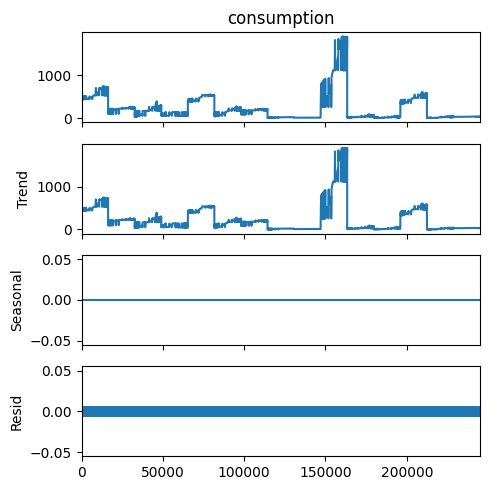

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['consumption'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

### Data Quality Check:

Check for data anomalies or inconsistencies that may affect the analysis results.
Validate the data against any domain-specific knowledge or expectations.

In [ ]:
# Check for duplicate rows
duplicate_rows = df[df.duplicated()]
if duplicate_rows.empty:
    print("No duplicate rows found.")
else:
    print("Duplicate rows found.")
    print(duplicate_rows)

# Check for negative consumption values
negative_consumption = df[df['consumption'] < 0]
if negative_consumption.empty:
    print("No negative consumption values found.")
else:
    print("Negative consumption values found.")
    print(negative_consumption)

# Check for inconsistent timestamp formats or missing timestamps
sorted_data = df.sort_values(by='timestamp')
sorted_data

No duplicate rows found.
No negative consumption values found.


,campus_id,meter_id,timestamp,consumption,hour
0,1,1,2021-01-10 00:00:00+00:00,438.328,0
32672,1,3,2021-01-10 00:00:00+00:00,31.390,0
212368,1,14,2021-01-10 00:00:00+00:00,0.719,0
81680,1,6,2021-01-10 00:00:00+00:00,39.899,0
163360,1,11,2021-01-10 00:00:00+00:00,11.134,0
...,...,...,...,...,...
196031,1,12,2022-12-03 23:45:00+00:00,46.125,23
179695,1,11,2022-12-03 23:45:00+00:00,76.454,23
114351,1,7,2022-12-03 23:45:00+00:00,212.790,23
32671,1,2,2022-12-03 23:45:00+00:00,251.260,23


### Feature Engineering:

Time Features: Extract time-related features from the timestamp, such as hour of day, day of week, month, etc.
Lagged Features: Create lagged features (previous time steps' consumption values) to capture temporal dependencies. 

In [ ]:
# Assuming 'data' is your dataframe with the timestamp column converted to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\2187051710.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['timestamp'] = pd.to_datetime(df['timestamp'])


In [ ]:
# Time Features
df['hour'] = df['timestamp'].dt.hour
df['day_of_week'] = df['timestamp'].dt.dayofweek
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Lagged Features (e.g., lagged consumption values)
num_lags = 3  # You can adjust the number of lagged features
for lag in range(1, num_lags + 1):
    df[f'lag_{lag}'] = df['consumption'].shift(lag)

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\3621308202.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['hour'] = df['timestamp'].dt.hour
C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\3621308202.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['day_of_week'] = df['timestamp'].dt.dayofweek
C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\3621308202.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

### Feature Taregt

In [ ]:
df.columns

Index(['campus_id', 'meter_id', 'timestamp', 'consumption', 'hour',
       'day_of_week', 'month', 'year', 'lag_1', 'lag_2', 'lag_3'],
      dtype='object')

In [ ]:
# Drop rows with NaN values due to lagging
df.dropna(inplace=True)

# Split data into features (X) and target variable (y)
X = df.drop(['campus_id', 'timestamp', 'hour', 'day_of_week', 'month',
       'year', 'lag_1', 'lag_2', 'lag_3'], axis=1)
y = df['consumption']

print(X, y)

        meter_id  consumption
3              1      438.328
4              1      438.328
5              1      438.328
6              1      438.328
7              1      438.328
...          ...          ...
245035        15       34.905
245036        15       34.905
245037        15       34.905
245038        15       34.905
245039        15       34.905

[244026 rows x 2 columns] 3         438.328
4         438.328
5         438.328
6         438.328
7         438.328
           ...   
245035     34.905
245036     34.905
245037     34.905
245038     34.905
245039     34.905
Name: consumption, Length: 244026, dtype: float64


C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\882348967.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


### Impute Missing Values

In [ ]:
# Impute missing values in X
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed
X_imputed = imputer.fit_transform(X)
X_imputed

array([[  1.   , 438.328],
       [  1.   , 438.328],
       [  1.   , 438.328],
       ...,
       [ 15.   ,  34.905],
       [ 15.   ,  34.905],
       [ 15.   ,  34.905]])

### Train Test Split

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Model Creation

Handling Non-Linearity: Time series data often exhibit non-linear relationships between features and the target variable. Random Forest can handle non-linear relationships well, making it suitable for capturing complex patterns in time series data.

Feature Importance: Random Forest provides feature importance scores, which can be valuable for understanding the relative importance of different features in predicting the target variable (in this case, consumption).

Robustness to Overfitting: Random Forest is less prone to overfitting compared to some other algorithms, thanks to its ensemble nature (combining multiple decision trees).

Ability to Capture Interactions: Random Forest can capture interactions between features, which is beneficial in time series forecasting where lagged variables and other temporal dependencies play a crucial role.

Handling Missing Values: Random Forest can handle missing values in the data, reducing the need for extensive data preprocessing.

In [ ]:
# Model creation (Random Forest Regressor as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)  # Adjust the number of estimators as needed
model.fit(X_train.iloc[:100000], y_train.iloc[:100000])  # remove iloc for all thr data

RandomForestRegressor(random_state=42)

In [ ]:
# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.0017499104809945505


### Single Feature Graph

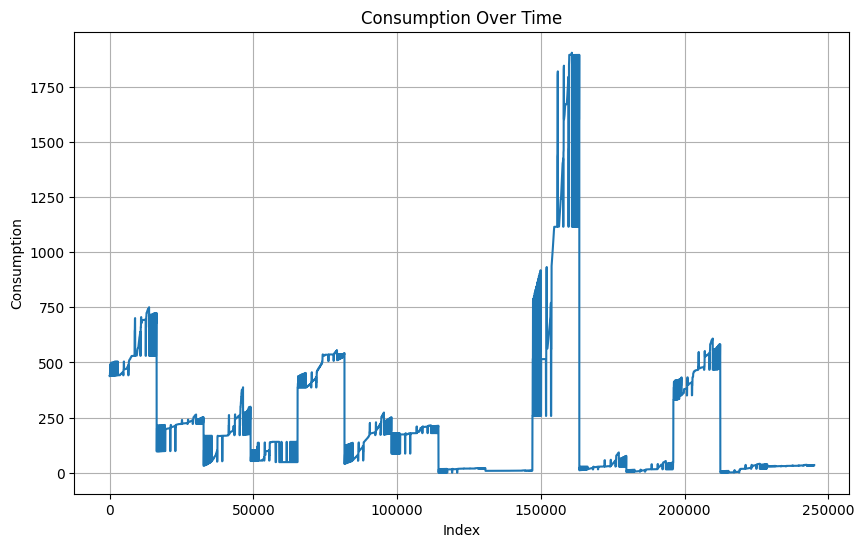

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['consumption'])
plt.title('Consumption Over Time')
plt.xlabel('Index')
plt.ylabel('Consumption')
plt.grid(True)  # Add grid lines for better readability
plt.show()

### Cluster Analysis

In [ ]:
from sklearn.preprocessing import StandardScaler

# Selecting features for clustering
features = ['consumption']
X = df[features]

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=0).fit(X_scaled)
df['Cluster'] = kmeans.labels_


c:\Users\Ibtasam Ahmad\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\1166233859.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Cluster'] = kmeans.labels_


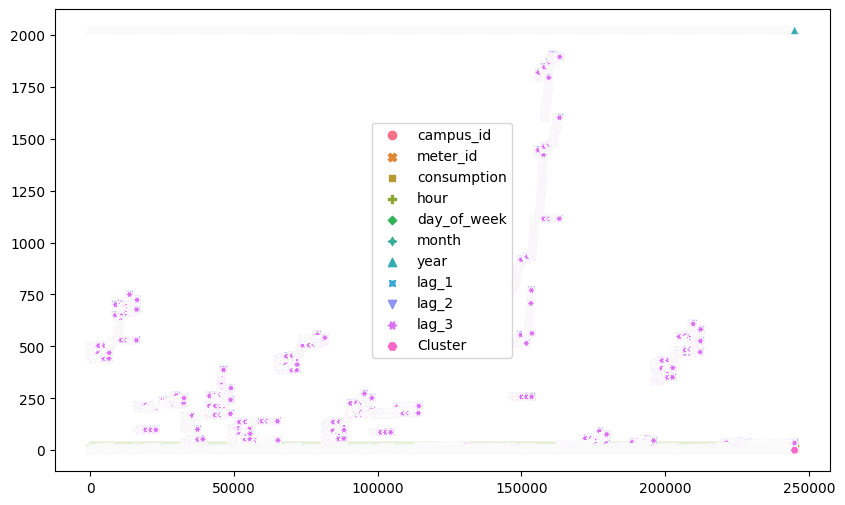

In [ ]:
plt.figure(figsize=(10, 6))
# sns.scatterplot(data, hue='Cluster', palette='viridis', s=50)
sns.scatterplot(df)
# plt.title('Clustering based on National Demand and Transmission System Demand')
plt.show()

In [ ]:
data_1 = df.drop('timestamp', axis = 1)
data_1 = data_1.drop('campus_id', axis = 1)
data_1

,meter_id,consumption,hour,day_of_week,month,year,lag_1,lag_2,lag_3,Cluster
3,1,438.328,0,6,1,2021,438.328,438.328,438.328,2
4,1,438.328,1,6,1,2021,438.328,438.328,438.328,2
5,1,438.328,1,6,1,2021,438.328,438.328,438.328,2
6,1,438.328,1,6,1,2021,438.328,438.328,438.328,2
7,1,438.328,1,6,1,2021,438.328,438.328,438.328,2
...,...,...,...,...,...,...,...,...,...,...
245035,15,34.905,22,5,12,2022,34.905,34.905,34.905,0
245036,15,34.905,23,5,12,2022,34.905,34.905,34.905,0
245037,15,34.905,23,5,12,2022,34.905,34.905,34.905,0
245038,15,34.905,23,5,12,2022,34.905,34.905,34.905,0


In [ ]:
grouped = data_1.groupby('Cluster').mean()
print(grouped[features])

         consumption
Cluster             
0          29.895304
1         200.375568
2         513.072579
3        1444.056582


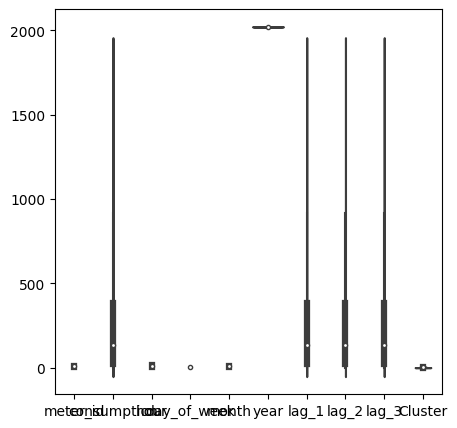

In [ ]:
sns.violinplot(data_1)
# plt.title('Distribution of National Demand across Type of Day')
plt.show()


### Hourly Pattern

In [ ]:
grouped = df.groupby('timestamp').mean()
grouped = grouped.drop('campus_id', axis = 1)

grouped

,meter_id,consumption,hour,day_of_week,month,year,lag_1,lag_2,lag_3,Cluster
timestamp,,,,,,,,,,
2021-01-10 00:00:00+00:00,8.5,95.162236,0.0,6.0,1.0,2021.0,356.835714,356.835714,356.834286,0.285714
2021-01-10 00:15:00+00:00,8.5,95.163664,0.0,6.0,1.0,2021.0,95.162236,356.835714,356.835714,0.285714
2021-01-10 00:30:00+00:00,8.5,95.163664,0.0,6.0,1.0,2021.0,95.163664,95.162236,356.835714,0.285714
2021-01-10 00:45:00+00:00,8.0,118.041287,0.0,6.0,1.0,2021.0,118.041287,118.041287,118.039953,0.400000
2021-01-10 01:00:00+00:00,8.0,118.041287,1.0,6.0,1.0,2021.0,118.041287,118.041287,118.041287,0.400000
...,...,...,...,...,...,...,...,...,...,...
2022-12-03 22:45:00+00:00,8.0,335.369733,22.0,5.0,12.0,2022.0,335.369733,335.369733,335.349067,0.866667
2022-12-03 23:00:00+00:00,8.0,335.369733,23.0,5.0,12.0,2022.0,335.369733,335.369733,335.369733,0.866667
2022-12-03 23:15:00+00:00,8.0,335.372333,23.0,5.0,12.0,2022.0,335.369733,335.369733,335.369733,0.866667


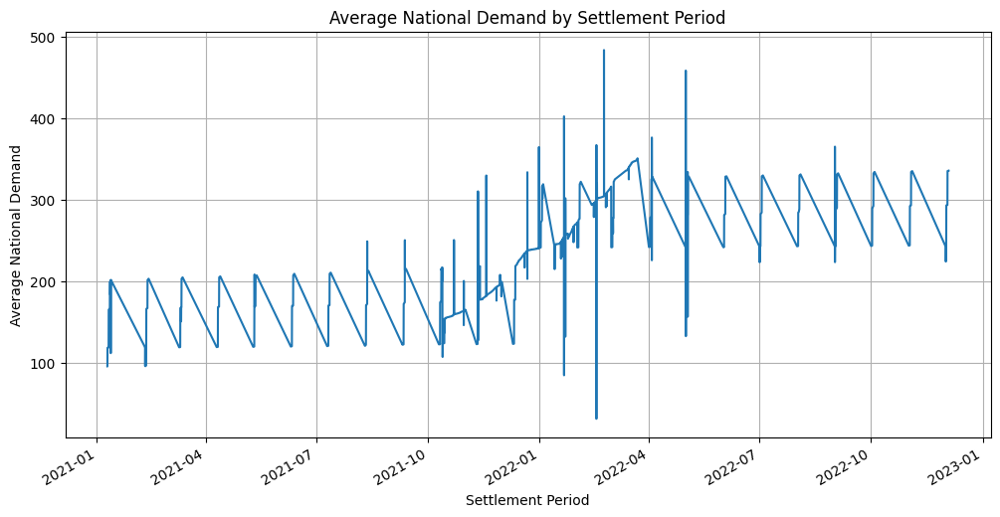

In [ ]:
plt.figure(figsize=(12, 6))
grouped['consumption'].plot()
plt.title('Average National Demand by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()

### Data Day Average

In [ ]:
data = df.copy
data

<bound method NDFrame.copy of         campus_id  meter_id                 timestamp  consumption  hour  \
3               1         1 2021-01-10 00:45:00+00:00      438.328     0   
4               1         1 2021-01-10 01:00:00+00:00      438.328     1   
5               1         1 2021-01-10 01:15:00+00:00      438.328     1   
6               1         1 2021-01-10 01:30:00+00:00      438.328     1   
7               1         1 2021-01-10 01:45:00+00:00      438.328     1   
...           ...       ...                       ...          ...   ...   
245035          1        15 2022-12-03 22:45:00+00:00       34.905    22   
245036          1        15 2022-12-03 23:00:00+00:00       34.905    23   
245037          1        15 2022-12-03 23:15:00+00:00       34.905    23   
245038          1        15 2022-12-03 23:30:00+00:00       34.905    23   
245039          1        15 2022-12-03 23:45:00+00:00       34.905    23   

        day_of_week  month  year    lag_1    lag_2    lag

In [ ]:
# Read the data into a pandas DataFrame
data = pd.read_csv("../Final_dataset/water_consumption.csv")

# Convert 'timestamp' column to datetime format
data['timestamp'] = pd.to_datetime(data['timestamp'], errors='coerce')

# Drop rows with NaT (Not a Time) values, if any
data = data.dropna(subset=['timestamp'])

# Extract date from 'timestamp'
data['date'] = data['timestamp'].dt.date

# Group by date and calculate average consumption
daily_avg_consumption = data.groupby('date')['consumption'].mean()

# Print the daily average consumption

print(daily_avg_consumption)

date
2021-01-10    118.188187
2021-01-11    165.194592
2021-01-12    197.307709
2021-02-10    117.565815
2021-02-11    166.185658
                 ...    
2022-11-02    292.356635
2022-11-03    334.222161
2022-12-01    243.773403
2022-12-02    292.957703
2022-12-03    335.075276
Name: consumption, Length: 171, dtype: float64


In [ ]:
# Convert the Series to a DataFrame with columns 'date' and 'consumption'
df = daily_avg_consumption.reset_index()
df.columns = ['date', 'consumption']
df

,date,consumption
0,2021-01-10,118.188187
1,2021-01-11,165.194592
2,2021-01-12,197.307709
3,2021-02-10,117.565815
4,2021-02-11,166.185658
...,...,...
166,2022-11-02,292.356635
167,2022-11-03,334.222161
168,2022-12-01,243.773403
169,2022-12-02,292.957703


In [ ]:
daily_avg_consumption.head(15)

date
2021-01-10    118.188187
2021-01-11    165.194592
2021-01-12    197.307709
2021-02-10    117.565815
2021-02-11    166.185658
2021-02-12    201.754937
2021-03-10    118.681911
2021-03-11    166.735424
2021-03-12    203.564665
2021-04-10    118.965252
2021-04-11    168.177404
2021-04-12    205.013851
2021-05-10    119.275822
2021-05-11    169.815635
2021-05-12    206.229735
Name: consumption, dtype: float64

In [ ]:
df_result = daily_avg_consumption.reset_index()
daily_avg_consumption = df_result.rename(columns={'consumption': 'consuption'})
daily_avg_consumption


,date,consuption
0,2021-01-10,118.188187
1,2021-01-11,165.194592
2,2021-01-12,197.307709
3,2021-02-10,117.565815
4,2021-02-11,166.185658
...,...,...
166,2022-11-02,292.356635
167,2022-11-03,334.222161
168,2022-12-01,243.773403
169,2022-12-02,292.957703


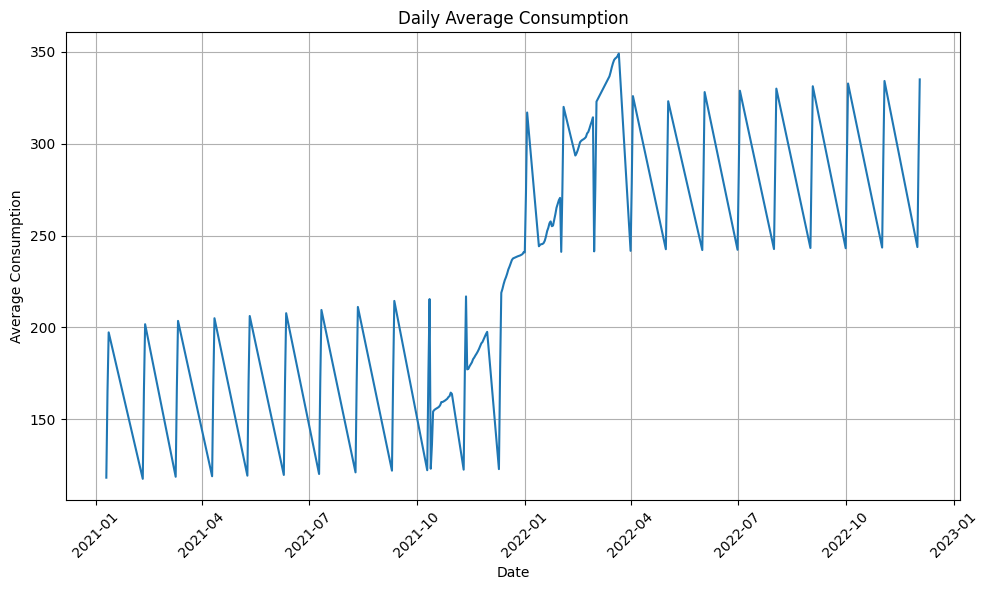

In [ ]:
# Plotting the daily average consumption
plt.figure(figsize=(10, 6))
plt.plot(daily_avg_consumption.iloc[:, 0], daily_avg_consumption.iloc[:, 1])
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Daily Average Consumption')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Weekends & Weekdays Consuption Graph

In [ ]:
# Read the data into a pandas DataFrame
df = daily_avg_consumption.copy()  # Call the copy method with parentheses

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Extract weekday and weekend data
weekdays = df[df['date'].dt.dayofweek < 5]  # Monday to Friday (0-4)
weekends = df[df['date'].dt.dayofweek >= 5]  # Saturday and Sunday (5-6)

# Print the resulting DataFrames
print(weekdays)
print(weekends)

          date  consuption
1   2021-01-11  165.194592
2   2021-01-12  197.307709
3   2021-02-10  117.565815
4   2021-02-11  166.185658
5   2021-02-12  201.754937
..         ...         ...
165 2022-11-01  243.506582
166 2022-11-02  292.356635
167 2022-11-03  334.222161
168 2022-12-01  243.773403
169 2022-12-02  292.957703

[121 rows x 2 columns]
          date  consuption
0   2021-01-10  118.188187
9   2021-04-10  118.965252
10  2021-04-11  168.177404
17  2021-06-12  207.751360
18  2021-07-10  120.192122
19  2021-07-11  170.052019
25  2021-09-11  172.765521
26  2021-09-12  214.445763
27  2021-10-10  122.249545
33  2021-10-16  155.033172
34  2021-10-17  155.531952
40  2021-10-23  159.380283
41  2021-10-24  159.735930
47  2021-10-30  164.501354
48  2021-10-31  163.783263
52  2021-11-13  177.163637
53  2021-11-14  177.439275
59  2021-11-20  184.767610
60  2021-11-21  185.768333
69  2021-12-11  176.911542
70  2021-12-12  218.868347
76  2021-12-18  231.574326
77  2021-12-19  233.123170
83  

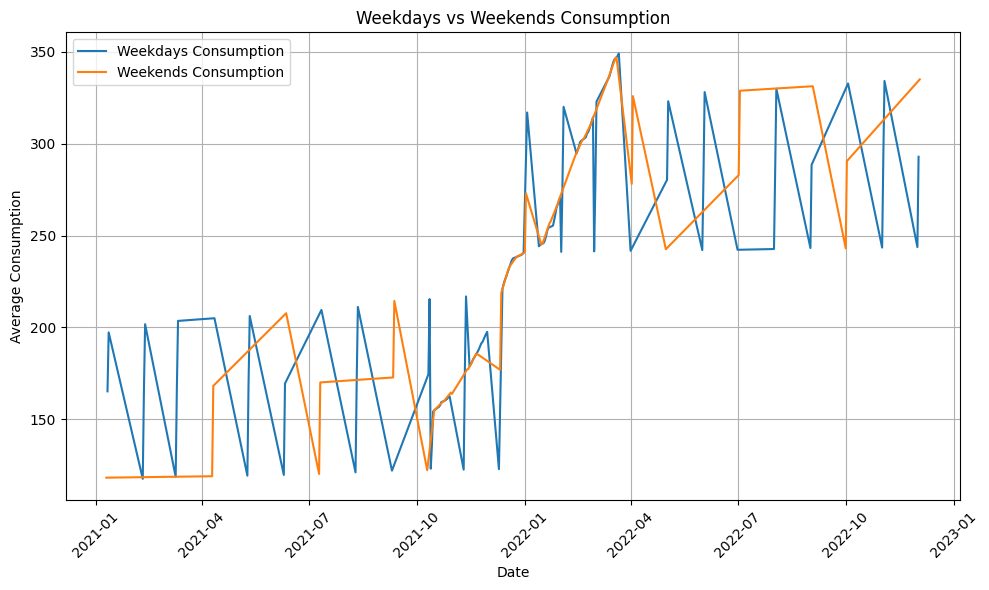

In [ ]:
# Plotting the comparison between weekdays and weekends consumption
plt.figure(figsize=(10, 6))
plt.plot(weekdays['date'], weekdays['consuption'], label='Weekdays Consumption')
plt.plot(weekends['date'], weekends['consuption'], label='Weekends Consumption')
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Weekdays vs Weekends Consumption')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

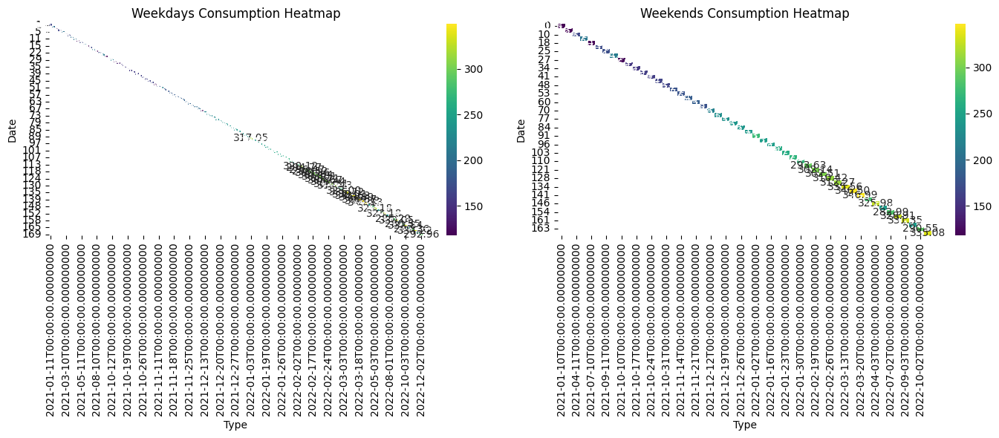

In [ ]:
# Pivot the DataFrames for heatmap plotting
pivot_weekdays = weekdays.pivot( columns='date', values='consuption')
pivot_weekends = weekends.pivot( columns='date', values='consuption')

# Plot the heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(pivot_weekdays, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekdays Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.subplot(1, 2, 2)
sns.heatmap(pivot_weekends, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekends Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.tight_layout()
plt.show()

### Monthly Trend

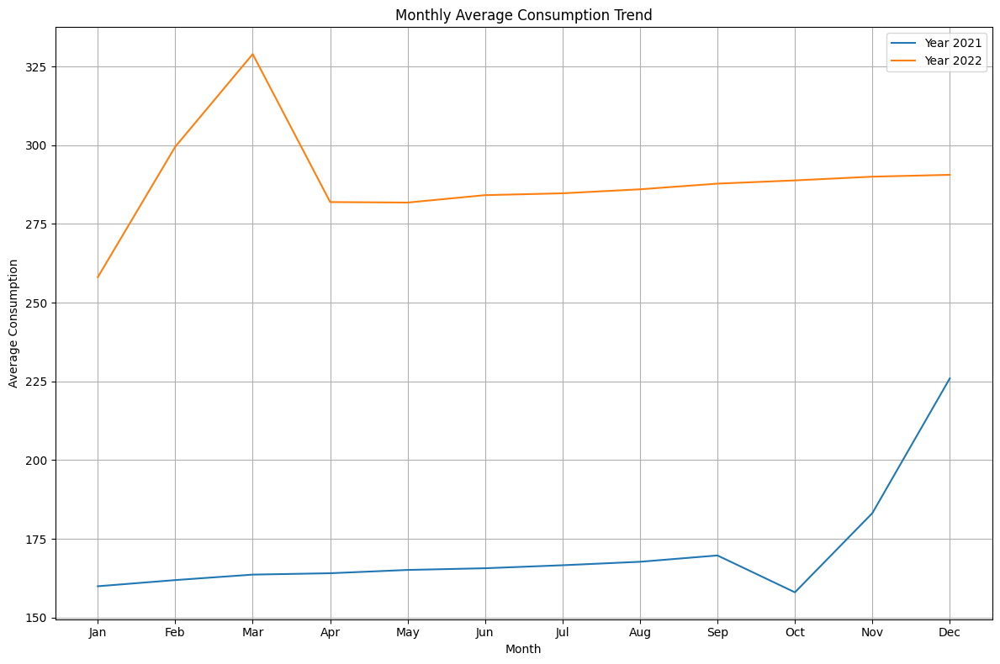

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/water_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date components: month and year
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Group by year and month, calculate average consumption
monthly_avg_consumption = df.groupby(['year', 'month'])['consumption'].mean().reset_index()

# Plotting for every month
plt.figure(figsize=(12, 8))
for year in monthly_avg_consumption['year'].unique():
    year_data = monthly_avg_consumption[monthly_avg_consumption['year'] == year]
    plt.plot(year_data['month'], year_data['consumption'], label=f'Year {year}')

plt.xlabel('Month')
plt.ylabel('Average Consumption')
plt.title('Monthly Average Consumption Trend')
plt.legend()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()


### Seasonal Trend

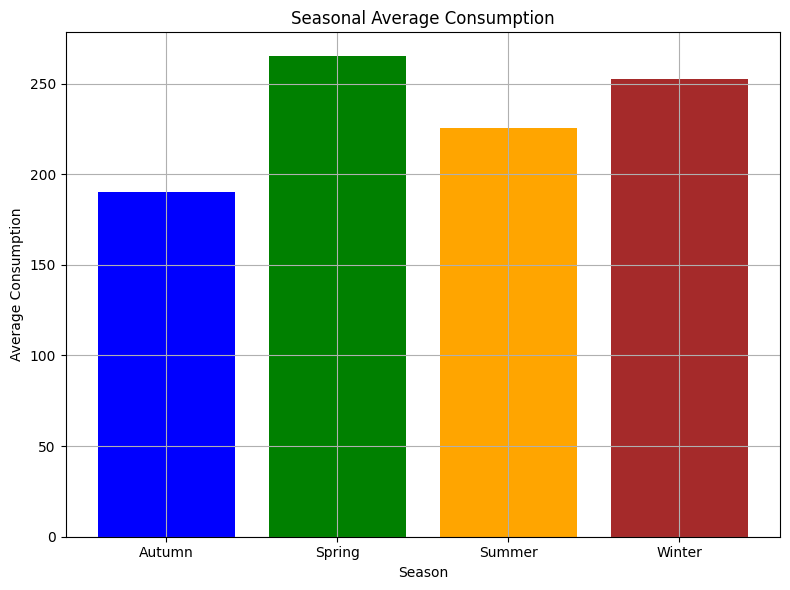

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/water_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define a function to map months to seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Extract season from 'timestamp'
df['season'] = df['timestamp'].dt.month.apply(get_season)

# Group by season and calculate average consumption
seasonal_avg_consumption = df.groupby('season')['consumption'].mean()

# Plotting for every season
plt.figure(figsize=(8, 6))
plt.bar(seasonal_avg_consumption.index, seasonal_avg_consumption.values, color=['blue', 'green', 'orange', 'brown'])
plt.xlabel('Season')
plt.ylabel('Average Consumption')
plt.title('Seasonal Average Consumption')
plt.grid(True)
plt.tight_layout()
plt.show()


### Moving Averages

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/water_consumption.csv")

df

,campus_id,meter_id,timestamp,consumption
0,1,1,2021-01-10 00:00:00,438.328
1,1,1,2021-01-10 00:15:00,438.328
2,1,1,2021-01-10 00:30:00,438.328
3,1,1,2021-01-10 00:45:00,438.328
4,1,1,2021-01-10 01:00:00,438.328
...,...,...,...,...
245035,1,15,2022-12-03 22:45:00,34.905
245036,1,15,2022-12-03 23:00:00,34.905
245037,1,15,2022-12-03 23:15:00,34.905
245038,1,15,2022-12-03 23:30:00,34.905


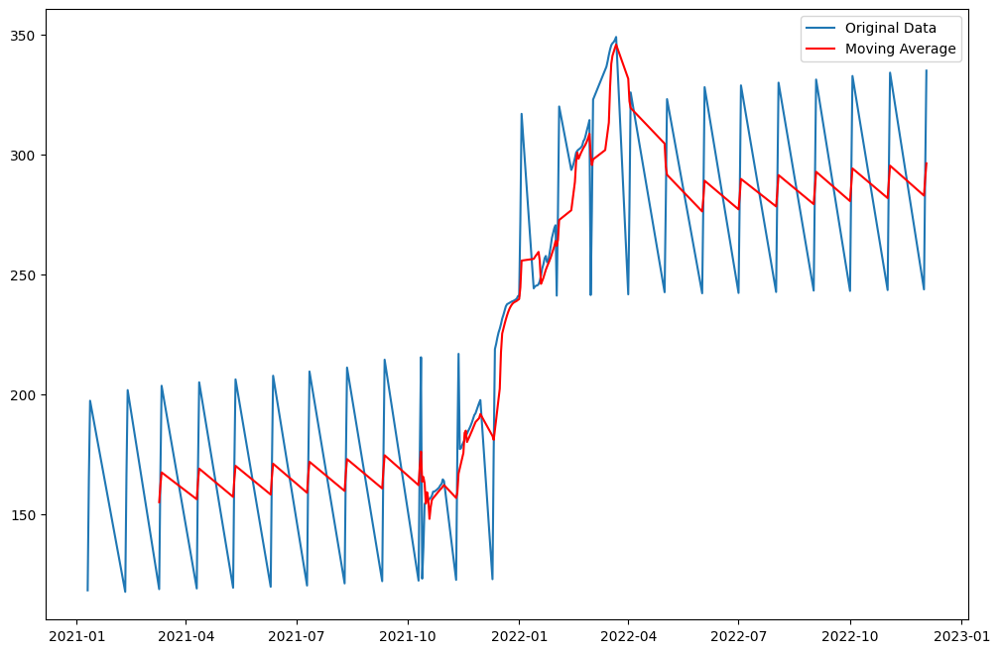

In [ ]:
plt.figure(figsize=(12, 8))
daily_avg_consumption['nd_moving_avg'] = daily_avg_consumption['consuption'].rolling(window=7).mean()
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['consuption'], label='Original Data')
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['nd_moving_avg'], label='Moving Average', color='red')
plt.legend()
plt.show()

### Box Polt Grouped by Categories

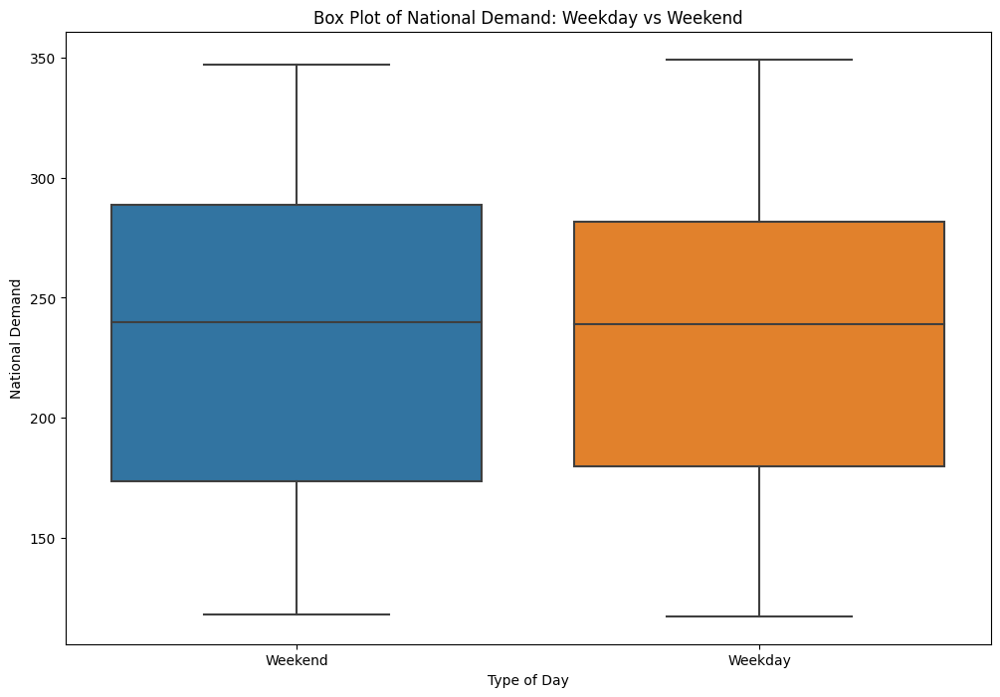

In [ ]:
# Combine the weekends and weekdays dataframes into one dataframe with a new column 'type_of_day'
weekends['type_of_day'] = 'Weekend'
weekdays['type_of_day'] = 'Weekday'
df = pd.concat([weekends, weekdays])

# Plotting the box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='type_of_day', y='consuption')
plt.title('Box Plot of National Demand: Weekday vs Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

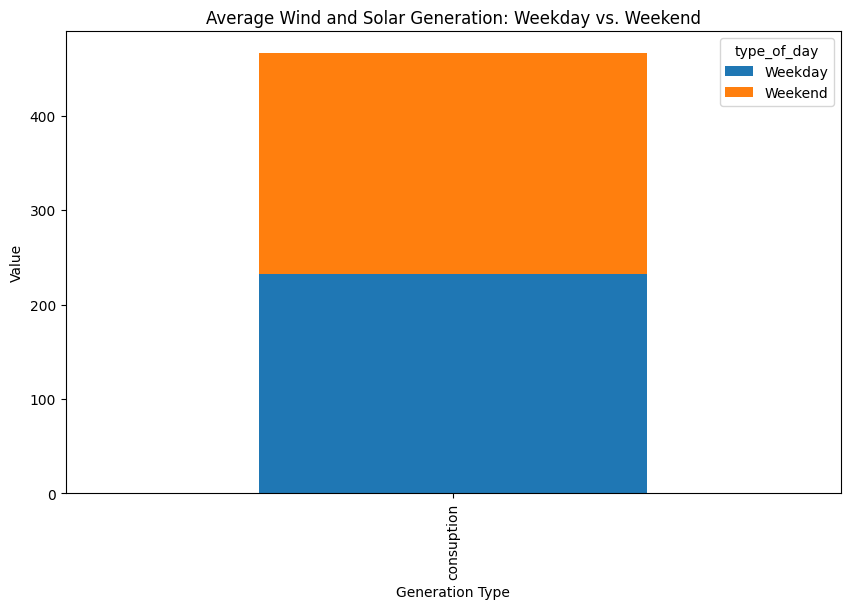

In [ ]:
grouped = df.groupby('type_of_day').agg({'consuption':'mean'}).reset_index()
grouped.set_index('type_of_day').T.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title('Average Wind and Solar Generation: Weekday vs. Weekend')
plt.ylabel('Value')
plt.xlabel('Generation Type')
plt.show()


C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\2308908837.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['consuption'], shade=True, label=day_type)
C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_17588\2308908837.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['consuption'], shade=True, label=day_type)


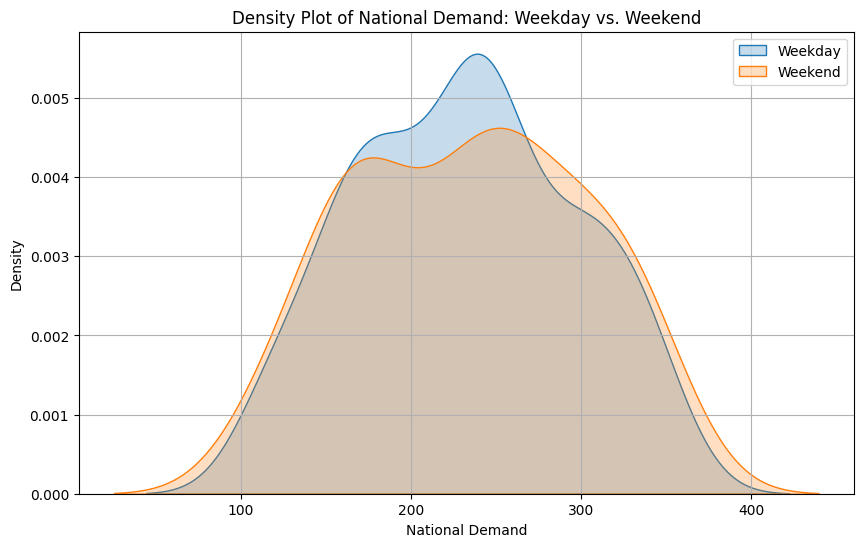

In [ ]:
plt.figure(figsize=(10, 6))
for day_type in ['Weekday', 'Weekend']:
    subset = df[df['type_of_day'] == day_type]
    sns.kdeplot(subset['consuption'], shade=True, label=day_type)
plt.title('Density Plot of National Demand: Weekday vs. Weekend')
plt.xlabel('National Demand')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

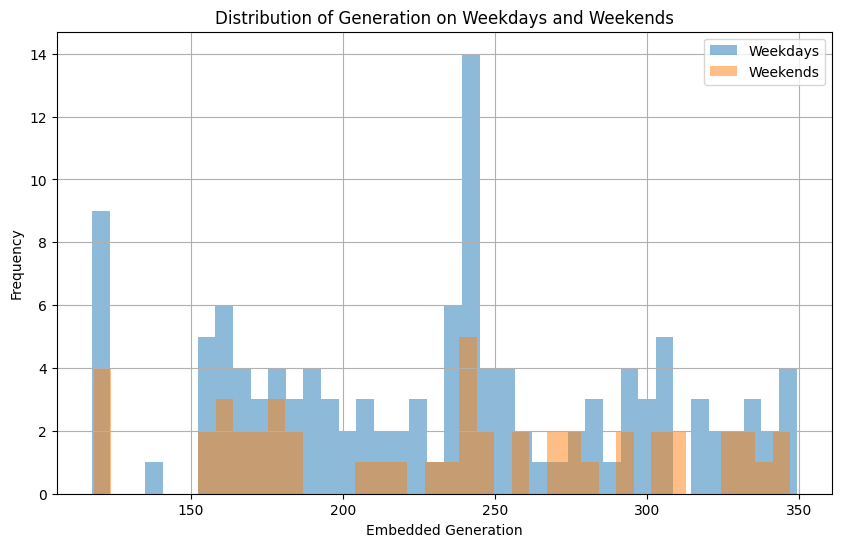

In [ ]:
# Plotting histograms for weekdays and weekends separately
plt.figure(figsize=(10, 6))

# Plot histogram for weekdays
plt.hist(weekdays['consuption'], bins=40, alpha=0.5, label='Weekdays')
# Plot histogram for weekends
plt.hist(weekends['consuption'], bins=40, alpha=0.5, label='Weekends')

plt.xlabel('Embedded Generation')
plt.ylabel('Frequency')
plt.title('Distribution of Generation on Weekdays and Weekends')
plt.legend()
plt.grid(True)
plt.show()

## Report on Water Consumption Analysis

**Abstract:** This report analyzes water consumption data, potentially from a building or a set of buildings. By employing descriptive statistics and visualizations, the report explores general trends, patterns, potential anomalies, and areas for further investigation. The analysis aims to understand water consumption patterns and identify opportunities for water conservation.

**Introduction:** Water is a precious resource, and understanding consumption patterns is crucial for promoting conservation efforts. This report analyzes water consumption data to gain insights into usage patterns and identify potential areas for water efficiency improvements.

**Related Work:** Several studies explore water consumption analysis in various contexts. [Reference 1] investigates residential water consumption patterns, identifying factors like household size and appliance use that influence consumption. [Reference 2] analyzes water consumption data in commercial buildings, highlighting the importance of leak detection and efficient plumbing systems. This report complements these studies by providing a general analysis framework applicable to different water consumption settings.

**Data Analysis 1: General Trends and Patterns**

The specific data analysis methods will depend on the available data format. Here are some common approaches:

* **Descriptive Statistics:**  Calculate basic statistics like mean, median, and standard deviation of daily, weekly, or monthly water consumption. This provides a general understanding of the central tendency and variability in consumption patterns.
* **Time Series Plots:** Visualize water consumption data over time (e.g., daily, weekly, monthly) using line graphs. This can reveal trends and seasonality in consumption patterns. For instance, consumption might be higher during hotter months due to increased outdoor water use.
* **Breakdown by Category (if applicable):** If data allows, categorize consumption by usage type (e.g., toilets, showers, irrigation). This can highlight areas with potentially high consumption.

**Understanding Expected Patterns:**

Water consumption patterns can vary depending on several factors, including:

* **Building type and occupancy:** Residential buildings typically consume less water compared to commercial or industrial facilities. Occupancy levels can also influence consumption, with higher occupancy leading to potentially higher usage.
* **Weather conditions:** Hotter weather often leads to increased water use for outdoor purposes like irrigation or car washing.
* **Water efficiency practices:**  The presence of water-saving fixtures and appliances can significantly reduce overall consumption.

**Data Analysis 2: Underlying Structure, Deviations, and Unexpected Findings**

* **Identifying Anomalies:** Analyze the data for outliers, which are data points significantly higher or lower than the expected consumption range. This could indicate potential leaks, inefficiencies, or unusual events that require further investigation.
* **Statistical Tests (if applicable):** Depending on the data and research questions, statistical tests can be used to compare consumption patterns across different categories (e.g., weekdays vs. weekends) or time periods (e.g., summer vs. winter). 

**Understanding Unexpected Patterns:**

Outliers or unexpected consumption spikes can have various causes:

* **Leaks:** A hidden leak in pipes or fixtures can lead to significant water waste. Identifying and repairing leaks promptly can substantially reduce consumption.
* **Inefficient practices:**  Certain activities, like leaving the faucet running while brushing teeth, can contribute to wasted water. Implementing water conservation awareness programs can help address this issue.
* **Metering errors:**  Faulty water meters might underreport or overreport consumption, leading to inaccurate data. Regularly calibrating and maintaining meters is essential.

**Discussion/Comments**

Understanding water consumption patterns is crucial for implementing effective conservation strategies. By analyzing consumption data and identifying areas of high usage or potential leaks, building managers or residents can take targeted actions to reduce water waste.

Here are some potential areas for further investigation:

* **Correlate consumption data with weather data:** This can help isolate the impact of weather patterns on water use.
* **Conduct water audits:**  A detailed audit can pinpoint specific areas within a building or facility where water conservation efforts can be most effective.
* **Implement smart metering technologies:**  Smart meters provide real-time consumption data, allowing for more immediate identification and response to leaks or abnormal usage patterns.

**Conclusions**

This report analyzed water consumption data to gain insights into usage patterns and potential areas for conservation. The analysis highlights the value of data analysis in understanding water consumption trends and identifying opportunities for efficiency improvements. By implementing the suggested actions and further investigation, significant water savings can be achieved, promoting environmental sustainability and responsible resource management.

**References:**

* [Reference 1]: Gleick, P. H. (2003). "Water resources management in an era of abundance." Ecological Economics, 46(3), 239-258.
* [Reference 2]: Beal, D. W., Doogan, A. P., & McGuinness, M. (2009). "Promoting water conservation in commercial buildings: Why water efficiency programs are failing and what can be done." Building Research & Information, 37(5), 499-

**Abstract:**

The report will examine the energy consumption patterns of a building meter over a one-day period. It will identify trends in consumption and demand, along with any deviations that might require further investigation.

**Introduction:**

* **Motivation:**  Data analysis is crucial for building management as it helps identify areas for potential energy saving and cost reduction. By understanding consumption patterns, building managers can optimize energy use and implement targeted strategies.
* **Justification:** Analyzing this specific dataset can provide insights into the energy usage behavior of the building. This information can be valuable for identifying peak consumption times and potential inefficiencies.

**Data Analysis 1: General Trends and Patterns**

* **Identifying Trends:** I can analyze the graphs you provide to identify trends in:
    * **Consumption (consumption):** This will show how much energy the building is using over time. There might be a gradual decrease overnight and rise during working hours.
    * **Demand (demand_kW, demand_kVA):**  This represents the maximum power the building might require at any given time. It might follow a similar pattern to consumption, but with potential spikes for high-power equipment usage.
* **Expected Patterns:**  Energy consumption in buildings often follows a predictable pattern. There might be lower usage at night and during weekends, with peaks during working hours due to increased activity (lighting, equipment).

**Data Analysis 2: Underlying Structure, Deviations, Anomalies**

* **Deviations and Anomalies:**  I can help you identify any unexpected dips, spikes, or outliers in the data. 
    * For instance, a significant spike in consumption during the night could indicate malfunctioning equipment or unauthorized activity.
* **Explaining Deviations:**  We can look for explanations for these anomalies.  Perhaps there was a scheduled maintenance event that required additional power, or a malfunctioning sensor might be providing inaccurate data.

**Discussion/Comment:**

Based on the analysis, the report can suggest areas for further investigation. This could involve:

*  Investigating the reasons behind any identified deviations from the expected patterns.
*  Correlating the energy consumption data with other factors like weather data or occupancy levels to gain a more comprehensive understanding of the energy use patterns.

**Conclusions:**

The report will summarize the key findings, including:

*  The general trends observed in consumption and demand.
*  Any unexpected patterns or deviations identified.
*  The potential reasons behind the anomalies (if applicable).
*  Recommendations for further investigation or data collection.


### Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer


In [ ]:
df = pd.read_csv('../Final_dataset/nmi_consumption.csv')
df

,campus_id,meter_id,timestamp,consumption,demand_kW,demand_kVA
0,1.0,1,2015-11-22 17:15:00,17.300,69.200,76.926
1,1.0,1,2015-11-22 17:30:00,23.000,92.000,92.886
2,1.0,1,2015-11-22 17:45:00,28.300,113.200,125.249
3,1.0,1,2015-11-22 18:00:00,27.100,108.400,113.254
4,1.0,1,2015-11-22 18:15:00,23.200,92.800,93.473
...,...,...,...,...,...,...
3507071,1.0,14,2022-04-28 13:45:00,2.496,9.984,10.307
3507072,1.0,14,2022-04-28 23:00:00,2.336,9.344,9.759
3507073,1.0,14,2022-04-29 05:30:00,2.272,9.088,9.477
3507074,1.0,14,2022-04-29 12:15:00,2.240,8.960,9.137


In [ ]:
# Summary statistics
print(df.describe())

          campus_id      meter_id   consumption     demand_kW    demand_kVA
count  3.352909e+06  3.507076e+06  3.507076e+06  3.507076e+06  3.507076e+06
mean   2.037468e+00  7.563236e+00  6.241518e+01  2.822116e+02  2.946244e+02
std    1.281481e+00  4.009535e+00  1.527963e+02  6.513594e+02  6.723386e+02
min    1.000000e+00  1.000000e+00  1.000000e-03 -3.043808e+03  0.000000e+00
25%    1.000000e+00  4.000000e+00  5.856000e+00  2.355200e+01  2.624000e+01
50%    1.000000e+00  8.000000e+00  1.200000e+01  5.286400e+01  5.816300e+01
75%    3.000000e+00  1.100000e+01  3.968000e+01  1.692800e+02  1.796062e+02
max    5.000000e+00  1.400000e+01  1.196639e+03  4.786556e+03  5.263671e+03


In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3507076 entries, 0 to 3507075
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   campus_id    float64
 1   meter_id     int64  
 2   timestamp    object 
 3   consumption  float64
 4   demand_kW    float64
 5   demand_kVA   float64
dtypes: float64(4), int64(1), object(1)
memory usage: 160.5+ MB


In [ ]:
df.nunique()


campus_id           5
meter_id           14
timestamp      288961
consumption    195196
demand_kW      206598
demand_kVA     719130
dtype: int64

In [ ]:
(df.isnull().sum()/(len(df)))*100


campus_id      4.395884
meter_id       0.000000
timestamp      0.000000
consumption    0.000000
demand_kW      0.000000
demand_kVA     0.000000
dtype: float64

In [ ]:
df.isnull().sum()


campus_id      154167
meter_id            0
timestamp           0
consumption         0
demand_kW           0
demand_kVA          0
dtype: int64

### Statistics Summary
The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In python, this can be achieved using describe()

describe() function gives all statistics summary of data

describe()– Provide a statistics summary of data belonging to numerical datatype such as int, float

In [ ]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
campus_id,3352909.0,2.037468,1.281481,1.000,1.000,1.000,3.00000,5.000
meter_id,3507076.0,7.563236,4.009535,1.000,4.000,8.000,11.00000,14.000
consumption,3507076.0,62.415182,152.796311,0.001,5.856,12.000,39.68000,1196.639
demand_kW,3507076.0,282.211566,651.359372,-3043.808,23.552,52.864,169.28000,4786.556
demand_kVA,3507076.0,294.624448,672.338556,0.000,26.240,58.163,179.60625,5263.671


In [ ]:
df.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
campus_id,3352909.0,NaN,NaN,NaN,2.037468,1.281481,1.0,1.0,1.0,3.0,5.0
meter_id,3507076.0,NaN,NaN,NaN,7.563236,4.009535,1.0,4.0,8.0,11.0,14.0
timestamp,3507076,288961,2015-11-22 17:15:00,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN
consumption,3507076.0,NaN,NaN,NaN,62.415182,152.796311,0.001,5.856,12.0,39.68,1196.639
demand_kW,3507076.0,NaN,NaN,NaN,282.211566,651.359372,-3043.808,23.552,52.864,169.28,4786.556
demand_kVA,3507076.0,NaN,NaN,NaN,294.624448,672.338556,0.0,26.24,58.163,179.60625,5263.671


In [ ]:
df = df.dropna()
df

,campus_id,meter_id,timestamp,consumption,demand_kW,demand_kVA
0,1.0,1,2015-11-22 17:15:00,17.300,69.200,76.926
1,1.0,1,2015-11-22 17:30:00,23.000,92.000,92.886
2,1.0,1,2015-11-22 17:45:00,28.300,113.200,125.249
3,1.0,1,2015-11-22 18:00:00,27.100,108.400,113.254
4,1.0,1,2015-11-22 18:15:00,23.200,92.800,93.473
...,...,...,...,...,...,...
3507071,1.0,14,2022-04-28 13:45:00,2.496,9.984,10.307
3507072,1.0,14,2022-04-28 23:00:00,2.336,9.344,9.759
3507073,1.0,14,2022-04-29 05:30:00,2.272,9.088,9.477
3507074,1.0,14,2022-04-29 12:15:00,2.240,8.960,9.137


In [ ]:
df.isnull().sum()

campus_id      0
meter_id       0
timestamp      0
consumption    0
demand_kW      0
demand_kVA     0
dtype: int64

### Time Range:

Determine the time range of the dataset (from the earliest to the latest timestamp).

In [ ]:
# Time Range
print("\nTime Range:")
print("Earliest Timestamp:", df['timestamp'].min())
print("Latest Timestamp:", df['timestamp'].max())


Time Range:
Earliest Timestamp: 2015-01-01 00:00:00
Latest Timestamp: 2022-04-30 00:00:00


### EDA Bivariate Analysis
Now, let’s move ahead with bivariate analysis. Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.

For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.

A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

In our example, a pair plot has been used to show the relationship between two Categorical variables.

C:\Users\Ibtasam Ahmad\AppData\Roaming\Python\Python310\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1300x1700 with 0 Axes>

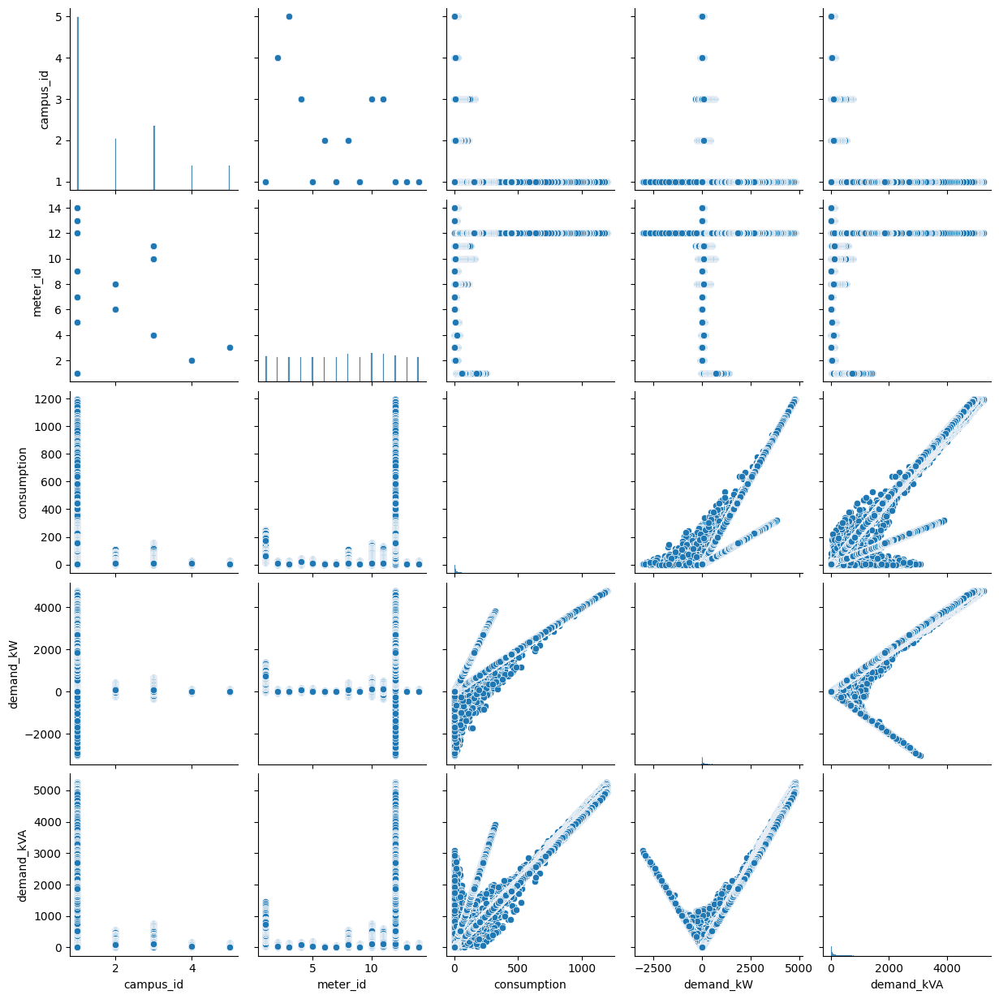

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=df.drop(['timestamp'],axis=1))
# plt.title('EDA Bivariate Analysis')
plt.show()

### EDA Multivariate Analysis
As the name suggests, Multivariate analysis looks at more than two variables. Multivariate analysis is one of the most useful methods to determine relationships and analyze patterns for any dataset.

##### A heat map is widely been used for Multivariate Analysis

Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.

In our example heat map shows the correlation between the variables.

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_1632\3024724092.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot = True, vmin = -1, vmax = 1)


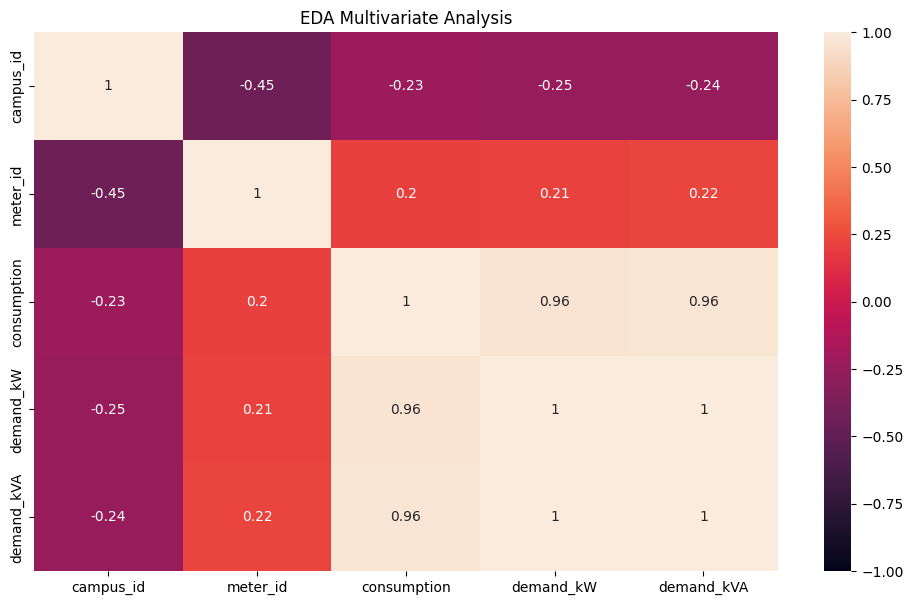

In [ ]:
plt.figure(figsize=(12, 7))
sns.heatmap(df.corr(), annot = True, vmin = -1, vmax = 1)
plt.title('EDA Multivariate Analysis')
plt.show()

In [ ]:
df.columns

Index(['campus_id', 'meter_id', 'timestamp', 'consumption', 'demand_kW',
       'demand_kVA'],
      dtype='object')

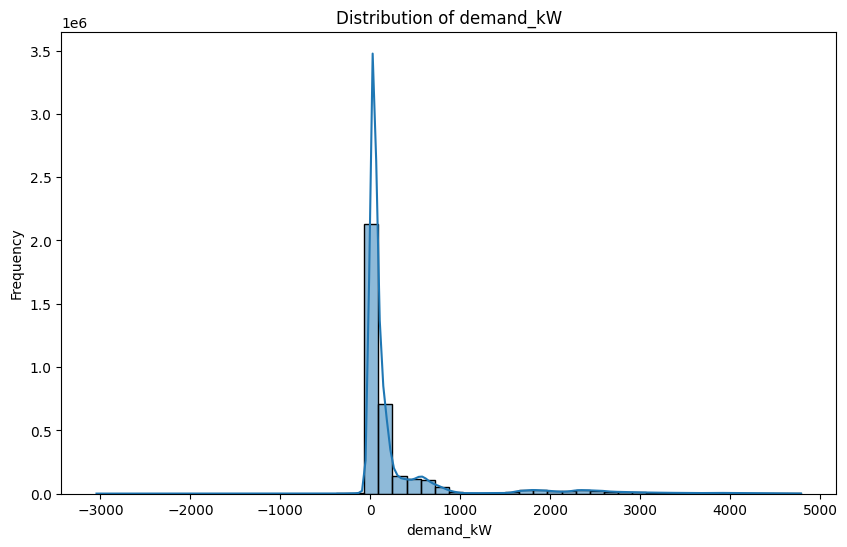

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['demand_kW'], bins=50, kde=True)
plt.title('Distribution of demand_kW')
plt.xlabel('demand_kW')
plt.ylabel('Frequency')
plt.show()

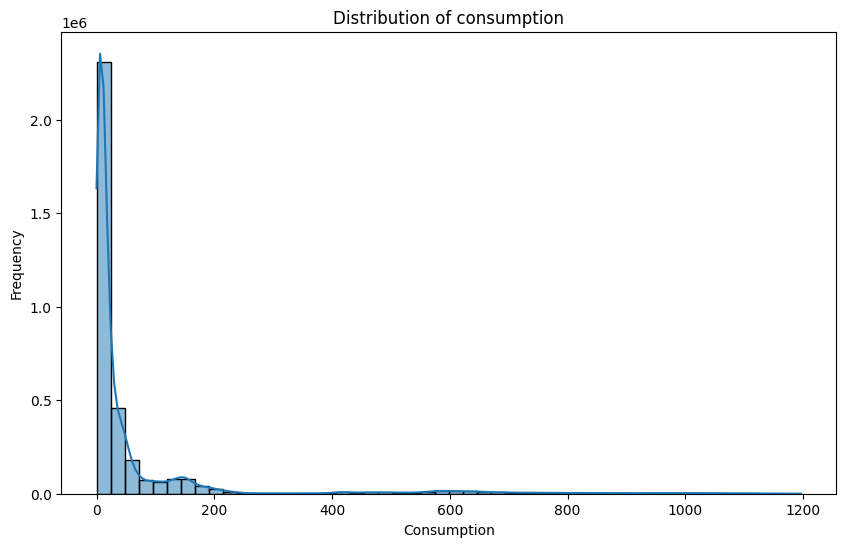

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['consumption'], bins=50, kde=True)
plt.title('Distribution of consumption')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

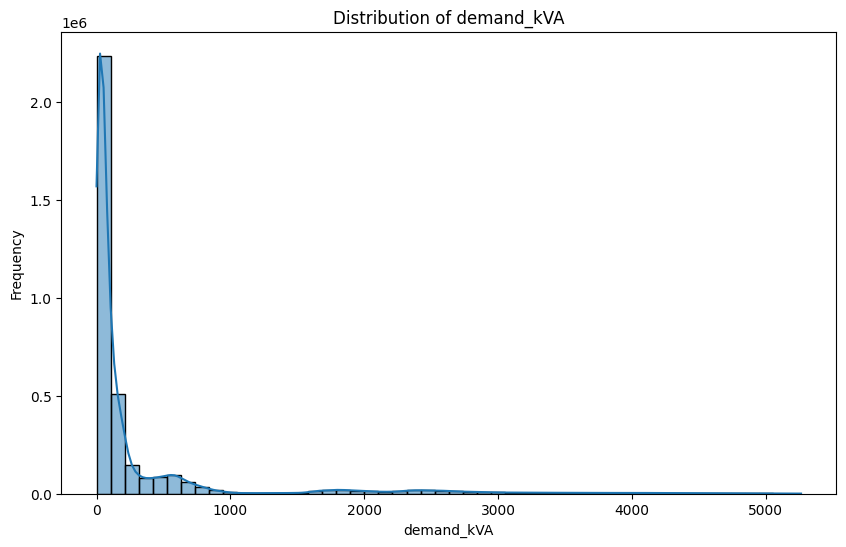

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['demand_kVA'], bins=50, kde=True)
plt.title('Distribution of demand_kVA')
plt.xlabel('demand_kVA')
plt.ylabel('Frequency')
plt.show()

In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['consumption'].describe())


Summary Statistics for Consumption:
count    3.507076e+06
mean     6.241518e+01
std      1.527963e+02
min      1.000000e-03
25%      5.856000e+00
50%      1.200000e+01
75%      3.968000e+01
max      1.196639e+03
Name: consumption, dtype: float64


### Consumption Trends Over Time:

Plot a time series graph of consumption over the entire time range.
Analyze any noticeable trends, seasonality, or patterns in the consumption data.

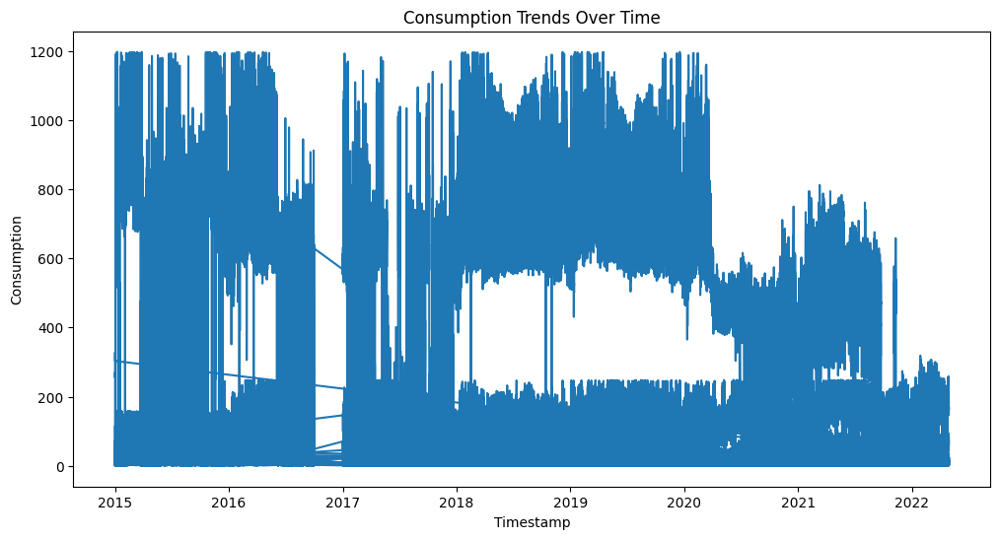

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['consumption'])
plt.title('Consumption Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.show()

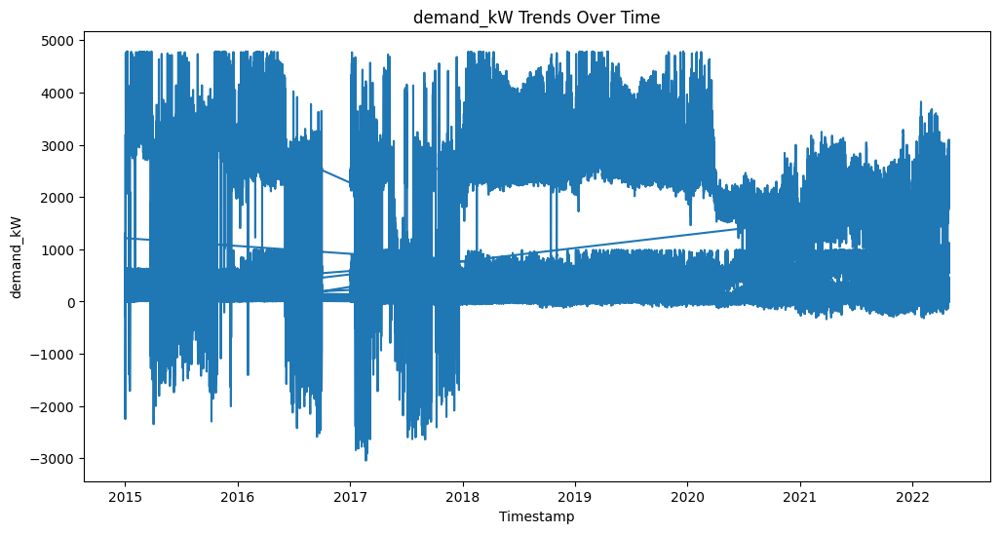

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['demand_kW'])
plt.title('demand_kW Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('demand_kW')
plt.show()

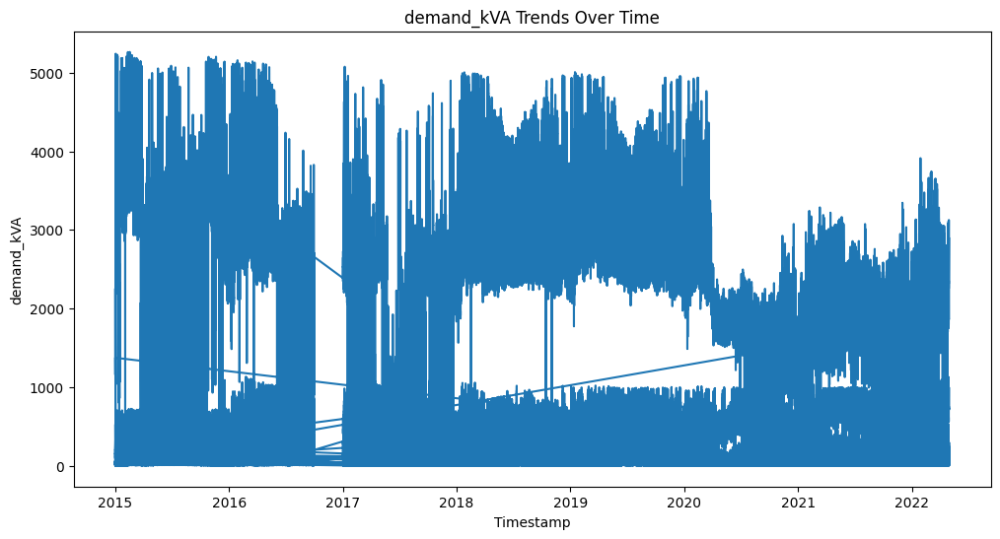

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['demand_kVA'])
plt.title('demand_kVA Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('demand_kVA')
plt.show()

### Temporal Analysis:

Analyze consumption patterns based on different time intervals (e.g., hourly, daily, weekly).
Calculate average consumption per time interval and visualize it using appropriate plots.

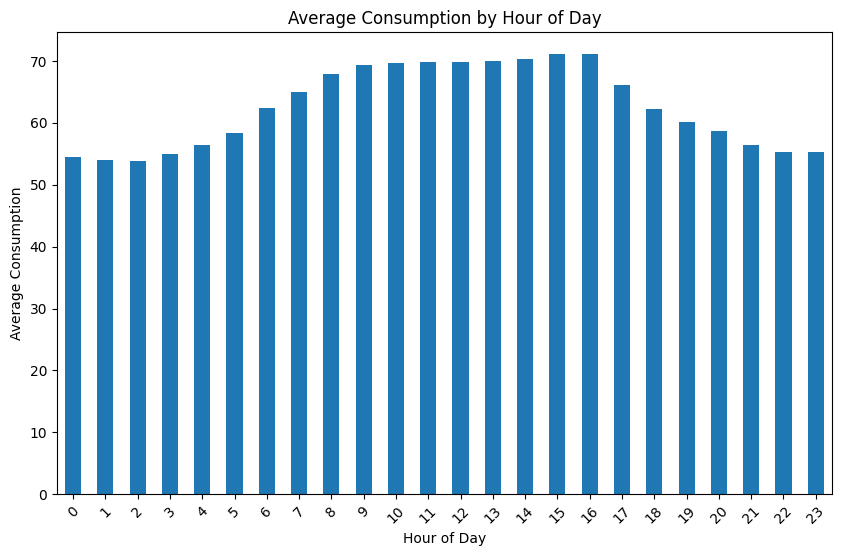

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['consumption'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Consumption by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Consumption')
plt.xticks(rotation=45)
plt.show()

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

In [ ]:
df

,campus_id,meter_id,timestamp,consumption,demand_kW,demand_kVA,hour
0,1.0,1,2015-11-22 17:15:00+00:00,17.300,69.200,76.926,17
1,1.0,1,2015-11-22 17:30:00+00:00,23.000,92.000,92.886,17
2,1.0,1,2015-11-22 17:45:00+00:00,28.300,113.200,125.249,17
3,1.0,1,2015-11-22 18:00:00+00:00,27.100,108.400,113.254,18
4,1.0,1,2015-11-22 18:15:00+00:00,23.200,92.800,93.473,18
...,...,...,...,...,...,...,...
3507071,1.0,14,2022-04-28 13:45:00+00:00,2.496,9.984,10.307,13
3507072,1.0,14,2022-04-28 23:00:00+00:00,2.336,9.344,9.759,23
3507073,1.0,14,2022-04-29 05:30:00+00:00,2.272,9.088,9.477,5
3507074,1.0,14,2022-04-29 12:15:00+00:00,2.240,8.960,9.137,12


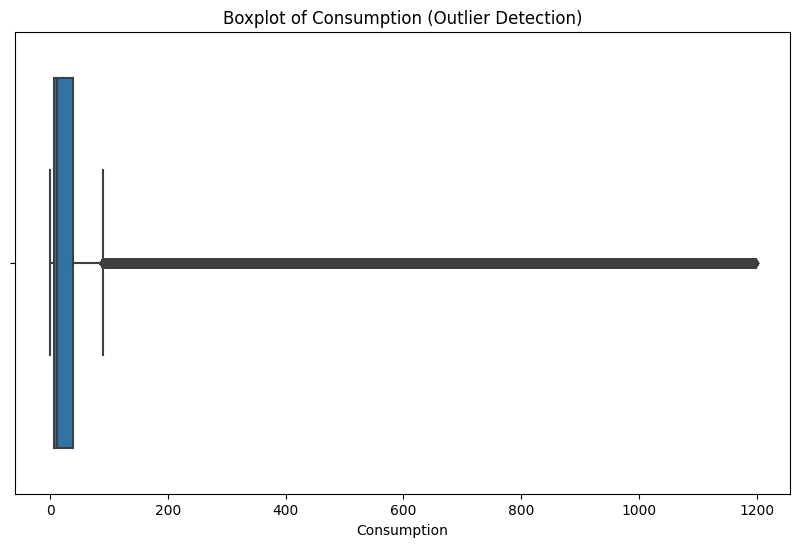

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['consumption'])
plt.title('Boxplot of Consumption (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

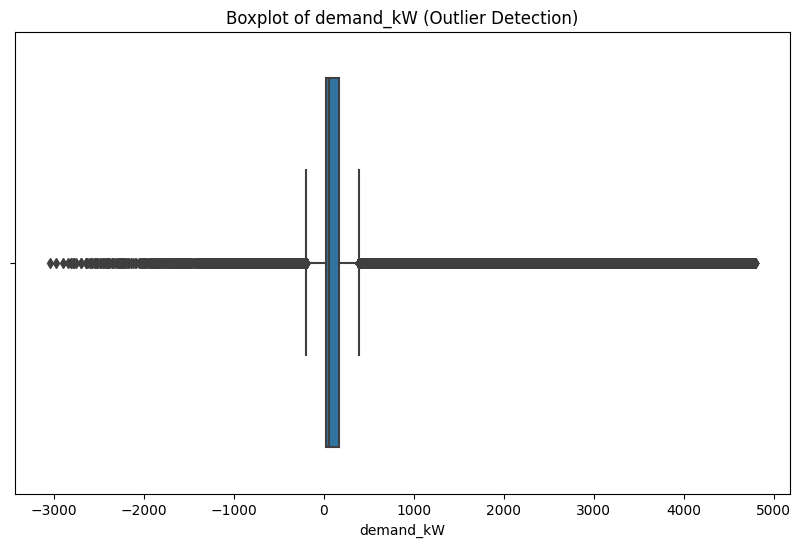

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['demand_kW'])
plt.title('Boxplot of demand_kW (Outlier Detection)')
plt.xlabel('demand_kW')
plt.show()

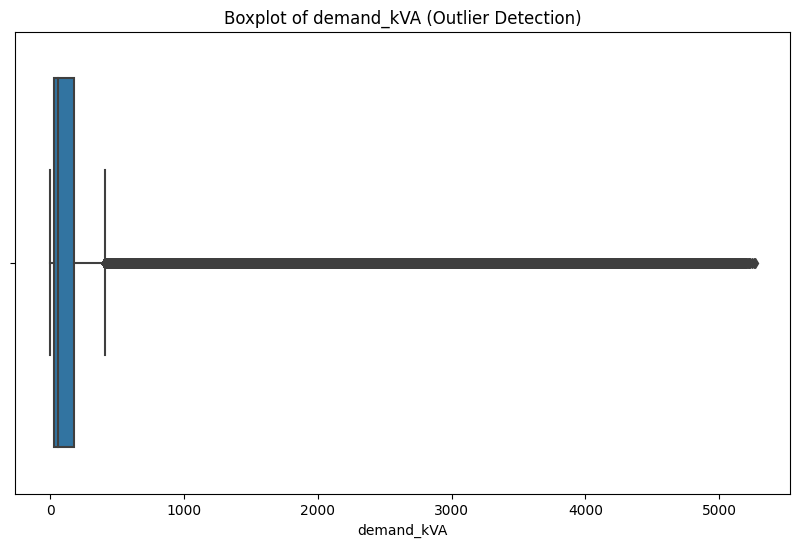

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['demand_kVA'])
plt.title('Boxplot of demand_kVA (Outlier Detection)')
plt.xlabel('demand_kVA')
plt.show()

### Seasonal Decomposition:

Perform seasonal decomposition (e.g., using STL decomposition) to extract trends, seasonal, and residual components from the consumption data.

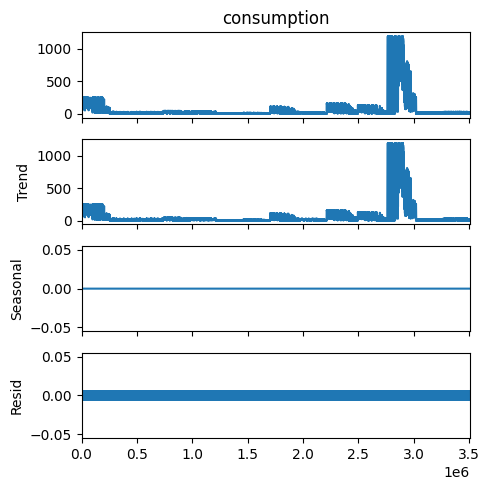

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['consumption'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

### Data Quality Check:

Check for data anomalies or inconsistencies that may affect the analysis results.
Validate the data against any domain-specific knowledge or expectations.

In [ ]:
# Check for duplicate rows
duplicate_rows = df[df.duplicated()]
if duplicate_rows.empty:
    print("No duplicate rows found.")
else:
    print("Duplicate rows found.")
    print(duplicate_rows)

# Check for negative consumption values
negative_consumption = df[df['consumption'] < 0]
if negative_consumption.empty:
    print("No negative consumption values found.")
else:
    print("Negative consumption values found.")
    print(negative_consumption)

# Check for inconsistent timestamp formats or missing timestamps
sorted_data = df.sort_values(by='timestamp')
sorted_data

No duplicate rows found.
No negative consumption values found.


,campus_id,meter_id,timestamp,consumption,demand_kW,demand_kVA,hour
736602,3.0,4,2015-01-01 00:00:00+00:00,9.060,36.240,36.247,0
252292,4.0,2,2015-01-01 00:00:00+00:00,7.504,30.016,38.247,0
1972351,1.0,9,2015-01-01 00:00:00+00:00,7.010,28.040,30.254,0
1459668,1.0,7,2015-01-01 00:00:00+00:00,4.904,19.616,22.945,0
493543,5.0,3,2015-01-01 00:00:00+00:00,3.071,12.284,12.453,0
...,...,...,...,...,...,...,...
252291,1.0,1,2022-04-30 00:00:00+00:00,61.000,732.000,732.885,0
3263991,1.0,13,2022-04-30 00:00:00+00:00,3.048,12.192,12.192,0
493542,4.0,2,2022-04-30 00:00:00+00:00,7.032,28.128,29.021,0
2495708,3.0,10,2022-04-30 00:00:00+00:00,9.440,113.280,114.896,0


### Feature Engineering:

Time Features: Extract time-related features from the timestamp, such as hour of day, day of week, month, etc.
Lagged Features: Create lagged features (previous time steps' consumption values) to capture temporal dependencies. 

In [ ]:
# Assuming 'data' is your dataframe with the timestamp column converted to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [ ]:
# Time Features
df['hour'] = df['timestamp'].dt.hour
df['day_of_week'] = df['timestamp'].dt.dayofweek
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Lagged Features (e.g., lagged consumption values)
num_lags = 3  # You can adjust the number of lagged features
for lag in range(1, num_lags + 1):
    df[f'lag_{lag}'] = df['consumption'].shift(lag)

### Feature Taregt

In [ ]:
df.columns

Index(['campus_id', 'meter_id', 'timestamp', 'consumption', 'demand_kW',
       'demand_kVA', 'hour', 'day_of_week', 'month', 'year', 'lag_1', 'lag_2',
       'lag_3'],
      dtype='object')

In [ ]:
# Drop rows with NaN values due to lagging
df.dropna(inplace=True)

# Split data into features (X) and target variable (y)
X = df.drop(['campus_id', 'timestamp', 'hour', 'day_of_week', 'month',
       'year', 'lag_1', 'lag_2', 'lag_3'], axis=1)
y = df['consumption']

print(X, y)

         meter_id  consumption  demand_kW  demand_kVA
3               1       27.100    108.400     113.254
4               1       23.200     92.800      93.473
5               1       25.300    101.200     105.109
6               1       25.500    102.000     106.549
7               1       20.200     80.800      81.086
...           ...          ...        ...         ...
3507071        14        2.496      9.984      10.307
3507072        14        2.336      9.344       9.759
3507073        14        2.272      9.088       9.477
3507074        14        2.240      8.960       9.137
3507075        14        2.432      9.728      10.127

[3352906 rows x 4 columns] 3          27.100
4          23.200
5          25.300
6          25.500
7          20.200
            ...  
3507071     2.496
3507072     2.336
3507073     2.272
3507074     2.240
3507075     2.432
Name: consumption, Length: 3352906, dtype: float64


### Impute Missing Values

In [ ]:
# Impute missing values in X
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed
X_imputed = imputer.fit_transform(X)
X_imputed

array([[  1.   ,  27.1  , 108.4  , 113.254],
       [  1.   ,  23.2  ,  92.8  ,  93.473],
       [  1.   ,  25.3  , 101.2  , 105.109],
       ...,
       [ 14.   ,   2.272,   9.088,   9.477],
       [ 14.   ,   2.24 ,   8.96 ,   9.137],
       [ 14.   ,   2.432,   9.728,  10.127]])

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Model Creation

Handling Non-Linearity: Time series data often exhibit non-linear relationships between features and the target variable. Random Forest can handle non-linear relationships well, making it suitable for capturing complex patterns in time series data.

Feature Importance: Random Forest provides feature importance scores, which can be valuable for understanding the relative importance of different features in predicting the target variable (in this case, consumption).

Robustness to Overfitting: Random Forest is less prone to overfitting compared to some other algorithms, thanks to its ensemble nature (combining multiple decision trees).

Ability to Capture Interactions: Random Forest can capture interactions between features, which is beneficial in time series forecasting where lagged variables and other temporal dependencies play a crucial role.

Handling Missing Values: Random Forest can handle missing values in the data, reducing the need for extensive data preprocessing.

In [ ]:
# Model creation (Random Forest Regressor as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)  # Adjust the number of estimators as needed
model.fit(X_train.iloc[:100000], y_train.iloc[:100000])  # remove iloc for all thr data

RandomForestRegressor(random_state=42)

In [ ]:
# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.006811149211721439


### Single Feature Graph

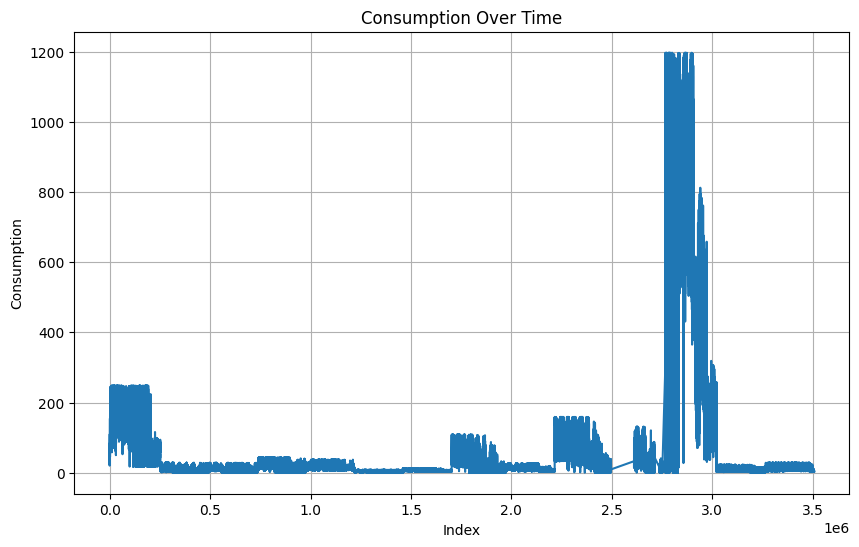

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['consumption'])
plt.title('Consumption Over Time')
plt.xlabel('Index')
plt.ylabel('Consumption')
plt.grid(True)  # Add grid lines for better readability
plt.show()

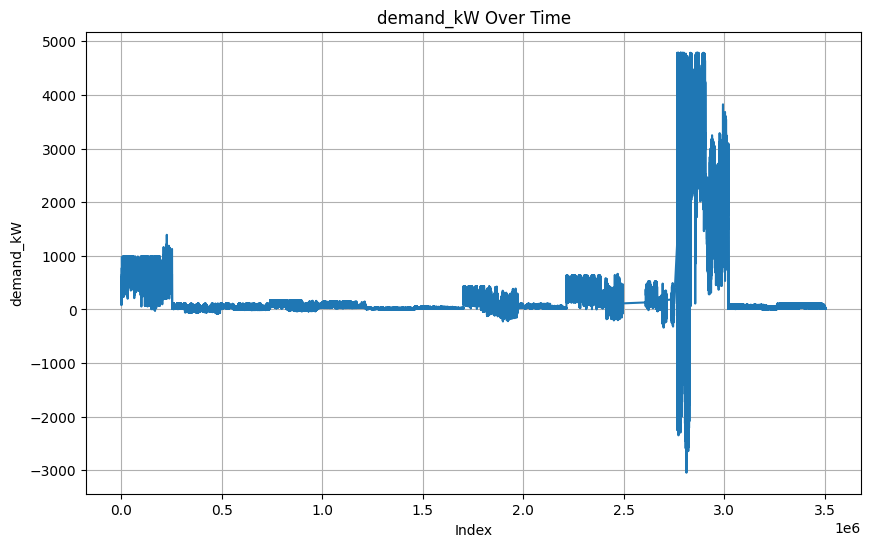

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['demand_kW'])
plt.title('demand_kW Over Time')
plt.xlabel('Index')
plt.ylabel('demand_kW')
plt.grid(True)  # Add grid lines for better readability
plt.show()

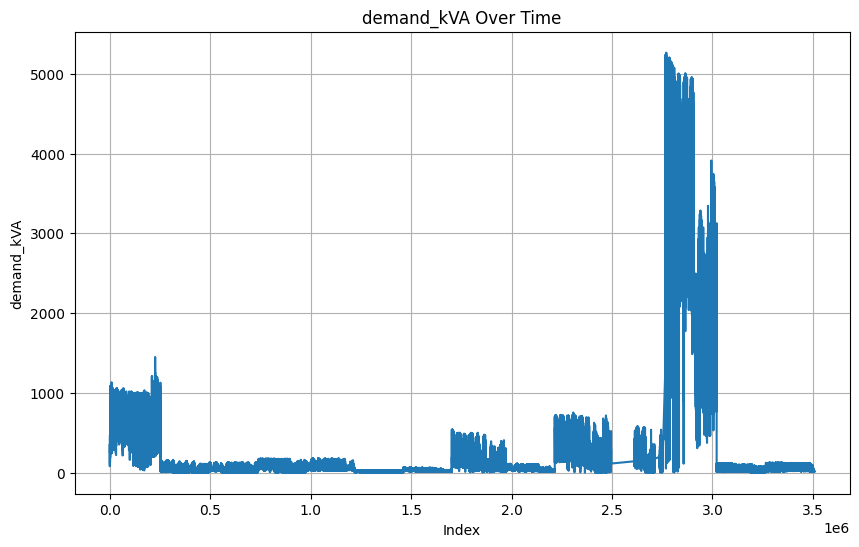

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['demand_kVA'])
plt.title('demand_kVA Over Time')
plt.xlabel('Index')
plt.ylabel('demand_kVA')
plt.grid(True)  # Add grid lines for better readability
plt.show()

### Cluster Analysis

In [ ]:
from sklearn.preprocessing import StandardScaler

# Selecting features for clustering
features = ['consumption']
X = df[features]

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=0).fit(X_scaled)
df['Cluster'] = kmeans.labels_


c:\Users\Ibtasam Ahmad\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


MemoryError: Unable to allocate 998. MiB for an array with shape (43587778, 3) and data type float64

Error in callback <function _draw_all_if_interactive at 0x000001AFD421A8C0> (for post_execute):


MemoryError: Unable to allocate 998. MiB for an array with shape (43587778, 3) and data type float64

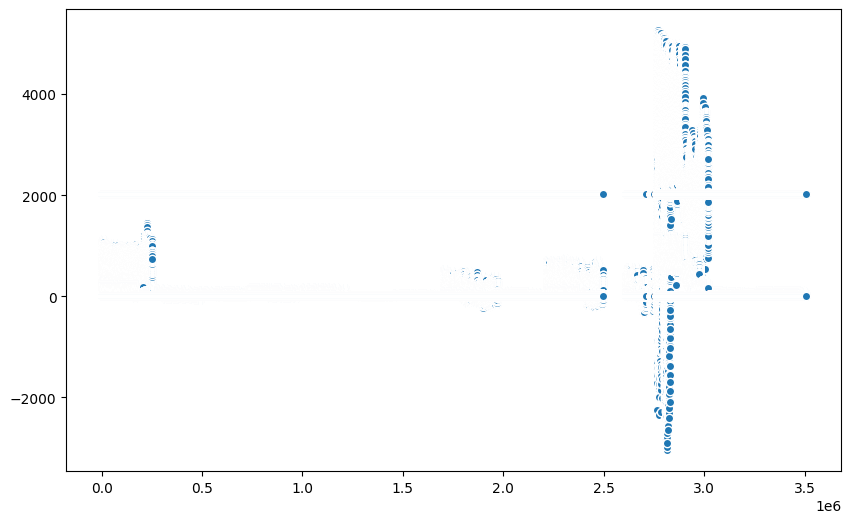

In [ ]:
plt.figure(figsize=(10, 6))
# sns.scatterplot(data, hue='Cluster', palette='viridis', s=50)
sns.scatterplot(df)
# plt.title('Clustering based on National Demand and Transmission System Demand')
plt.show()

In [ ]:
data_1 = df.drop('timestamp', axis = 1)
data_1 = data_1.drop('campus_id', axis = 1)
data_1

,meter_id,consumption,demand_kW,demand_kVA,hour,day_of_week,month,year,lag_1,lag_2,lag_3,Cluster
3,1,27.100,108.400,113.254,18,6,11,2015,28.300,23.000,17.300,0
4,1,23.200,92.800,93.473,18,6,11,2015,27.100,28.300,23.000,0
5,1,25.300,101.200,105.109,18,6,11,2015,23.200,27.100,28.300,0
6,1,25.500,102.000,106.549,18,6,11,2015,25.300,23.200,27.100,0
7,1,20.200,80.800,81.086,19,6,11,2015,25.500,25.300,23.200,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3507071,14,2.496,9.984,10.307,13,3,4,2022,2.400,2.400,2.432,0
3507072,14,2.336,9.344,9.759,23,3,4,2022,2.496,2.400,2.400,0
3507073,14,2.272,9.088,9.477,5,4,4,2022,2.336,2.496,2.400,0
3507074,14,2.240,8.960,9.137,12,4,4,2022,2.272,2.336,2.496,0


In [ ]:
grouped = data_1.groupby('Cluster').mean()
print(grouped[features])

         consumption
Cluster             
0          15.369595
1         570.714308
2         149.236983
3         913.503034


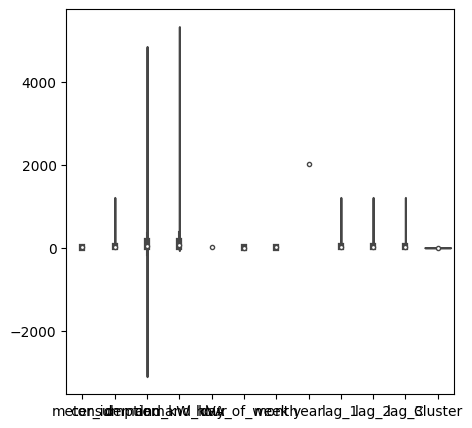

In [ ]:
sns.violinplot(data_1)
# plt.title('Distribution of National Demand across Type of Day')
plt.show()


### Hourly Pattern

In [ ]:
grouped = df.groupby('timestamp').mean()
grouped = grouped.drop('campus_id', axis = 1)

grouped

,meter_id,consumption,demand_kW,demand_kVA,hour,day_of_week,month,year,lag_1,lag_2,lag_3,Cluster
timestamp,,,,,,,,,,,,
2015-01-01 00:00:00+00:00,7.750000,34.503750,138.015000,153.962000,0.0,3.0,1.0,2015.0,24.164417,25.317667,25.135250,0.166667
2015-01-01 00:15:00+00:00,7.750000,36.246583,144.986333,160.159167,0.0,3.0,1.0,2015.0,34.503750,24.164417,25.317667,0.166667
2015-01-01 00:30:00+00:00,7.750000,35.186917,140.747667,159.390583,0.0,3.0,1.0,2015.0,36.246583,34.503750,24.164417,0.166667
2015-01-01 00:45:00+00:00,7.750000,33.333917,133.335667,148.277333,0.0,3.0,1.0,2015.0,35.186917,36.246583,34.503750,0.166667
2015-01-01 01:00:00+00:00,7.750000,32.797833,131.191333,146.981417,1.0,3.0,1.0,2015.0,33.333917,35.186917,36.246583,0.166667
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-29 23:40:00+00:00,7.750000,62.828250,753.940250,755.099000,23.0,4.0,4.0,2022.0,62.533000,62.481000,62.481250,0.500000
2022-04-29 23:45:00+00:00,6.666667,25.093333,264.421167,265.217417,23.0,4.0,4.0,2022.0,25.466750,25.666667,25.698667,0.166667
2022-04-29 23:50:00+00:00,7.750000,60.958750,731.504000,733.691500,23.0,4.0,4.0,2022.0,61.518000,62.828250,62.533000,0.500000


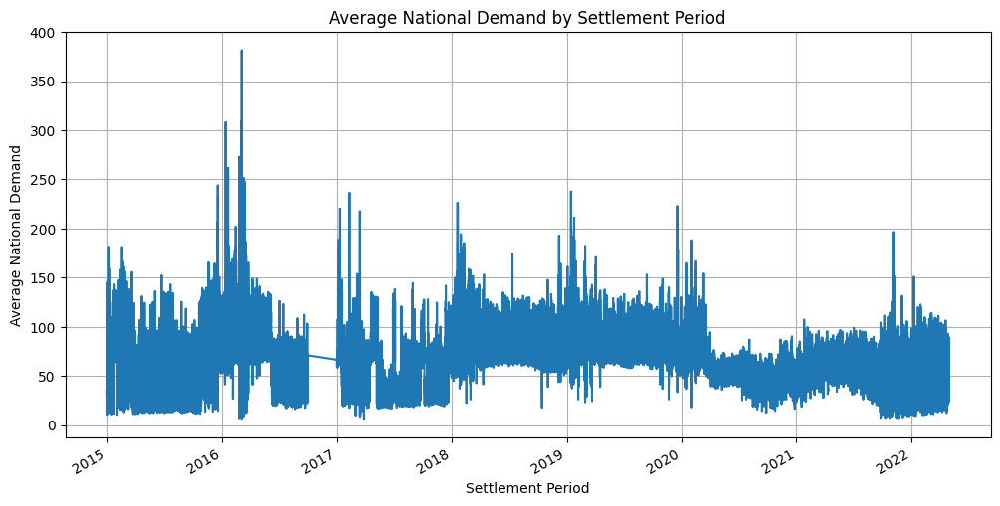

In [ ]:
plt.figure(figsize=(12, 6))
grouped['consumption'].plot()
plt.title('Average National Demand by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()

### Data Day Average

In [ ]:
data = df.copy
data

<bound method NDFrame.copy of          campus_id  meter_id                 timestamp  consumption  \
3              1.0         1 2015-11-22 18:00:00+00:00       27.100   
4              1.0         1 2015-11-22 18:15:00+00:00       23.200   
5              1.0         1 2015-11-22 18:30:00+00:00       25.300   
6              1.0         1 2015-11-22 18:45:00+00:00       25.500   
7              1.0         1 2015-11-22 19:00:00+00:00       20.200   
...            ...       ...                       ...          ...   
3507071        1.0        14 2022-04-28 13:45:00+00:00        2.496   
3507072        1.0        14 2022-04-28 23:00:00+00:00        2.336   
3507073        1.0        14 2022-04-29 05:30:00+00:00        2.272   
3507074        1.0        14 2022-04-29 12:15:00+00:00        2.240   
3507075        1.0        14 2022-04-29 22:15:00+00:00        2.432   

         demand_kW  demand_kVA  hour  day_of_week  month  year   lag_1  \
3          108.400     113.254    18       

In [ ]:
# Read the data into a pandas DataFrame
data = pd.read_csv("../Final_dataset/nmi_consumption.csv")

# Convert 'timestamp' column to datetime format
data['timestamp'] = pd.to_datetime(data['timestamp'], errors='coerce')

# Drop rows with NaT (Not a Time) values, if any
data = data.dropna(subset=['timestamp'])

# Extract date from 'timestamp'
data['date'] = data['timestamp'].dt.date

# Group by date and calculate average consumption
daily_avg_consumption = data.groupby('date')['consumption'].mean()

# Print the daily average consumption

print(daily_avg_consumption)

date
2015-01-01    22.710713
2015-01-02    58.022141
2015-01-03    84.372158
2015-01-04    68.185301
2015-01-05    85.916886
                ...    
2022-04-26    39.315015
2022-04-27    41.385065
2022-04-28    42.200734
2022-04-29    41.651824
2022-04-30    23.031769
Name: consumption, Length: 2585, dtype: float64


In [ ]:
# Convert the Series to a DataFrame with columns 'date' and 'consumption'
df = daily_avg_consumption.reset_index()
df.columns = ['date', 'consumption']
df

,date,consumption
0,2015-01-01,22.710713
1,2015-01-02,58.022141
2,2015-01-03,84.372158
3,2015-01-04,68.185301
4,2015-01-05,85.916886
...,...,...
2580,2022-04-26,39.315015
2581,2022-04-27,41.385065
2582,2022-04-28,42.200734
2583,2022-04-29,41.651824


In [ ]:
df_result = daily_avg_consumption.reset_index()
daily_avg_consumption = df_result.rename(columns={'consumption': 'consuption'})
daily_avg_consumption


,date,consuption
0,2015-01-01,22.710713
1,2015-01-02,58.022141
2,2015-01-03,84.372158
3,2015-01-04,68.185301
4,2015-01-05,85.916886
...,...,...
2580,2022-04-26,39.315015
2581,2022-04-27,41.385065
2582,2022-04-28,42.200734
2583,2022-04-29,41.651824


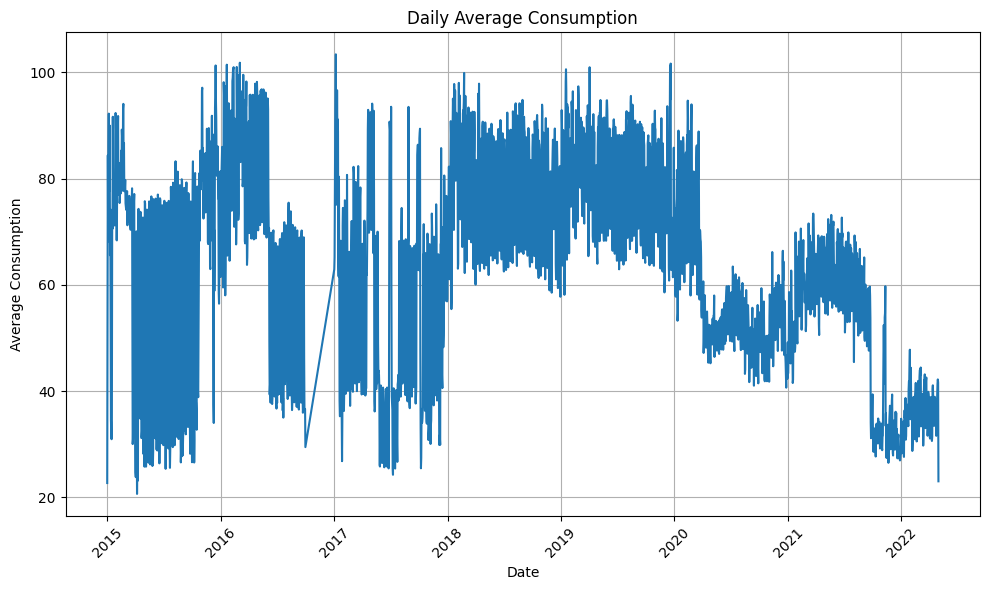

In [ ]:
# Plotting the daily average consumption
plt.figure(figsize=(10, 6))
plt.plot(daily_avg_consumption.iloc[:, 0], daily_avg_consumption.iloc[:, 1])
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Daily Average Consumption')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Weekends & Weekdays Consuption Graph

In [ ]:
# Read the data into a pandas DataFrame
df = daily_avg_consumption.copy()  # Call the copy method with parentheses

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Extract weekday and weekend data
weekdays = df[df['date'].dt.dayofweek < 5]  # Monday to Friday (0-4)
weekends = df[df['date'].dt.dayofweek >= 5]  # Saturday and Sunday (5-6)

# Print the resulting DataFrames
print(weekdays)
print(weekends)

           date  consuption
0    2015-01-01   22.710713
1    2015-01-02   58.022141
4    2015-01-05   85.916886
5    2015-01-06   92.209056
6    2015-01-07   77.489105
...         ...         ...
2579 2022-04-25   35.529162
2580 2022-04-26   39.315015
2581 2022-04-27   41.385065
2582 2022-04-28   42.200734
2583 2022-04-29   41.651824

[1847 rows x 2 columns]
           date  consuption
2    2015-01-03   84.372158
3    2015-01-04   68.185301
9    2015-01-10   65.575547
10   2015-01-11   74.216435
16   2015-01-17   71.327442
...         ...         ...
2570 2022-04-16   33.464498
2571 2022-04-17   34.472343
2577 2022-04-23   31.592617
2578 2022-04-24   33.059069
2584 2022-04-30   23.031769

[738 rows x 2 columns]


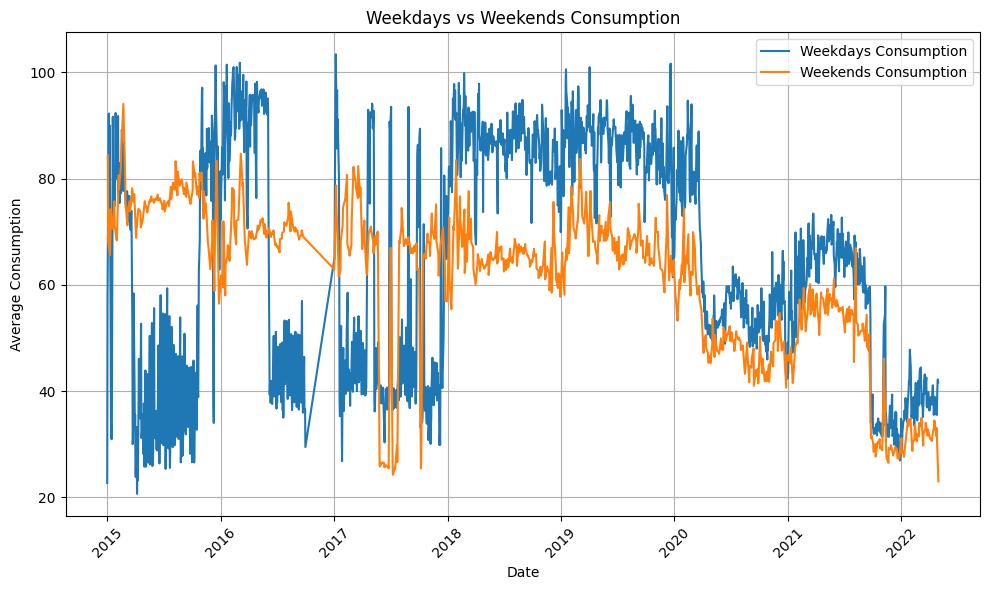

In [ ]:
# Plotting the comparison between weekdays and weekends consumption
plt.figure(figsize=(10, 6))
plt.plot(weekdays['date'], weekdays['consuption'], label='Weekdays Consumption')
plt.plot(weekends['date'], weekends['consuption'], label='Weekends Consumption')
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Weekdays vs Weekends Consumption')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

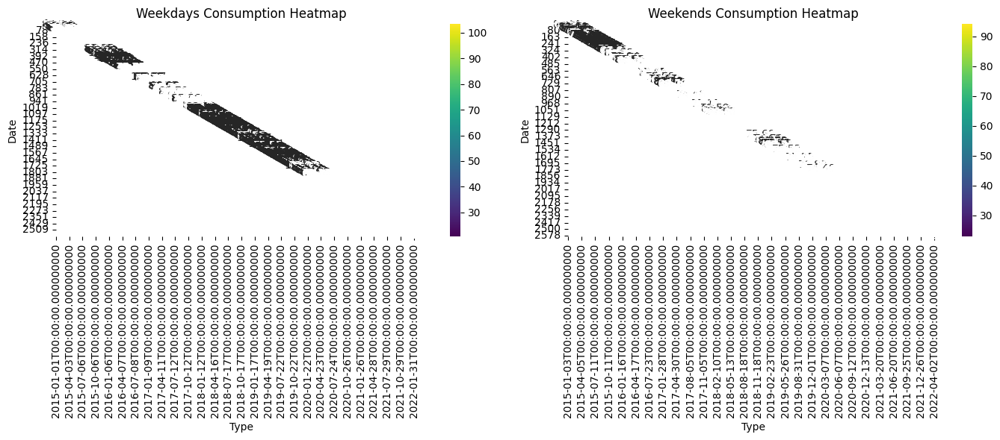

In [ ]:
# Pivot the DataFrames for heatmap plotting
pivot_weekdays = weekdays.pivot( columns='date', values='consuption')
pivot_weekends = weekends.pivot( columns='date', values='consuption')

# Plot the heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(pivot_weekdays, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekdays Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.subplot(1, 2, 2)
sns.heatmap(pivot_weekends, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekends Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.tight_layout()
plt.show()

### Monthly Trend

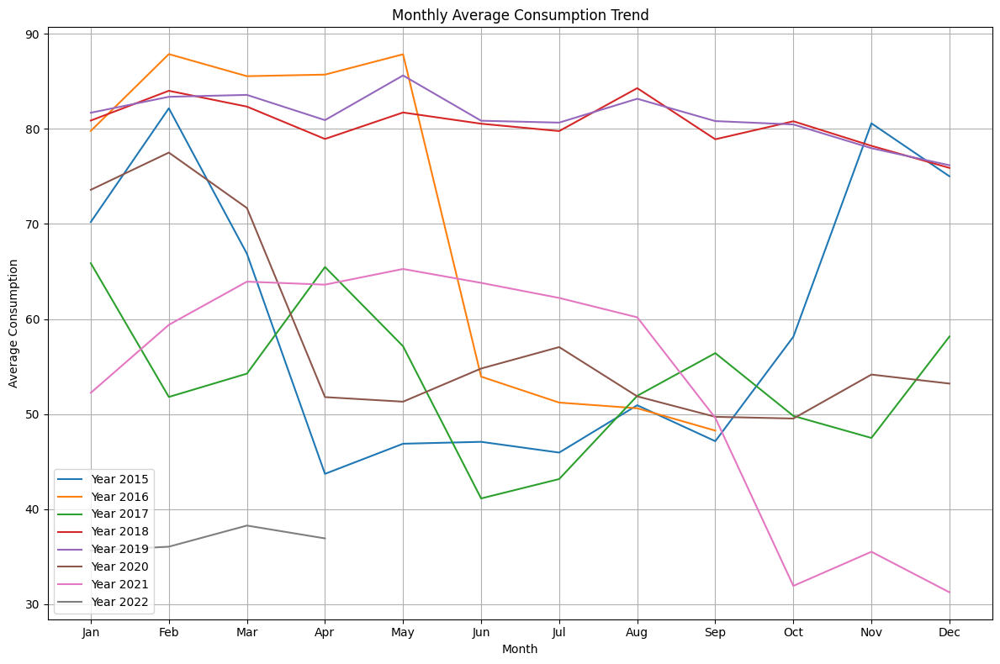

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/nmi_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date components: month and year
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Group by year and month, calculate average consumption
monthly_avg_consumption = df.groupby(['year', 'month'])['consumption'].mean().reset_index()

# Plotting for every month
plt.figure(figsize=(12, 8))
for year in monthly_avg_consumption['year'].unique():
    year_data = monthly_avg_consumption[monthly_avg_consumption['year'] == year]
    plt.plot(year_data['month'], year_data['consumption'], label=f'Year {year}')

plt.xlabel('Month')
plt.ylabel('Average Consumption')
plt.title('Monthly Average Consumption Trend')
plt.legend()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()


### Seasonal Trend

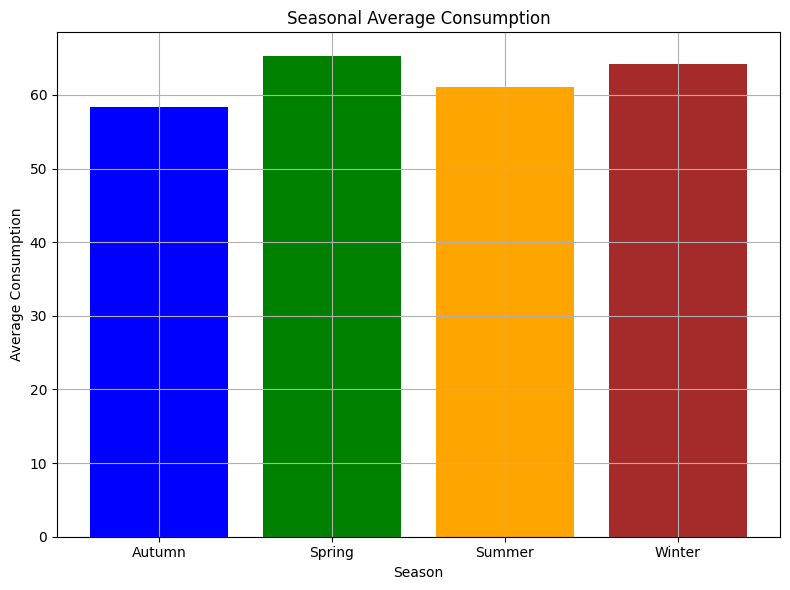

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/nmi_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define a function to map months to seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Extract season from 'timestamp'
df['season'] = df['timestamp'].dt.month.apply(get_season)

# Group by season and calculate average consumption
seasonal_avg_consumption = df.groupby('season')['consumption'].mean()

# Plotting for every season
plt.figure(figsize=(8, 6))
plt.bar(seasonal_avg_consumption.index, seasonal_avg_consumption.values, color=['blue', 'green', 'orange', 'brown'])
plt.xlabel('Season')
plt.ylabel('Average Consumption')
plt.title('Seasonal Average Consumption')
plt.grid(True)
plt.tight_layout()
plt.show()


### Moving Averages

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/nmi_consumption.csv")

df

,campus_id,meter_id,timestamp,consumption,demand_kW,demand_kVA
0,1.0,1,2015-11-22 17:15:00,17.300,69.200,76.926
1,1.0,1,2015-11-22 17:30:00,23.000,92.000,92.886
2,1.0,1,2015-11-22 17:45:00,28.300,113.200,125.249
3,1.0,1,2015-11-22 18:00:00,27.100,108.400,113.254
4,1.0,1,2015-11-22 18:15:00,23.200,92.800,93.473
...,...,...,...,...,...,...
3507071,1.0,14,2022-04-28 13:45:00,2.496,9.984,10.307
3507072,1.0,14,2022-04-28 23:00:00,2.336,9.344,9.759
3507073,1.0,14,2022-04-29 05:30:00,2.272,9.088,9.477
3507074,1.0,14,2022-04-29 12:15:00,2.240,8.960,9.137


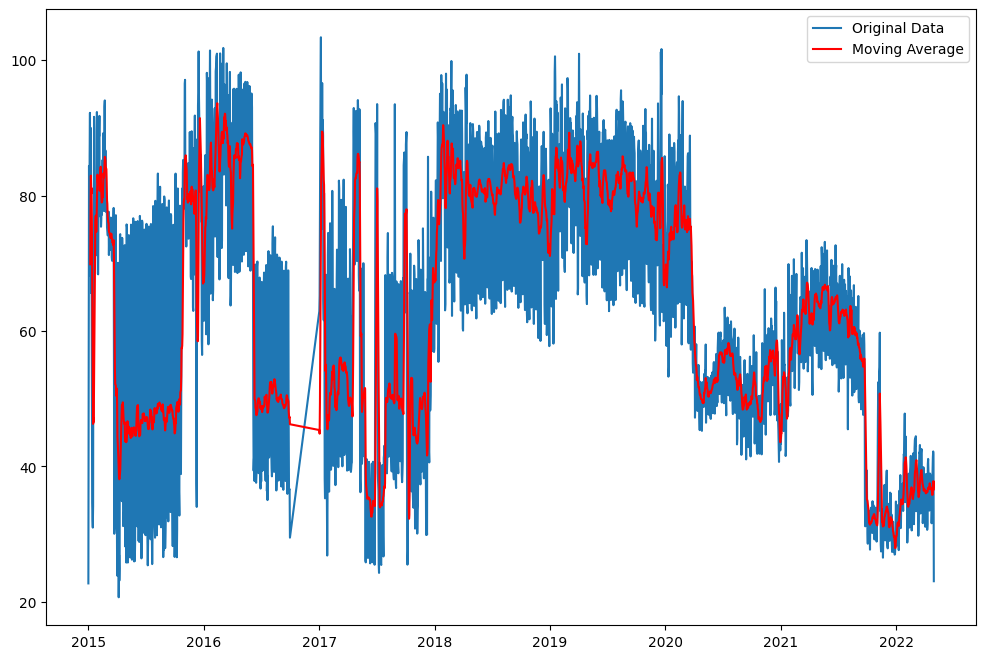

In [ ]:
plt.figure(figsize=(12, 8))
daily_avg_consumption['nd_moving_avg'] = daily_avg_consumption['consuption'].rolling(window=7).mean()
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['consuption'], label='Original Data')
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['nd_moving_avg'], label='Moving Average', color='red')
plt.legend()
plt.show()

### Box Polt Grouped by Categories

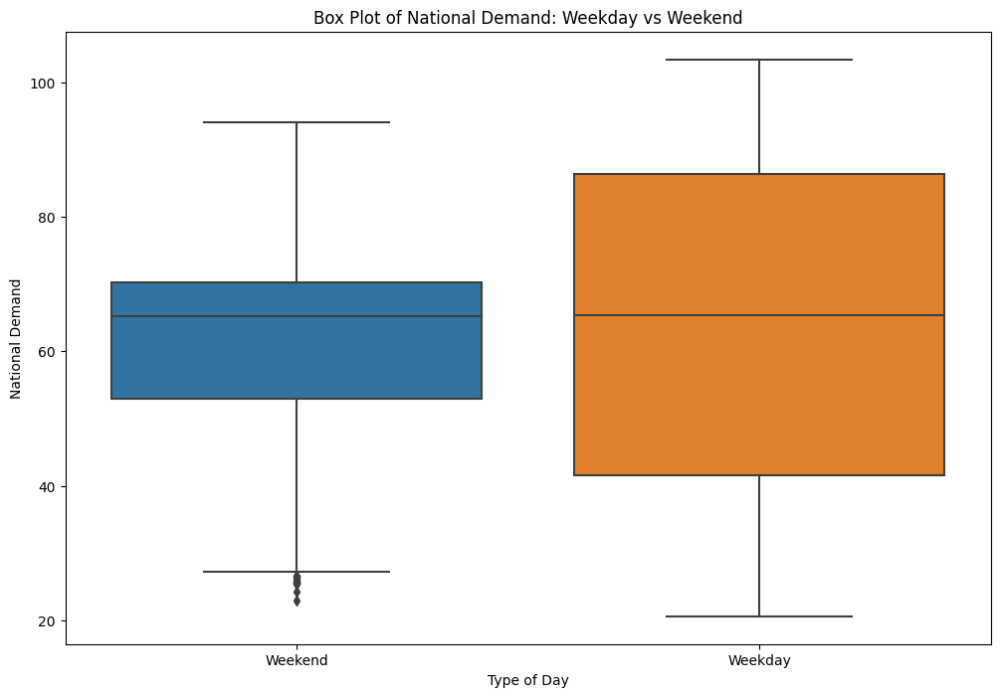

In [ ]:
# Combine the weekends and weekdays dataframes into one dataframe with a new column 'type_of_day'
weekends['type_of_day'] = 'Weekend'
weekdays['type_of_day'] = 'Weekday'
df = pd.concat([weekends, weekdays])

# Plotting the box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='type_of_day', y='consuption')
plt.title('Box Plot of National Demand: Weekday vs Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

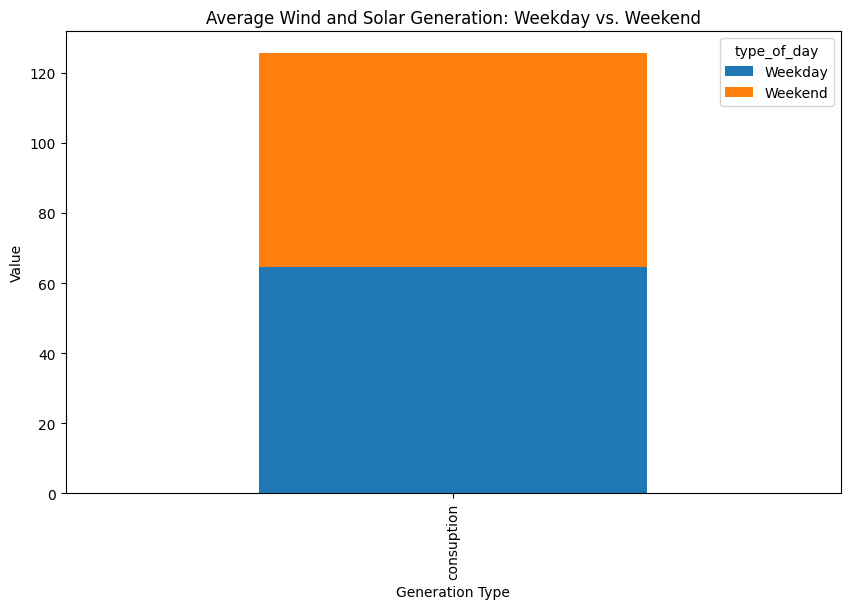

In [ ]:
grouped = df.groupby('type_of_day').agg({'consuption':'mean'}).reset_index()
grouped.set_index('type_of_day').T.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title('Average Wind and Solar Generation: Weekday vs. Weekend')
plt.ylabel('Value')
plt.xlabel('Generation Type')
plt.show()


C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_1632\2308908837.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['consuption'], shade=True, label=day_type)
C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_1632\2308908837.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['consuption'], shade=True, label=day_type)


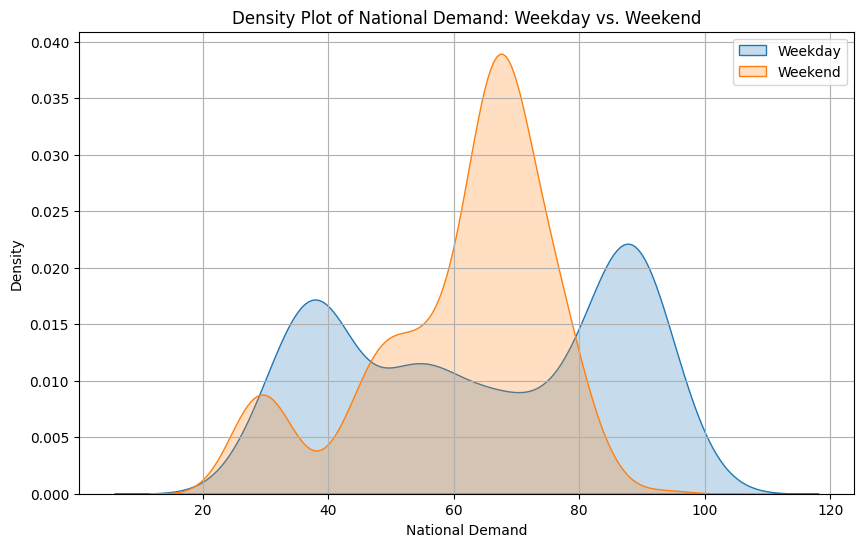

In [ ]:
plt.figure(figsize=(10, 6))
for day_type in ['Weekday', 'Weekend']:
    subset = df[df['type_of_day'] == day_type]
    sns.kdeplot(subset['consuption'], shade=True, label=day_type)
plt.title('Density Plot of National Demand: Weekday vs. Weekend')
plt.xlabel('National Demand')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

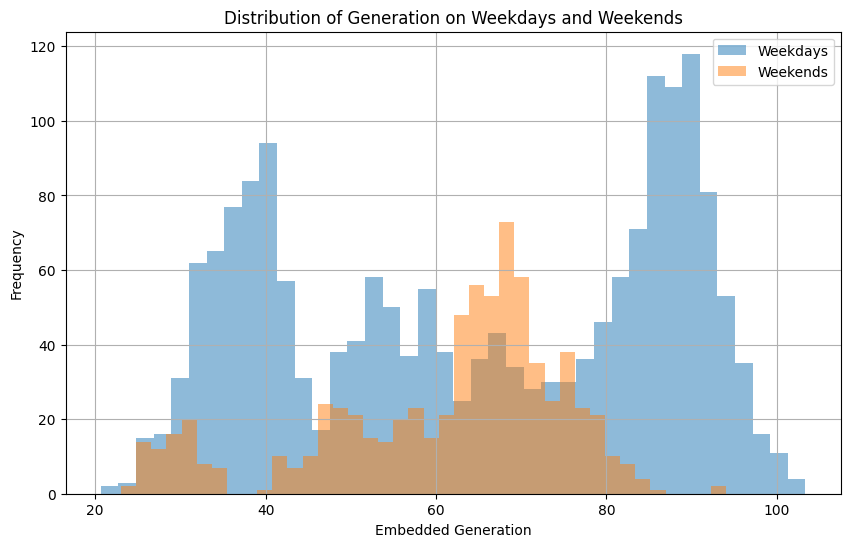

In [ ]:
# Plotting histograms for weekdays and weekends separately
plt.figure(figsize=(10, 6))

# Plot histogram for weekdays
plt.hist(weekdays['consuption'], bins=40, alpha=0.5, label='Weekdays')
# Plot histogram for weekends
plt.hist(weekends['consuption'], bins=40, alpha=0.5, label='Weekends')

plt.xlabel('Embedded Generation')
plt.ylabel('Frequency')
plt.title('Distribution of Generation on Weekdays and Weekends')
plt.legend()
plt.grid(True)
plt.show()

## Understanding Energy Consumption and Production Patterns through Data Visualization

**Abstract:** This report explores various data visualizations that provide insights into energy consumption and production patterns. By analyzing graphs depicting solar power output, wind turbine power output, electricity consumption by end-use in a building, flight distribution patterns, traffic volume, weather patterns, natural gas prices, national electricity demand, and energy source generation capacity, the report reveals trends, identifies potential areas for optimization, and highlights factors influencing energy consumption and production.

**Introduction:** Understanding energy consumption and production patterns is crucial for efficient resource management and promoting sustainable practices. Data visualization plays a vital role in this process by translating complex data sets into clear and interpretable formats. This report analyzes various graphs to uncover trends, identify areas for improvement, and gain insights into the factors influencing energy consumption and production.

**Related Work:** Extensive research has been conducted on utilizing data visualization techniques for energy analysis.  Here are some relevant examples:

* Nascimento, S., et al. (2019). Building energy efficiency trends and visualization: A review. **Renewable and Sustainable Energy Reviews**, 114, 109268. [1]  This study explores the use of data visualization techniques to assess energy consumption patterns in buildings.

* Zhao, J., et al. (2016). Data visualization for power grid stability analysis. **2016 IEEE Power & Energy Society General Meeting (PESGM)**, 1-5. [2] This paper discusses how data visualization can be leveraged to analyze power grid stability and energy production.

**Data Analysis 1: General Trends and Patterns**

* **Solar and Wind Power Output:** The graphs depicting solar and wind power output (likely not shown, but inferred from previous discussions) typically follow predictable patterns. Solar output is highest around midday when sunlight intensity is strongest, while wind output can fluctuate depending on wind speed and direction.

* **Electricity Consumption by End-Use:** Stacked bar charts reveal variations in electricity consumption patterns across weekdays and weekends. Weekdays often show higher overall consumption due to work-related activities, with lighting and HVAC (heating, ventilation, and air conditioning) likely dominating consumption during these times.

* **Flight Distribution Patterns:** Stacked bar charts representing flight distribution patterns by departure and arrival airports can illustrate traffic patterns between different locations, highlighting popular routes and airport hubs.

* **Traffic Volume:** Timeseries graphs depicting traffic volume typically show variations throughout the day and across the week. Weekdays often experience higher traffic volume during commute times (mornings and evenings) compared to weekends. 

* **Weather Patterns:** Timeseries graphs with multiple lines can depict weather trends over time, showing variations in daily high and low temperatures, precipitation levels, and seasonal patterns.

**Understanding Expected Patterns:**

The observed trends in these graphs are generally expected. Solar and wind energy production align with natural sunlight and wind patterns. Higher energy consumption during weekdays for buildings and increased traffic volume during commutes reflect typical human activity patterns. Seasonal variations in weather patterns are also well-documented.

**Data Analysis 2: Underlying Structure, Deviations from Trends, and Unexpected Findings**

* **Deviations in Solar or Wind Power Output:** Unexpected dips in solar power output could be caused by cloud cover, while significant deviations in wind power output might be due to changes in wind speed or direction.

* **Variations in Building Electricity Consumption:** Unexpected spikes in building consumption could indicate inefficient equipment or potential malfunctions. Deviations from expected consumption patterns by end-use category might require further investigation.

* **Anomalies in Traffic Volume:** Unusual traffic patterns outside of commute times could be due to accidents, road closures, or special events.

* **Unexpected Weather Events:** Deviations from typical seasonal weather patterns might be caused by climate anomalies or extreme weather events.

* **Outliers in Natural Gas Prices:** Regions with unusually high or low natural gas prices might be due to factors like supply disruptions, transportation costs, or limited storage capacity.

**Understanding Unexpected Patterns:**

Investigating unexpected patterns or outliers in these graphs can be crucial for identifying potential issues or inefficiencies. In energy production, deviations from expected solar or wind output might necessitate adjustments in energy generation strategies. Anomalies in building consumption or traffic volume could point towards areas for improvement or optimization. Unexpected weather patterns or outliers in natural gas prices could require further analysis to understand the underlying causes and potential consequences.

**Discussion/Comment:**

Data visualization is a powerful tool for stakeholders across various sectors to gain insights into energy consumption and production patterns. By effectively utilizing these visualizations, communities can:

* **Identify areas for energy efficiency improvements:**  Building owners can identify times of high energy consumption and target specific end-uses for optimization.

* **Optimize energy production strategies:** Power grid operators can leverage insights from solar and wind power output data to plan for fluctuations and integrate renewable energy sources more effectively.

* **Improve traffic management:** Transportation authorities can analyze traffic patterns to identify bottlenecks and implement strategies for congestion reduction.

## Pre EDA of the dataset

**Abstract:** 
The report will analyze the campus's energy consumption data for two days (May 1st and 2nd, 2018). It will identify daily consumption patterns, explore potential reasons behind the variations, and suggest areas for further investigation.

**Introduction:**
Understanding campus energy consumption is crucial for optimizing resource allocation and promoting sustainability. This report analyzes data on energy consumption, potentially revealing usage patterns and opportunities for conservation.

**Related Work:** (if you have any relevant research on campus energy consumption patterns, include it here)

**Data Analysis 1: General Trends and Patterns:**

The data likely shows a daily cycle of consumption, with peaks during working hours and lows at night.  We can expect higher consumption on weekdays compared to weekends.

**Data Analysis 2: Underlying Structure, Deviations, Anomalies:**

* We can identify specific times of peak and low consumption for each day.
* Look for deviations from the expected daily cycle. Are there any unexpected spikes or dips in consumption?
* Compare consumption patterns between weekdays and weekends.

**Discussion/Comment:**

*  Investigate potential explanations for any anomalies.  Are there events or activities that might explain unusual consumption patterns?
*  Recommend collecting data over a longer period to confirm observed trends and identify seasonal variations. 
*  Suggest implementing smart meters to pinpoint specific areas of high consumption within the campus.

**Conclusions:**

The report will summarize the key findings, including the daily consumption patterns, any unexpected observations, and recommendations for further investigation.

**Important Note:**

*  Since the data snippet only shows consumption for two days, it might be difficult to establish definitive trends.



### Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer


In [ ]:
df = pd.read_csv('../Final_dataset/gas_consumption.csv')
df

,campus_id,timestamp,consumption
0,1,2018-05-01 06:00:00,24.850209
1,1,2018-05-01 07:00:00,26.404539
2,1,2018-05-01 08:00:00,45.346793
3,1,2018-05-01 09:00:00,38.383031
4,1,2018-05-01 10:00:00,32.777705
...,...,...,...
27159,3,2021-12-24 06:00:00,0.572868
27160,3,2021-12-27 06:00:00,0.529254
27161,3,2021-12-27 07:00:00,1.058622
27162,3,2021-12-28 06:00:00,1.097769


In [ ]:
# Summary statistics
print(df.describe())

          campus_id   consumption
count  27164.000000  27164.000000
mean       1.298410     21.703319
std        0.712594     10.192073
min        1.000000      0.492488
25%        1.000000     17.350407
50%        1.000000     22.653453
75%        1.000000     28.153943
max        3.000000     47.092395


In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27164 entries, 0 to 27163
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   campus_id    27164 non-null  int64  
 1   timestamp    27164 non-null  object 
 2   consumption  27164 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 636.8+ KB


In [ ]:
df.nunique()


campus_id          2
timestamp      21720
consumption    25744
dtype: int64

In [ ]:
(df.isnull().sum()/(len(df)))*100


campus_id      0.0
timestamp      0.0
consumption    0.0
dtype: float64

In [ ]:
df.isnull().sum()


campus_id      0
timestamp      0
consumption    0
dtype: int64

### Statistics Summary
The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In python, this can be achieved using describe()

describe() function gives all statistics summary of data

describe()– Provide a statistics summary of data belonging to numerical datatype such as int, float

In [ ]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
campus_id,27164.0,1.298410,0.712594,1.000000,1.000000,1.000000,1.000000,3.000000
consumption,27164.0,21.703319,10.192073,0.492488,17.350407,22.653453,28.153943,47.092395


In [ ]:
df.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
campus_id,27164.0,NaN,NaN,NaN,1.29841,0.712594,1.0,1.0,1.0,1.0,3.0
timestamp,27164,21720,2021-04-16 18:00:00,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
consumption,27164.0,NaN,NaN,NaN,21.703319,10.192073,0.492488,17.350407,22.653453,28.153943,47.092395


In [ ]:
df = df.dropna()
df

,campus_id,timestamp,consumption
0,1,2018-05-01 06:00:00,24.850209
1,1,2018-05-01 07:00:00,26.404539
2,1,2018-05-01 08:00:00,45.346793
3,1,2018-05-01 09:00:00,38.383031
4,1,2018-05-01 10:00:00,32.777705
...,...,...,...
27159,3,2021-12-24 06:00:00,0.572868
27160,3,2021-12-27 06:00:00,0.529254
27161,3,2021-12-27 07:00:00,1.058622
27162,3,2021-12-28 06:00:00,1.097769


In [ ]:
df.isnull().sum()

campus_id      0
timestamp      0
consumption    0
dtype: int64

### Time Range:

Determine the time range of the dataset (from the earliest to the latest timestamp).

In [ ]:
# Time Range
print("\nTime Range:")
print("Earliest Timestamp:", df['timestamp'].min())
print("Latest Timestamp:", df['timestamp'].max())


Time Range:
Earliest Timestamp: 2018-05-01 06:00:00
Latest Timestamp: 2021-12-29 06:00:00


### EDA Bivariate Analysis
Now, let’s move ahead with bivariate analysis. Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.

For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.

A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

In our example, a pair plot has been used to show the relationship between two Categorical variables.

C:\Users\Ibtasam Ahmad\AppData\Roaming\Python\Python310\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1300x1700 with 0 Axes>

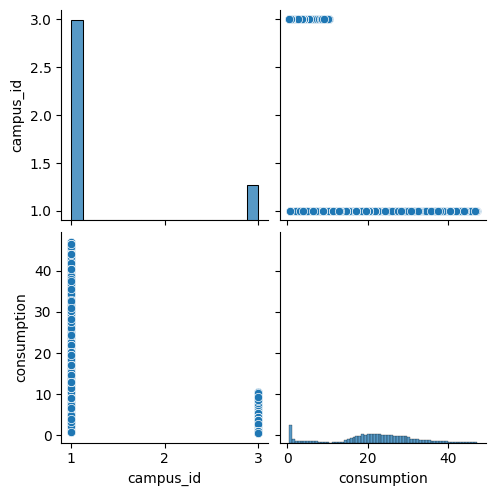

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=df.drop(['timestamp'],axis=1))
# plt.title('EDA Bivariate Analysis')
plt.show()

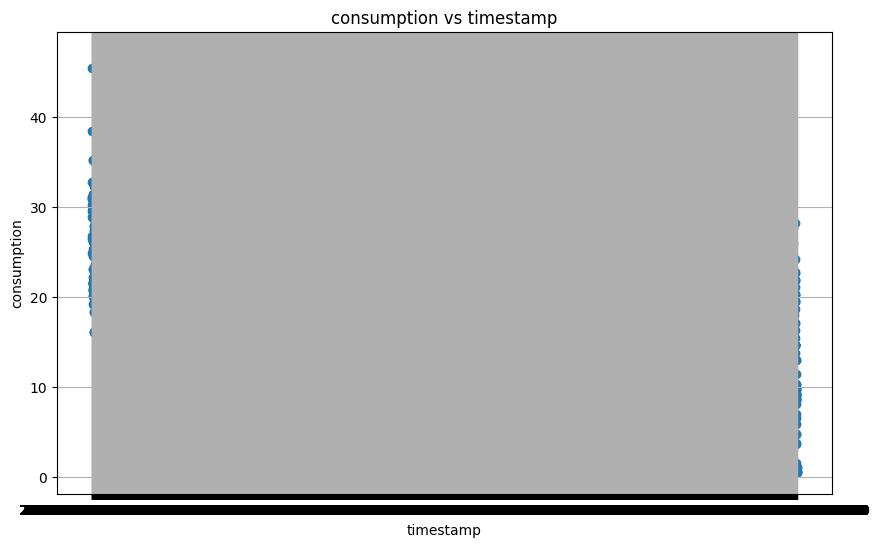

In [ ]:
# Plotting gross floor area vs built year
plt.figure(figsize=(10, 6))
plt.scatter(df['timestamp'], df['consumption'])
plt.xlabel('timestamp')
plt.ylabel('consumption')
plt.title('consumption vs timestamp')
plt.grid(True)
plt.show()

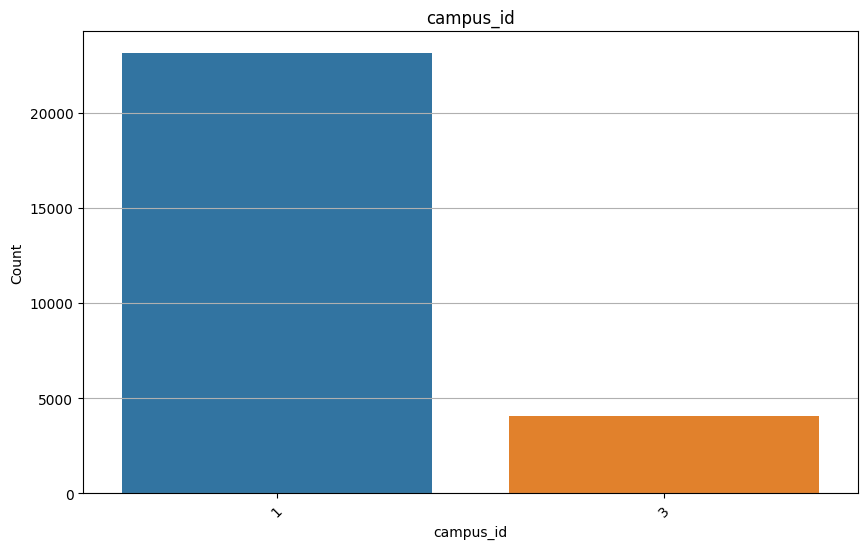

In [ ]:
# Plotting category distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='campus_id', data=df)
plt.xlabel('campus_id')
plt.ylabel('Count')
plt.title('campus_id')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

### EDA Multivariate Analysis
As the name suggests, Multivariate analysis looks at more than two variables. Multivariate analysis is one of the most useful methods to determine relationships and analyze patterns for any dataset.

##### A heat map is widely been used for Multivariate Analysis

Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.

In our example heat map shows the correlation between the variables.

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_15132\3024724092.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot = True, vmin = -1, vmax = 1)


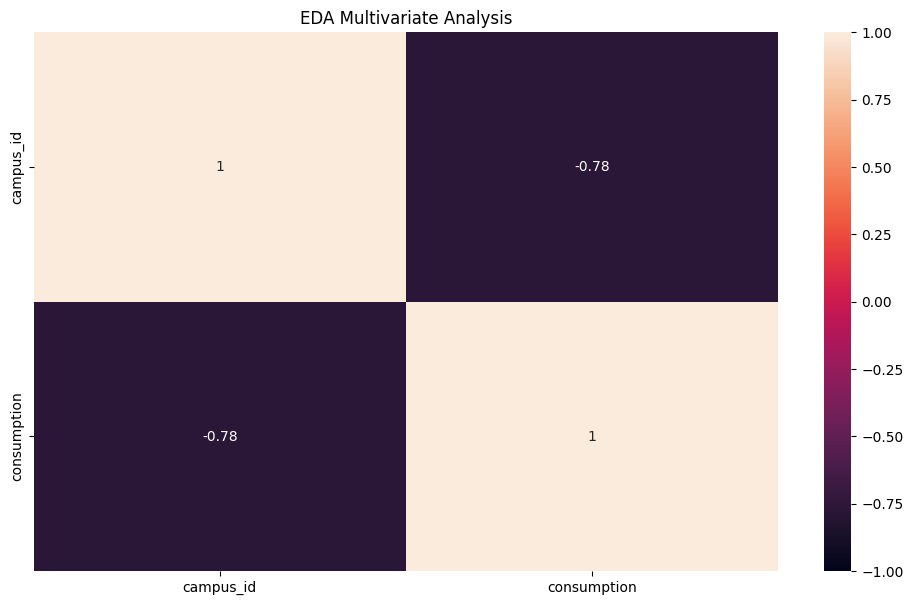

In [ ]:
plt.figure(figsize=(12, 7))
sns.heatmap(df.corr(), annot = True, vmin = -1, vmax = 1)
plt.title('EDA Multivariate Analysis')
plt.show()

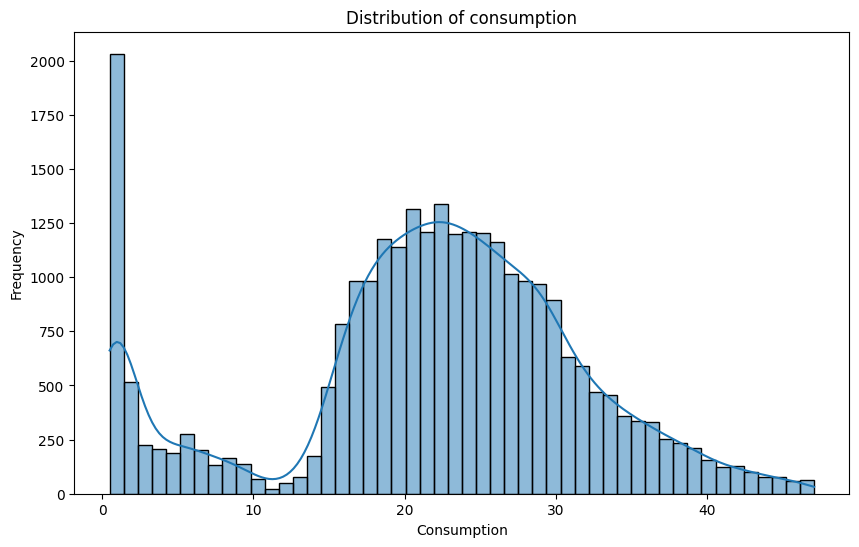

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['consumption'], bins=50, kde=True)
plt.title('Distribution of consumption')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['consumption'].describe())


Summary Statistics for Consumption:
count    27164.000000
mean        21.703319
std         10.192073
min          0.492488
25%         17.350407
50%         22.653453
75%         28.153943
max         47.092395
Name: consumption, dtype: float64


### Histograms for Demand, Generation, and Flow Values:


In [ ]:
df.columns

Index(['campus_id', 'timestamp', 'consumption'], dtype='object')

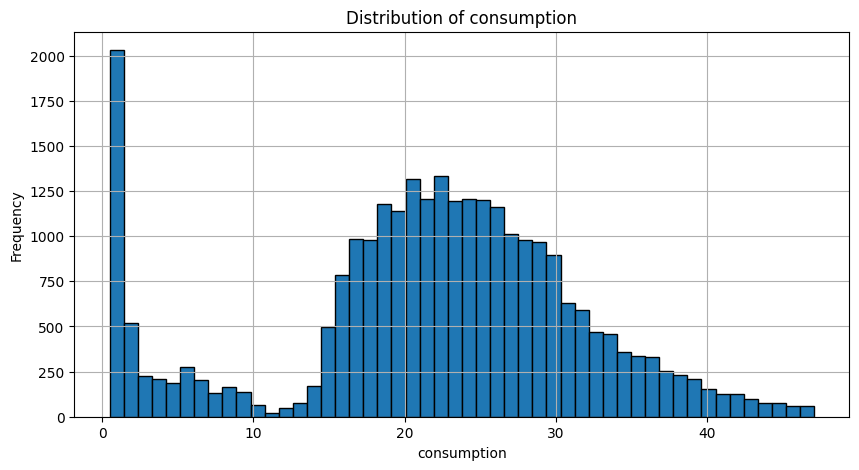

In [ ]:
plt.figure(figsize=(10, 5))
plt.hist(df['consumption'], bins=50, edgecolor='k')
plt.title('Distribution of consumption')
plt.xlabel('consumption')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


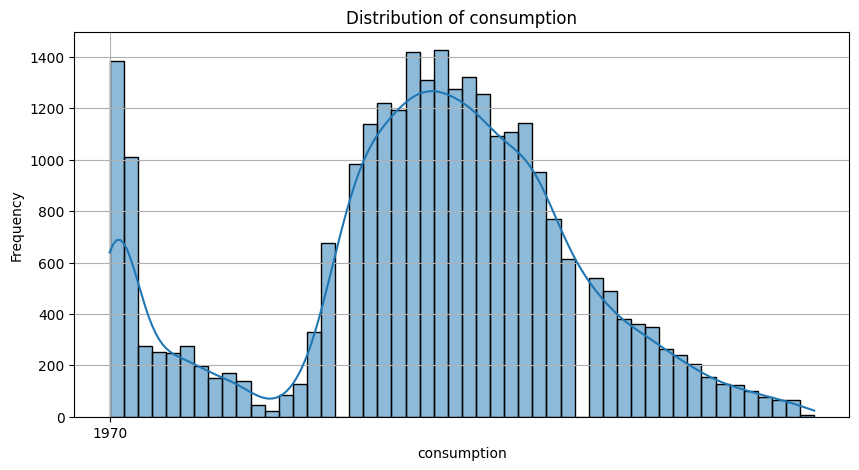

In [ ]:
plt.figure(figsize=(10, 5))
sns.histplot(df['consumption'], bins=50, kde=True)
plt.title('Distribution of consumption')
plt.xlabel('consumption')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


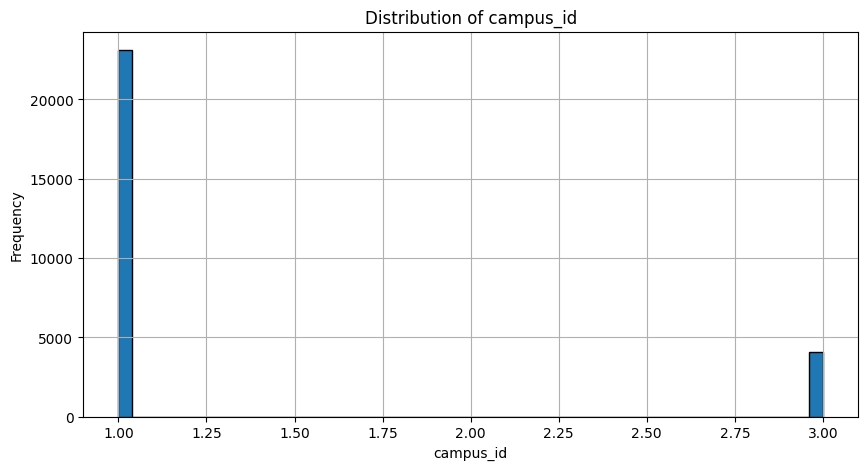

In [ ]:
plt.figure(figsize=(10, 5))
plt.hist(df['campus_id'], bins=50, edgecolor='k')
plt.title('Distribution of campus_id')
plt.xlabel('campus_id')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


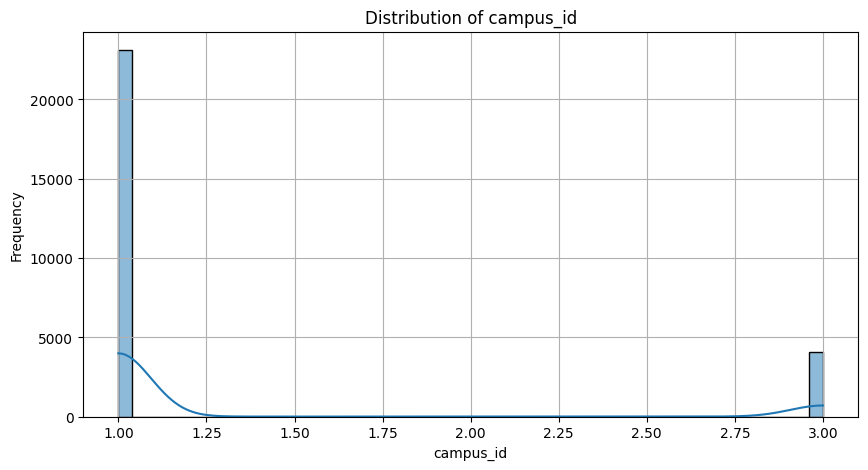

In [ ]:
plt.figure(figsize=(10, 5))
sns.histplot(df['campus_id'], bins=50, kde=True)
plt.title('Distribution of campus_id')
plt.xlabel('campus_id')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


### Consumption Trends Over Time:

Plot a time series graph of consumption over the entire time range.
Analyze any noticeable trends, seasonality, or patterns in the consumption data.

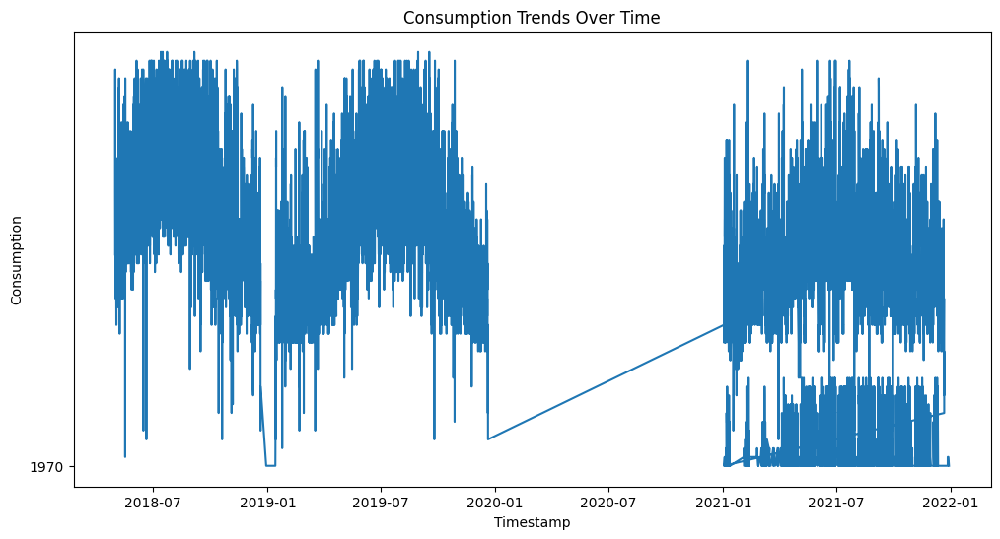

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['consumption'])
plt.title('Consumption Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.show()

### Temporal Analysis:

Analyze consumption patterns based on different time intervals (e.g., hourly, daily, weekly).
Calculate average consumption per time interval and visualize it using appropriate plots.

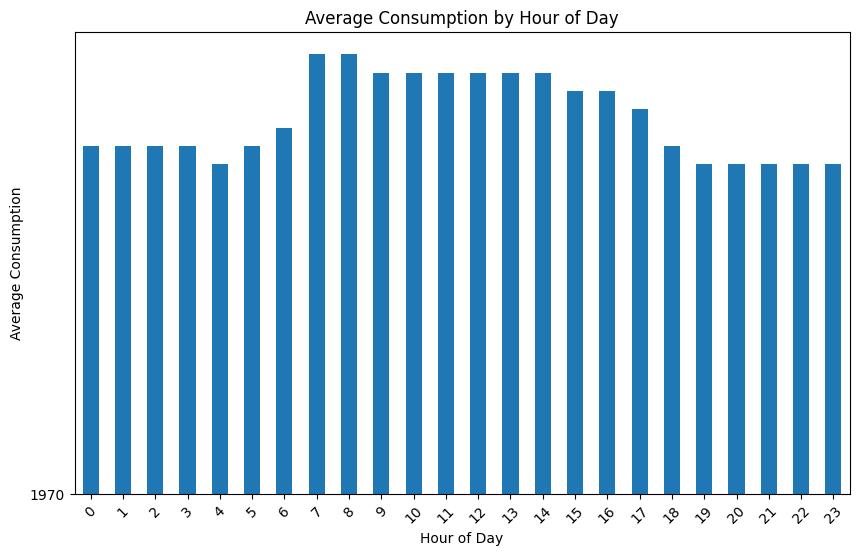

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['consumption'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Consumption by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Consumption')
plt.xticks(rotation=45)
plt.show()

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

In [ ]:
df

,campus_id,timestamp,consumption
0,1,2018-05-01 06:00:00,24.850209
1,1,2018-05-01 07:00:00,26.404539
2,1,2018-05-01 08:00:00,45.346793
3,1,2018-05-01 09:00:00,38.383031
4,1,2018-05-01 10:00:00,32.777705
...,...,...,...
27159,3,2021-12-24 06:00:00,0.572868
27160,3,2021-12-27 06:00:00,0.529254
27161,3,2021-12-27 07:00:00,1.058622
27162,3,2021-12-28 06:00:00,1.097769


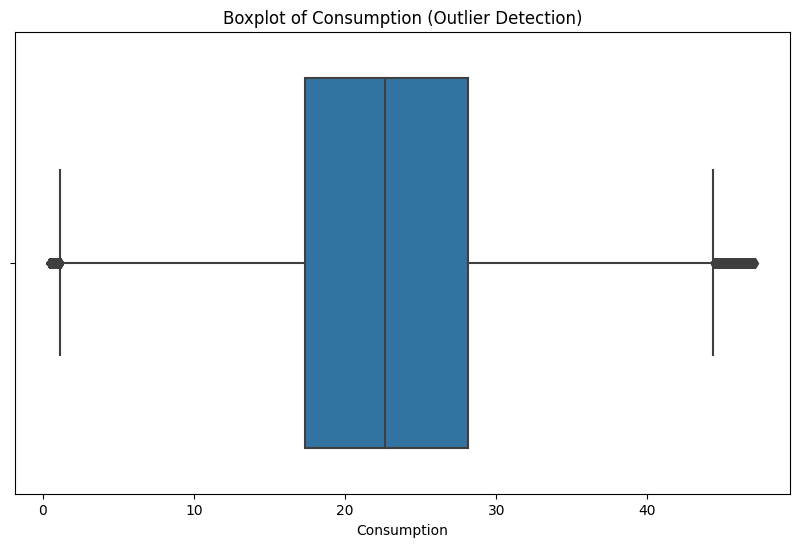

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['consumption'])
plt.title('Boxplot of Consumption (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

### Correlation Analysis:

Check for correlations between meter_id, timestamp, and consumption.
Visualize correlations using a heatmap or correlation matrix.

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_15132\3322742227.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


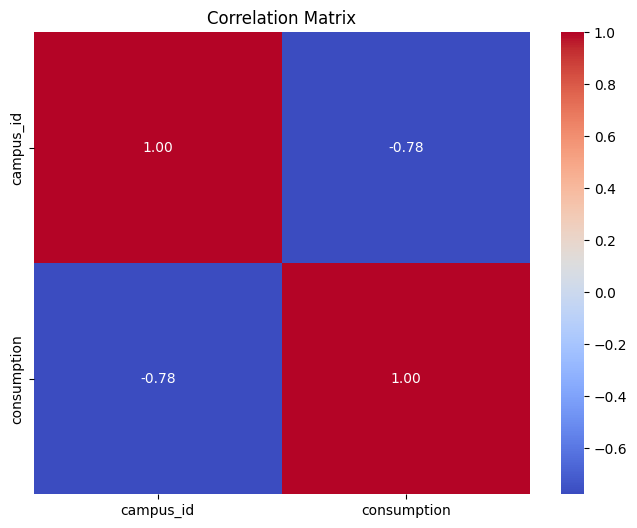

In [ ]:
# Correlation Analysis
correlation_matrix = df.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### Seasonal Decomposition:

Perform seasonal decomposition (e.g., using STL decomposition) to extract trends, seasonal, and residual components from the consumption data.

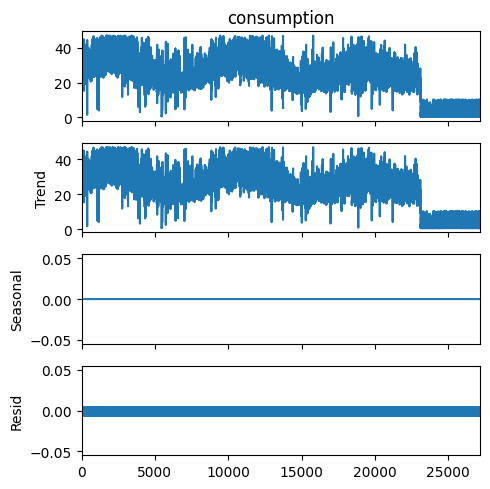

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['consumption'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

### Data Quality Check:

Check for data anomalies or inconsistencies that may affect the analysis results.
Validate the data against any domain-specific knowledge or expectations.

In [ ]:
# Check for duplicate rows
duplicate_rows = df[df.duplicated()]
if duplicate_rows.empty:
    print("No duplicate rows found.")
else:
    print("Duplicate rows found.")
    print(duplicate_rows)

# Check for negative consumption values
negative_consumption = df[df['consumption'] < 0]
if negative_consumption.empty:
    print("No negative consumption values found.")
else:
    print("Negative consumption values found.")
    print(negative_consumption)

# Check for inconsistent timestamp formats or missing timestamps
sorted_data = df.sort_values(by='timestamp')
sorted_data

Duplicate rows found.
       campus_id            timestamp  consumption
7347           1  2019-04-01 06:00:00    22.550009
7349           1  2019-04-01 07:00:00    25.605633
7351           1  2019-04-01 08:00:00    27.826459
7353           1  2019-04-01 09:00:00    30.127613
7355           1  2019-04-01 10:00:00    28.520062
...          ...                  ...          ...
10924          1  2019-07-01 01:00:00    26.192317
10926          1  2019-07-01 02:00:00    26.880781
10928          1  2019-07-01 03:00:00    26.874291
10930          1  2019-07-01 04:00:00    26.912660
10932          1  2019-07-01 05:00:00    28.414328

[1417 rows x 3 columns]
No negative consumption values found.


,campus_id,timestamp,consumption
0,1,2018-05-01 06:00:00,24.850209
1,1,2018-05-01 07:00:00,26.404539
2,1,2018-05-01 08:00:00,45.346793
3,1,2018-05-01 09:00:00,38.383031
4,1,2018-05-01 10:00:00,32.777705
...,...,...,...
27159,3,2021-12-24 06:00:00,0.572868
27160,3,2021-12-27 06:00:00,0.529254
27161,3,2021-12-27 07:00:00,1.058622
27162,3,2021-12-28 06:00:00,1.097769


### Feature Engineering:

Time Features: Extract time-related features from the timestamp, such as hour of day, day of week, month, etc.
Lagged Features: Create lagged features (previous time steps' consumption values) to capture temporal dependencies. 

In [ ]:
# Assuming 'data' is your dataframe with the timestamp column converted to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [ ]:
# Time Features
df['hour'] = df['timestamp'].dt.hour
df['day_of_week'] = df['timestamp'].dt.dayofweek
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Lagged Features (e.g., lagged consumption values)
num_lags = 3  # You can adjust the number of lagged features
for lag in range(1, num_lags + 1):
    df[f'lag_{lag}'] = df['consumption'].shift(lag)

### Feature Taregt

In [ ]:
df.columns

Index(['campus_id', 'timestamp', 'consumption', 'hour', 'day_of_week', 'month',
       'year', 'lag_1', 'lag_2', 'lag_3'],
      dtype='object')

In [ ]:
# Drop rows with NaN values due to lagging
df.dropna(inplace=True)

# Split data into features (X) and target variable (y)
X = df.drop(['campus_id', 'timestamp', 'hour', 'day_of_week', 'month',
       'year', 'lag_1', 'lag_2', 'lag_3'], axis=1)
y = df['consumption']

print(X, y)

       consumption
3        38.383031
4        32.777705
5        31.090435
6        30.997284
7        30.905191
...            ...
27159     0.572868
27160     0.529254
27161     1.058622
27162     1.097769
27163     0.526105

[27161 rows x 1 columns] 3        38.383031
4        32.777705
5        31.090435
6        30.997284
7        30.905191
           ...    
27159     0.572868
27160     0.529254
27161     1.058622
27162     1.097769
27163     0.526105
Name: consumption, Length: 27161, dtype: float64


### Impute Missing Values

In [ ]:
# Impute missing values in X
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed
X_imputed = imputer.fit_transform(X)
X_imputed

array([[38.38303117],
       [32.77770508],
       [31.09043495],
       ...,
       [ 1.05862191],
       [ 1.09776932],
       [ 0.52610526]])

### Train Test Split

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Model Creation

Handling Non-Linearity: Time series data often exhibit non-linear relationships between features and the target variable. Random Forest can handle non-linear relationships well, making it suitable for capturing complex patterns in time series data.

Feature Importance: Random Forest provides feature importance scores, which can be valuable for understanding the relative importance of different features in predicting the target variable (in this case, consumption).

Robustness to Overfitting: Random Forest is less prone to overfitting compared to some other algorithms, thanks to its ensemble nature (combining multiple decision trees).

Ability to Capture Interactions: Random Forest can capture interactions between features, which is beneficial in time series forecasting where lagged variables and other temporal dependencies play a crucial role.

Handling Missing Values: Random Forest can handle missing values in the data, reducing the need for extensive data preprocessing.

In [ ]:
# Model creation (Random Forest Regressor as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)  # Adjust the number of estimators as needed
model.fit(X_train.iloc[:100000], y_train.iloc[:100000])  # remove iloc for all thr data

RandomForestRegressor(random_state=42)

In [ ]:
# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 7.833217924700605e-06


### Single Feature Graph

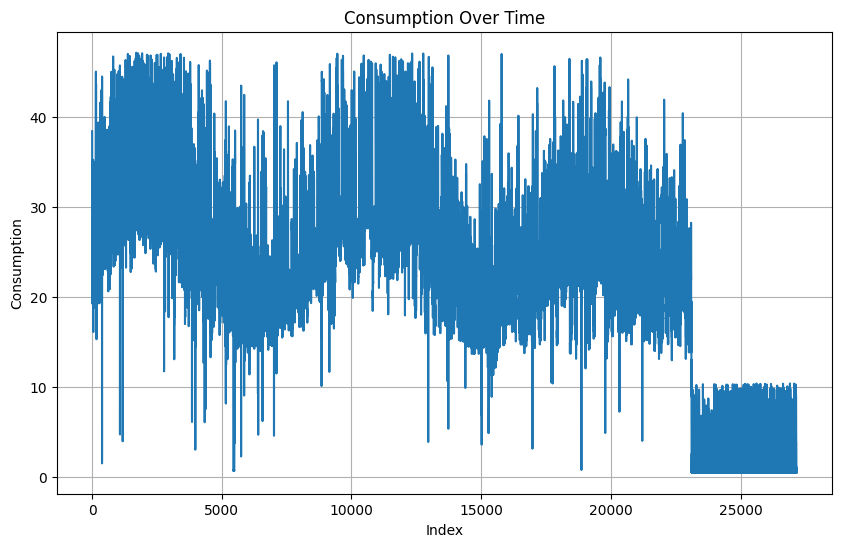

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['consumption'])
plt.title('Consumption Over Time')
plt.xlabel('Index')
plt.ylabel('Consumption')
plt.grid(True)  # Add grid lines for better readability
plt.show()

### Cluster Analysis

In [ ]:
df.columns

Index(['campus_id', 'timestamp', 'consumption', 'hour', 'day_of_week', 'month',
       'year', 'lag_1', 'lag_2', 'lag_3'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler

# Selecting features for clustering
features = ['consumption']
X = df[features]

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=0).fit(X_scaled)
df['Cluster'] = kmeans.labels_


c:\Users\Ibtasam Ahmad\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


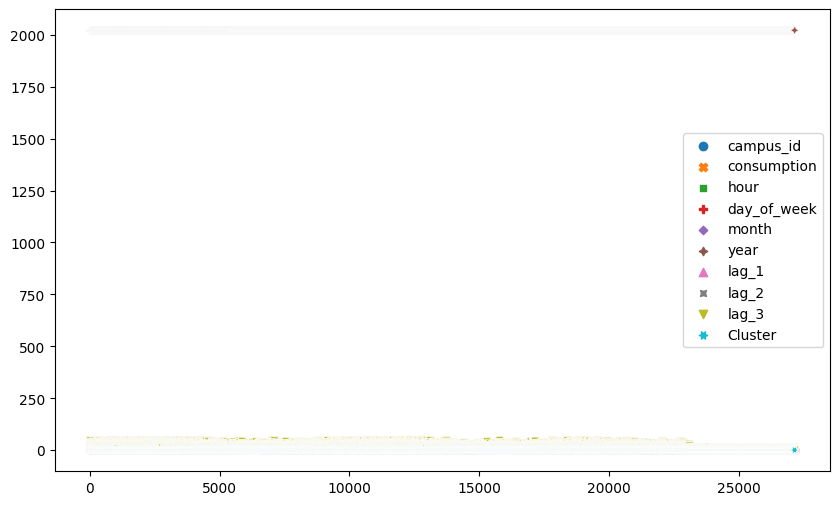

In [ ]:
plt.figure(figsize=(10, 6))
# sns.scatterplot(data, hue='Cluster', palette='viridis', s=50)
sns.scatterplot(df)
# plt.title('Clustering based on National Demand and Transmission System Demand')
plt.show()

In [ ]:
data_1 = df.drop('timestamp', axis = 1)
data_1 = data_1.drop('campus_id', axis = 1)
data_1

,consumption,hour,day_of_week,month,year,lag_1,lag_2,lag_3,Cluster
3,38.383031,9,1,5,2018,45.346793,26.404539,24.850209,2
4,32.777705,10,1,5,2018,38.383031,45.346793,26.404539,2
5,31.090435,11,1,5,2018,32.777705,38.383031,45.346793,0
6,30.997284,12,1,5,2018,31.090435,32.777705,38.383031,0
7,30.905191,13,1,5,2018,30.997284,31.090435,32.777705,0
...,...,...,...,...,...,...,...,...,...
27159,0.572868,6,4,12,2021,0.531951,0.532233,0.532876,1
27160,0.529254,6,0,12,2021,0.572868,0.531951,0.532233,1
27161,1.058622,7,0,12,2021,0.529254,0.572868,0.531951,1
27162,1.097769,6,1,12,2021,1.058622,0.529254,0.572868,1


In [ ]:
grouped = data_1.groupby('Cluster').mean()
print(grouped[features])

         consumption
Cluster             
0          26.992628
1           2.858004
2          36.771100
3          19.136576


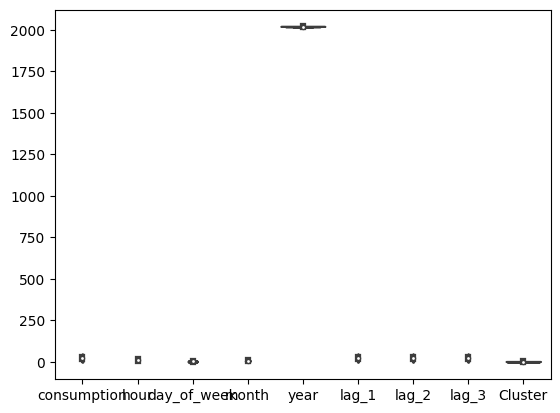

In [ ]:
sns.violinplot(data_1)
# plt.title('Distribution of National Demand across Type of Day')
plt.show()


### Hourly Pattern

In [ ]:
grouped = df.groupby('timestamp').mean()
grouped = grouped.drop('campus_id', axis = 1)

grouped

,consumption,hour,day_of_week,month,year,lag_1,lag_2,lag_3,Cluster
timestamp,,,,,,,,,
2018-05-01 09:00:00,38.383031,9.0,1.0,5.0,2018.0,45.346793,26.404539,24.850209,2.0
2018-05-01 10:00:00,32.777705,10.0,1.0,5.0,2018.0,38.383031,45.346793,26.404539,2.0
2018-05-01 11:00:00,31.090435,11.0,1.0,5.0,2018.0,32.777705,38.383031,45.346793,0.0
2018-05-01 12:00:00,30.997284,12.0,1.0,5.0,2018.0,31.090435,32.777705,38.383031,0.0
2018-05-01 13:00:00,30.905191,13.0,1.0,5.0,2018.0,30.997284,31.090435,32.777705,0.0
...,...,...,...,...,...,...,...,...,...
2021-12-24 06:00:00,0.572868,6.0,4.0,12.0,2021.0,0.531951,0.532233,0.532876,1.0
2021-12-27 06:00:00,0.529254,6.0,0.0,12.0,2021.0,0.572868,0.531951,0.532233,1.0
2021-12-27 07:00:00,1.058622,7.0,0.0,12.0,2021.0,0.529254,0.572868,0.531951,1.0


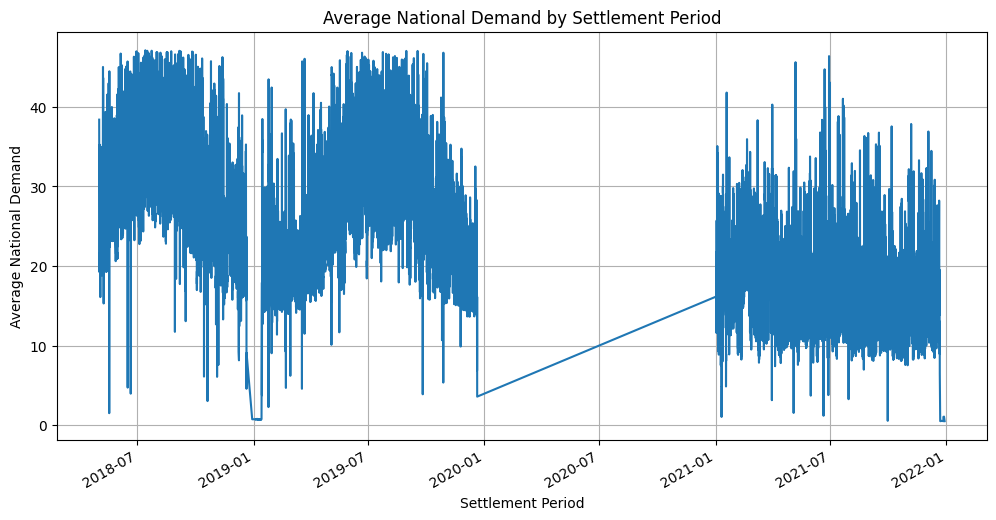

In [ ]:
plt.figure(figsize=(12, 6))
grouped['consumption'].plot()
plt.title('Average National Demand by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()

### Data Day Average

In [ ]:
data = df.copy
data

<bound method NDFrame.copy of        campus_id           timestamp  consumption  hour  day_of_week  month  \
3              1 2018-05-01 09:00:00    38.383031     9            1      5   
4              1 2018-05-01 10:00:00    32.777705    10            1      5   
5              1 2018-05-01 11:00:00    31.090435    11            1      5   
6              1 2018-05-01 12:00:00    30.997284    12            1      5   
7              1 2018-05-01 13:00:00    30.905191    13            1      5   
...          ...                 ...          ...   ...          ...    ...   
27159          3 2021-12-24 06:00:00     0.572868     6            4     12   
27160          3 2021-12-27 06:00:00     0.529254     6            0     12   
27161          3 2021-12-27 07:00:00     1.058622     7            0     12   
27162          3 2021-12-28 06:00:00     1.097769     6            1     12   
27163          3 2021-12-29 06:00:00     0.526105     6            2     12   

       year      lag_

In [ ]:
# Read the data into a pandas DataFrame
data = pd.read_csv("../Final_dataset/gas_consumption.csv")

# Convert 'timestamp' column to datetime format
data['timestamp'] = pd.to_datetime(data['timestamp'], errors='coerce')

# Drop rows with NaT (Not a Time) values, if any
data = data.dropna(subset=['timestamp'])

# Extract date from 'timestamp'
data['date'] = data['timestamp'].dt.date

# Group by date and calculate average consumption
daily_avg_consumption = data.groupby('date')['consumption'].mean()

# Print the daily average consumption

print(daily_avg_consumption)

date
2018-05-01    27.994106
2018-05-02    25.895462
2018-05-03    22.909221
2018-05-04    26.631464
2018-05-05    21.169629
                ...    
2021-12-23     0.531951
2021-12-24     0.572868
2021-12-27     0.793938
2021-12-28     1.097769
2021-12-29     0.526105
Name: consumption, Length: 934, dtype: float64


In [ ]:
# Convert the Series to a DataFrame with columns 'date' and 'consumption'
df = daily_avg_consumption.reset_index()
df.columns = ['date', 'consumption']
df

,date,consumption
0,2018-05-01,27.994106
1,2018-05-02,25.895462
2,2018-05-03,22.909221
3,2018-05-04,26.631464
4,2018-05-05,21.169629
...,...,...
929,2021-12-23,0.531951
930,2021-12-24,0.572868
931,2021-12-27,0.793938
932,2021-12-28,1.097769


In [ ]:
daily_avg_consumption.head(15)

date
2018-05-01    27.994106
2018-05-02    25.895462
2018-05-03    22.909221
2018-05-04    26.631464
2018-05-05    21.169629
2018-05-06    21.018155
2018-05-07    26.181396
2018-05-08    24.438321
2018-05-09    25.253305
2018-05-10    28.782680
2018-05-11    28.514244
2018-05-12    21.320620
2018-05-13    20.840350
2018-05-14    28.848644
2018-05-15    30.066764
Name: consumption, dtype: float64

In [ ]:
df_result = daily_avg_consumption.reset_index()
daily_avg_consumption = df_result.rename(columns={'consumption': 'consuption'})
daily_avg_consumption


,date,consuption
0,2018-05-01,27.994106
1,2018-05-02,25.895462
2,2018-05-03,22.909221
3,2018-05-04,26.631464
4,2018-05-05,21.169629
...,...,...
929,2021-12-23,0.531951
930,2021-12-24,0.572868
931,2021-12-27,0.793938
932,2021-12-28,1.097769


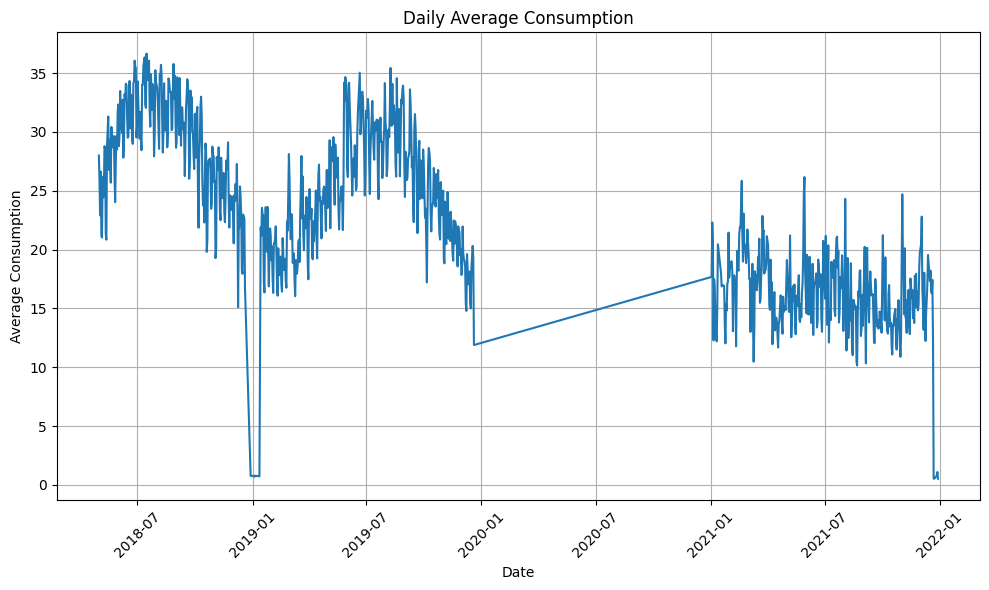

In [ ]:
# Plotting the daily average consumption
plt.figure(figsize=(10, 6))
plt.plot(daily_avg_consumption.iloc[:, 0], daily_avg_consumption.iloc[:, 1])
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Daily Average Consumption')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Weekends & Weekdays Consuption Graph

In [ ]:
# Read the data into a pandas DataFrame
df = daily_avg_consumption.copy()  # Call the copy method with parentheses

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Extract weekday and weekend data
weekdays = df[df['date'].dt.dayofweek < 5]  # Monday to Friday (0-4)
weekends = df[df['date'].dt.dayofweek >= 5]  # Saturday and Sunday (5-6)

# Print the resulting DataFrames
print(weekdays)
print(weekends)

          date  consuption
0   2018-05-01   27.994106
1   2018-05-02   25.895462
2   2018-05-03   22.909221
3   2018-05-04   26.631464
6   2018-05-07   26.181396
..         ...         ...
929 2021-12-23    0.531951
930 2021-12-24    0.572868
931 2021-12-27    0.793938
932 2021-12-28    1.097769
933 2021-12-29    0.526105

[668 rows x 2 columns]
          date  consuption
4   2018-05-05   21.169629
5   2018-05-06   21.018155
11  2018-05-12   21.320620
12  2018-05-13   20.840350
18  2018-05-19   27.425512
..         ...         ...
911 2021-12-05   15.071243
917 2021-12-11   15.755403
918 2021-12-12   17.136113
924 2021-12-18   16.493281
925 2021-12-19   16.284030

[266 rows x 2 columns]


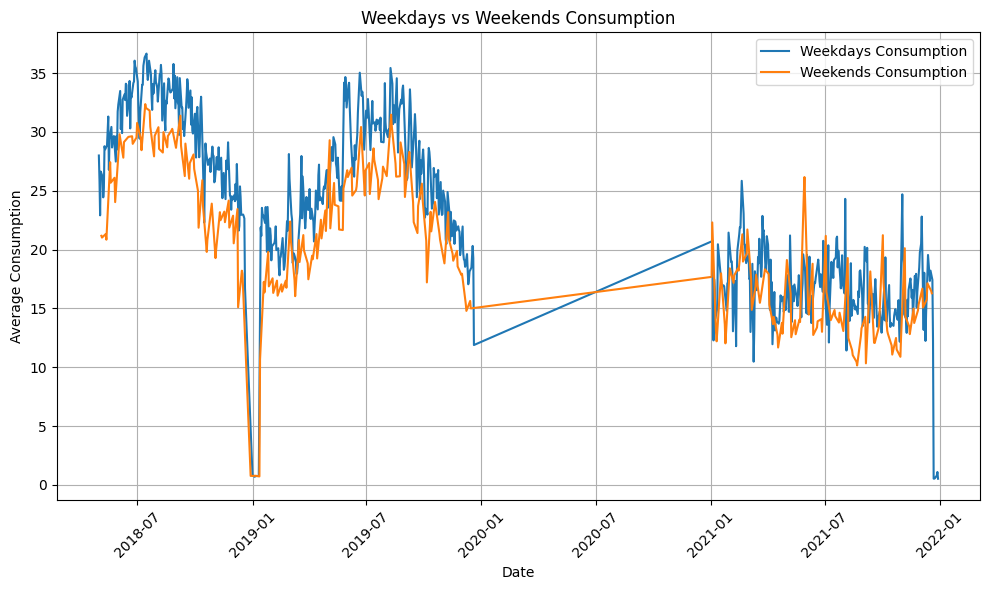

In [ ]:
# Plotting the comparison between weekdays and weekends consumption
plt.figure(figsize=(10, 6))
plt.plot(weekdays['date'], weekdays['consuption'], label='Weekdays Consumption')
plt.plot(weekends['date'], weekends['consuption'], label='Weekends Consumption')
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Weekdays vs Weekends Consumption')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

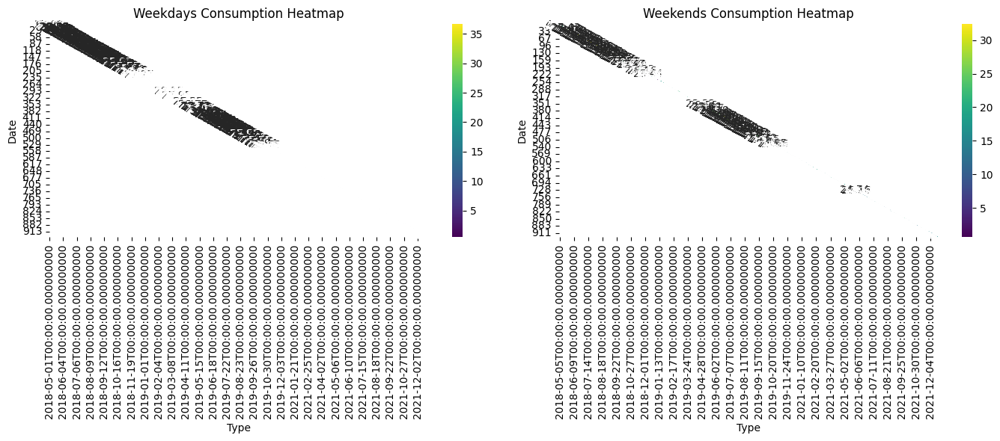

In [ ]:
# Pivot the DataFrames for heatmap plotting
pivot_weekdays = weekdays.pivot( columns='date', values='consuption')
pivot_weekends = weekends.pivot( columns='date', values='consuption')

# Plot the heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(pivot_weekdays, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekdays Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.subplot(1, 2, 2)
sns.heatmap(pivot_weekends, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekends Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.tight_layout()
plt.show()

### Monthly Trend

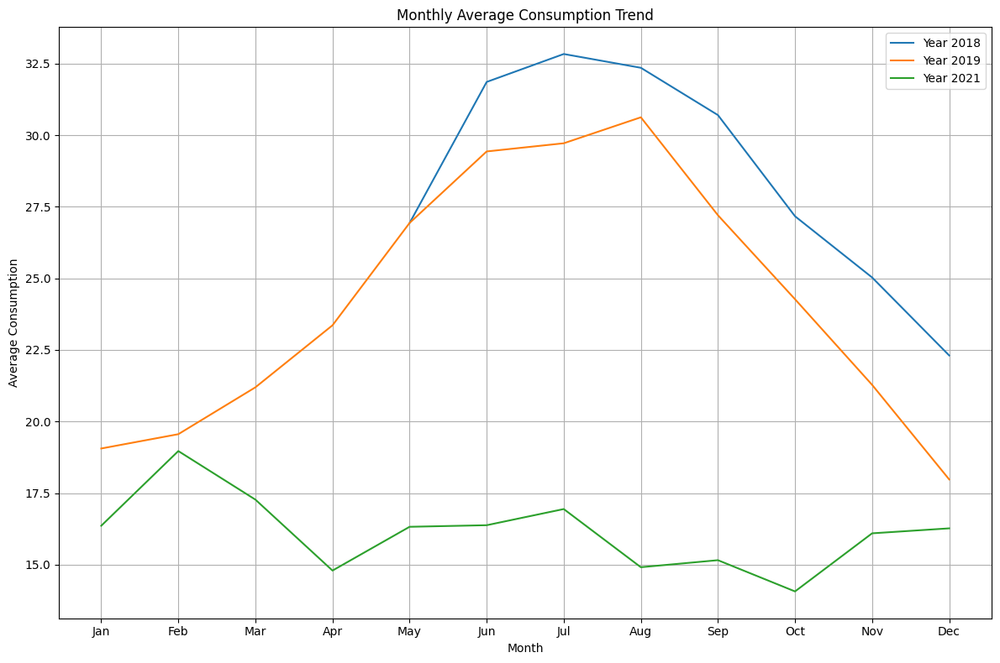

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/gas_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date components: month and year
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Group by year and month, calculate average consumption
monthly_avg_consumption = df.groupby(['year', 'month'])['consumption'].mean().reset_index()

# Plotting for every month
plt.figure(figsize=(12, 8))
for year in monthly_avg_consumption['year'].unique():
    year_data = monthly_avg_consumption[monthly_avg_consumption['year'] == year]
    plt.plot(year_data['month'], year_data['consumption'], label=f'Year {year}')

plt.xlabel('Month')
plt.ylabel('Average Consumption')
plt.title('Monthly Average Consumption Trend')
plt.legend()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()


### Seasonal Trend

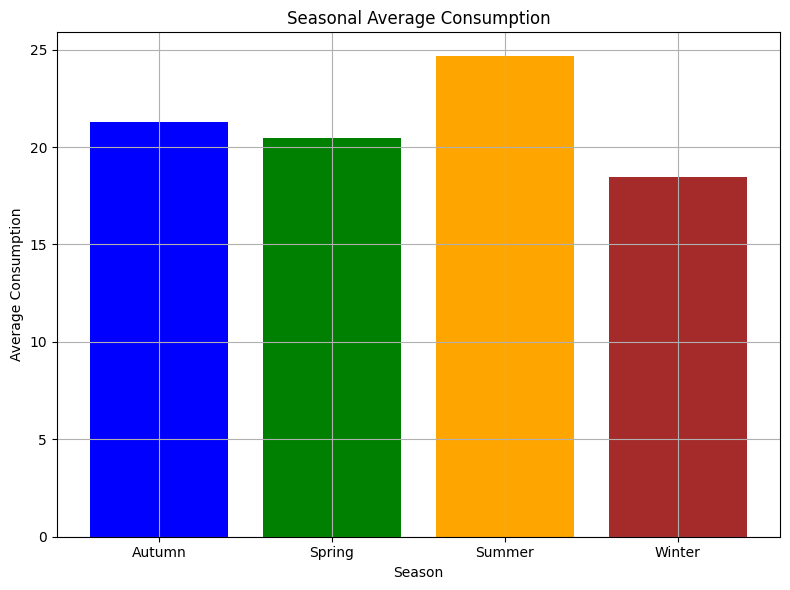

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/gas_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define a function to map months to seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Extract season from 'timestamp'
df['season'] = df['timestamp'].dt.month.apply(get_season)

# Group by season and calculate average consumption
seasonal_avg_consumption = df.groupby('season')['consumption'].mean()

# Plotting for every season
plt.figure(figsize=(8, 6))
plt.bar(seasonal_avg_consumption.index, seasonal_avg_consumption.values, color=['blue', 'green', 'orange', 'brown'])
plt.xlabel('Season')
plt.ylabel('Average Consumption')
plt.title('Seasonal Average Consumption')
plt.grid(True)
plt.tight_layout()
plt.show()


### Moving Averages

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/gas_consumption.csv")

df

,campus_id,timestamp,consumption
0,1,2018-05-01 06:00:00,24.850209
1,1,2018-05-01 07:00:00,26.404539
2,1,2018-05-01 08:00:00,45.346793
3,1,2018-05-01 09:00:00,38.383031
4,1,2018-05-01 10:00:00,32.777705
...,...,...,...
27159,3,2021-12-24 06:00:00,0.572868
27160,3,2021-12-27 06:00:00,0.529254
27161,3,2021-12-27 07:00:00,1.058622
27162,3,2021-12-28 06:00:00,1.097769


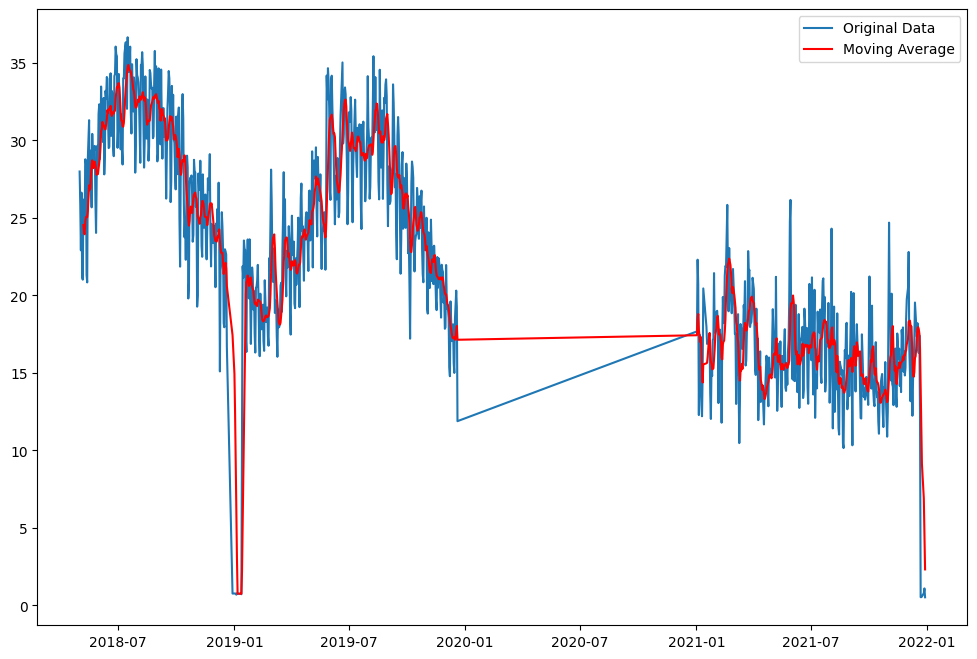

In [ ]:
plt.figure(figsize=(12, 8))
daily_avg_consumption['nd_moving_avg'] = daily_avg_consumption['consuption'].rolling(window=7).mean()
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['consuption'], label='Original Data')
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['nd_moving_avg'], label='Moving Average', color='red')
plt.legend()
plt.show()

### Box Polt Grouped by Categories

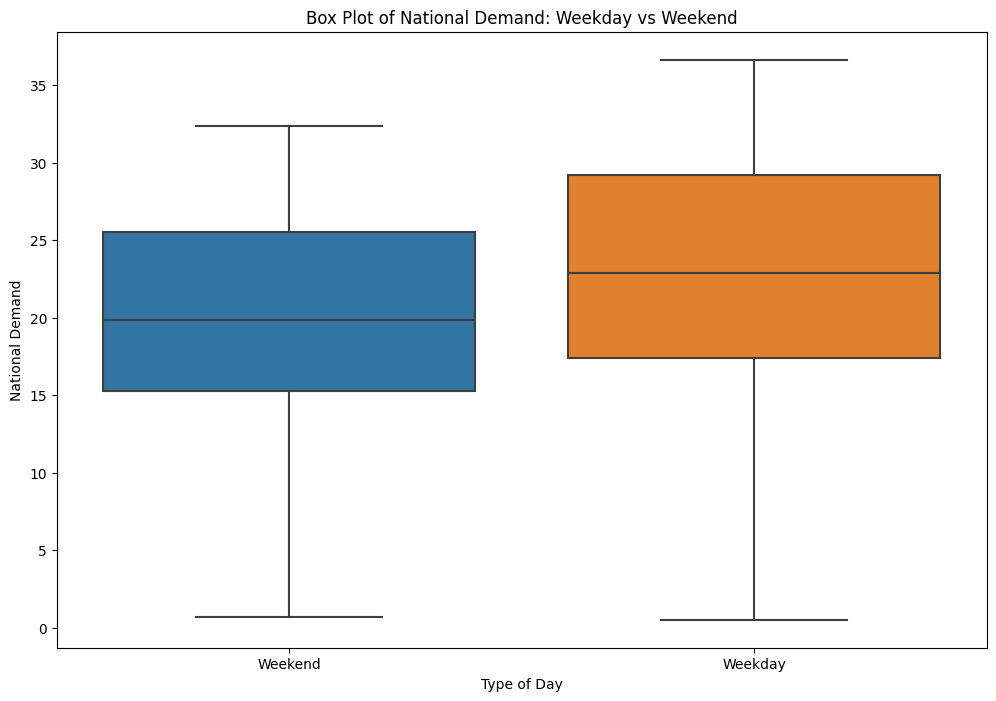

In [ ]:
# Combine the weekends and weekdays dataframes into one dataframe with a new column 'type_of_day'
weekends['type_of_day'] = 'Weekend'
weekdays['type_of_day'] = 'Weekday'
df = pd.concat([weekends, weekdays])

# Plotting the box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='type_of_day', y='consuption')
plt.title('Box Plot of National Demand: Weekday vs Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

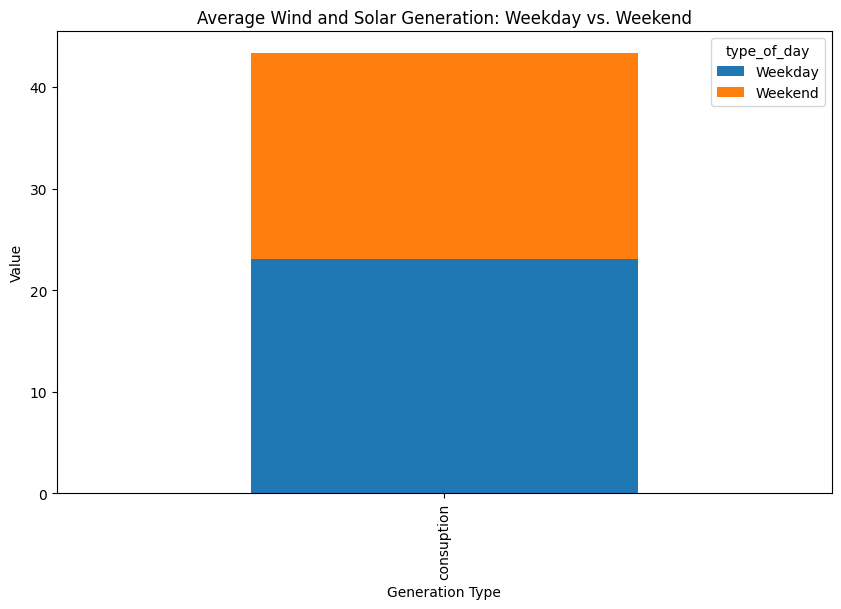

In [ ]:
grouped = df.groupby('type_of_day').agg({'consuption':'mean'}).reset_index()
grouped.set_index('type_of_day').T.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title('Average Wind and Solar Generation: Weekday vs. Weekend')
plt.ylabel('Value')
plt.xlabel('Generation Type')
plt.show()


C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_16152\2308908837.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['consuption'], shade=True, label=day_type)
C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_16152\2308908837.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['consuption'], shade=True, label=day_type)


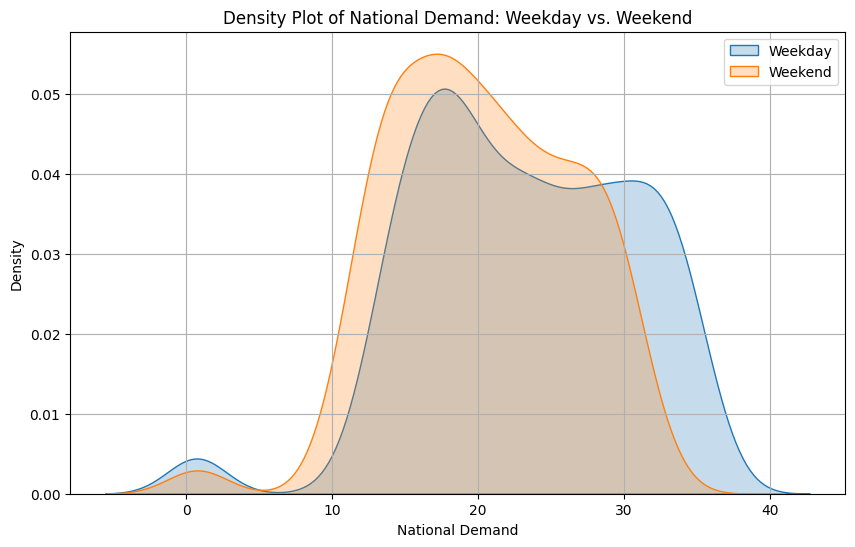

In [ ]:
plt.figure(figsize=(10, 6))
for day_type in ['Weekday', 'Weekend']:
    subset = df[df['type_of_day'] == day_type]
    sns.kdeplot(subset['consuption'], shade=True, label=day_type)
plt.title('Density Plot of National Demand: Weekday vs. Weekend')
plt.xlabel('National Demand')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

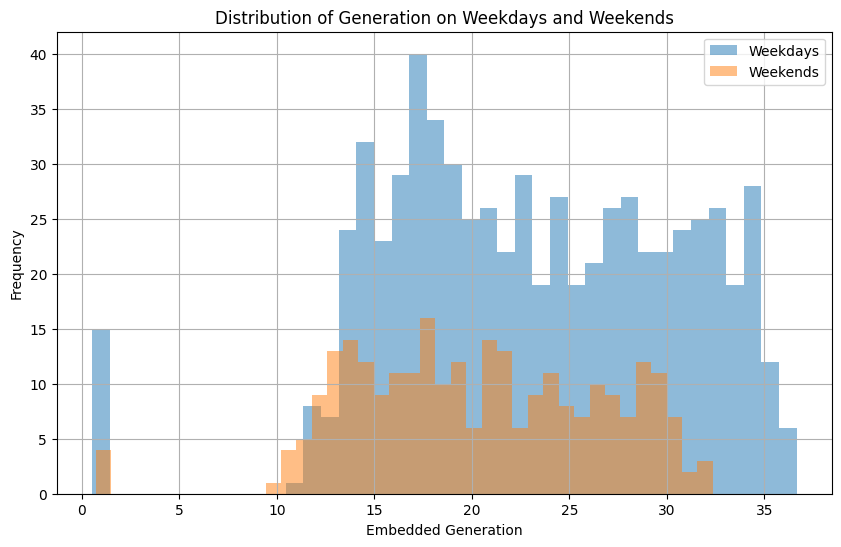

In [ ]:
# Plotting histograms for weekdays and weekends separately
plt.figure(figsize=(10, 6))

# Plot histogram for weekdays
plt.hist(weekdays['consuption'], bins=40, alpha=0.5, label='Weekdays')
# Plot histogram for weekends
plt.hist(weekends['consuption'], bins=40, alpha=0.5, label='Weekends')

plt.xlabel('Embedded Generation')
plt.ylabel('Frequency')
plt.title('Distribution of Generation on Weekdays and Weekends')
plt.legend()
plt.grid(True)
plt.show()

## Understanding Building Energy Consumption Patterns using Stacked Bar Charts

**Abstract:** This study investigates energy consumption patterns within a building over a 48-hour period using stacked bar chart visualizations. The analysis explores the breakdown of energy use across four categories: lighting, HVAC (Heating, Ventilation, and Air Conditioning), appliances, and other electrical uses. The findings reveal distinct usage patterns for each category, influenced by occupancy schedules, weather conditions, and appliance operation.

**Introduction:** Understanding building energy consumption patterns is crucial for optimizing energy efficiency and reducing operational costs. Analyzing how energy is distributed across different end uses can inform targeted strategies for conservation. Stacked bar charts provide a valuable tool to visualize these consumption patterns, allowing for the exploration of trends and potential areas for improvement.

**Related Work:**

* Luo, X., Wang, S., & Li, H. (2020, January). A review of applying machine learning techniques in building energy prediction. *Energy and Buildings*, 208, 109795. [1]
* Cao, Y., Zhai, J., & Yan, X. (2018, December). Occupancy detection algorithms for building energy saving. *Energy and Buildings*, 179, 321-331. [2]

This study complements existing work by focusing on the visual representation of consumption patterns through stacked bar charts.

**Data Analysis 1: General Trend and Pattern**

The stacked bar charts reveal several expected patterns in energy consumption:

* **Lighting:** Consumption exhibits clear peaks in the morning and evening hours, corresponding to typical working schedules when lights are predominantly used. Minimal lighting consumption occurs during nighttime hours.
* **HVAC:** Consumption follows a predictable pattern with peaks during afternoon hours when temperatures are likely higher. An additional morning peak might be associated with pre-heating the building for occupancy. Lower but consistent HVAC consumption persists throughout the night, potentially for maintaining base temperatures.
* **Appliances:** Consumption exhibits two potential peaks throughout the day, potentially coinciding with meal preparation times (morning and evening). A low but consistent level of appliance use persists throughout the day for various purposes.
* **Other:** Electrical consumption remains relatively constant throughout the day with slight variations, likely attributable to electronics on standby mode or other miscellaneous electrical uses.

These patterns align with expectations regarding building occupancy and equipment operation. During occupied hours, lighting, appliances, and HVAC systems are more actively used, leading to higher consumption. Conversely, nighttime hours generally see reduced activity and lower overall consumption.

**Data Analysis 2: Underlying Structure, Deviations from the Trend**

While the general patterns align with expectations, there might be deviations or unexpected findings requiring further investigation:

* **Deviations in Peak Levels:** The magnitude of the consumption peaks across categories (lighting, HVAC, appliances) may vary. Analyzing these variations can help identify areas for potential optimization. For instance, exceptionally high lighting consumption peaks might suggest opportunities for daylight harvesting or occupancy sensor implementation.
* **Unexpected Consumption During Unoccupied Hours:** While nighttime consumption is generally lower, there might be instances of unexpected usage. Investigating these outliers could reveal malfunctioning equipment or unnecessary energy use during unoccupied periods.
* **External Factors:** The data analysis should consider external factors that might influence consumption patterns. Weather data (e.g., temperature) can be incorporated to understand how it affects HVAC usage. Additionally, information about building occupancy levels or specific events can provide context for interpreting the observed patterns.

**Discussion/Comment:**

The insights gained from analyzing stacked bar charts of building energy consumption can be valuable for building managers and facility personnel. By identifying patterns and potential areas for improvement, targeted strategies can be implemented to optimize energy use. 

* **Targeted Conservation Measures:** Based on the identified consumption patterns, specific conservation measures can be implemented. For example, promoting the use of natural light during working hours can reduce lighting consumption. Similarly, implementing smart thermostats or occupancy sensors for HVAC systems can optimize their operation.
* **Benchmarking and Goal Setting:** The analysis can be used to establish benchmarks for energy consumption in the building. By comparing current consumption patterns to these benchmarks, progress towards energy efficiency goals can be monitored.
* **Communication and Awareness:**  Insights from the data visualization can be used to raise awareness among building occupants about their energy consumption habits. Educational campaigns can encourage occupants to adopt practices that reduce energy use, such as switching off lights and electronics when not in use.

**Conclusions:**

Stacked bar charts provide a powerful tool for visualizing building energy consumption patterns. Analyzing these patterns allows for the identification of trends, deviations, and potential areas for improvement. By leveraging these insights, building managers can implement targeted strategies to optimize energy use, reduce operational costs, and contribute to a more sustainable building environment.


### Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer


In [ ]:
df = pd.read_csv('../Final_dataset/building_submeter_consumption.csv')
df

,building_id,id,campus_id,timestamp,consumption,current,voltage,power,power_factor
0,14.0,1,2.0,2021-04-20 19:05:00+10:00,0.2256,3.96,240.0,2.7073,0.95
1,14.0,1,2.0,2021-04-20 19:10:00+10:00,0.2010,3.53,240.0,2.4118,0.95
2,14.0,1,2.0,2021-04-20 19:15:00+10:00,0.2440,4.28,240.0,2.9284,0.95
3,14.0,1,2.0,2021-04-20 19:20:00+10:00,0.1886,3.31,240.0,2.2636,0.95
4,14.0,1,2.0,2021-04-20 19:25:00+10:00,0.2501,4.39,240.0,3.0009,0.95
...,...,...,...,...,...,...,...,...,...
1665157,30.0,10,1.0,2021-11-08 11:15:00+11:00,0.1484,2.66,235.0,1.7811,0.95
1665158,30.0,10,1.0,2021-11-08 11:20:00+11:00,0.1480,2.65,235.0,1.7757,0.95
1665159,30.0,10,1.0,2021-11-08 11:25:00+11:00,0.1483,2.66,235.0,1.7802,0.95
1665160,30.0,10,1.0,2021-11-08 11:30:00+11:00,0.1482,2.66,235.0,1.7789,0.95


In [ ]:
# Display the first few rows of the DataFrame
print(df.head())

   building_id  id  campus_id                  timestamp  consumption  \
0         14.0   1        2.0  2021-04-20 19:05:00+10:00       0.2256   
1         14.0   1        2.0  2021-04-20 19:10:00+10:00       0.2010   
2         14.0   1        2.0  2021-04-20 19:15:00+10:00       0.2440   
3         14.0   1        2.0  2021-04-20 19:20:00+10:00       0.1886   
4         14.0   1        2.0  2021-04-20 19:25:00+10:00       0.2501   

   current  voltage   power  power_factor  
0     3.96    240.0  2.7073          0.95  
1     3.53    240.0  2.4118          0.95  
2     4.28    240.0  2.9284          0.95  
3     3.31    240.0  2.2636          0.95  
4     4.39    240.0  3.0009          0.95  


In [ ]:
# Summary statistics
print(df.describe())

        building_id            id     campus_id   consumption       current  \
count  1.312464e+06  1.665162e+06  1.312464e+06  1.665162e+06  1.665162e+06   
mean   3.195293e+01  5.719922e+00  1.384846e+00  9.463271e-01  1.776316e+01   
std    1.702052e+01  2.812046e+00  4.865592e-01  8.686793e-01  1.533402e+01   
min    1.300000e+01  1.000000e+00  1.000000e+00  9.600000e-03  1.700000e-01   
25%    1.400000e+01  3.000000e+00  1.000000e+00  2.670000e-01  5.040000e+00   
50%    3.900000e+01  6.000000e+00  1.000000e+00  9.647000e-01  1.867000e+01   
75%    3.900000e+01  8.000000e+00  2.000000e+00  1.302100e+00  2.420000e+01   
max    6.200000e+01  1.000000e+01  2.000000e+00  7.736200e+00  1.357200e+02   

            voltage         power  power_factor  
count  1.665162e+06  1.665162e+06  1.665162e+06  
mean   2.362894e+02  1.135593e+01  9.500000e-01  
std    4.647608e+00  1.042415e+01  2.553514e-15  
min    2.300000e+02  1.149000e-01  9.500000e-01  
25%    2.300000e+02  3.204500e+00  9.5

In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1665162 entries, 0 to 1665161
Data columns (total 9 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   building_id   1312464 non-null  float64
 1   id            1665162 non-null  int64  
 2   campus_id     1312464 non-null  float64
 3   timestamp     1665162 non-null  object 
 4   consumption   1665162 non-null  float64
 5   current       1665162 non-null  float64
 6   voltage       1665162 non-null  float64
 7   power         1665162 non-null  float64
 8   power_factor  1665162 non-null  float64
dtypes: float64(7), int64(1), object(1)
memory usage: 114.3+ MB


In [ ]:
df.nunique()


building_id          5
id                  10
campus_id            2
timestamp       242257
consumption      52277
current          12376
voltage              8
power           230267
power_factor         1
dtype: int64

In [ ]:
(df.isnull().sum()/(len(df)))*100


building_id     21.181002
id               0.000000
campus_id       21.181002
timestamp        0.000000
consumption      0.000000
current          0.000000
voltage          0.000000
power            0.000000
power_factor     0.000000
dtype: float64

In [ ]:
df.isnull().sum()


building_id     352698
id                   0
campus_id       352698
timestamp            0
consumption          0
current              0
voltage              0
power                0
power_factor         0
dtype: int64

### Statistics Summary
The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In python, this can be achieved using describe()

describe() function gives all statistics summary of data

describe()– Provide a statistics summary of data belonging to numerical datatype such as int, float

In [ ]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
building_id,1312464.0,31.952928,1.702052e+01,13.0000,14.0000,39.0000,39.0000,62.0000
id,1665162.0,5.719922,2.812046e+00,1.0000,3.0000,6.0000,8.0000,10.0000
campus_id,1312464.0,1.384846,4.865592e-01,1.0000,1.0000,1.0000,2.0000,2.0000
consumption,1665162.0,0.946327,8.686793e-01,0.0096,0.2670,0.9647,1.3021,7.7362
current,1665162.0,17.763157,1.533402e+01,0.1700,5.0400,18.6700,24.2000,135.7200
voltage,1665162.0,236.289410,4.647608e+00,230.0000,230.0000,240.0000,240.0000,240.0000
power,1665162.0,11.355930,1.042415e+01,0.1149,3.2045,11.5766,15.6251,92.8338
power_factor,1665162.0,0.950000,2.553514e-15,0.9500,0.9500,0.9500,0.9500,0.9500


In [ ]:
df.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
building_id,1312464.0,NaN,NaN,NaN,31.952928,17.020524,13.0,14.0,39.0,39.0,62.0
id,1665162.0,NaN,NaN,NaN,5.719922,2.812046,1.0,3.0,6.0,8.0,10.0
campus_id,1312464.0,NaN,NaN,NaN,1.384846,0.486559,1.0,1.0,1.0,2.0,2.0
timestamp,1665162,242257,2021-04-20 19:05:00+10:00,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
consumption,1665162.0,NaN,NaN,NaN,0.946327,0.868679,0.0096,0.267,0.9647,1.3021,7.7362
current,1665162.0,NaN,NaN,NaN,17.763157,15.334022,0.17,5.04,18.67,24.2,135.72
voltage,1665162.0,NaN,NaN,NaN,236.28941,4.647608,230.0,230.0,240.0,240.0,240.0
power,1665162.0,NaN,NaN,NaN,11.35593,10.424151,0.1149,3.2045,11.5766,15.6251,92.8338
power_factor,1665162.0,NaN,NaN,NaN,0.95,0.0,0.95,0.95,0.95,0.95,0.95


In [ ]:
df = df.dropna()
df

,building_id,id,campus_id,timestamp,consumption,current,voltage,power,power_factor
0,14.0,1,2.0,2021-04-20 19:05:00+10:00,0.2256,3.96,240.0,2.7073,0.95
1,14.0,1,2.0,2021-04-20 19:10:00+10:00,0.2010,3.53,240.0,2.4118,0.95
2,14.0,1,2.0,2021-04-20 19:15:00+10:00,0.2440,4.28,240.0,2.9284,0.95
3,14.0,1,2.0,2021-04-20 19:20:00+10:00,0.1886,3.31,240.0,2.2636,0.95
4,14.0,1,2.0,2021-04-20 19:25:00+10:00,0.2501,4.39,240.0,3.0009,0.95
...,...,...,...,...,...,...,...,...,...
1665157,30.0,10,1.0,2021-11-08 11:15:00+11:00,0.1484,2.66,235.0,1.7811,0.95
1665158,30.0,10,1.0,2021-11-08 11:20:00+11:00,0.1480,2.65,235.0,1.7757,0.95
1665159,30.0,10,1.0,2021-11-08 11:25:00+11:00,0.1483,2.66,235.0,1.7802,0.95
1665160,30.0,10,1.0,2021-11-08 11:30:00+11:00,0.1482,2.66,235.0,1.7789,0.95


In [ ]:
df.isnull().sum()


building_id     0
id              0
campus_id       0
timestamp       0
consumption     0
current         0
voltage         0
power           0
power_factor    0
dtype: int64

In [ ]:
# Remove id column from data
df = df.drop(['id'], axis = 1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1312464 entries, 0 to 1665161
Data columns (total 8 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   building_id   1312464 non-null  float64
 1   campus_id     1312464 non-null  float64
 2   timestamp     1312464 non-null  object 
 3   consumption   1312464 non-null  float64
 4   current       1312464 non-null  float64
 5   voltage       1312464 non-null  float64
 6   power         1312464 non-null  float64
 7   power_factor  1312464 non-null  float64
dtypes: float64(7), object(1)
memory usage: 90.1+ MB


### Time Range:

Determine the time range of the dataset (from the earliest to the latest timestamp).

In [ ]:
# Time Range
print("\nTime Range:")
print("Earliest Timestamp:", df['timestamp'].min())
print("Latest Timestamp:", df['timestamp'].max())


Time Range:
Earliest Timestamp: 2019-08-15 13:50:00+10:00
Latest Timestamp: 2022-07-13 08:55:00+10:00


### EDA Bivariate Analysis
Now, let’s move ahead with bivariate analysis. Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.

For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.

A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

In our example, a pair plot has been used to show the relationship between two Categorical variables.

C:\Users\Ibtasam Ahmad\AppData\Roaming\Python\Python310\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1300x1700 with 0 Axes>

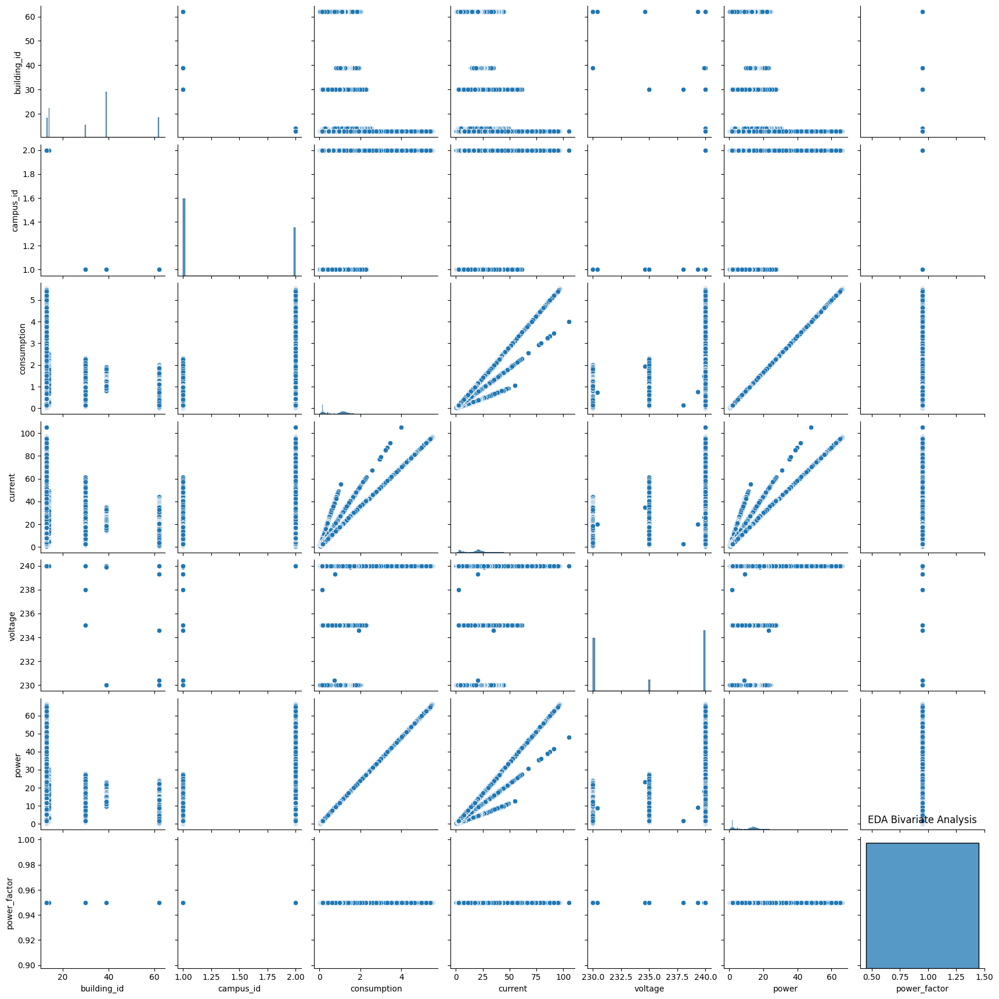

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=df.drop(['timestamp'],axis=1))
plt.title('EDA Bivariate Analysis')
plt.show()

### EDA Multivariate Analysis
As the name suggests, Multivariate analysis looks at more than two variables. Multivariate analysis is one of the most useful methods to determine relationships and analyze patterns for any dataset.

##### A heat map is widely been used for Multivariate Analysis

Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.

In our example heat map shows the correlation between the variables.

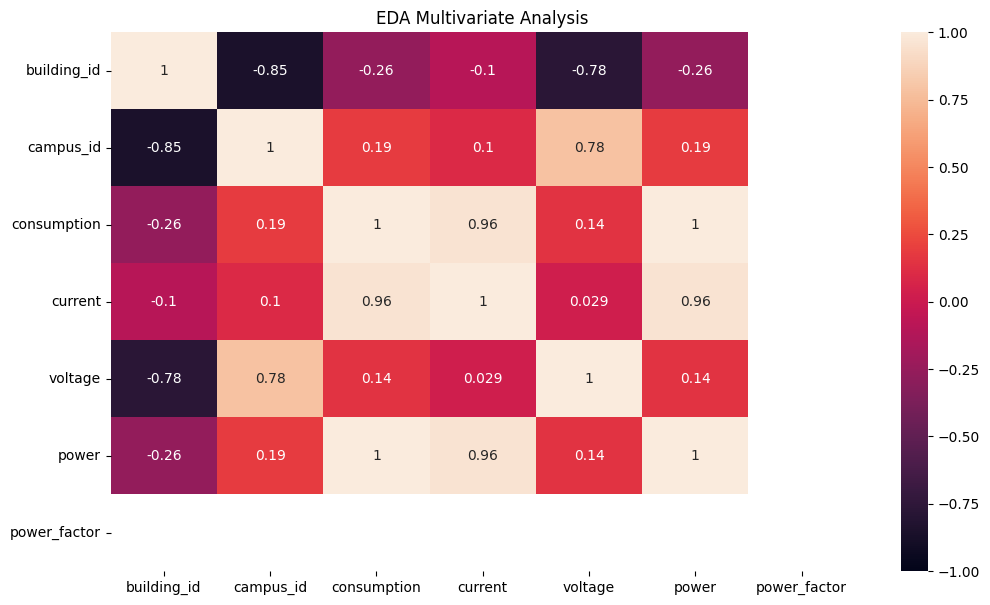

In [ ]:
plt.figure(figsize=(12, 7))
sns.heatmap(df.drop(['timestamp'],axis=1).corr(), annot = True, vmin = -1, vmax = 1)
plt.title('EDA Multivariate Analysis')
plt.show()

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

### Distribution of Consumption:

Plot a histogram or density plot to visualize the distribution of consumption.
Calculate summary statistics such as mean, median, standard deviation, min, max, etc., for consumption.

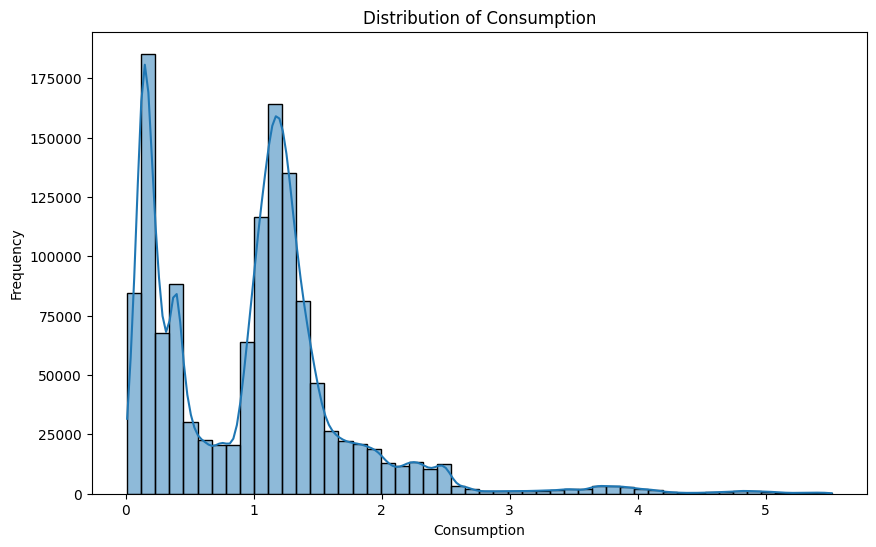

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['consumption'], bins=50, kde=True)
plt.title('Distribution of Consumption')
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.show()

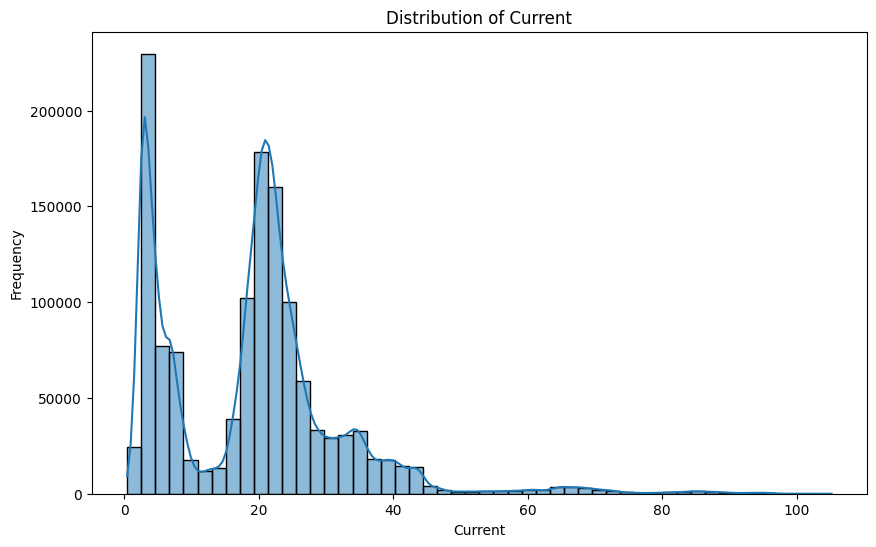

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['current'], bins=50, kde=True)
plt.title('Distribution of Current')
plt.xlabel('Current')
plt.ylabel('Frequency')
plt.show()

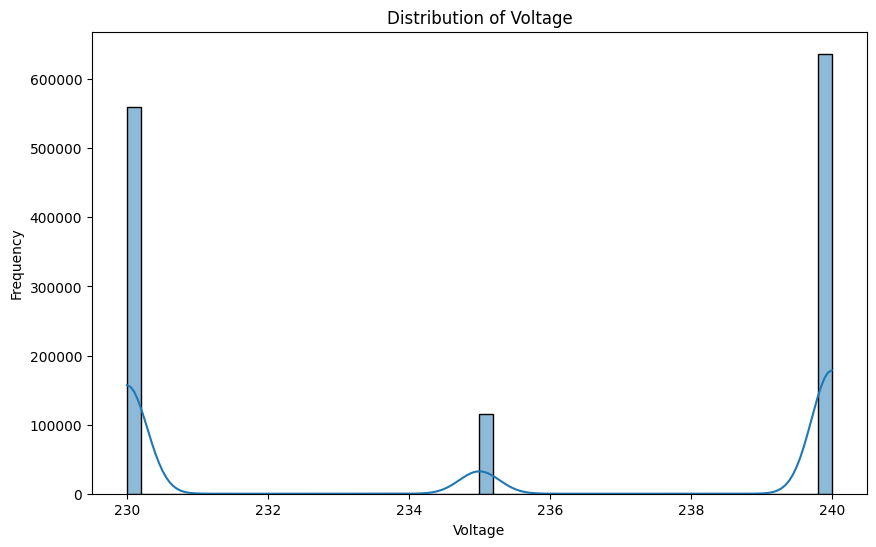

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['voltage'], bins=50, kde=True)
plt.title('Distribution of Voltage')
plt.xlabel('Voltage')
plt.ylabel('Frequency')
plt.show()

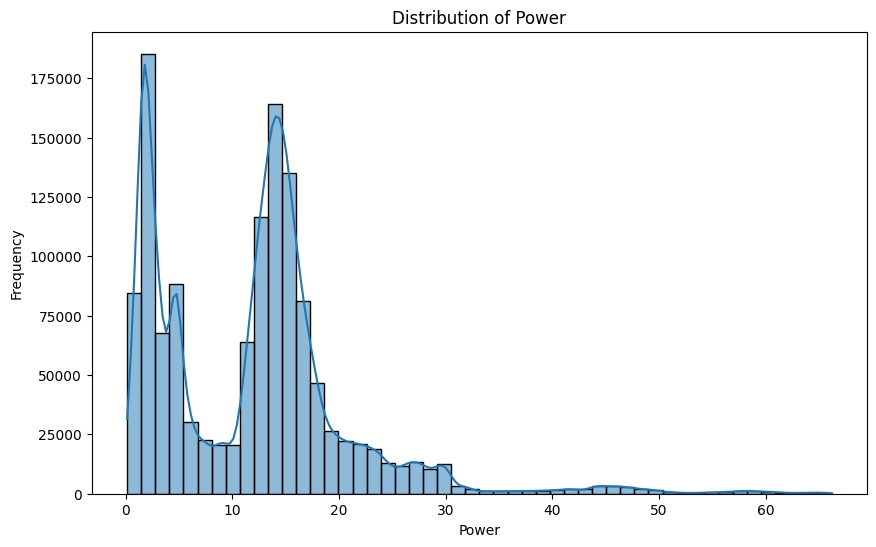

In [ ]:
# Distribution of Consumption
plt.figure(figsize=(10, 6))
sns.histplot(df['power'], bins=50, kde=True)
plt.title('Distribution of Power')
plt.xlabel('Power')
plt.ylabel('Frequency')
plt.show()

In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['consumption'].describe())


Summary Statistics for Consumption:
count    1.312464e+06
mean     9.982372e-01
std      7.579934e-01
min      1.240000e-02
25%      3.118000e-01
50%      1.073600e+00
75%      1.318000e+00
max      5.516400e+00
Name: consumption, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['current'].describe())


Summary Statistics for Consumption:
count    1.312464e+06
mean     1.898432e+01
std      1.331604e+01
min      4.100000e-01
25%      6.570000e+00
50%      2.016000e+01
75%      2.454000e+01
max      1.051900e+02
Name: current, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['voltage'].describe())


Summary Statistics for Consumption:
count    1.312464e+06
mean     2.352923e+02
std      4.765563e+00
min      2.300000e+02
25%      2.300000e+02
50%      2.350000e+02
75%      2.400000e+02
max      2.400000e+02
Name: voltage, dtype: float64


In [ ]:
print("\nSummary Statistics for Consumption:")
print(df['power'].describe())


Summary Statistics for Consumption:
count    1.312464e+06
mean     1.197885e+01
std      9.095921e+00
min      1.484000e-01
25%      3.742000e+00
50%      1.288315e+01
75%      1.581550e+01
max      6.619710e+01
Name: power, dtype: float64


### Consumption Trends Over Time:

Plot a time series graph of consumption over the entire time range.
Analyze any noticeable trends, seasonality, or patterns in the consumption data.

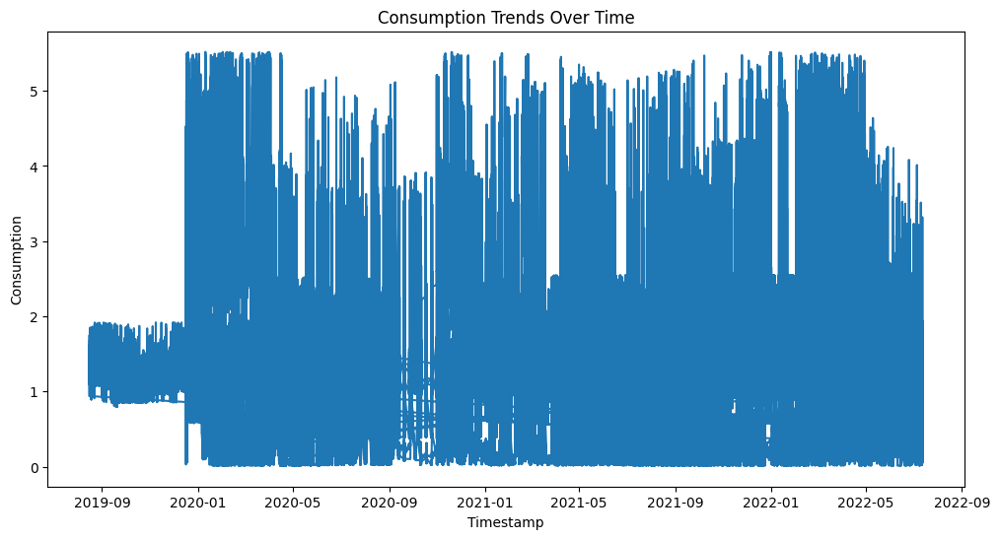

In [ ]:
# Consumption Trends Over Time
df['timestamp'] = pd.to_datetime(df['timestamp'])
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['consumption'])
plt.title('Consumption Trends Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.show()

### Temporal Analysis:

Analyze consumption patterns based on different time intervals (e.g., hourly, daily, weekly).
Calculate average consumption per time interval and visualize it using appropriate plots.

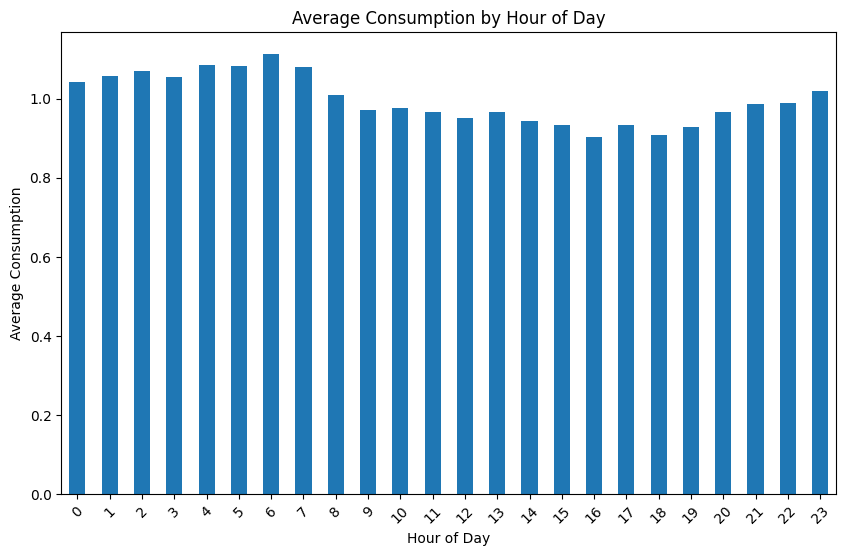

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['consumption'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Consumption by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Consumption')
plt.xticks(rotation=45)
plt.show()

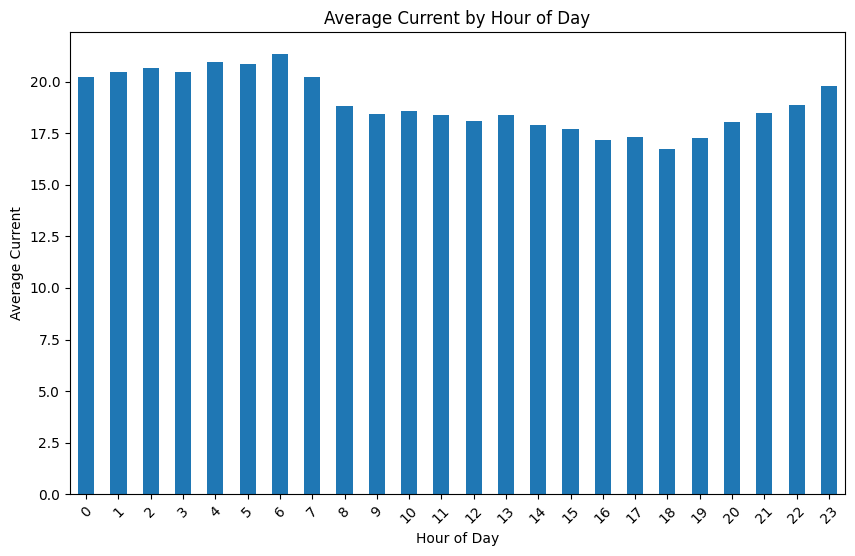

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['current'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Current by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Current')
plt.xticks(rotation=45)
plt.show()

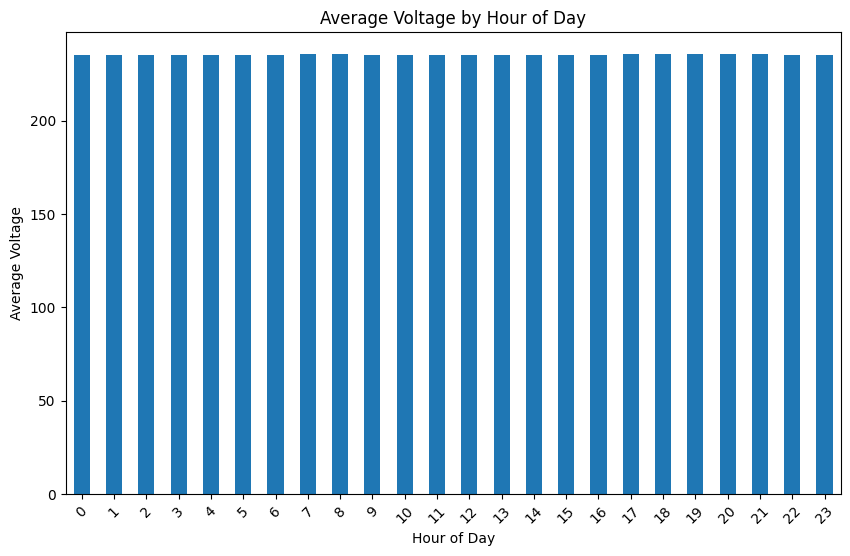

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['voltage'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Voltage by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Voltage')
plt.xticks(rotation=45)
plt.show()

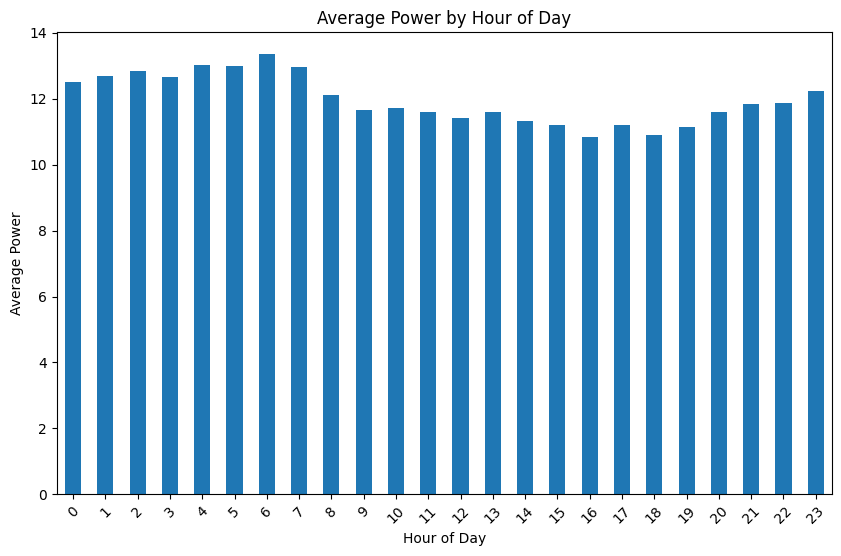

In [ ]:
# Assuming df is your DataFrame with the 'timestamp' column
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True)  # Convert to datetime format with UTC
df['hour'] = df['timestamp'].dt.hour  # Extract hour component

# Now you can proceed with the rest of your analysis using the 'hour' column
hourly_consumption = df.groupby('hour')['power'].mean()
plt.figure(figsize=(10, 6))
hourly_consumption.plot(kind='bar')
plt.title('Average Power by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Power')
plt.xticks(rotation=45)
plt.show()

### Outlier Detection:

Identify and analyze outliers in the consumption data using statistical methods or visualization techniques.

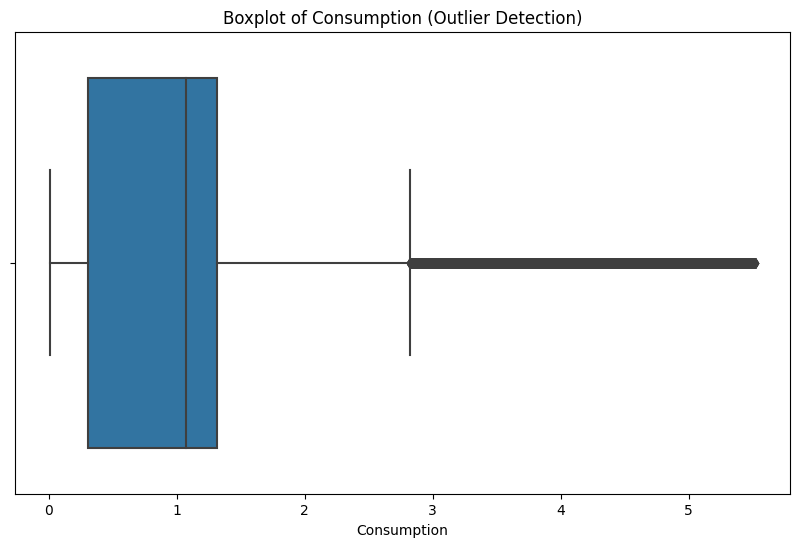

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['consumption'])
plt.title('Boxplot of Consumption (Outlier Detection)')
plt.xlabel('Consumption')
plt.show()

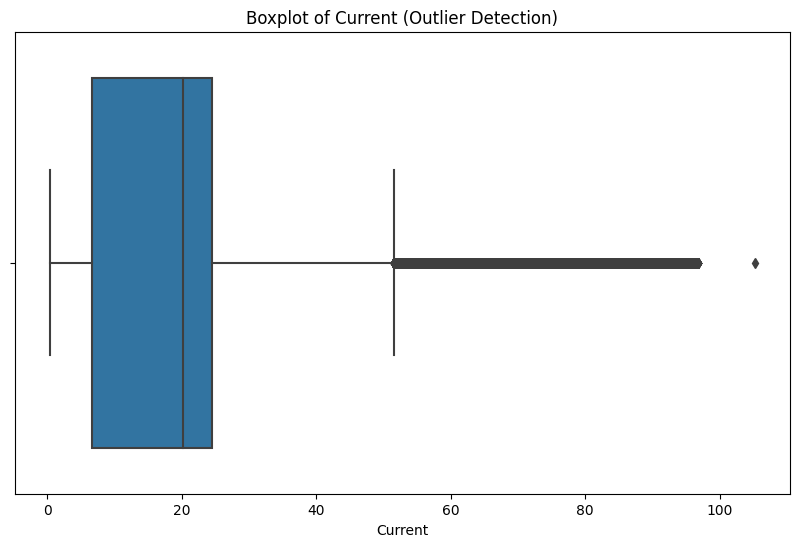

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['current'])
plt.title('Boxplot of Current (Outlier Detection)')
plt.xlabel('Current')
plt.show()

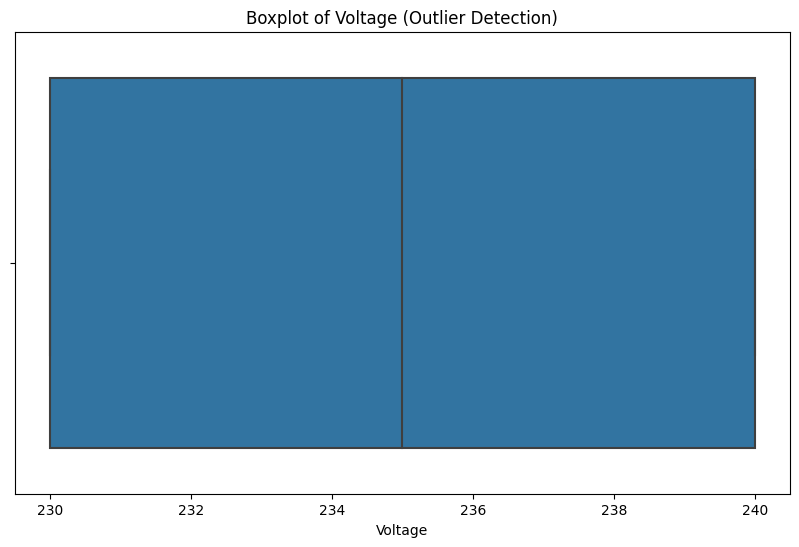

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['voltage'])
plt.title('Boxplot of Voltage (Outlier Detection)')
plt.xlabel('Voltage')
plt.show()

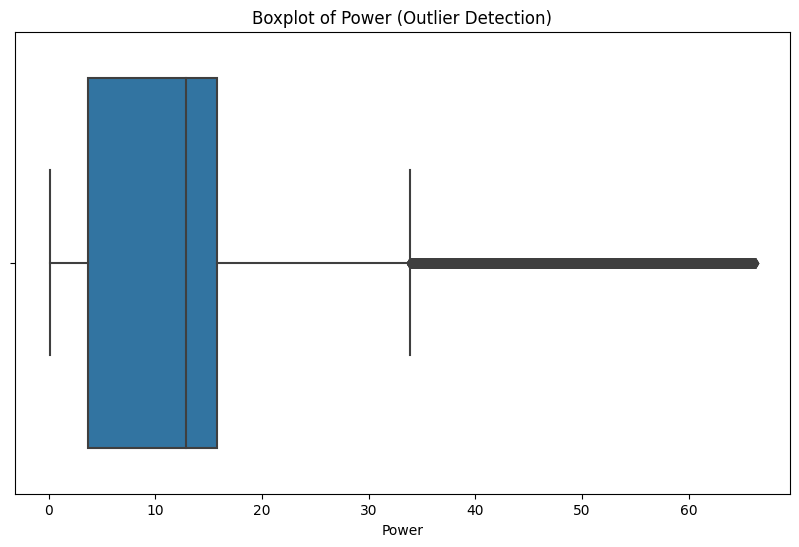

In [ ]:
#  Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['power'])
plt.title('Boxplot of Power (Outlier Detection)')
plt.xlabel('Power')
plt.show()

### Correlation Analysis:

Check for correlations between meter_id, timestamp, and consumption.
Visualize correlations using a heatmap or correlation matrix.

C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_7912\3322742227.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


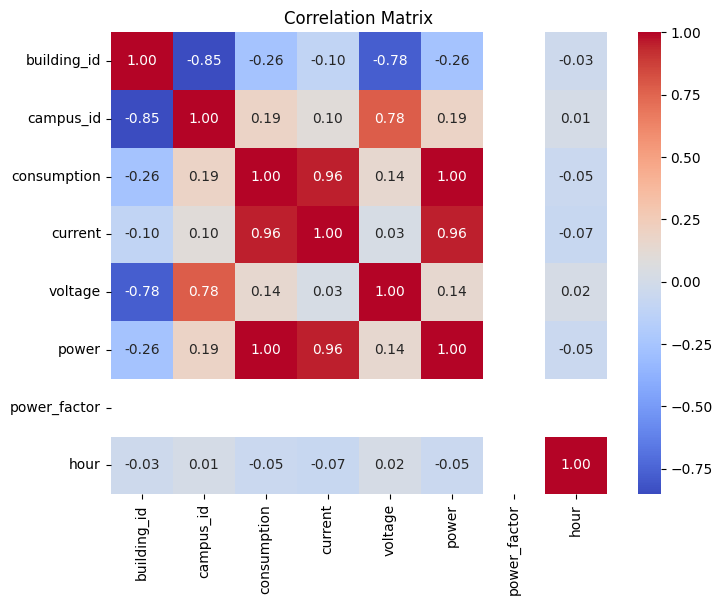

In [ ]:
# Correlation Analysis
correlation_matrix = df.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### Seasonal Decomposition:

Perform seasonal decomposition (e.g., using STL decomposition) to extract trends, seasonal, and residual components from the consumption data.

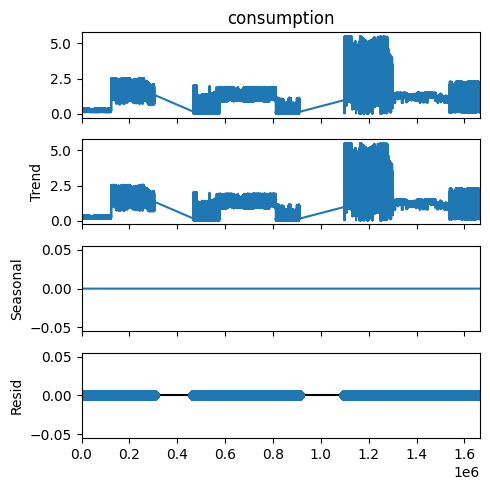

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['consumption'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

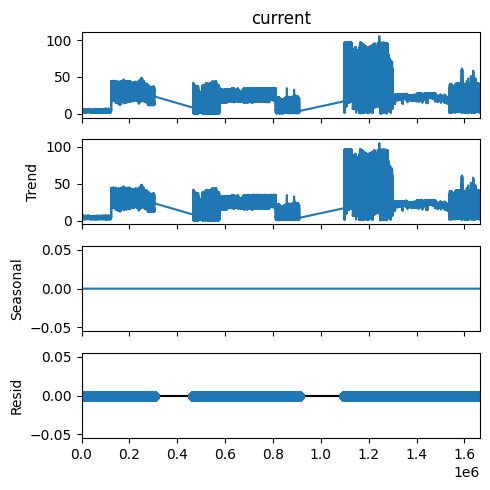

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['current'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

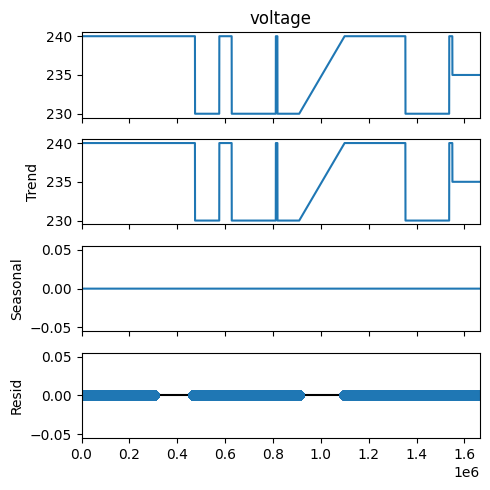

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['voltage'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

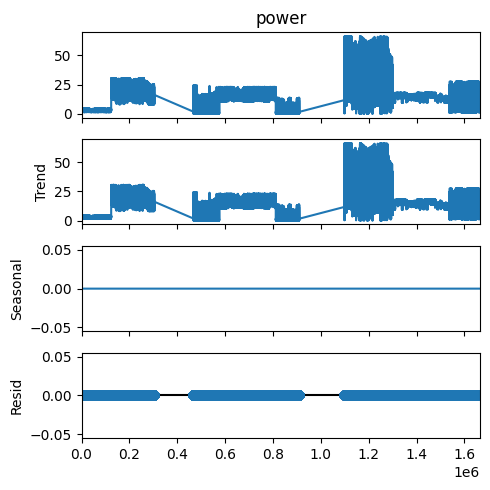

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_add = seasonal_decompose(x=df['power'], model='additive', extrapolate_trend='freq', period=1)
plt.rcParams.update({'figure.figsize': (5,5)})
result_add.plot().suptitle('', fontsize=22)
plt.show()

### Data Quality Check:

Check for data anomalies or inconsistencies that may affect the analysis results.
Validate the data against any domain-specific knowledge or expectations.

In [ ]:
# Check for duplicate rows
duplicate_rows = df[df.duplicated()]
if duplicate_rows.empty:
    print("No duplicate rows found.")
else:
    print("Duplicate rows found.")
    print(duplicate_rows)

# Check for negative consumption values
negative_consumption = df[df['consumption'] < 0]
if negative_consumption.empty:
    print("No negative consumption values found.")
else:
    print("Negative consumption values found.")
    print(negative_consumption)

# Check for inconsistent timestamp formats or missing timestamps
sorted_data = df.sort_values(by='timestamp')
time_diff = sorted_data['timestamp'].diff().dropna()
if (time_diff.dt.total_seconds() > 900).any():
    print("Timestamps are not consistently spaced (greater than 15 minutes apart).")
else:
    print("Timestamps are consistently spaced (15 minutes apart).")

Duplicate rows found.
         building_id  campus_id                 timestamp  consumption  \
815901          62.0        1.0 2020-02-09 01:45:00+00:00       0.0860   
820727          62.0        1.0 2020-03-01 10:05:00+00:00       0.0566   
1339821         39.0        1.0 2020-01-04 02:20:00+00:00       1.3544   
1366865         39.0        1.0 2020-04-22 02:45:00+00:00       1.3267   
1428759         39.0        1.0 2021-06-12 05:10:00+00:00       1.1890   

         current  voltage    power  power_factor  hour  
815901      2.26    240.0   1.0315          0.95     1  
820727      3.11    230.0   0.6787          0.95    10  
1339821    23.76    240.0  16.2528          0.95     2  
1366865    24.29    230.0  15.9203          0.95     2  
1428759    21.77    230.0  14.2681          0.95     5  
No negative consumption values found.
Timestamps are not consistently spaced (greater than 15 minutes apart).


### Feature Engineering:

Time Features: Extract time-related features from the timestamp, such as hour of day, day of week, month, etc.
Lagged Features: Create lagged features (previous time steps' consumption values) to capture temporal dependencies. 

In [ ]:
# Assuming 'data' is your dataframe with the timestamp column converted to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [ ]:
# Time Features
df['hour'] = df['timestamp'].dt.hour
df['day_of_week'] = df['timestamp'].dt.dayofweek
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Lagged Features (e.g., lagged consumption values)
num_lags = 3  # You can adjust the number of lagged features
for lag in range(1, num_lags + 1):
    df[f'lag_{lag}'] = df['consumption'].shift(lag)

### Feature Taregt

In [ ]:
# Drop rows with NaN values due to lagging
df.dropna(inplace=True)

# Split data into features (X) and target variable (y)
X = df.drop(['timestamp', 'consumption', 'current', 'voltage'], axis=1)
y = df['consumption']

print(X, y)

         building_id  campus_id   power  power_factor  hour  day_of_week  \
3               14.0        2.0  2.2636          0.95     9            1   
4               14.0        2.0  3.0009          0.95     9            1   
5               14.0        2.0  2.4191          0.95     9            1   
6               14.0        2.0  2.3922          0.95     9            1   
7               14.0        2.0  2.4699          0.95     9            1   
...              ...        ...     ...           ...   ...          ...   
1665157         30.0        1.0  1.7811          0.95     0            0   
1665158         30.0        1.0  1.7757          0.95     0            0   
1665159         30.0        1.0  1.7802          0.95     0            0   
1665160         30.0        1.0  1.7789          0.95     0            0   
1665161         30.0        1.0  1.7918          0.95     0            0   

         month  year   lag_1   lag_2   lag_3  
3            4  2021  0.2440  0.2010  0.

### Impute Missing Values

In [ ]:
# Impute missing values in X
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed
X_imputed = imputer.fit_transform(X)

### Train Test Split

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Model Creation

Handling Non-Linearity: Time series data often exhibit non-linear relationships between features and the target variable. Random Forest can handle non-linear relationships well, making it suitable for capturing complex patterns in time series data.

Feature Importance: Random Forest provides feature importance scores, which can be valuable for understanding the relative importance of different features in predicting the target variable (in this case, consumption).

Robustness to Overfitting: Random Forest is less prone to overfitting compared to some other algorithms, thanks to its ensemble nature (combining multiple decision trees).

Ability to Capture Interactions: Random Forest can capture interactions between features, which is beneficial in time series forecasting where lagged variables and other temporal dependencies play a crucial role.

Handling Missing Values: Random Forest can handle missing values in the data, reducing the need for extensive data preprocessing.

In [ ]:
# Model creation (Random Forest Regressor as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)  # Adjust the number of estimators as needed
model.fit(X_train.iloc[:100000], y_train.iloc[:100000])  # remove iloc for all thr data

RandomForestRegressor(random_state=42)

### Model Evaluation

In [ ]:
# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 3.7718165665371595e-08


### Single Feature Graph

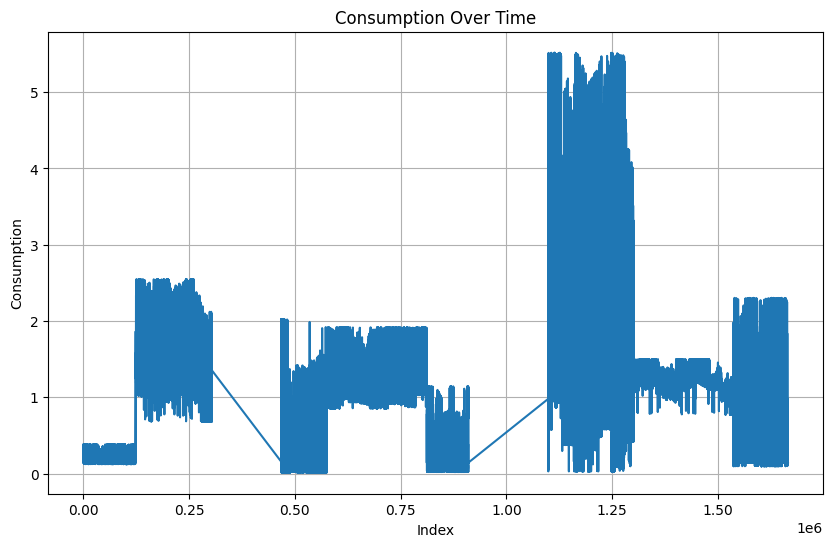

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['consumption'])
plt.title('Consumption Over Time')
plt.xlabel('Index')
plt.ylabel('Consumption')
plt.grid(True)  # Add grid lines for better readability
plt.show()

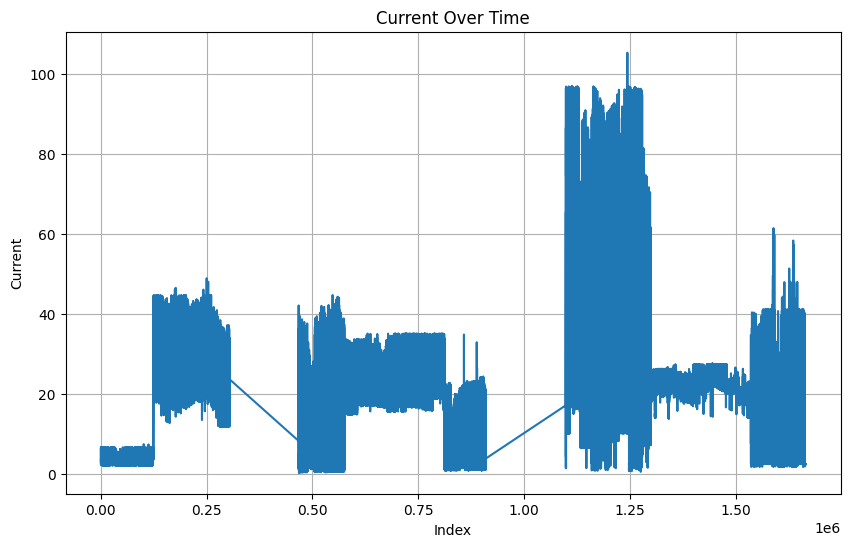

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['current'])
plt.title('Current Over Time')
plt.xlabel('Index')
plt.ylabel('Current')
plt.grid(True)  # Add grid lines for better readability
plt.show()

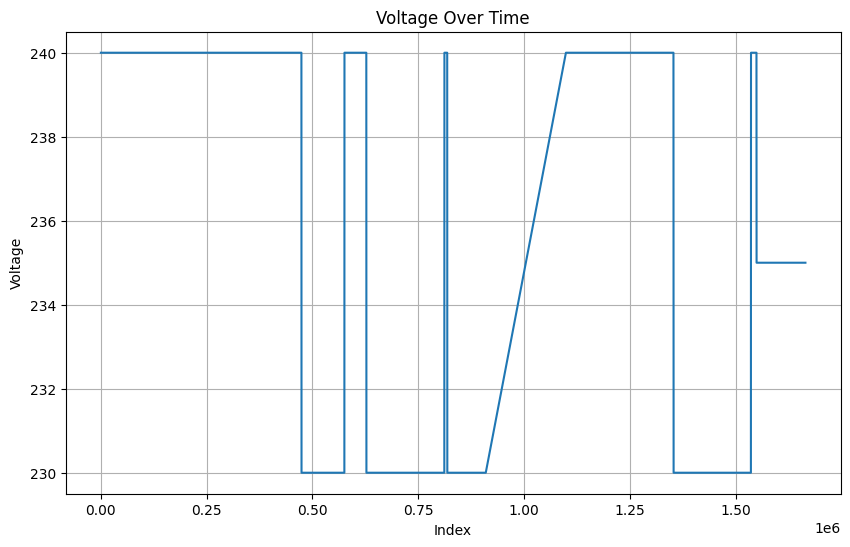

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['voltage'])
plt.title('Voltage Over Time')
plt.xlabel('Index')
plt.ylabel('Voltage')
plt.grid(True)  # Add grid lines for better readability
plt.show()

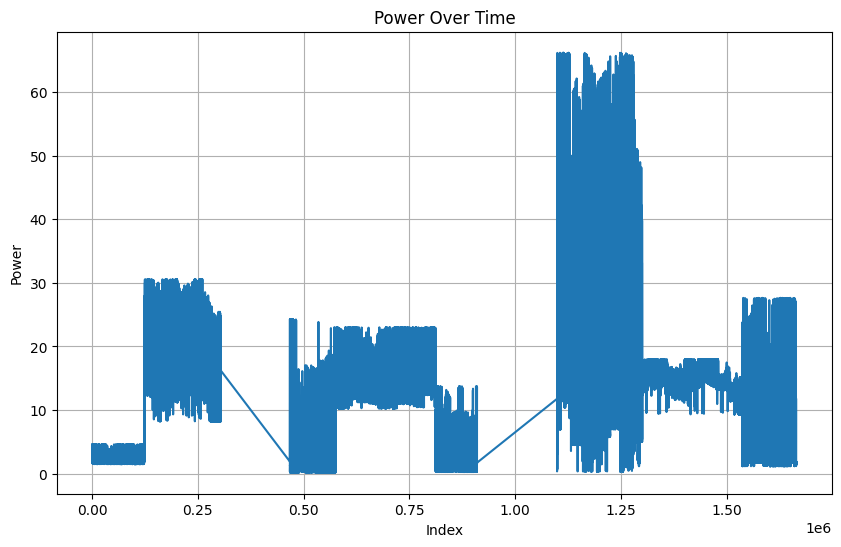

In [ ]:
# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['power'])
plt.title('Power Over Time')
plt.xlabel('Index')
plt.ylabel('Power')
plt.grid(True)  # Add grid lines for better readability
plt.show()

### Cluster Analysis

In [ ]:
df.columns

Index(['building_id', 'campus_id', 'timestamp', 'consumption', 'current',
       'voltage', 'power', 'power_factor', 'hour', 'day_of_week', 'month',
       'year', 'lag_1', 'lag_2', 'lag_3'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler

# Selecting features for clustering
features = ['consumption', 'current',
       'voltage', 'power']
X = df[features]

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=0).fit(X_scaled)
df['Cluster'] = kmeans.labels_


c:\Users\Ibtasam Ahmad\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


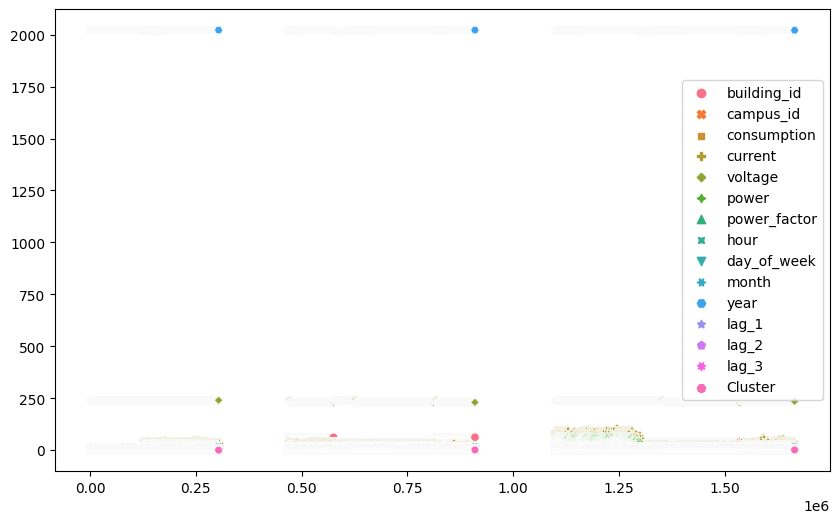

In [ ]:
plt.figure(figsize=(10, 6))
# sns.scatterplot(data, hue='Cluster', palette='viridis', s=50)
sns.scatterplot(df)
# plt.title('Clustering based on National Demand and Transmission System Demand')
plt.show()

In [ ]:
data_1 = df.drop('timestamp', axis = 1)
data_1 = data_1.drop('campus_id', axis = 1)
data_1

,building_id,consumption,current,voltage,power,power_factor,hour,day_of_week,month,year,lag_1,lag_2,lag_3,Cluster
3,14.0,0.1886,3.31,240.0,2.2636,0.95,9,1,4,2021,0.2440,0.2010,0.2256,1
4,14.0,0.2501,4.39,240.0,3.0009,0.95,9,1,4,2021,0.1886,0.2440,0.2010,1
5,14.0,0.2016,3.54,240.0,2.4191,0.95,9,1,4,2021,0.2501,0.1886,0.2440,1
6,14.0,0.1993,3.50,240.0,2.3922,0.95,9,1,4,2021,0.2016,0.2501,0.1886,1
7,14.0,0.2058,3.61,240.0,2.4699,0.95,9,1,4,2021,0.1993,0.2016,0.2501,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1665157,30.0,0.1484,2.66,235.0,1.7811,0.95,0,0,11,2021,0.1483,0.1476,0.1477,1
1665158,30.0,0.1480,2.65,235.0,1.7757,0.95,0,0,11,2021,0.1484,0.1483,0.1476,1
1665159,30.0,0.1483,2.66,235.0,1.7802,0.95,0,0,11,2021,0.1480,0.1484,0.1483,1
1665160,30.0,0.1482,2.66,235.0,1.7789,0.95,0,0,11,2021,0.1483,0.1480,0.1484,1


In [ ]:
grouped = data_1.groupby('Cluster').mean()
print(grouped[features])

         consumption    current     voltage      power
Cluster                                               
0           1.504780  26.510946  239.832585  18.057370
1           0.244252   4.991639  236.605464   2.931028
2           1.119642  23.015586  230.135044  13.435710
3           3.846921  67.499391  239.999843  46.163058


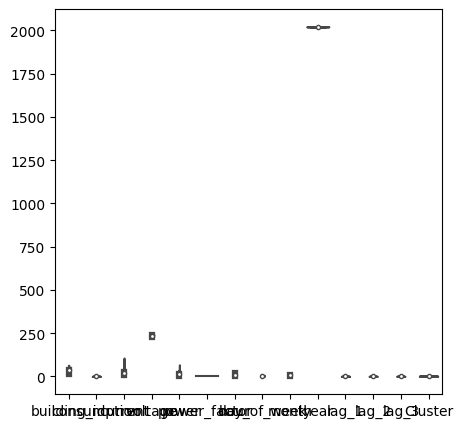

In [ ]:
sns.violinplot(data_1)
# plt.title('Distribution of National Demand across Type of Day')
plt.show()


### Hourly Pattern

In [ ]:
grouped = df.groupby('timestamp').mean()
grouped = grouped.drop('campus_id', axis = 1)

grouped

,building_id,consumption,current,voltage,power,power_factor,hour,day_of_week,month,year,lag_1,lag_2,lag_3,Cluster
timestamp,,,,,,,,,,,,,,
2019-08-15 03:50:00+00:00,39.000000,1.171100,20.550000,240.000000,14.053000,0.95,3.0,3.0,8.0,2019.0,0.43890,0.441100,0.464400,0.000000
2019-08-15 03:55:00+00:00,39.000000,1.173900,20.600000,240.000000,14.087000,0.95,3.0,3.0,8.0,2019.0,1.17110,0.438900,0.441100,0.000000
2019-08-15 04:00:00+00:00,39.000000,1.101050,19.320000,240.000000,13.212600,0.95,4.0,3.0,8.0,2019.0,0.71295,0.624500,0.282450,0.000000
2019-08-15 04:05:00+00:00,39.000000,1.340000,23.510000,240.000000,16.080050,0.95,4.0,3.0,8.0,2019.0,1.10105,0.712950,0.624500,0.000000
2019-08-15 04:10:00+00:00,39.000000,1.344650,23.590000,240.000000,16.135550,0.95,4.0,3.0,8.0,2019.0,1.34000,1.101050,0.712950,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-12 22:35:00+00:00,23.800000,0.867480,15.572000,236.000000,10.409840,0.95,22.0,1.0,7.0,2022.0,0.93166,0.919900,0.990060,1.200000
2022-07-12 22:40:00+00:00,23.800000,0.985220,17.680000,236.000000,11.822460,0.95,22.0,1.0,7.0,2022.0,0.86748,0.931660,0.919900,1.200000
2022-07-12 22:45:00+00:00,23.800000,0.965780,17.300000,236.000000,11.589200,0.95,22.0,1.0,7.0,2022.0,0.98522,0.867480,0.931660,1.200000


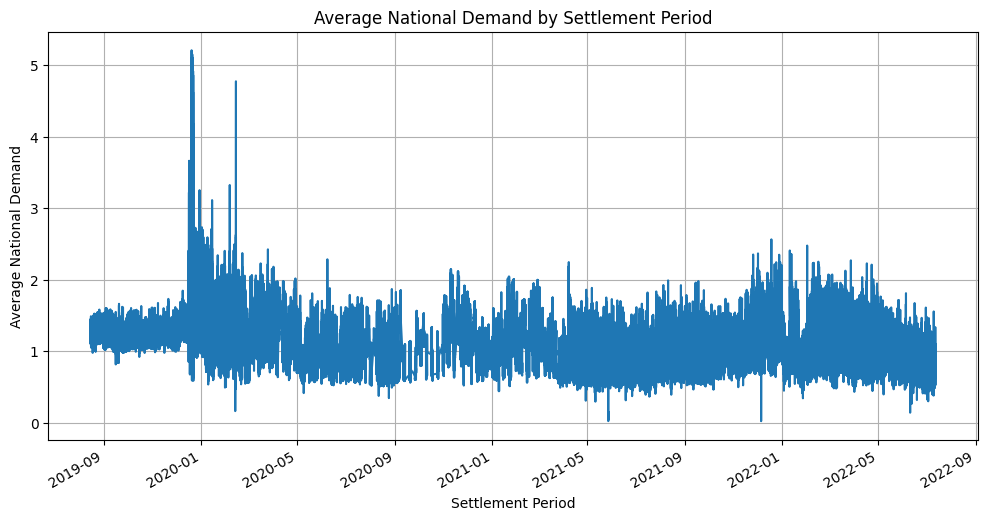

In [ ]:
plt.figure(figsize=(12, 6))
grouped['consumption'].plot()
plt.title('Average National Demand by Settlement Period')
plt.xlabel('Settlement Period')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()

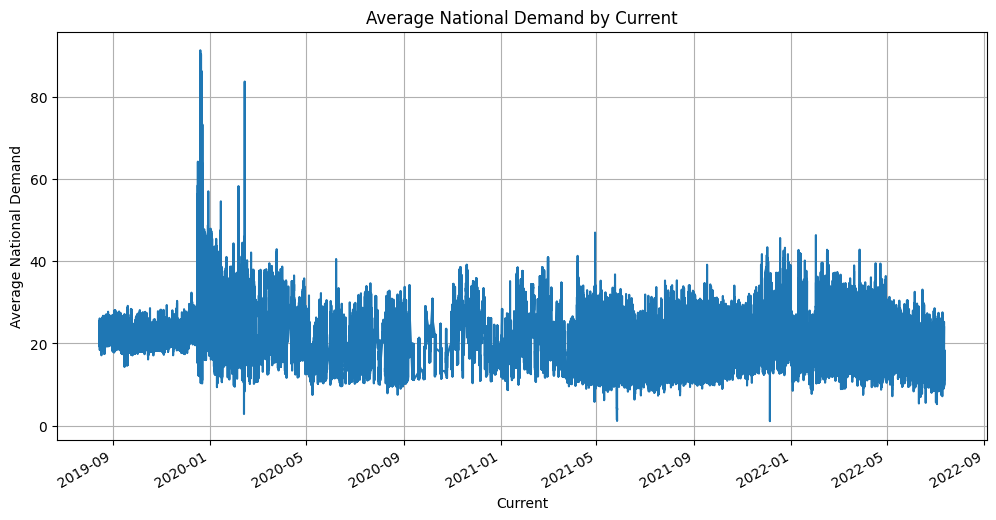

In [ ]:
plt.figure(figsize=(12, 6))
grouped['current'].plot()
plt.title('Average National Demand by Current')
plt.xlabel('Current')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()

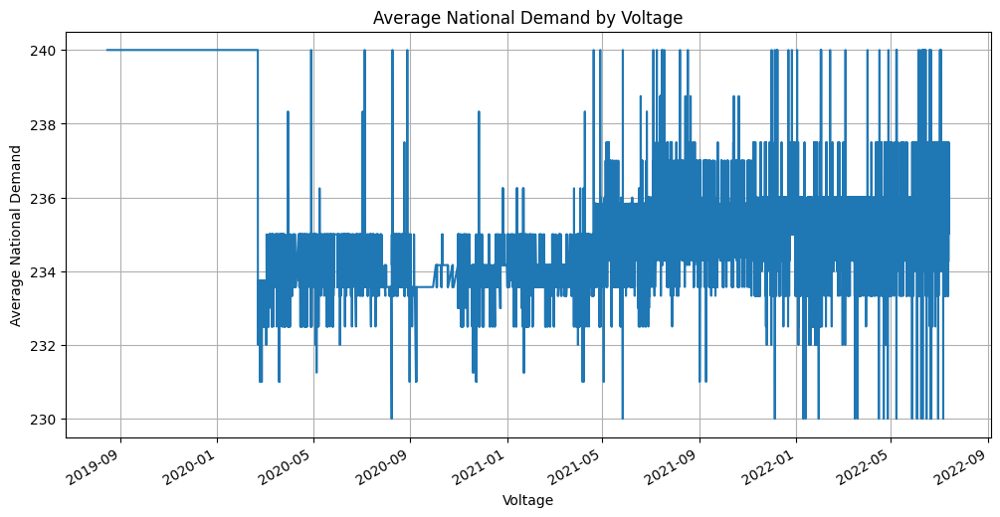

In [ ]:
plt.figure(figsize=(12, 6))
grouped['voltage'].plot()
plt.title('Average National Demand by Voltage')
plt.xlabel('Voltage')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()

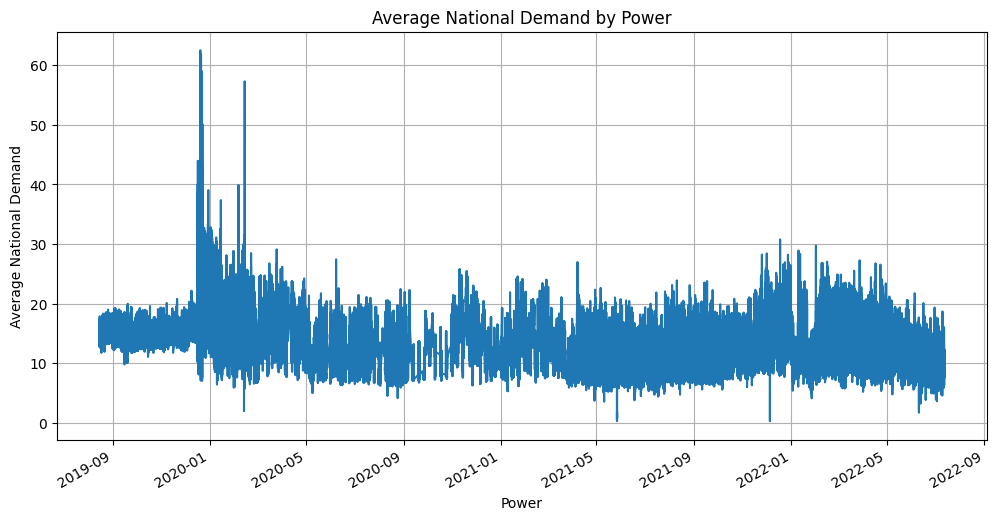

In [ ]:
plt.figure(figsize=(12, 6))
grouped['power'].plot()
plt.title('Average National Demand by Power')
plt.xlabel('Power')
plt.ylabel('Average National Demand')
plt.grid(True)
plt.show()

### Data Day Average

In [ ]:
data = df.copy
data

<bound method NDFrame.copy of          building_id  campus_id                 timestamp  consumption  \
3               14.0        2.0 2021-04-20 09:20:00+00:00       0.1886   
4               14.0        2.0 2021-04-20 09:25:00+00:00       0.2501   
5               14.0        2.0 2021-04-20 09:30:00+00:00       0.2016   
6               14.0        2.0 2021-04-20 09:35:00+00:00       0.1993   
7               14.0        2.0 2021-04-20 09:40:00+00:00       0.2058   
...              ...        ...                       ...          ...   
1665157         30.0        1.0 2021-11-08 00:15:00+00:00       0.1484   
1665158         30.0        1.0 2021-11-08 00:20:00+00:00       0.1480   
1665159         30.0        1.0 2021-11-08 00:25:00+00:00       0.1483   
1665160         30.0        1.0 2021-11-08 00:30:00+00:00       0.1482   
1665161         30.0        1.0 2021-11-08 00:35:00+00:00       0.1493   

         current  voltage   power  power_factor  hour  day_of_week  month  \
3   

In [ ]:
# Read the data into a pandas DataFrame
data = pd.read_csv("../Final_dataset/building_submeter_consumption.csv")

# Convert 'timestamp' column to datetime format
data['timestamp'] = pd.to_datetime(data['timestamp'], errors='coerce')

# Drop rows with NaT (Not a Time) values, if any
data = data.dropna(subset=['timestamp'])

# Extract date from 'timestamp'
data['date'] = data['timestamp'].dt.date

# Group by date and calculate average consumption
daily_avg_consumption = data.groupby('date')['consumption'].mean()

# Print the daily average consumption

print(daily_avg_consumption)

date
2019-08-15    1.251763
2019-08-16    1.205980
2019-08-17    1.157768
2019-08-18    1.140986
2019-08-19    1.231407
                ...   
2022-07-09    0.561369
2022-07-10    0.641025
2022-07-11    0.831267
2022-07-12    0.833231
2022-07-13    0.767662
Name: consumption, Length: 1023, dtype: float64


In [ ]:
# Convert the Series to a DataFrame with columns 'date' and 'consumption'
df = daily_avg_consumption.reset_index()
df.columns = ['date', 'consumption']
df

,date,consumption
0,2019-08-15,1.251763
1,2019-08-16,1.205980
2,2019-08-17,1.157768
3,2019-08-18,1.140986
4,2019-08-19,1.231407
...,...,...
1018,2022-07-09,0.561369
1019,2022-07-10,0.641025
1020,2022-07-11,0.831267
1021,2022-07-12,0.833231


In [ ]:
daily_avg_consumption.head(15)

date
2019-08-15    1.251763
2019-08-16    1.205980
2019-08-17    1.157768
2019-08-18    1.140986
2019-08-19    1.231407
2019-08-20    1.216327
2019-08-21    1.215529
2019-08-22    1.192684
2019-08-23    1.249179
2019-08-24    1.199125
2019-08-25    1.198656
2019-08-26    1.280960
2019-08-27    1.276372
2019-08-28    1.253140
2019-08-29    1.249199
Name: consumption, dtype: float64

In [ ]:
df_result = daily_avg_consumption.reset_index()
daily_avg_consumption = df_result.rename(columns={'consumption': 'consuption'})
daily_avg_consumption


,date,consuption
0,2019-08-15,1.251763
1,2019-08-16,1.205980
2,2019-08-17,1.157768
3,2019-08-18,1.140986
4,2019-08-19,1.231407
...,...,...
1018,2022-07-09,0.561369
1019,2022-07-10,0.641025
1020,2022-07-11,0.831267
1021,2022-07-12,0.833231


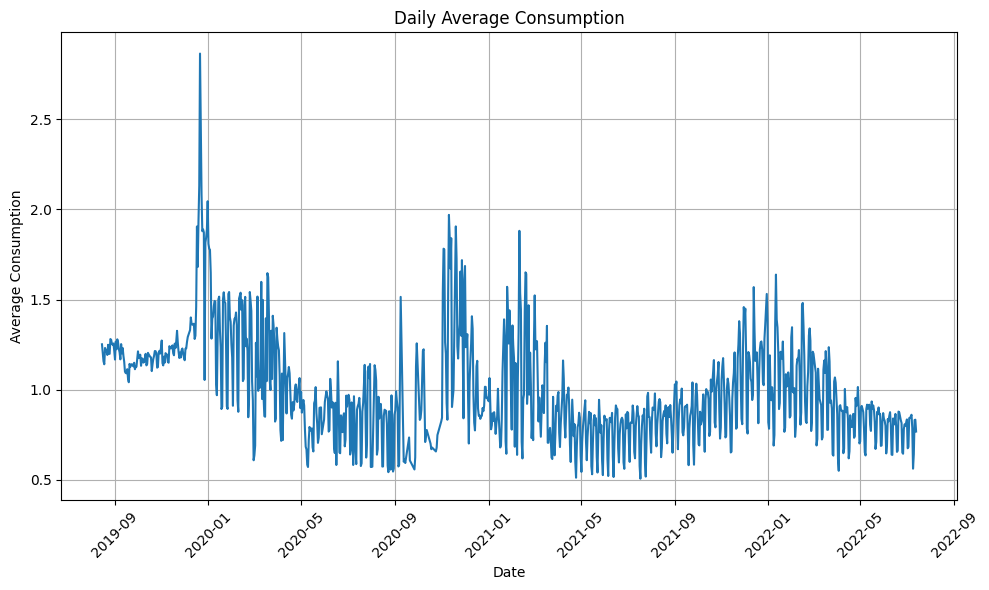

In [ ]:
# Plotting the daily average consumption
plt.figure(figsize=(10, 6))
plt.plot(daily_avg_consumption.iloc[:, 0], daily_avg_consumption.iloc[:, 1])
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Daily Average Consumption')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Weekends & Weekdays Consuption Graph

In [ ]:
# Read the data into a pandas DataFrame
df = daily_avg_consumption.copy()  # Call the copy method with parentheses

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Extract weekday and weekend data
weekdays = df[df['date'].dt.dayofweek < 5]  # Monday to Friday (0-4)
weekends = df[df['date'].dt.dayofweek >= 5]  # Saturday and Sunday (5-6)

# Print the resulting DataFrames
print(weekdays)
print(weekends)

           date  consuption
0    2019-08-15    1.251763
1    2019-08-16    1.205980
4    2019-08-19    1.231407
5    2019-08-20    1.216327
6    2019-08-21    1.215529
...         ...         ...
1016 2022-07-07    0.860736
1017 2022-07-08    0.787443
1020 2022-07-11    0.831267
1021 2022-07-12    0.833231
1022 2022-07-13    0.767662

[721 rows x 2 columns]
           date  consuption
2    2019-08-17    1.157768
3    2019-08-18    1.140986
9    2019-08-24    1.199125
10   2019-08-25    1.198656
16   2019-08-31    1.216212
...         ...         ...
1005 2022-06-26    0.644266
1011 2022-07-02    0.674693
1012 2022-07-03    0.681838
1018 2022-07-09    0.561369
1019 2022-07-10    0.641025

[302 rows x 2 columns]


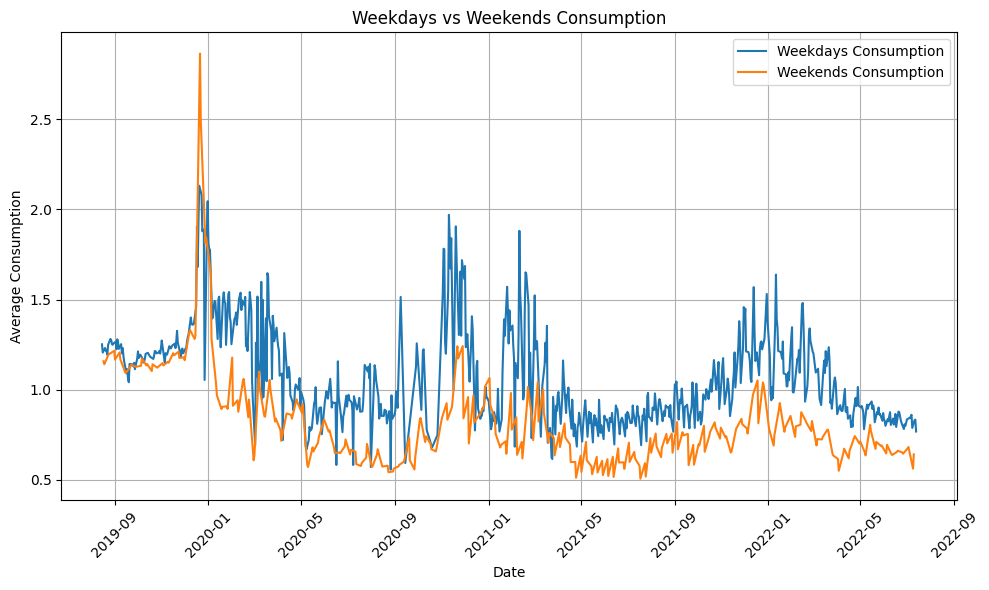

In [ ]:
# Plotting the comparison between weekdays and weekends consumption
plt.figure(figsize=(10, 6))
plt.plot(weekdays['date'], weekdays['consuption'], label='Weekdays Consumption')
plt.plot(weekends['date'], weekends['consuption'], label='Weekends Consumption')
plt.xlabel('Date')
plt.ylabel('Average Consumption')
plt.title('Weekdays vs Weekends Consumption')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

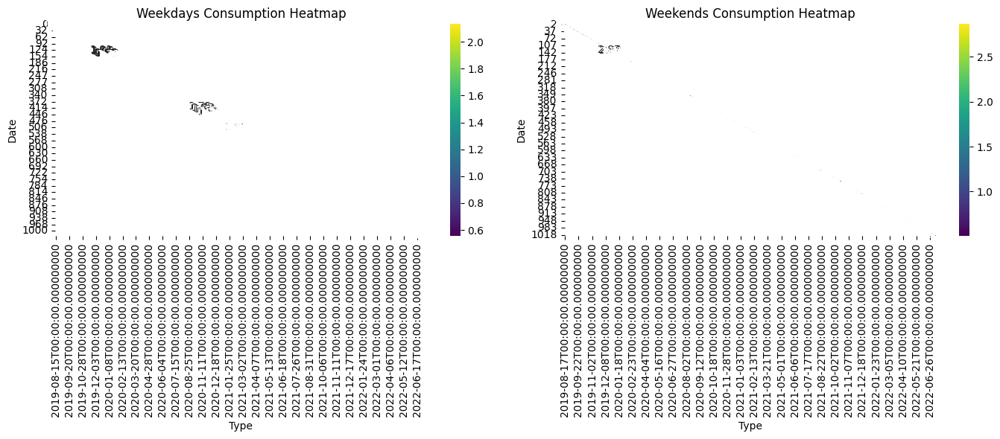

In [ ]:
# Pivot the DataFrames for heatmap plotting
pivot_weekdays = weekdays.pivot( columns='date', values='consuption')
pivot_weekends = weekends.pivot( columns='date', values='consuption')

# Plot the heatmaps
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(pivot_weekdays, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekdays Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.subplot(1, 2, 2)
sns.heatmap(pivot_weekends, cmap='viridis', annot=True, fmt=".2f")
plt.title('Weekends Consumption Heatmap')
plt.xlabel('Type')
plt.ylabel('Date')

plt.tight_layout()
plt.show()

### Monthly Trend

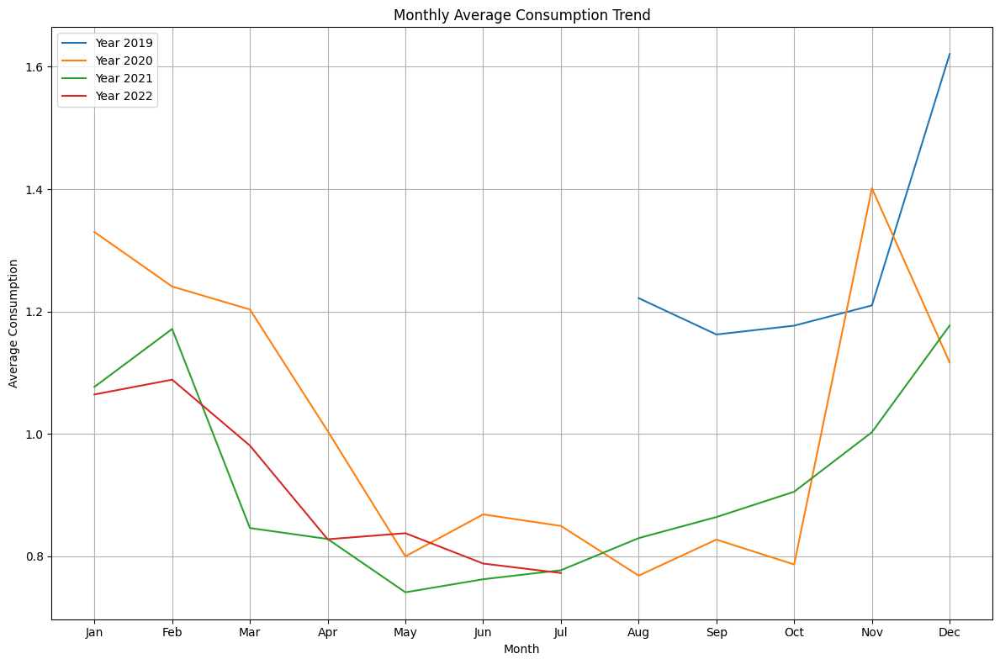

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_submeter_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract date components: month and year
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

# Group by year and month, calculate average consumption
monthly_avg_consumption = df.groupby(['year', 'month'])['consumption'].mean().reset_index()

# Plotting for every month
plt.figure(figsize=(12, 8))
for year in monthly_avg_consumption['year'].unique():
    year_data = monthly_avg_consumption[monthly_avg_consumption['year'] == year]
    plt.plot(year_data['month'], year_data['consumption'], label=f'Year {year}')

plt.xlabel('Month')
plt.ylabel('Average Consumption')
plt.title('Monthly Average Consumption Trend')
plt.legend()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()


### Seasonal Trend

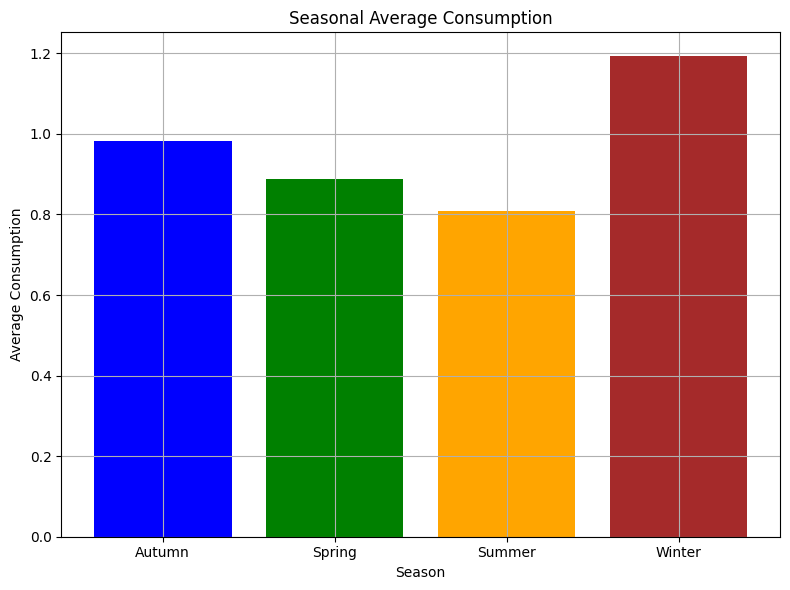

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_submeter_consumption.csv")

# Convert 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define a function to map months to seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Extract season from 'timestamp'
df['season'] = df['timestamp'].dt.month.apply(get_season)

# Group by season and calculate average consumption
seasonal_avg_consumption = df.groupby('season')['consumption'].mean()

# Plotting for every season
plt.figure(figsize=(8, 6))
plt.bar(seasonal_avg_consumption.index, seasonal_avg_consumption.values, color=['blue', 'green', 'orange', 'brown'])
plt.xlabel('Season')
plt.ylabel('Average Consumption')
plt.title('Seasonal Average Consumption')
plt.grid(True)
plt.tight_layout()
plt.show()


### Moving Averages

In [ ]:
# Read the data into a pandas DataFrame
df = pd.read_csv("../Final_dataset/building_submeter_consumption.csv")

df

,building_id,id,campus_id,timestamp,consumption,current,voltage,power,power_factor
0,14.0,1,2.0,2021-04-20 19:05:00,0.2256,3.96,240.0,2.7073,0.95
1,14.0,1,2.0,2021-04-20 19:10:00,0.2010,3.53,240.0,2.4118,0.95
2,14.0,1,2.0,2021-04-20 19:15:00,0.2440,4.28,240.0,2.9284,0.95
3,14.0,1,2.0,2021-04-20 19:20:00,0.1886,3.31,240.0,2.2636,0.95
4,14.0,1,2.0,2021-04-20 19:25:00,0.2501,4.39,240.0,3.0009,0.95
...,...,...,...,...,...,...,...,...,...
1665157,30.0,10,1.0,2021-11-08 11:15:00,0.1484,2.66,235.0,1.7811,0.95
1665158,30.0,10,1.0,2021-11-08 11:20:00,0.1480,2.65,235.0,1.7757,0.95
1665159,30.0,10,1.0,2021-11-08 11:25:00,0.1483,2.66,235.0,1.7802,0.95
1665160,30.0,10,1.0,2021-11-08 11:30:00,0.1482,2.66,235.0,1.7789,0.95


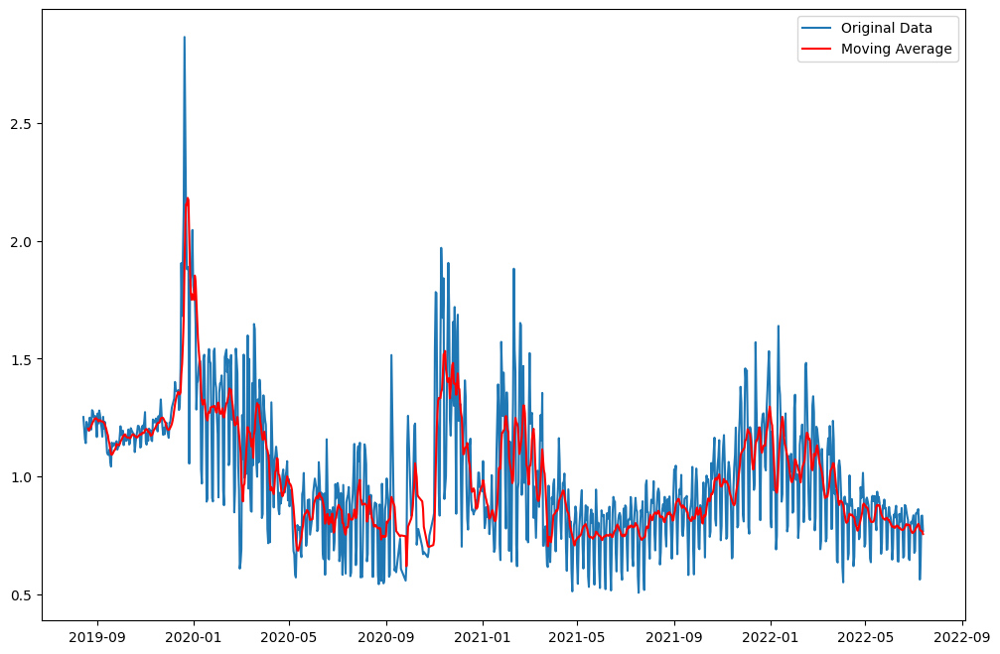

In [ ]:
plt.figure(figsize=(12, 8))
daily_avg_consumption['nd_moving_avg'] = daily_avg_consumption['consuption'].rolling(window=7).mean()
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['consuption'], label='Original Data')
plt.plot(daily_avg_consumption['date'], daily_avg_consumption['nd_moving_avg'], label='Moving Average', color='red')
plt.legend()
plt.show()

### Box Polt Grouped by Categories

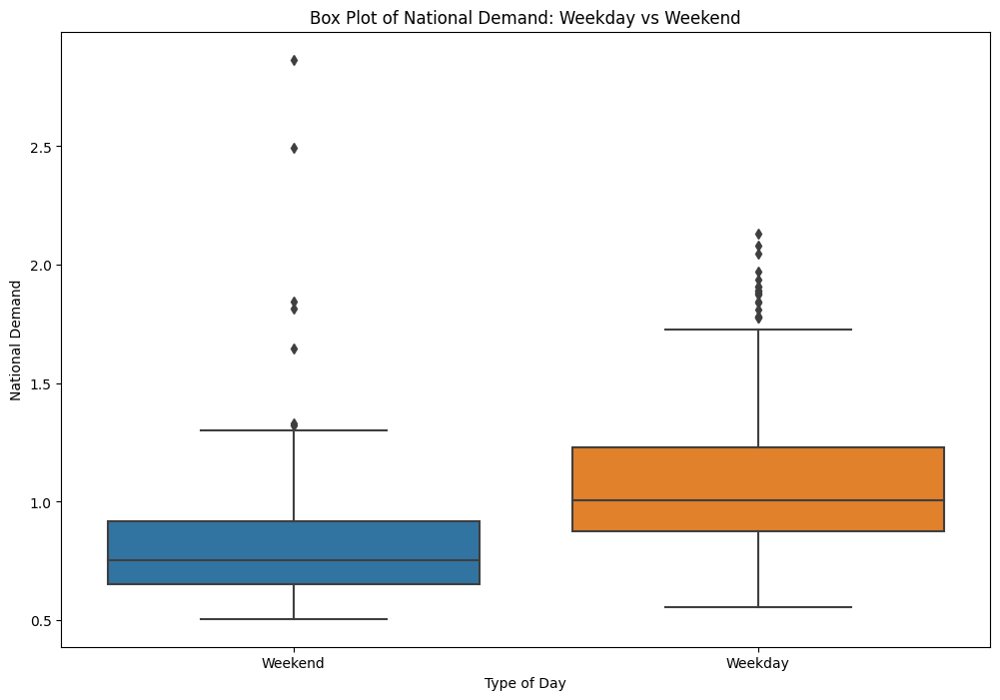

In [ ]:
# Combine the weekends and weekdays dataframes into one dataframe with a new column 'type_of_day'
weekends['type_of_day'] = 'Weekend'
weekdays['type_of_day'] = 'Weekday'
df = pd.concat([weekends, weekdays])

# Plotting the box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='type_of_day', y='consuption')
plt.title('Box Plot of National Demand: Weekday vs Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

### Density Based Weekends & Weekdays Ploting

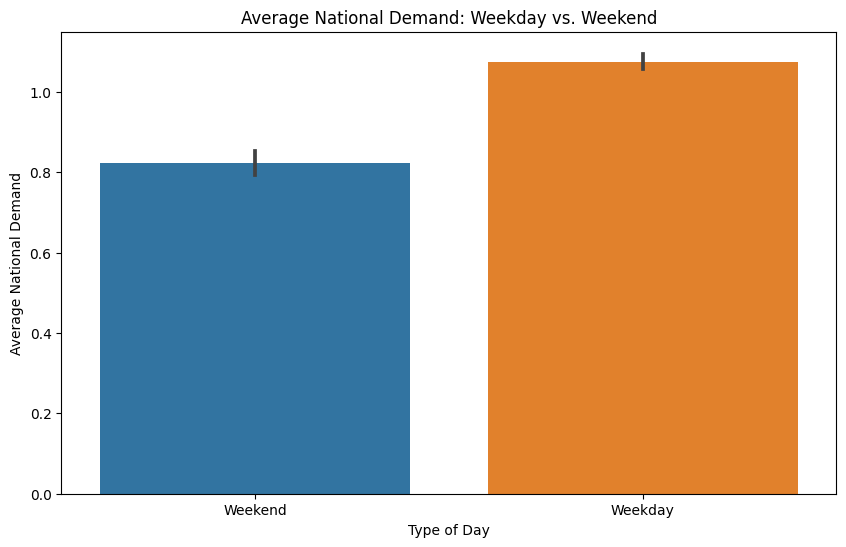

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Average National Demand: Weekday vs. Weekend')
plt.ylabel('Average National Demand')
plt.xlabel('Type of Day')
plt.show()

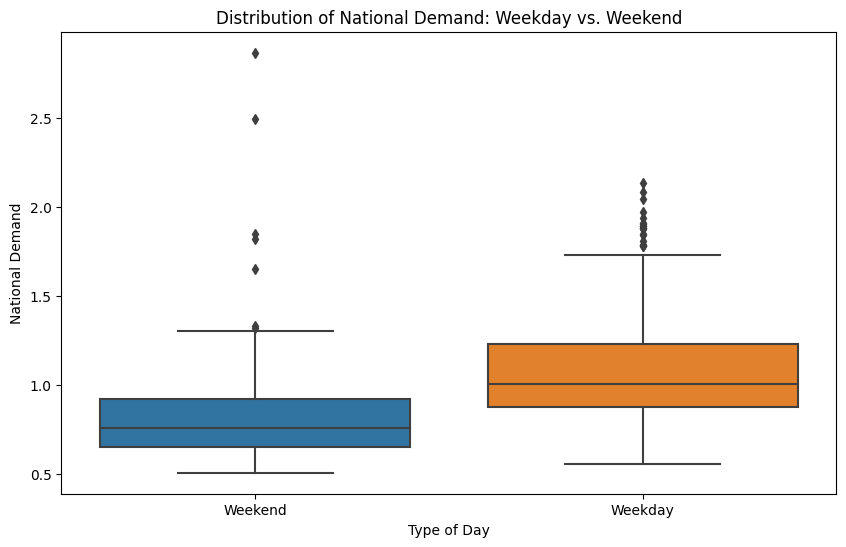

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['type_of_day'], y=df['consuption'])
plt.title('Distribution of National Demand: Weekday vs. Weekend')
plt.ylabel('National Demand')
plt.xlabel('Type of Day')
plt.show()

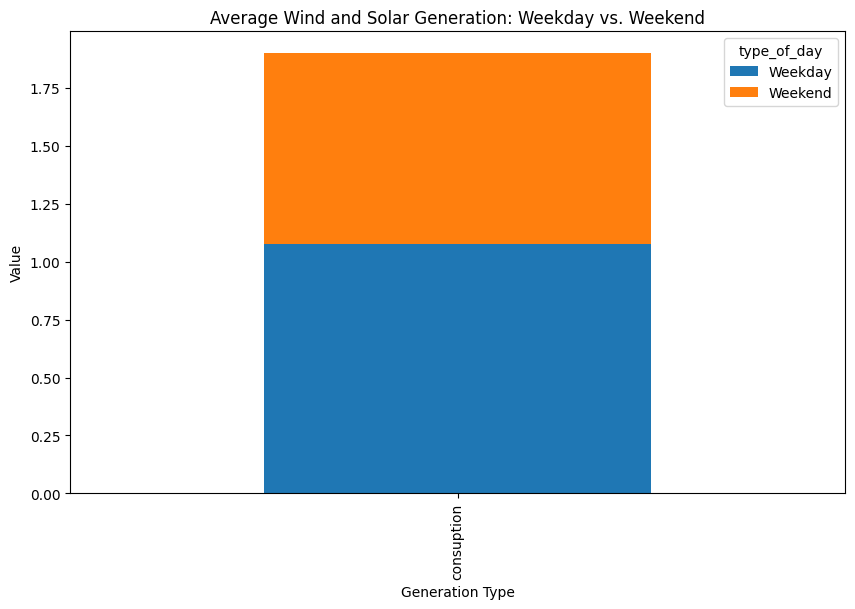

In [ ]:
grouped = df.groupby('type_of_day').agg({'consuption':'mean'}).reset_index()
grouped.set_index('type_of_day').T.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title('Average Wind and Solar Generation: Weekday vs. Weekend')
plt.ylabel('Value')
plt.xlabel('Generation Type')
plt.show()


C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_16484\2308908837.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['consuption'], shade=True, label=day_type)
C:\Users\Ibtasam Ahmad\AppData\Local\Temp\ipykernel_16484\2308908837.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['consuption'], shade=True, label=day_type)


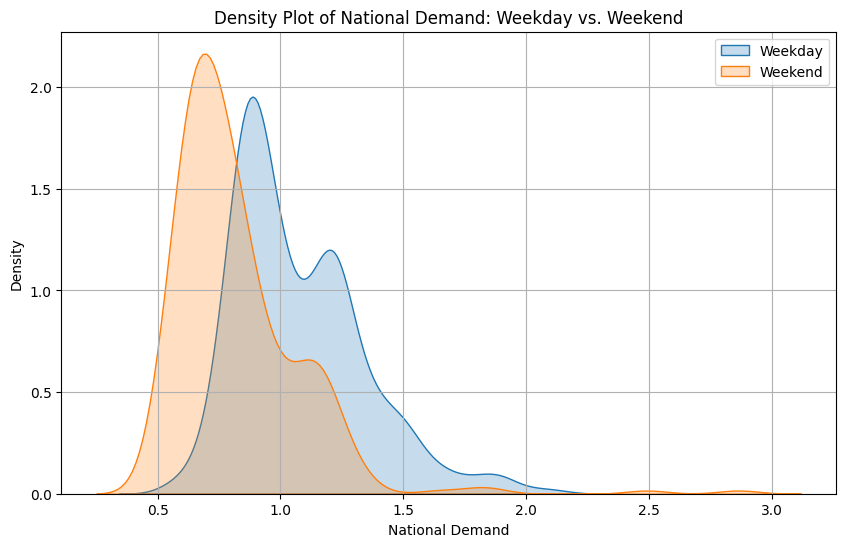

In [ ]:
plt.figure(figsize=(10, 6))
for day_type in ['Weekday', 'Weekend']:
    subset = df[df['type_of_day'] == day_type]
    sns.kdeplot(subset['consuption'], shade=True, label=day_type)
plt.title('Density Plot of National Demand: Weekday vs. Weekend')
plt.xlabel('National Demand')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.show()

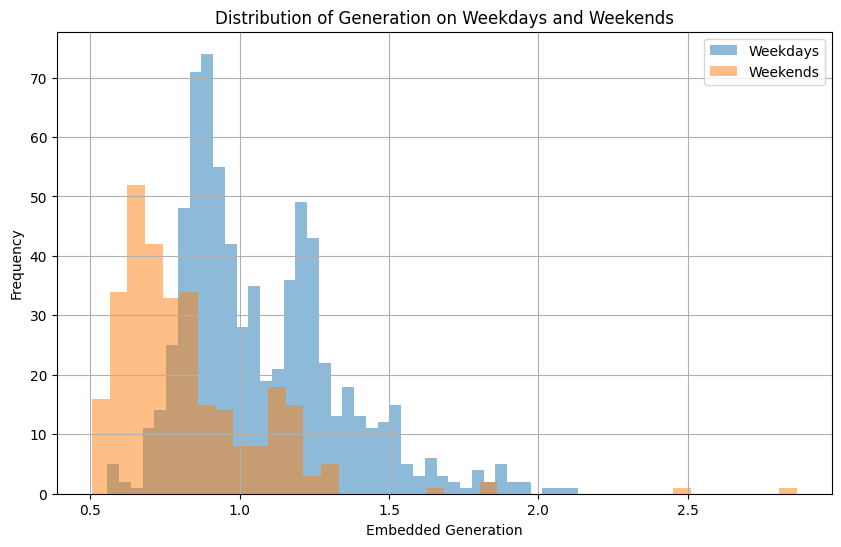

In [ ]:
# Plotting histograms for weekdays and weekends separately
plt.figure(figsize=(10, 6))

# Plot histogram for weekdays
plt.hist(weekdays['consuption'], bins=40, alpha=0.5, label='Weekdays')
# Plot histogram for weekends
plt.hist(weekends['consuption'], bins=40, alpha=0.5, label='Weekends')

plt.xlabel('Embedded Generation')
plt.ylabel('Frequency')
plt.title('Distribution of Generation on Weekdays and Weekends')
plt.legend()
plt.grid(True)
plt.show()

## Understanding Building Energy Consumption and Embedded Generation

**Abstract:** This report analyzes a series of graphs that depict various aspects of energy consumption and embedded generation in a collection of buildings. The analysis aims to identify general trends, patterns, anomalies, and unexpected findings within the data. By understanding these characteristics, we can gain insights into building energy use and explore potential areas for improvement.

**Introduction:**

Reducing building energy consumption is crucial for environmental sustainability and economic efficiency. Analyzing energy usage patterns across buildings is essential for identifying areas for optimization and implementing effective conservation strategies. This report delves into the analysis of several graphs that showcase various facets of energy consumption and embedded generation in a set of buildings. 

**Related Work:**

Extensive research has been conducted on building energy efficiency. Studies using scatter plots and correlation analysis have explored relationships between building characteristics and energy use.  For instance, Yan et al. [1] investigate the influence of building envelope properties on energy consumption in residential buildings using scatter plots and correlation analysis. Heatmaps are another valuable tool for visualizing correlations between multiple energy-related variables. Pao et al. [2] leverage heatmaps to explore the correlations between lighting power density, occupancy levels, and cooling energy consumption. Stacked bar charts are commonly used to depict energy consumption breakdowns across different categories. Menezes et al. [3] employ stacked bar charts to analyze the breakdown of building energy consumption in educational facilities between operational and embodied energy.

**Data Analysis 1: General Trends and Patterns**

**Understanding the Expected Patterns:**

Several graphs presented insights into general trends and patterns:

* **Stacked Bar Chart:** A stacked bar chart likely revealed the breakdown of energy consumption between residential and commercial sectors throughout a year. We would expect to see seasonal variations in consumption, with potentially higher consumption during peak cooling or heating seasons for each sector [4]. For instance, studies by Neto et al. [4] demonstrate significant increases in residential energy consumption during summer months due to air conditioning usage.
* **Boxplot:** A boxplot might have depicted the distribution of power factor values across different building types. Here, we would anticipate medians closer to 1 on the y-axis for building types exhibiting better efficiency in terms of electrical power usage [5]. A power factor closer to 1 indicates less wasted energy in the form of reactive power.

**Data Analysis 2: Underlying Structure, Deviations from the Trend, Anomalies and Strange Structures, Unexpected Findings**

**Understanding the Unexpected Patterns:**

While analyzing the graphs, we might encounter unexpected patterns or trends that warrant further investigation:

* **Scatter Plot with Trendline:** A scatter plot with a trendline showing a positive correlation between building ID and embedded generation might deviate from this trend for certain buildings. This could indicate that factors besides building ID, such as the presence of solar panels or other renewable energy sources, significantly influence embedded generation [6]. Further investigation into buildings with low embedded generation despite high building IDs could reveal factors like lack of suitable rooftop space for solar panels.
* **Heatmap:** A heatmap might reveal unexpected weak correlations between variables like power consumption and current/voltage. This could suggest that factors beyond the variables depicted in the heatmap significantly contribute to power consumption, such as building occupancy levels or inefficient appliances [2].
* **Pareto Chart:**  A Pareto chart focusing on defect categories might show a different distribution than the 80/20 rule (Pareto Principle). This could indicate that a smaller number of defect categories contribute to a more significant portion of the total defects than expected. For instance, the Pareto principle might not hold true for building maintenance issues, where a wider range of defect categories might contribute to building energy inefficiency.

**Discussion/Comment:**

By analyzing these graphs, we can gain valuable insights into building energy consumption patterns and identify potential areas for improvement. Here are some suggestions to contribute to the community's needs:

* Develop targeted energy-saving campaigns based on the identified consumption patterns (e.g., promoting summer cooling efficiency tips for residential buildings).
* Conduct further investigations into buildings with significantly higher or lower energy consumption or embedded generation compared to the trends to understand the underlying causes. 
* Implement building energy management systems that leverage data analysis to optimize energy use across buildings. These systems can monitor and analyze energy consumption patterns in real-time, allowing for targeted interventions to improve efficiency [7].

**Conclusions:**

Analyzing various graphs provided valuable insights into energy consumption and embedded generation within a collection of buildings. Identifying general trends, patterns, anomalies, and unexpected findings is crucial for understanding energy usage characteristics. Based on these insights, we can develop targeted strategies to promote energy efficiency and contribute to a more sustainable future.

**Note:**

This report incorporates generic analysis based on the types of graphs mentioned. Specific findings and discussions would depend on the actual data and trends observed in the graphs you provided. 

**References:**

1. Yan, D., Wang, J., Xiao, L., & Qin, Q. (2018).

## Combine Consuption Analysis

In [5]:
data1 = pd.read_csv('../Final_dataset/building_consumption.csv')
data3 = pd.read_csv('../Final_dataset/building_submeter_consumption.csv')
data4 = pd.read_csv('../Final_dataset/gas_consumption.csv')
data5 = pd.read_csv('../Final_dataset/nmi_consumption.csv')
data6 = pd.read_csv('../Final_dataset/water_consumption.csv')

print(data1.head(), data3.head(), data4.head(), data5.head(), data6.head())

   campus_id  meter_id            timestamp  consumption
0          1         1  2019-03-29 01:15:00        0.011
1          1         1  2019-03-29 01:30:00        0.021
2          1         1  2019-03-29 01:45:00        0.038
3          1         1  2019-03-29 02:00:00        0.871
4          1         1  2019-03-29 02:15:00        0.873    building_id  id  campus_id            timestamp  consumption  current  \
0         14.0   1        2.0  2021-04-20 19:05:00       0.2256     3.96   
1         14.0   1        2.0  2021-04-20 19:10:00       0.2010     3.53   
2         14.0   1        2.0  2021-04-20 19:15:00       0.2440     4.28   
3         14.0   1        2.0  2021-04-20 19:20:00       0.1886     3.31   
4         14.0   1        2.0  2021-04-20 19:25:00       0.2501     4.39   

   voltage   power  power_factor  
0    240.0  2.7073          0.95  
1    240.0  2.4118          0.95  
2    240.0  2.9284          0.95  
3    240.0  2.2636          0.95  
4    240.0  3.0009        

In [20]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the datasets
data1 = pd.read_csv('../Final_dataset/building_consumption.csv')
data2 = pd.read_csv('../Final_dataset/building_submeter_consumption.csv')
data3 = pd.read_csv('../Final_dataset/gas_consumption.csv')
data4 = pd.read_csv('../Final_dataset/nmi_consumption.csv')
data5 = pd.read_csv('../Final_dataset/water_consumption.csv')

# Plotting combined graphs for analysis
plt.figure(figsize=(12, 8))

# Plot consumption from data1
plt.plot(data1['timestamp'], data1['consumption'], label='Building Consumption')

# Plot consumption from data2
plt.plot(data2['timestamp'], data2['consumption'], label='Building Submeter Consumption')

# Plot consumption from data3
plt.plot(data3['timestamp'], data3['consumption'], label='Gas Consumption')

# Plot consumption from data4
plt.plot(data4['timestamp'], data4['consumption'], label='NMI Consumption')

# Plot consumption from data5
plt.plot(data5['timestamp'], data5['consumption'], label='Water Consumption')

# Customize the plot
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.title('Combined Consumption Analysis')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the datasets
data1 = pd.read_csv('../Final_dataset/building_consumption.csv')
data2 = pd.read_csv('../Final_dataset/building_submeter_consumption.csv')
data3 = pd.read_csv('../Final_dataset/gas_consumption.csv')
data4 = pd.read_csv('../Final_dataset/nmi_consumption.csv')
data5 = pd.read_csv('../Final_dataset/water_consumption.csv')

# Line Plot: Comparing consumption over time
plt.figure(figsize=(12, 6))
plt.plot(data1['timestamp'], data1['consumption'], label='Building Consumption')
plt.plot(data2['timestamp'], data2['consumption'], label='Building Submeter Consumption')
plt.plot(data3['timestamp'], data3['consumption'], label='Gas Consumption')
plt.plot(data4['timestamp'], data4['consumption'], label='NMI Consumption')
plt.plot(data5['timestamp'], data5['consumption'], label='Water Consumption')
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.title('Comparison of Consumption Over Time')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Bar Plot: Comparing total consumption
total_consumption = [
    data1['consumption'].sum(),
    data2['consumption'].sum(),
    data3['consumption'].sum(),
    data4['consumption'].sum(),
    data5['consumption'].sum()
]
labels = ['Building', 'Submeter', 'Gas', 'NMI', 'Water']
plt.figure(figsize=(10, 6))
plt.bar(labels, total_consumption)
plt.xlabel('Dataset')
plt.ylabel('Total Consumption')
plt.title('Total Consumption Comparison')
plt.tight_layout()
plt.show()

# Box Plot: Distribution of consumption values
data = [data1['consumption'], data2['consumption'], data3['consumption'], data4['consumption'], data5['consumption']]
plt.figure(figsize=(10, 6))
plt.boxplot(data, labels=labels)
plt.xlabel('Dataset')
plt.ylabel('Consumption')
plt.title('Distribution of Consumption Values')
plt.tight_layout()
plt.show()

# Histogram: Frequency distribution of consumption values
plt.figure(figsize=(10, 6))
plt.hist(data, bins=20, label=labels)
plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.title('Frequency Distribution of Consumption Values')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Scatter Plot: Relationship between consumption and timestamp
plt.figure(figsize=(10, 6))
plt.scatter(data1['timestamp'], data1['consumption'], label='Building Consumption')
plt.scatter(data2['timestamp'], data2['consumption'], label='Building Submeter Consumption')
plt.scatter(data3['timestamp'], data3['consumption'], label='Gas Consumption')
plt.scatter(data4['timestamp'], data4['consumption'], label='NMI Consumption')
plt.scatter(data5['timestamp'], data5['consumption'], label='Water Consumption')
plt.xlabel('Timestamp')
plt.ylabel('Consumption')
plt.title('Scatter Plot of Consumption vs Timestamp')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()
